## Import packages 

In [1]:
# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import nltk, re, pprint
from nltk import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
nltk.download('wordnet')
from nltk.stem.wordnet import WordNetLemmatizer
import sys
% matplotlib inline
import matplotlib.pyplot as plt
import gensim
#sys.setdefaultencoding("utf-8")

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Curri\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## Create list of stopwords from custom list and built-in library

In [43]:
from nltk.corpus import stopwords
ENGLISH_STOP_WORDS = set(stopwords.words('english'))
random_words = ["miss", "mr", "mrs", "said", "jr", "ms"]
nytimes_words = ["photo", "nytimes", "nytoday", "com", "www"]
custom_words = "___ saying hours put thought doe lot might need question every told pareles news im people like new thats le soho robert often chelsea fifth going scott john michael el time think saturday _____ briefing brantley bird rd give bleecker though nearly los bay dr side downtown theyre miller williams thcentury didnt dont central wife posted eastern want email red hook try take long summer winter minute long ago hour stories weekdays sundays rundown latest look sign let convention week american year say house york make know day late comedy host cbs report character guest night admission admissions charge fee johnson petrusich smith ratliff jersey staten chris daily manhattan wilson bronx cover reservations reservation dunning tickets tonight broadway chinen meeting japanese moses sponsored island information state united bowery little last also life much each two many tomorrow free org th minimum little Sonneh feet street man st door play one would years get even could way back around avenue streets says go really made something still got came come right always sanneh percent nd near co la sisario go says east village advance clinton san hes cotter made wa ha harlem de west thing sold another still around called things city see well beach men women woman man"
month_time_dayofweek = "january february march april may june july august september october november december sunday monday tuesday wednesday thursday friday morning noon night weekday weekend evening mondays tuesdays wednesdays thursdays fridays saturdays sundays jan feb mar aprl jun jul aug sep oct nov dec mon tues weds thurs fri sat sun pm month"
numbers_list = ["one", "two", "three", "four", "five", "six", "seven", "eight", "nine", "ten"]
custom_words_list = custom_words.split()
month_time_day_list = month_time_dayofweek.split()

STOPLIST = set(stopwords.words('english') + random_words + numbers_list + list(month_time_day_list) + list(ENGLISH_STOP_WORDS) + nytimes_words + custom_words_list)
STOPLIST = list(STOPLIST)

##  Create dataframe, taking each corpus document and appending it to a column called "Contents"
**Note: each article was saved as an individual txt document with the date and URL in the file name 

In [28]:
path = 'corpus\\counter_factual\\final_corpus_counterfactual'
print os.getcwd()
myfolder = os.listdir(path)
myfolder.reverse()
articles = []

slash = '\\'


for filename in myfolder:
    if filename.endswith('.txt'):
        print(filename)
        date = filename[0:10]
        fullpath = "\\\\?\\" + os.getcwd() + slash +path + slash + filename
        fullpath = fullpath.decode("utf-8")
        print(fullpath)
        with open( fullpath) as fh:
            contents = fh.read()
            articles.append([contents, date])
            
raw = pd.DataFrame(articles, columns=['Contents','Date'])


C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project
2010-12-31https___www.nytimes.com_2010_12_31_us_31bccoda.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-12-31https___www.nytimes.com_2010_12_31_us_31bccoda.html.txt
2010-12-31https___www.nytimes.com_2010_12_31_nyregion_31call.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-12-31https___www.nytimes.com_2010_12_31_nyregion_31call.html.txt
2010-12-31https___www.nytimes.com_2010_12_31_arts_music_31pop.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-12-31https___www.nytimes.com_2010_12_31_arts_music_31pop.html.txt
2010-12-31https___www.nytimes.com_2010_12_31_arts_design_31art.html.txt
\\?\C:\Users\Curri\OneDrive\Docum

2010-12-19https___www.nytimes.com_2010_12_19_magazine_19Urban_West-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-12-19https___www.nytimes.com_2010_12_19_magazine_19Urban_West-t.html.txt
2010-12-19https___www.nytimes.com_2010_12_19_magazine_19Ideas.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-12-19https___www.nytimes.com_2010_12_19_magazine_19Ideas.html.txt
2010-12-19https___www.nytimes.com_2010_12_19_fashion_19POSSESSED.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-12-19https___www.nytimes.com_2010_12_19_fashion_19POSSESSED.html.txt
2010-12-19https___www.nytimes.com_2010_12_19_business_19corner.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Proje

2010-12-13https___www.legacy.com_Link.asp_I=LS000147108202.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-12-13https___www.legacy.com_Link.asp_I=LS000147108202.txt
2010-12-13https___well.blogs.nytimes.com_2010_12_13_the-elusive-smoke-free-home_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-12-13https___well.blogs.nytimes.com_2010_12_13_the-elusive-smoke-free-home_.txt
2010-12-13https___tmagazine.blogs.nytimes.com_2010_12_13_eurostars-experimental-cocktail-club-london_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-12-13https___tmagazine.blogs.nytimes.com_2010_12_13_eurostars-experimental-cocktail-club-london_.txt
2010-12-13https___query.nytimes.com_gst_fullpage.html_res=9800E0DA153AF930A25751C1A9669D8B

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-12-03https___www.nytimes.com_2010_12_03_arts_design_03art.html.txt
2010-12-03https___www.nytimes.com_2010_12_03_arts_03spare.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-12-03https___www.nytimes.com_2010_12_03_arts_03spare.html.txt
2010-12-03https___cityroom.blogs.nytimes.com_2010_12_03_legal-aid-society-names-richard-j-davis-chairman_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-12-03https___cityroom.blogs.nytimes.com_2010_12_03_legal-aid-society-names-richard-j-davis-chairman_.txt
2010-12-02https___www.nytimes.com_2010_12_02_movies_02sundance-backf-cul-54-18.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\c

2010-11-26https___www.nytimes.com_2010_11_26_arts_design_26art.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-11-26https___www.nytimes.com_2010_11_26_arts_design_26art.html.txt
2010-11-26https___www.nytimes.com_2010_11_26_arts_26spare.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-11-26https___www.nytimes.com_2010_11_26_arts_26spare.html.txt
2010-11-26https___www.nytimes.com_2010_11_26_arts_26kids.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-11-26https___www.nytimes.com_2010_11_26_arts_26kids.html.txt
2010-11-26https___query.nytimes.com_gst_fullpage.html_res=9902E1DC103EF935A15752C1A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\c

2010-11-19https___www.nytimes.com_2010_11_19_nyregion_19bowlmor.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-11-19https___www.nytimes.com_2010_11_19_nyregion_19bowlmor.html.txt
2010-11-19https___www.nytimes.com_2010_11_19_dining_19critic.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-11-19https___www.nytimes.com_2010_11_19_dining_19critic.html.txt
2010-11-19https___www.nytimes.com_2010_11_19_arts_design_19art.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-11-19https___www.nytimes.com_2010_11_19_arts_design_19art.html.txt
2010-11-19https___www.nytimes.com_2010_11_19_arts_dance_19dance.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\count

2010-11-11https___www.nytimes.com_2010_11_11_giving_11CAMP.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-11-11https___www.nytimes.com_2010_11_11_giving_11CAMP.html.txt
2010-11-11https___www.nytimes.com_2010_11_11_business_media_11adco.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-11-11https___www.nytimes.com_2010_11_11_business_media_11adco.html.txt
2010-11-11https___www.nytimes.com_2010_11_11_business_global_11gap.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-11-11https___www.nytimes.com_2010_11_11_business_global_11gap.html.txt
2010-11-11https___www.nytimes.com_2010_11_11_books_11agent.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\

2010-11-04https___www.nytimes.com_2010_11_07_travel_07privateisland.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-11-04https___www.nytimes.com_2010_11_07_travel_07privateisland.html.txt
2010-11-04https___www.nytimes.com_2010_11_04_sports_baseball_04parade.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-11-04https___www.nytimes.com_2010_11_04_sports_baseball_04parade.html.txt
2010-11-04https___www.nytimes.com_2010_11_04_nyregion_04grades.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-11-04https___www.nytimes.com_2010_11_04_nyregion_04grades.html.txt
2010-11-04https___www.nytimes.com_2010_11_04_fashion_04scene.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Gro

2010-10-30https___query.nytimes.com_gst_fullpage.html_res=9C0DE0D91739F933A05753C1A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-10-30https___query.nytimes.com_gst_fullpage.html_res=9C0DE0D91739F933A05753C1A9669D8B63.txt
2010-10-29https___www.nytimes.com_2010_10_29_arts_design_29morgan.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-10-29https___www.nytimes.com_2010_10_29_arts_design_29morgan.html.txt
2010-10-29https___www.nytimes.com_2010_10_29_arts_design_29art.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-10-29https___www.nytimes.com_2010_10_29_arts_design_29art.html.txt
2010-10-29https___www.nytimes.com_2010_10_29_arts_29kids.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2

2010-10-25https___www.nytimes.com_2010_10_25_arts_music_25cmj.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-10-25https___www.nytimes.com_2010_10_25_arts_music_25cmj.html.txt
2010-10-25https___dinersjournal.blogs.nytimes.com_2010_10_25_hey-mr-critic-16_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-10-25https___dinersjournal.blogs.nytimes.com_2010_10_25_hey-mr-critic-16_.txt
2010-10-25https___cityroom.blogs.nytimes.com_2010_10_25_well-dressed-men-pink-panthers-and-paris-on-hudson_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-10-25https___cityroom.blogs.nytimes.com_2010_10_25_well-dressed-men-pink-panthers-and-paris-on-hudson_.txt
2010-10-24https___www.nytimes.com_2010_10_24_travel_24hours.html.t

2010-10-19https___dinersjournal.blogs.nytimes.com_2010_10_19_eataly-waiting-for-supermarkets_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-10-19https___dinersjournal.blogs.nytimes.com_2010_10_19_eataly-waiting-for-supermarkets_.txt
2010-10-18https___www.nytimes.com_2010_10_18_us_18poverty.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-10-18https___www.nytimes.com_2010_10_18_us_18poverty.html.txt
2010-10-18https___www.nytimes.com_2010_10_18_sports_hockey_18hockey.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-10-18https___www.nytimes.com_2010_10_18_sports_hockey_18hockey.html.txt
2010-10-18https___query.nytimes.com_gst_fullpage.html_res=990CE1D9163AF93BA25753C1A9669D8B63.txt
\\?\C:\Users\Curr

2010-10-14https___cityroom.blogs.nytimes.com_2010_10_14_seeing-what-self-anointed-sainthood-looks-like_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-10-14https___cityroom.blogs.nytimes.com_2010_10_14_seeing-what-self-anointed-sainthood-looks-like_.txt
2010-10-14https___cityroom.blogs.nytimes.com_2010_10_14_planning-for-an-attack-and-arguing-over-the-fifth-man_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-10-14https___cityroom.blogs.nytimes.com_2010_10_14_planning-for-an-attack-and-arguing-over-the-fifth-man_.txt
2010-10-14https___cityroom.blogs.nytimes.com_2010_10_14_objects-indentified-men-aliens-and-narcissism-edition_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-10-14https___cityroom.blogs.nyti

2010-10-10https___www.nytimes.com_2010_10_10_arts_10weekaheadweb.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-10-10https___www.nytimes.com_2010_10_10_arts_10weekaheadweb.html.txt
2010-10-10https___query.nytimes.com_gst_fullpage.html_res=9E04E2DD163AF933A25753C1A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-10-10https___query.nytimes.com_gst_fullpage.html_res=9E04E2DD163AF933A25753C1A9669D8B63.txt
2010-10-10https___query.nytimes.com_gst_fullpage.html_res=9902EEDB103AF933A25753C1A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-10-10https___query.nytimes.com_gst_fullpage.html_res=9902EEDB103AF933A25753C1A9669D8B63.txt
2010-10-09https___www.nytimes.com_2010_10_10_nyregion_10geller

2010-10-04https___cityroom.blogs.nytimes.com_2010_10_04_answers-about-world-war-ii-in-new-york-part-iii_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-10-04https___cityroom.blogs.nytimes.com_2010_10_04_answers-about-world-war-ii-in-new-york-part-iii_.txt
2010-10-03https___www.nytimes.com_2010_10_03_travel_03Israel.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-10-03https___www.nytimes.com_2010_10_03_travel_03Israel.html.txt
2010-10-03https___www.nytimes.com_2010_10_03_realestate_03living.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-10-03https___www.nytimes.com_2010_10_03_realestate_03living.html.txt
2010-10-03https___www.nytimes.com_2010_10_03_realestate_03habi.html.txt
\\?\C:\Users\Curri\O

2010-09-23https___www.nytimes.com_2010_09_23_arts_music_23sanchez.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-09-23https___www.nytimes.com_2010_09_23_arts_music_23sanchez.html.txt
2010-09-23https___dealbook.nytimes.com_2010_09_23_the-fallout-from-blockbusters-bankruptcy_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-09-23https___dealbook.nytimes.com_2010_09_23_the-fallout-from-blockbusters-bankruptcy_.txt
2010-09-22https___www.nytimes.com_2010_09_22_realestate_22bam.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-09-22https___www.nytimes.com_2010_09_22_realestate_22bam.html.txt
2010-09-22https___dealbook.nytimes.com_2010_09_22_2-get-prison-for-complex-mortgage-scam-in-n-y_.txt
\\?\C:\Users\

2010-09-15https___www.nytimes.com_2010_09_15_us_politics_15guns.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-09-15https___www.nytimes.com_2010_09_15_us_politics_15guns.html.txt
2010-09-15https___www.nytimes.com_2010_09_15_dining_15torrisi.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-09-15https___www.nytimes.com_2010_09_15_dining_15torrisi.html.txt
2010-09-15https___www.nytimes.com_2010_09_15_arts_music_15jayz.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-09-15https___www.nytimes.com_2010_09_15_arts_music_15jayz.html.txt
2010-09-14https___www.nytimes.com_2010_09_14_science_14atom.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter

2010-09-05https___www.nytimes.com_2010_09_05_realestate_05cov.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-09-05https___www.nytimes.com_2010_09_05_realestate_05cov.html.txt
2010-09-05https___www.nytimes.com_2010_09_05_opinion_05sun3.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-09-05https___www.nytimes.com_2010_09_05_opinion_05sun3.html.txt
2010-09-05https___www.nytimes.com_2010_09_05_nyregion_05zero.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-09-05https___www.nytimes.com_2010_09_05_nyregion_05zero.html.txt
2010-09-05https___www.nytimes.com_2010_09_05_nyregion_05listingswe.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_fact

2010-08-29https___www.nytimes.com_2010_08_30_arts_music_30rock.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-08-29https___www.nytimes.com_2010_08_30_arts_music_30rock.html.txt
2010-08-29https___www.nytimes.com_2010_08_29_travel_29hours.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-08-29https___www.nytimes.com_2010_08_29_travel_29hours.html.txt
2010-08-29https___www.nytimes.com_2010_08_29_travel_29Fairs.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-08-29https___www.nytimes.com_2010_08_29_travel_29Fairs.html.txt
2010-08-29https___www.nytimes.com_2010_08_29_sports_29otb.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final

2010-08-20https___www.nytimes.com_2010_08_20_travel_20coaster.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-08-20https___www.nytimes.com_2010_08_20_travel_20coaster.html.txt
2010-08-20https___www.nytimes.com_2010_08_20_opinion_20tough.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-08-20https___www.nytimes.com_2010_08_20_opinion_20tough.html.txt
2010-08-20https___www.nytimes.com_2010_08_20_arts_music_20pop.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-08-20https___www.nytimes.com_2010_08_20_arts_music_20pop.html.txt
2010-08-20https___www.nytimes.com_2010_08_20_arts_design_20art.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_fact

2010-08-13https___www.nytimes.com_2010_08_13_arts_13kids.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-08-13https___www.nytimes.com_2010_08_13_arts_13kids.html.txt
2010-08-13https___artsbeat.blogs.nytimes.com_2010_08_13_governors-island-a-critics-roundtable_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-08-13https___artsbeat.blogs.nytimes.com_2010_08_13_governors-island-a-critics-roundtable_.txt
2010-08-12https___www.nytimes.com_2010_08_12_fashion_12scouting.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-08-12https___www.nytimes.com_2010_08_12_fashion_12scouting.html.txt
2010-08-12https___www.nytimes.com_2010_08_12_fashion_12pedicure.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\A

2010-08-03https___cityroom.blogs.nytimes.com_2010_08_03_words-to-live-by-on-the-shore-and-everywhere_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-08-03https___cityroom.blogs.nytimes.com_2010_08_03_words-to-live-by-on-the-shore-and-everywhere_.txt
2010-08-02https___www.nytimes.com_2010_08_02_arts_music_02gories.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-08-02https___www.nytimes.com_2010_08_02_arts_music_02gories.html.txt
2010-08-02https___learning.blogs.nytimes.com_2010_08_02_teaching-shakespeare-with-the-new-york-times_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-08-02https___learning.blogs.nytimes.com_2010_08_02_teaching-shakespeare-with-the-new-york-times_.txt
2010-08-02https___dealbook

2010-07-23https___www.nytimes.com_2010_07_23_arts_dance_23dance.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-07-23https___www.nytimes.com_2010_07_23_arts_dance_23dance.html.txt
2010-07-23https___www.nytimes.com_2010_07_23_arts_23spare.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-07-23https___www.nytimes.com_2010_07_23_arts_23spare.html.txt
2010-07-23https___www.nytimes.com_2010_07_23_arts_23Kids.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-07-23https___www.nytimes.com_2010_07_23_arts_23Kids.html.txt
2010-07-23https___cityroom.blogs.nytimes.com_2010_07_23_mad-men-city-answers-from-a-real-mad-man-part-3_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Pr

2010-07-18https___www.nytimes.com_2010_07_18_nyregion_18nineb.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-07-18https___www.nytimes.com_2010_07_18_nyregion_18nineb.html.txt
2010-07-18https___www.nytimes.com_2010_07_18_nyregion_18listingsct.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-07-18https___www.nytimes.com_2010_07_18_nyregion_18listingsct.html.txt
2010-07-18https___www.nytimes.com_2010_07_18_nyregion_18critic.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-07-18https___www.nytimes.com_2010_07_18_nyregion_18critic.html.txt
2010-07-18https___query.nytimes.com_gst_fullpage.html_res=9A0DE4DF1139F93BA25754C0A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Sc

2010-07-07https___www.nytimes.com_2010_07_07_nyregion_07heat.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-07-07https___www.nytimes.com_2010_07_07_nyregion_07heat.html.txt
2010-07-07https___www.nytimes.com_2010_07_07_nyregion_07durst.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-07-07https___www.nytimes.com_2010_07_07_nyregion_07durst.html.txt
2010-07-07https___www.nytimes.com_2010_07_07_dining_07tavern.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-07-07https___www.nytimes.com_2010_07_07_dining_07tavern.html.txt
2010-07-07https___www.nytimes.com_2010_07_07_business_economy_07leonhardt.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\cou

2010-06-26https___goal.blogs.nytimes.com_2010_06_26_world-cup-live-united-states-vs-ghana_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-06-26https___goal.blogs.nytimes.com_2010_06_26_world-cup-live-united-states-vs-ghana_.txt
2010-06-25https___www.nytimes.com_2010_06_25_theater_x25theater.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-06-25https___www.nytimes.com_2010_06_25_theater_x25theater.html.txt
2010-06-25https___www.nytimes.com_2010_06_25_science_25voice.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-06-25https___www.nytimes.com_2010_06_25_science_25voice.html.txt
2010-06-25https___www.nytimes.com_2010_06_25_business_25walmart.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\A

2010-06-16https___intransit.blogs.nytimes.com_2010_06_16_travel-planning-ask-your-friends_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-06-16https___intransit.blogs.nytimes.com_2010_06_16_travel-planning-ask-your-friends_.txt
2010-06-15https___www.nytimes.com_2010_06_16_arts_television_16beekman.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-06-15https___www.nytimes.com_2010_06_16_arts_television_16beekman.html.txt
2010-06-15https___www.nytimes.com_2010_06_15_arts_dance_15neal.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-06-15https___www.nytimes.com_2010_06_15_arts_dance_15neal.html.txt
2010-06-15https___wheels.blogs.nytimes.com_2010_06_15_largest-private-car-collection-closer-to-getting-a

2010-06-08https___cityroom.blogs.nytimes.com_2010_06_08_appearances-mean-nothing-or-everything_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-06-08https___cityroom.blogs.nytimes.com_2010_06_08_appearances-mean-nothing-or-everything_.txt
2010-06-07https___www.nytimes.com_2010_06_07_nyregion_07lasher.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-06-07https___www.nytimes.com_2010_06_07_nyregion_07lasher.html.txt
2010-06-07https___www.nytimes.com_2010_06_07_business_media_07adnewsletter3.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-06-07https___www.nytimes.com_2010_06_07_business_media_07adnewsletter3.html.txt
2010-06-07https___query.nytimes.com_gst_fullpage.html_res=9C02E7D81330F934A35755C0A9

2010-05-30https___www.nytimes.com_2010_05_30_fashion_weddings_30MAGGE.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-05-30https___www.nytimes.com_2010_05_30_fashion_weddings_30MAGGE.html.txt
2010-05-30https___www.nytimes.com_2010_05_30_fashion_30noticed.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-05-30https___www.nytimes.com_2010_05_30_fashion_30noticed.html.txt
2010-05-30https___www.nytimes.com_2010_05_30_business_30barry.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-05-30https___www.nytimes.com_2010_05_30_business_30barry.html.txt
2010-05-30https___www.nytimes.com_2010_05_30_books_review_Nicholson-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_

2010-05-25https___thelede.blogs.nytimes.com_2010_05_25_following-jamaicas-state-of-emergency-online_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-05-25https___thelede.blogs.nytimes.com_2010_05_25_following-jamaicas-state-of-emergency-online_.txt
2010-05-24https___www.nytimes.com_2010_05_24_nyregion_24towns.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-05-24https___www.nytimes.com_2010_05_24_nyregion_24towns.html.txt
2010-05-24https___dinersjournal.blogs.nytimes.com_2010_05_24_labor-talks-remain-key-to-taverns-future_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-05-24https___dinersjournal.blogs.nytimes.com_2010_05_24_labor-talks-remain-key-to-taverns-future_.txt
2010-05-24https___cityroom.blogs

2010-05-16https___www.nytimes.com_2010_05_16_nyregion_16listingswe-web.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-05-16https___www.nytimes.com_2010_05_16_nyregion_16listingswe-web.html.txt
2010-05-16https___www.nytimes.com_2010_05_16_fashion_weddings_16VOWS.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-05-16https___www.nytimes.com_2010_05_16_fashion_weddings_16VOWS.html.txt
2010-05-16https___www.nytimes.com_2010_05_16_automobiles_16BIKE.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-05-16https___www.nytimes.com_2010_05_16_automobiles_16BIKE.html.txt
2010-05-16https___query.nytimes.com_gst_fullpage.html_res=9D01E6DE153DF935A25756C0A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\F

2010-05-10https___www.nytimes.com_2010_05_10_business_media_10audio.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-05-10https___www.nytimes.com_2010_05_10_business_media_10audio.html.txt
2010-05-10https___query.nytimes.com_gst_fullpage.html_res=9F0DEFD81638F933A25756C0A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-05-10https___query.nytimes.com_gst_fullpage.html_res=9F0DEFD81638F933A25756C0A9669D8B63.txt
2010-05-10https___boss.blogs.nytimes.com_2010_05_10_here-comes-the-recovery_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-05-10https___boss.blogs.nytimes.com_2010_05_10_here-comes-the-recovery_.txt
2010-05-09https___www.nytimes.com_2010_05_09_weekinreview_09carr.html.txt
\\?\C:\Users\C

2010-05-06https___www.nytimes.com_2010_05_06_business_06APPS.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-05-06https___www.nytimes.com_2010_05_06_business_06APPS.html.txt
2010-05-06https___www.nytimes.com_2010_05_06_arts_design_06building.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-05-06https___www.nytimes.com_2010_05_06_arts_design_06building.html.txt
2010-05-06https___learning.blogs.nytimes.com_2010_05_06_going-viral-creating-dance-videos-across-the-curriculum_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-05-06https___learning.blogs.nytimes.com_2010_05_06_going-viral-creating-dance-videos-across-the-curriculum_.txt
2010-05-06https___cityroom.blogs.nytimes.com_2010_05_06_pastor-returns

2010-04-30https___www.nytimes.com_2010_04_30_theater_30theater.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-04-30https___www.nytimes.com_2010_04_30_theater_30theater.html.txt
2010-04-30https___www.nytimes.com_2010_04_30_arts_music_30insane.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-04-30https___www.nytimes.com_2010_04_30_arts_music_30insane.html.txt
2010-04-30https___www.legacy.com_Link.asp_I=LS000142353220.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-04-30https___www.legacy.com_Link.asp_I=LS000142353220.txt
2010-04-30https___query.nytimes.com_gst_fullpage.html_res=9B05E6DE173AF933A05757C0A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\

2010-04-25https___query.nytimes.com_gst_fullpage.html_res=9A05E1D9143CF936A15757C0A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-04-25https___query.nytimes.com_gst_fullpage.html_res=9A05E1D9143CF936A15757C0A9669D8B63.txt
2010-04-24https___www.nytimes.com_2010_04_25_nyregion_25about.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-04-24https___www.nytimes.com_2010_04_25_nyregion_25about.html.txt
2010-04-24https___www.nytimes.com_2010_04_24_your-money_24money.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-04-24https___www.nytimes.com_2010_04_24_your-money_24money.html.txt
2010-04-24https___query.nytimes.com_gst_fullpage.html_res=9E00E1DB1430F937A15757C0A9669D8B63.txt
\\?\C:\Users\Curri\

2010-04-19https___www.nytimes.com_2010_04_19_books_19harding.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-04-19https___www.nytimes.com_2010_04_19_books_19harding.html.txt
2010-04-19https___roomfordebate.blogs.nytimes.com_2010_04_19_making-it-easier-to-eat-local-food_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-04-19https___roomfordebate.blogs.nytimes.com_2010_04_19_making-it-easier-to-eat-local-food_.txt
2010-04-19https___query.nytimes.com_gst_fullpage.html_res=9B07EFD9123EF93AA25757C0A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-04-19https___query.nytimes.com_gst_fullpage.html_res=9B07EFD9123EF93AA25757C0A9669D8B63.txt
2010-04-19https___boss.blogs.nytimes.com_2010_04_19_staying-al

2010-04-16https___cityroom.blogs.nytimes.com_2010_04_16_answers-about-child-friendly-new-york-part-3_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-04-16https___cityroom.blogs.nytimes.com_2010_04_16_answers-about-child-friendly-new-york-part-3_.txt
2010-04-16https___bayarea.blogs.nytimes.com_2010_04_16_sampler-lawsuit-seeks-to-close-suede-nightclub-and-more-palm-fronds-for-oakland-elephants_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-04-16https___bayarea.blogs.nytimes.com_2010_04_16_sampler-lawsuit-seeks-to-close-suede-nightclub-and-more-palm-fronds-for-oakland-elephants_.txt
2010-04-16https___bayarea.blogs.nytimes.com_2010_04_16_charter-extension-for-stanfords-school-denied-and-highlights-from-fridays-bay-area-pages_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Gr

2010-04-11https___www.nytimes.com_2010_04_11_realestate_11Sqft.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-04-11https___www.nytimes.com_2010_04_11_realestate_11Sqft.html.txt
2010-04-11https___www.nytimes.com_2010_04_11_nyregion_11fugitive.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-04-11https___www.nytimes.com_2010_04_11_nyregion_11fugitive.html.txt
2010-04-11https___www.legacy.com_Link.asp_I=LS000141679087.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-04-11https___www.legacy.com_Link.asp_I=LS000141679087.txt
2010-04-11https___query.nytimes.com_gst_fullpage.html_res=9F0DE6DF163AF932A25757C0A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\

2010-04-06https___www.nytimes.com_2010_04_06_arts_music_06zwerin.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-04-06https___www.nytimes.com_2010_04_06_arts_music_06zwerin.html.txt
2010-04-06https___topics.blogs.nytimes.com_2010_04_06_words-we-love-too-much-4_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-04-06https___topics.blogs.nytimes.com_2010_04_06_words-we-love-too-much-4_.txt
2010-04-06https___query.nytimes.com_gst_fullpage.html_res=9C0CE1DB1E3AF935A35757C0A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-04-06https___query.nytimes.com_gst_fullpage.html_res=9C0CE1DB1E3AF935A35757C0A9669D8B63.txt
2010-04-06https___parenting.blogs.nytimes.com_2010_04_06_are-kid-friendly-foods-a-defeat

2010-03-29https___www.nytimes.com_2010_03_29_arts_music_29knitting.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-03-29https___www.nytimes.com_2010_03_29_arts_music_29knitting.html.txt
2010-03-28https___www.nytimes.com_2010_03_28_travel_28next-1.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-03-28https___www.nytimes.com_2010_03_28_travel_28next-1.html.txt
2010-03-28https___www.nytimes.com_2010_03_28_travel_28fishing.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-03-28https___www.nytimes.com_2010_03_28_travel_28fishing.html.txt
2010-03-28https___www.nytimes.com_2010_03_28_t-magazine_28well-australia.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project

2010-03-25https___tmagazine.blogs.nytimes.com_2010_03_25_canadian-bacon-plus-smoked-meat-in-toronto_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-03-25https___tmagazine.blogs.nytimes.com_2010_03_25_canadian-bacon-plus-smoked-meat-in-toronto_.txt
2010-03-25https___thequad.blogs.nytimes.com_2010_03_25_live-updates-from-the-n-c-a-a-tournaments-round-of-8_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-03-25https___thequad.blogs.nytimes.com_2010_03_25_live-updates-from-the-n-c-a-a-tournaments-round-of-8_.txt
2010-03-25https___cityroom.blogs.nytimes.com_2010_03_25_study-shows-building-boom-before-market-crashed_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-03-25https___cityroom.blogs.nytimes.com_2010_03_

2010-03-20https___www.nytimes.com_2010_03_20_business_energy-environment_20saudi.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-03-20https___www.nytimes.com_2010_03_20_business_energy-environment_20saudi.html.txt
2010-03-20https___thequad.blogs.nytimes.com_2010_03_20_live-updates-from-the-n-c-a-a-tournament-second-round_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-03-20https___thequad.blogs.nytimes.com_2010_03_20_live-updates-from-the-n-c-a-a-tournament-second-round_.txt
2010-03-20https___query.nytimes.com_gst_fullpage.html_res=9801EFDD1639F933A15750C0A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-03-20https___query.nytimes.com_gst_fullpage.html_res=9801EFDD1639F933A15750C0A9669D8B63.

2010-03-12https___www.nytimes.com_2010_03_12_arts_dance_12dance.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-03-12https___www.nytimes.com_2010_03_12_arts_dance_12dance.html.txt
2010-03-12https___www.nytimes.com_2010_03_12_arts_12kids.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-03-12https___www.nytimes.com_2010_03_12_arts_12kids.html.txt
2010-03-12https___roomfordebate.blogs.nytimes.com_2010_03_11_does-the-size-of-a-school-matter_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-03-12https___roomfordebate.blogs.nytimes.com_2010_03_11_does-the-size-of-a-school-matter_.txt
2010-03-12https___maplewood.blogs.nytimes.com_2010_03_12_exit-interview_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-20

2010-03-07https___www.nytimes.com_2010_03_07_arts_design_07lowbrow.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-03-07https___www.nytimes.com_2010_03_07_arts_design_07lowbrow.html.txt
2010-03-07https___query.nytimes.com_gst_fullpage.html_res=9B01E2DA153BF934A35750C0A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-03-07https___query.nytimes.com_gst_fullpage.html_res=9B01E2DA153BF934A35750C0A9669D8B63.txt
2010-03-07https___intransit.blogs.nytimes.com_2010_03_07_in-spring-hong-kong-festivals-bloom_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-03-07https___intransit.blogs.nytimes.com_2010_03_07_in-spring-hong-kong-festivals-bloom_.txt
2010-03-06https___www.nytimes.com_2010_03_07_technology_

2010-02-26https___query.nytimes.com_gst_fullpage.html_res=9903E5DC1731F935A15751C0A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-02-26https___query.nytimes.com_gst_fullpage.html_res=9903E5DC1731F935A15751C0A9669D8B63.txt
2010-02-26https___cityroom.blogs.nytimes.com_2010_02_26_new-yorkers-spill-your-secrets-on-facebook_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-02-26https___cityroom.blogs.nytimes.com_2010_02_26_new-yorkers-spill-your-secrets-on-facebook_.txt
2010-02-26https___cityroom.blogs.nytimes.com_2010_02_26_answers-from-chuck-scarborough-part-3_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-02-26https___cityroom.blogs.nytimes.com_2010_02_26_answers-from-chuck-scarborough-part-3_.tx

2010-02-19https___www.nytimes.com_2010_02_19_arts_dance_19dance.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-02-19https___www.nytimes.com_2010_02_19_arts_dance_19dance.html.txt
2010-02-19https___dinersjournal.blogs.nytimes.com_2010_02_19_an-island-cocktail-lounge-manhattan-island_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-02-19https___dinersjournal.blogs.nytimes.com_2010_02_19_an-island-cocktail-lounge-manhattan-island_.txt
2010-02-18https___www.nytimes.com_2010_02_18_nyregion_18reade.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-02-18https___www.nytimes.com_2010_02_18_nyregion_18reade.html.txt
2010-02-18https___www.nytimes.com_2010_02_18_business_18duane.html.txt
\\?\C:\Users\Curri\On

2010-02-09https___www.nytimes.com_2010_02_09_nyregion_09families.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-02-09https___www.nytimes.com_2010_02_09_nyregion_09families.html.txt
2010-02-09https___www.nytimes.com_2010_02_09_arts_dance_09sleeping.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-02-09https___www.nytimes.com_2010_02_09_arts_dance_09sleeping.html.txt
2010-02-09https___query.nytimes.com_gst_fullpage.html_res=9A0DE2D9123AF93AA35751C0A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-02-09https___query.nytimes.com_gst_fullpage.html_res=9A0DE2D9123AF93AA35751C0A9669D8B63.txt
2010-02-09https___economix.blogs.nytimes.com_2010_02_09_keeping-china-relatively-green_.txt
\\?\C:\Users

2010-02-06https___www.nytimes.com_2010_02_07_fashion_07campus.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-02-06https___www.nytimes.com_2010_02_07_fashion_07campus.html.txt
2010-02-06https___www.nytimes.com_2010_02_06_nyregion_06rockaway.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-02-06https___www.nytimes.com_2010_02_06_nyregion_06rockaway.html.txt
2010-02-06https___www.nytimes.com_2010_02_06_nyregion_06demolish.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-02-06https___www.nytimes.com_2010_02_06_nyregion_06demolish.html.txt
2010-02-05https___www.nytimes.com_2010_02_07_realestate_07living.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\cor

2010-01-31https___www.nytimes.com_2010_01_31_fashion_31jersey.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-01-31https___www.nytimes.com_2010_01_31_fashion_31jersey.html.txt
2010-01-31https___www.nytimes.com_2010_01_31_arts_television_31danes.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-01-31https___www.nytimes.com_2010_01_31_arts_television_31danes.html.txt
2010-01-31https___query.nytimes.com_gst_fullpage.html_res=9F0CE2DA1538F932A05752C0A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-01-31https___query.nytimes.com_gst_fullpage.html_res=9F0CE2DA1538F932A05752C0A9669D8B63.txt
2010-01-31https___query.nytimes.com_gst_fullpage.html_res=9E03E3DC103EF932A05752C0A9669D8B63.txt
\\?\C:\Us

2010-01-24https___query.nytimes.com_gst_fullpage.html_res=950DE2DB1E3FF937A15752C0A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-01-24https___query.nytimes.com_gst_fullpage.html_res=950DE2DB1E3FF937A15752C0A9669D8B63.txt
2010-01-24https___query.nytimes.com_gst_fullpage.html_res=9501EFDC1E38F937A15752C0A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-01-24https___query.nytimes.com_gst_fullpage.html_res=9501EFDC1E38F937A15752C0A9669D8B63.txt
2010-01-23https___www.nytimes.com_2010_01_23_sports_ncaabasketball_23dambrot.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-01-23https___www.nytimes.com_2010_01_23_sports_ncaabasketball_23dambrot.html.txt
2010-01-23https___www.nytimes.com_2010

2010-01-17https___www.nytimes.com_2010_01_17_magazine_17seghal-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-01-17https___www.nytimes.com_2010_01_17_magazine_17seghal-t.html.txt
2010-01-17https___www.nytimes.com_2010_01_17_magazine_17antiaging-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-01-17https___www.nytimes.com_2010_01_17_magazine_17antiaging-t.html.txt
2010-01-17https___www.nytimes.com_2010_01_17_fashion_17genb.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-01-17https___www.nytimes.com_2010_01_17_fashion_17genb.html.txt
2010-01-17https___www.nytimes.com_2010_01_17_business_17tish.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpu

2010-01-11https___www.nytimes.com_2010_01_11_business_11salt.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-01-11https___www.nytimes.com_2010_01_11_business_11salt.html.txt
2010-01-11https___query.nytimes.com_gst_fullpage.html_res=9401EFD61031F932A25752C0A9669D8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-01-11https___query.nytimes.com_gst_fullpage.html_res=9401EFD61031F932A25752C0A9669D8B63.txt
2010-01-11https___dealbook.nytimes.com_2010_01_11_us-bankers-are-fed-up-with-british-regulations_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-01-11https___dealbook.nytimes.com_2010_01_11_us-bankers-are-fed-up-with-british-regulations_.txt
2010-01-11https___cityroom.blogs.nytimes.com_2010_01_11_less

2010-01-04https___www.nytimes.com_2010_01_04_nyregion_04botanica.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-01-04https___www.nytimes.com_2010_01_04_nyregion_04botanica.html.txt
2010-01-04https___bits.blogs.nytimes.com_2010_01_04_1-on-1-jack-dorsey-of-twitter-and-square_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-01-04https___bits.blogs.nytimes.com_2010_01_04_1-on-1-jack-dorsey-of-twitter-and-square_.txt
2010-01-03https___www.nytimes.com_2010_01_03_travel_03ramadan.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2010-01-03https___www.nytimes.com_2010_01_03_travel_03ramadan.html.txt
2010-01-03https___www.nytimes.com_2010_01_03_travel_03next.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2

2009-12-31https___www.nytimes.com_2009_12_31_health_nutrition_31fitness.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-12-31https___www.nytimes.com_2009_12_31_health_nutrition_31fitness.html.txt
2009-12-31https___cityroom.blogs.nytimes.com_2009_12_31_answers-from-a-new-york-talent-buyer-part-2_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-12-31https___cityroom.blogs.nytimes.com_2009_12_31_answers-from-a-new-york-talent-buyer-part-2_.txt
2009-12-30https___www.nytimes.com_2009_12_30_dining_reviews_30year.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-12-30https___www.nytimes.com_2009_12_30_dining_reviews_30year.html.txt
2009-12-29https___www.nytimes.com_2009_12_29_us_29bombshell.html.txt
\\?\C

2009-12-23https___www.nytimes.com_2009_12_23_dining_23nduja.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-12-23https___www.nytimes.com_2009_12_23_dining_23nduja.html.txt
2009-12-23https___query.nytimes.com_gst_fullpage.html_res=9807EFD9133AF930A15751C1A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-12-23https___query.nytimes.com_gst_fullpage.html_res=9807EFD9133AF930A15751C1A96F9C8B63.txt
2009-12-23https___dinersjournal.blogs.nytimes.com_2009_12_23_more-than-just-bubbles_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-12-23https___dinersjournal.blogs.nytimes.com_2009_12_23_more-than-just-bubbles_.txt
2009-12-22https___www.nytimes.com_2009_12_22_nyregion_22hudson.html.txt
\\?\C:\Users\Cur

2009-12-17https___www.nytimes.com_2009_12_17_fashion_17CODES.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-12-17https___www.nytimes.com_2009_12_17_fashion_17CODES.html.txt
2009-12-17https___cityroom.blogs.nytimes.com_2009_12_17_citys-unemployment-rate-dips-to-10-percent_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-12-17https___cityroom.blogs.nytimes.com_2009_12_17_citys-unemployment-rate-dips-to-10-percent_.txt
2009-12-17https___cityroom.blogs.nytimes.com_2009_12_17_answers-about-the-history-of-new-york-dining-part-2_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-12-17https___cityroom.blogs.nytimes.com_2009_12_17_answers-about-the-history-of-new-york-dining-part-2_.txt
2009-12-16https___www.ny

2009-12-13https___www.nytimes.com_2009_12_13_arts_dance_13feet.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-12-13https___www.nytimes.com_2009_12_13_arts_dance_13feet.html.txt
2009-12-13https___query.nytimes.com_gst_fullpage.html_res=9F04E0DB1231F930A25751C1A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-12-13https___query.nytimes.com_gst_fullpage.html_res=9F04E0DB1231F930A25751C1A96F9C8B63.txt
2009-12-13https___query.nytimes.com_gst_fullpage.html_res=9D02E0DB173EF930A25751C1A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-12-13https___query.nytimes.com_gst_fullpage.html_res=9D02E0DB173EF930A25751C1A96F9C8B63.txt
2009-12-13https___query.nytimes.com_gst_fullpage.html_res=9C0DE2DD

2009-12-06https___www.nytimes.com_2009_12_06_technology_06apps.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-12-06https___www.nytimes.com_2009_12_06_technology_06apps.html.txt
2009-12-06https___www.nytimes.com_2009_12_06_realestate_commercial_06sqft.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-12-06https___www.nytimes.com_2009_12_06_realestate_commercial_06sqft.html.txt
2009-12-06https___www.nytimes.com_2009_12_06_realestate_06lizo.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-12-06https___www.nytimes.com_2009_12_06_realestate_06lizo.html.txt
2009-12-06https___www.nytimes.com_2009_12_06_nyregion_06shut.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group

2009-12-01https___www.nytimes.com_2009_12_01_nyregion_01union.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-12-01https___www.nytimes.com_2009_12_01_nyregion_01union.html.txt
2009-12-01https___www.nytimes.com_2009_12_01_nyregion_01gates.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-12-01https___www.nytimes.com_2009_12_01_nyregion_01gates.html.txt
2009-12-01https___www.nytimes.com_2009_12_01_nyregion_01badge.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-12-01https___www.nytimes.com_2009_12_01_nyregion_01badge.html.txt
2009-12-01https___www.nytimes.com_2009_12_01_education_01space.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_fa

2009-11-26https___www.nytimes.com_2009_11_26_fashion_26CRITIC.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-11-26https___www.nytimes.com_2009_11_26_fashion_26CRITIC.html.txt
2009-11-26https___www.nytimes.com_2009_11_26_business_smallbusiness_26sbiz.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-11-26https___www.nytimes.com_2009_11_26_business_smallbusiness_26sbiz.html.txt
2009-11-26https___www.nytimes.com_2009_11_26_business_smallbusiness_26cupcake.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-11-26https___www.nytimes.com_2009_11_26_business_smallbusiness_26cupcake.html.txt
2009-11-26https___query.nytimes.com_gst_fullpage.html_res=9B04E0D6133CF935A15752C1A96F9C8B63.txt
\\?\C:\Users\Curr

2009-11-18https___www.nytimes.com_2009_11_18_business_media_18adco.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-11-18https___www.nytimes.com_2009_11_18_business_media_18adco.html.txt
2009-11-18https___www.nytimes.com_2009_11_18_business_18syms.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-11-18https___www.nytimes.com_2009_11_18_business_18syms.html.txt
2009-11-18https___query.nytimes.com_gst_fullpage.html_res=9F05E6D7143AF93BA25752C1A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-11-18https___query.nytimes.com_gst_fullpage.html_res=9F05E6D7143AF93BA25752C1A96F9C8B63.txt
2009-11-17https___www.nytimes.com_2009_11_18_nyregion_18humble.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fa

2009-11-11https___cityroom.blogs.nytimes.com_2009_11_11_on-holiday-considering-the-plight-of-homeless-veterans_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-11-11https___cityroom.blogs.nytimes.com_2009_11_11_on-holiday-considering-the-plight-of-homeless-veterans_.txt
2009-11-11https___bucks.blogs.nytimes.com_2009_11_11_taxi-post_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-11-11https___bucks.blogs.nytimes.com_2009_11_11_taxi-post_.txt
2009-11-10https___www.nytimes.com_2009_11_10_nyregion_10taxes.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-11-10https___www.nytimes.com_2009_11_10_nyregion_10taxes.html.txt
2009-11-10https___www.nytimes.com_2009_11_10_nyregion_10marriage.html.txt
\\?\C:\Users\C

2009-11-05https___cityroom.blogs.nytimes.com_2009_11_05_kerik-pleads-guilty_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-11-05https___cityroom.blogs.nytimes.com_2009_11_05_kerik-pleads-guilty_.txt
2009-11-05https___cityroom.blogs.nytimes.com_2009_11_05_give-me-some-curry-and-cracker-jack_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-11-05https___cityroom.blogs.nytimes.com_2009_11_05_give-me-some-curry-and-cracker-jack_.txt
2009-11-04https___www.nytimes.com_2009_11_04_realestate_commercial_04fairway.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-11-04https___www.nytimes.com_2009_11_04_realestate_commercial_04fairway.html.txt
2009-11-04https___www.nytimes.com_2009_11_04_dining_04pour.html.txt
\\

2009-10-30https___maplewood.blogs.nytimes.com_2009_10_30_running-in-millburn-mike-dana_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-10-30https___maplewood.blogs.nytimes.com_2009_10_30_running-in-millburn-mike-dana_.txt
2009-10-30https___cityroom.blogs.nytimes.com_2009_10_30_subway-waits-longer-than-previously-acknowledged_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-10-30https___cityroom.blogs.nytimes.com_2009_10_30_subway-waits-longer-than-previously-acknowledged_.txt
2009-10-30https___artsbeat.blogs.nytimes.com_2009_10_29_at-yankee-stadium-jay-z-doesnt-alter-his-line_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-10-30https___artsbeat.blogs.nytimes.com_2009_10_29_at-yankee-stadium-jay-z-doesnt-

2009-10-25https___roomfordebate.blogs.nytimes.com_2009_10_25_rethinking-laundry-in-the-21st-century_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-10-25https___roomfordebate.blogs.nytimes.com_2009_10_25_rethinking-laundry-in-the-21st-century_.txt
2009-10-25https___query.nytimes.com_gst_fullpage.html_res=9F04E0D71230F936A15753C1A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-10-25https___query.nytimes.com_gst_fullpage.html_res=9F04E0D71230F936A15753C1A96F9C8B63.txt
2009-10-25https___query.nytimes.com_gst_fullpage.html_res=9D0CE7D6113EF936A15753C1A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-10-25https___query.nytimes.com_gst_fullpage.html_res=9D0CE7D6113EF936A15753C1A96F9C8B63.txt


2009-10-18https___www.nytimes.com_2009_10_18_books_review_Hochschild-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-10-18https___www.nytimes.com_2009_10_18_books_review_Hochschild-t.html.txt
2009-10-18https___www.nytimes.com_2009_10_18_books_18sfculture.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-10-18https___www.nytimes.com_2009_10_18_books_18sfculture.html.txt
2009-10-18https___query.nytimes.com_gst_fullpage.html_res=9505E4D71438F93BA25753C1A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-10-18https___query.nytimes.com_gst_fullpage.html_res=9505E4D71438F93BA25753C1A96F9C8B63.txt
2009-10-18https___bits.blogs.nytimes.com_2009_10_18_foursquare-not-just-a-game-but-a-city-guide_.txt

2009-10-11https___www.nytimes.com_2009_10_11_weekinreview_11cotter.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-10-11https___www.nytimes.com_2009_10_11_weekinreview_11cotter.html.txt
2009-10-11https___www.nytimes.com_2009_10_11_travel_11pracdeals.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-10-11https___www.nytimes.com_2009_10_11_travel_11pracdeals.html.txt
2009-10-11https___www.nytimes.com_2009_10_11_travel_11HotelsOne.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-10-11https___www.nytimes.com_2009_10_11_travel_11HotelsOne.html.txt
2009-10-11https___www.nytimes.com_2009_10_11_realestate_nabe-upper-east-side.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science

2009-10-04https___query.nytimes.com_gst_fullpage.html_res=9801E6DD113CF937A35753C1A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-10-04https___query.nytimes.com_gst_fullpage.html_res=9801E6DD113CF937A35753C1A96F9C8B63.txt
2009-10-03https___www.nytimes.com_2009_10_03_nyregion_03bakesale.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-10-03https___www.nytimes.com_2009_10_03_nyregion_03bakesale.html.txt
2009-10-03https___www.nytimes.com_2009_10_03_arts_music_03magic.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-10-03https___www.nytimes.com_2009_10_03_arts_music_03magic.html.txt
2009-10-02https___www.nytimes.com_2009_10_02_nyregion_02portrait.html.txt
\\?\C:\Users\Curri\OneDrive\Document

2009-09-27https___www.nytimes.com_2009_09_27_style_tmagazine_27austinw.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-09-27https___www.nytimes.com_2009_09_27_style_tmagazine_27austinw.html.txt
2009-09-27https___www.nytimes.com_2009_09_27_realestate_27posting.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-09-27https___www.nytimes.com_2009_09_27_realestate_27posting.html.txt
2009-09-27https___www.nytimes.com_2009_09_27_movies_27alme.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-09-27https___www.nytimes.com_2009_09_27_movies_27alme.html.txt
2009-09-27https___www.nytimes.com_2009_09_27_books_review_PaperRow-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group

2009-09-18https___www.nytimes.com_2009_09_18_arts_18kids.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-09-18https___www.nytimes.com_2009_09_18_arts_18kids.html.txt
2009-09-18https___tmagazine.blogs.nytimes.com_2009_09_18_scorecard-oscar-de-la-renta-wins_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-09-18https___tmagazine.blogs.nytimes.com_2009_09_18_scorecard-oscar-de-la-renta-wins_.txt
2009-09-18https___query.nytimes.com_gst_fullpage.html_res=9D05E5D71E3EF93BA2575AC0A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-09-18https___query.nytimes.com_gst_fullpage.html_res=9D05E5D71E3EF93BA2575AC0A96F9C8B63.txt
2009-09-18https___cityroom.blogs.nytimes.com_2009_09_18_paterson-endorses-thompson

2009-09-13https___www.nytimes.com_2009_09_13_nyregion_13open.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-09-13https___www.nytimes.com_2009_09_13_nyregion_13open.html.txt
2009-09-13https___www.nytimes.com_2009_09_13_movies_13darg.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-09-13https___www.nytimes.com_2009_09_13_movies_13darg.html.txt
2009-09-13https___www.nytimes.com_2009_09_13_arts_music_13poplist.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-09-13https___www.nytimes.com_2009_09_13_arts_music_13poplist.html.txt
2009-09-13https___www.nytimes.com_2009_09_13_arts_13weekahead.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_fac

2009-09-04https___www.nytimes.com_2009_09_04_arts_04kids.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-09-04https___www.nytimes.com_2009_09_04_arts_04kids.html.txt
2009-09-04https___well.blogs.nytimes.com_2009_09_04_staying-hydrated-on-long-runs_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-09-04https___well.blogs.nytimes.com_2009_09_04_staying-hydrated-on-long-runs_.txt
2009-09-04https___query.nytimes.com_gst_fullpage.html_res=990DEED81031F937A3575AC0A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-09-04https___query.nytimes.com_gst_fullpage.html_res=990DEED81031F937A3575AC0A96F9C8B63.txt
2009-09-03https___mediadecoder.blogs.nytimes.com_2009_09_03_target-will-recycle-old-ads-literally_

2009-08-26https___www.nytimes.com_2009_08_26_realestate_commercial_26invest.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-08-26https___www.nytimes.com_2009_08_26_realestate_commercial_26invest.html.txt
2009-08-26https___www.nytimes.com_2009_08_26_nyregion_26canvass.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-08-26https___www.nytimes.com_2009_08_26_nyregion_26canvass.html.txt
2009-08-26https___www.nytimes.com_2009_08_26_business_economy_26econ.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-08-26https___www.nytimes.com_2009_08_26_business_economy_26econ.html.txt
2009-08-26https___cityroom.blogs.nytimes.com_2009_08_26_an-upbeat-outlook-for-brooklyn-pears_.txt
\\?\C:\Users\Curri\OneDrive\

2009-08-21https___cityroom.blogs.nytimes.com_2009_08_21_the-death-of-yusuf-hawkins-20-years-later_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-08-21https___cityroom.blogs.nytimes.com_2009_08_21_the-death-of-yusuf-hawkins-20-years-later_.txt
2009-08-21https___cityroom.blogs.nytimes.com_2009_08_21_how-uncool-stores-and-their-air-conditioning-foibles_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-08-21https___cityroom.blogs.nytimes.com_2009_08_21_how-uncool-stores-and-their-air-conditioning-foibles_.txt
2009-08-21https___cityroom.blogs.nytimes.com_2009_08_21_answers-about-immigrants-and-housing-part-3_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-08-21https___cityroom.blogs.nytimes.com_2009_08_21_ans

2009-08-09https___www.nytimes.com_2009_08_09_movies_09eels.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-08-09https___www.nytimes.com_2009_08_09_movies_09eels.html.txt
2009-08-09https___www.nytimes.com_2009_08_09_continuous_09crash.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-08-09https___www.nytimes.com_2009_08_09_continuous_09crash.html.txt
2009-08-09https___www.nytimes.com_2009_08_09_arts_09weekahead.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-08-09https___www.nytimes.com_2009_08_09_arts_09weekahead.html.txt
2009-08-09https___query.nytimes.com_gst_fullpage.html_res=9C0CEFDD1E30F93AA3575BC0A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Pr

2009-08-02https___www.nytimes.com_2009_08_02_travel_02hours.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-08-02https___www.nytimes.com_2009_08_02_travel_02hours.html.txt
2009-08-02https___www.nytimes.com_2009_08_02_travel_02gaybeirut.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-08-02https___www.nytimes.com_2009_08_02_travel_02gaybeirut.html.txt
2009-08-02https___www.nytimes.com_2009_08_02_realestate_commercial_02sqft.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-08-02https___www.nytimes.com_2009_08_02_realestate_commercial_02sqft.html.txt
2009-08-02https___www.nytimes.com_2009_08_02_nyregion_02stop.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Pro

2009-07-26https___www.nytimes.com_2009_07_26_travel_26prac.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-07-26https___www.nytimes.com_2009_07_26_travel_26prac.html.txt
2009-07-26https___www.nytimes.com_2009_07_26_travel_26next.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-07-26https___www.nytimes.com_2009_07_26_travel_26next.html.txt
2009-07-26https___www.nytimes.com_2009_07_26_travel_26iron.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-07-26https___www.nytimes.com_2009_07_26_travel_26iron.html.txt
2009-07-26https___www.nytimes.com_2009_07_26_realestate_26lizo.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus

2009-07-19https___www.nytimes.com_2009_07_19_travel_19hour.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-07-19https___www.nytimes.com_2009_07_19_travel_19hour.html.txt
2009-07-19https___www.nytimes.com_2009_07_19_realestate_19sqft.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-07-19https___www.nytimes.com_2009_07_19_realestate_19sqft.html.txt
2009-07-19https___www.nytimes.com_2009_07_19_realestate_19scape.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-07-19https___www.nytimes.com_2009_07_19_realestate_19scape.html.txt
2009-07-19https___www.nytimes.com_2009_07_19_magazine_19bruni-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_f

2009-07-14https___www.nytimes.com_2009_07_14_nyregion_14bigcity.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-07-14https___www.nytimes.com_2009_07_14_nyregion_14bigcity.html.txt
2009-07-14https___www.nytimes.com_2009_07_14_arts_television_14miami.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-07-14https___www.nytimes.com_2009_07_14_arts_television_14miami.html.txt
2009-07-14https___cityroom.blogs.nytimes.com_2009_07_14_a-speakeasy-thats-not-so-secret_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-07-14https___cityroom.blogs.nytimes.com_2009_07_14_a-speakeasy-thats-not-so-secret_.txt
2009-07-14https___cityroom.blogs.nytimes.com_2009_07_14_a-campaign-ad-relying-on-the-parochial_.txt
\\?\C:\Use

2009-07-08https___www.nytimes.com_2009_07_08_dining_08place.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-07-08https___www.nytimes.com_2009_07_08_dining_08place.html.txt
2009-07-08https___roomfordebate.blogs.nytimes.com_2009_07_08_what-should-china-do-about-the-uighurs_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-07-08https___roomfordebate.blogs.nytimes.com_2009_07_08_what-should-china-do-about-the-uighurs_.txt
2009-07-07https___www.nytimes.com_2009_07_07_business_07jewelry.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-07-07https___www.nytimes.com_2009_07_07_business_07jewelry.html.txt
2009-07-07https___query.nytimes.com_gst_fullpage.html_res=9C04EFD71531F934A35754C0A96F9C8B63.txt
\\?\C:\

2009-06-28https___www.nytimes.com_2009_06_28_realestate_28njzo.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-06-28https___www.nytimes.com_2009_06_28_realestate_28njzo.html.txt
2009-06-28https___www.nytimes.com_2009_06_28_nyregion_28valedictorians.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-06-28https___www.nytimes.com_2009_06_28_nyregion_28valedictorians.html.txt
2009-06-27https___www.nytimes.com_2009_06_27_nyregion_27metjournal.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-06-27https___www.nytimes.com_2009_06_27_nyregion_27metjournal.html.txt
2009-06-27https___query.nytimes.com_gst_fullpage.html_res=9C07E0DA1738F934A15755C0A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-20

2009-06-23https___cityroom.blogs.nytimes.com_2009_06_23_bloombergs-policies-fueled-rise-in-pension-costs_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-06-23https___cityroom.blogs.nytimes.com_2009_06_23_bloombergs-policies-fueled-rise-in-pension-costs_.txt
2009-06-22https___www.nytimes.com_2009_06_22_business_media_22askthetimes.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-06-22https___www.nytimes.com_2009_06_22_business_media_22askthetimes.html.txt
2009-06-21https___www.nytimes.com_2009_06_21_weekinreview_21schuessler.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-06-21https___www.nytimes.com_2009_06_21_weekinreview_21schuessler.html.txt
2009-06-21https___www.nytimes.com_2009_06_21_travel_

2009-06-17https___timestraveler.blogs.nytimes.com_2009_06_17_fire-hazards-at-new-york-public-librarys-42nd-st-site_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-06-17https___timestraveler.blogs.nytimes.com_2009_06_17_fire-hazards-at-new-york-public-librarys-42nd-st-site_.txt
2009-06-17https___cityroom.blogs.nytimes.com_2009_06_17_fix-the-f-train_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-06-17https___cityroom.blogs.nytimes.com_2009_06_17_fix-the-f-train_.txt
2009-06-16https___www.nytimes.com_2009_06_16_nyregion_16wtc.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-06-16https___www.nytimes.com_2009_06_16_nyregion_16wtc.html.txt
2009-06-15https___www.nytimes.com_2009_06_15_nyregion_15towns.html

2009-06-12https___www.nytimes.com_2009_06_12_arts_dance_12dance.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-06-12https___www.nytimes.com_2009_06_12_arts_dance_12dance.html.txt
2009-06-12https___thelede.blogs.nytimes.com_2009_06_12_updates-on-irans-presidential-election_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-06-12https___thelede.blogs.nytimes.com_2009_06_12_updates-on-irans-presidential-election_.txt
2009-06-11https___www.nytimes.com_2009_06_11_fashion_11CRITIC.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-06-11https___www.nytimes.com_2009_06_11_fashion_11CRITIC.html.txt
2009-06-11https___www.nytimes.com_2009_06_11_arts_music_11black.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\F

2009-06-05https___www.nytimes.com_2009_06_05_arts_music_05pop.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-06-05https___www.nytimes.com_2009_06_05_arts_music_05pop.html.txt
2009-06-05https___www.nytimes.com_2009_06_05_arts_05musl.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-06-05https___www.nytimes.com_2009_06_05_arts_05musl.html.txt
2009-06-05https___www.nytimes.com_2009_06_05_arts_05kids.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-06-05https___www.nytimes.com_2009_06_05_arts_05kids.html.txt
2009-06-05https___runway.blogs.nytimes.com_2009_06_05_the-bigger-picture_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_co

2009-05-24https___www.nytimes.com_2009_05_24_travel_24hours.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-05-24https___www.nytimes.com_2009_05_24_travel_24hours.html.txt
2009-05-24https___www.nytimes.com_2009_05_24_pageoneplus_corrections.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-05-24https___www.nytimes.com_2009_05_24_pageoneplus_corrections.html.txt
2009-05-24https___www.nytimes.com_2009_05_24_nyregion_24pastor.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-05-24https___www.nytimes.com_2009_05_24_nyregion_24pastor.html.txt
2009-05-24https___www.nytimes.com_2009_05_24_nyregion_24open.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\

2009-05-18https___www.nytimes.com_2009_05_18_arts_music_18class.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-05-18https___www.nytimes.com_2009_05_18_arts_music_18class.html.txt
2009-05-17https___www.nytimes.com_2009_05_17_travel_17kids.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-05-17https___www.nytimes.com_2009_05_17_travel_17kids.html.txt
2009-05-17https___www.nytimes.com_2009_05_17_realestate_commercial_17sqft.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-05-17https___www.nytimes.com_2009_05_17_realestate_commercial_17sqft.html.txt
2009-05-17https___www.nytimes.com_2009_05_17_nyregion_new-jersey_17colnj.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science

2009-05-11https___www.nytimes.com_2009_05_11_business_media_11askthetimes.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-05-11https___www.nytimes.com_2009_05_11_business_media_11askthetimes.html.txt
2009-05-11https___www.nytimes.com_2009_05_11_arts_design_11calatrava.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-05-11https___www.nytimes.com_2009_05_11_arts_design_11calatrava.html.txt
2009-05-11https___dinersjournal.blogs.nytimes.com_2009_05_11_sipping-by-the-dock-of-the-bay_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-05-11https___dinersjournal.blogs.nytimes.com_2009_05_11_sipping-by-the-dock-of-the-bay_.txt
2009-05-10https___www.nytimes.com_2009_05_10_travel_10Portland.html.txt
\\?\C:\Use

2009-04-30https___www.nytimes.com_2009_04_30_health_30frieden.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-04-30https___www.nytimes.com_2009_04_30_health_30frieden.html.txt
2009-04-30https___www.nytimes.com_2009_04_30_arts_dance_30petr.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-04-30https___www.nytimes.com_2009_04_30_arts_dance_30petr.html.txt
2009-04-30https___learning.blogs.nytimes.com_2009_04_30_no-god-_c2_85no-problem_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-04-30https___learning.blogs.nytimes.com_2009_04_30_no-god-_c2_85no-problem_.txt
2009-04-30https___dinersjournal.blogs.nytimes.com_2009_04_30_le-fooding-is-coming-to-new-york_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-

2009-04-27https___cityroom.blogs.nytimes.com_2009_04_27_ask-about-poetry-in-brooklyn_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-04-27https___cityroom.blogs.nytimes.com_2009_04_27_ask-about-poetry-in-brooklyn_.txt
2009-04-26https___www.nytimes.com_2009_04_26_world_americas_26mexico.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-04-26https___www.nytimes.com_2009_04_26_world_americas_26mexico.html.txt
2009-04-26https___www.nytimes.com_2009_04_26_travel_26hour.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-04-26https___www.nytimes.com_2009_04_26_travel_26hour.html.txt
2009-04-26https___www.nytimes.com_2009_04_26_travel_26berlinlow-high.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\

2009-04-20https___www.nytimes.com_2009_04_20_us_20marijuana.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-04-20https___www.nytimes.com_2009_04_20_us_20marijuana.html.txt
2009-04-20https___roomfordebate.blogs.nytimes.com_2009_04_20_behind-bars-in-iran_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-04-20https___roomfordebate.blogs.nytimes.com_2009_04_20_behind-bars-in-iran_.txt
2009-04-20https___roomfordebate.blogs.nytimes.com_2009_04_19_teaching-no-fallback-career_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-04-20https___roomfordebate.blogs.nytimes.com_2009_04_19_teaching-no-fallback-career_.txt
2009-04-20https___query.nytimes.com_gst_fullpage.html_res=9C06E6D8143CF933A15757C0A96F9C8B63.txt
\\?

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-04-15https___cityroom.blogs.nytimes.com_2009_04_15_bronx-tenants-fault-banks-for-shoddy-housing-conditions_.txt
2009-04-14https___www.nytimes.com_2009_04_14_business_14liquidate.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-04-14https___www.nytimes.com_2009_04_14_business_14liquidate.html.txt
2009-04-14https___query.nytimes.com_gst_fullpage.html_res=9F06E2D6143AF937A25757C0A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-04-14https___query.nytimes.com_gst_fullpage.html_res=9F06E2D6143AF937A25757C0A96F9C8B63.txt
2009-04-14https___dealbook.nytimes.com_2009_04_14_circuit-city-names-stalking-horse-bidder_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fal

2009-04-09https___www.nytimes.com_2009_04_09_nyregion_09liquor.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-04-09https___www.nytimes.com_2009_04_09_nyregion_09liquor.html.txt
2009-04-09https___www.nytimes.com_2009_04_09_health_policy_09smoke.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-04-09https___www.nytimes.com_2009_04_09_health_policy_09smoke.html.txt
2009-04-09https___www.nytimes.com_2009_04_09_health_09rounds.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-04-09https___www.nytimes.com_2009_04_09_health_09rounds.html.txt
2009-04-09https___www.nytimes.com_2009_04_09_fashion_09TOPSHOP.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\

2009-03-30https___query.nytimes.com_gst_fullpage.html_res=9906E2DA1239F933A05750C0A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-03-30https___query.nytimes.com_gst_fullpage.html_res=9906E2DA1239F933A05750C0A96F9C8B63.txt
2009-03-30https___cityroom.blogs.nytimes.com_2009_03_30_budget-deal-reached-after-secretive-talks_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-03-30https___cityroom.blogs.nytimes.com_2009_03_30_budget-deal-reached-after-secretive-talks_.txt
2009-03-29https___www.nytimes.com_2009_03_29_us_29webflood.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-03-29https___www.nytimes.com_2009_03_29_us_29webflood.html.txt
2009-03-29https___www.nytimes.com_2009_03_29_travel_29next.htm

2009-03-26https___cityroom.blogs.nytimes.com_2009_03_26_the-mtas-doomsday-budget_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-03-26https___cityroom.blogs.nytimes.com_2009_03_26_the-mtas-doomsday-budget_.txt
2009-03-26https___cityroom.blogs.nytimes.com_2009_03_26_city-unemployment-rate-reaches-81_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-03-26https___cityroom.blogs.nytimes.com_2009_03_26_city-unemployment-rate-reaches-81_.txt
2009-03-25https___www.nytimes.com_2009_03_25_nyregion_25metsfood.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-03-25https___www.nytimes.com_2009_03_25_nyregion_25metsfood.html.txt
2009-03-25https___cityroom.blogs.nytimes.com_2009_03_25_a-year-on-the-nightshift_.txt
\\

2009-03-19https___www.nytimes.com_2009_03_19_fashion_19CRITIC.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-03-19https___www.nytimes.com_2009_03_19_fashion_19CRITIC.html.txt
2009-03-19https___www.nytimes.com_2009_03_19_arts_artsspecial_19DAYTON.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-03-19https___www.nytimes.com_2009_03_19_arts_artsspecial_19DAYTON.html.txt
2009-03-19https___thelede.blogs.nytimes.com_2009_03_19_merchant-of-death-or-misunderstood-tango-lover_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-03-19https___thelede.blogs.nytimes.com_2009_03_19_merchant-of-death-or-misunderstood-tango-lover_.txt
2009-03-19https___query.nytimes.com_gst_fullpage.html_res=9905E0DA113AF93AA25750C0

2009-03-15https___www.nytimes.com_2009_03_15_nyregion_15stuytown.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-03-15https___www.nytimes.com_2009_03_15_nyregion_15stuytown.html.txt
2009-03-15https___www.nytimes.com_2009_03_15_nyregion_15hostel.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-03-15https___www.nytimes.com_2009_03_15_nyregion_15hostel.html.txt
2009-03-15https___www.nytimes.com_2009_03_15_jobs_15bosses.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-03-15https___www.nytimes.com_2009_03_15_jobs_15bosses.html.txt
2009-03-15https___query.nytimes.com_gst_fullpage.html_res=9507EEDD1E39F936A25750C0A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Grou

2009-03-11https___cityroom.blogs.nytimes.com_2009_03_11_amid-recession-broadway-hangs-on_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-03-11https___cityroom.blogs.nytimes.com_2009_03_11_amid-recession-broadway-hangs-on_.txt
2009-03-10https___www.nytimes.com_2009_03_10_world_europe_10waterford.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-03-10https___www.nytimes.com_2009_03_10_world_europe_10waterford.html.txt
2009-03-10https___www.nytimes.com_2009_03_10_books_chapters_chapter-pint.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-03-10https___www.nytimes.com_2009_03_10_books_chapters_chapter-pint.html.txt
2009-03-10https___query.nytimes.com_gst_fullpage.html_res=950DE3DE173EF933A25750C0A96F9C

2009-03-06https___www.nytimes.com_2009_03_06_nyregion_06bigcity.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-03-06https___www.nytimes.com_2009_03_06_nyregion_06bigcity.html.txt
2009-03-06https___www.nytimes.com_2009_03_06_arts_design_06Art.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-03-06https___www.nytimes.com_2009_03_06_arts_design_06Art.html.txt
2009-03-05https___www.nytimes.com_2009_03_05_arts_dance_05gala.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-03-05https___www.nytimes.com_2009_03_05_arts_dance_05gala.html.txt
2009-03-05https___query.nytimes.com_gst_fullpage.html_res=9902E5D6133DF936A35750C0A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Scienc

2009-02-26https___query.nytimes.com_gst_fullpage.html_res=9D02E3DC103CF935A15751C0A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-02-26https___query.nytimes.com_gst_fullpage.html_res=9D02E3DC103CF935A15751C0A96F9C8B63.txt
2009-02-26https___cityroom.blogs.nytimes.com_2009_02_26_officer-krupke-youre-historically-precise_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-02-26https___cityroom.blogs.nytimes.com_2009_02_26_officer-krupke-youre-historically-precise_.txt
2009-02-26https___cityroom.blogs.nytimes.com_2009_02_26_drag-queen-brings-gift-to-harvey-milk-school_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-02-26https___cityroom.blogs.nytimes.com_2009_02_26_drag-queen-brings-gift-to-harvey-mil

2009-02-22https___query.nytimes.com_gst_fullpage.html_res=950CE1DA123FF931A15751C0A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-02-22https___query.nytimes.com_gst_fullpage.html_res=950CE1DA123FF931A15751C0A96F9C8B63.txt
2009-02-21https___www.nytimes.com_2009_02_21_opinion_21srivastava.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-02-21https___www.nytimes.com_2009_02_21_opinion_21srivastava.html.txt
2009-02-20https___www.nytimes.com_2009_02_20_nyregion_20hiphop.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-02-20https___www.nytimes.com_2009_02_20_nyregion_20hiphop.html.txt
2009-02-20https___www.nytimes.com_2009_02_20_movies_20wmovie.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fa

2009-02-15https___www.nytimes.com_2009_02_15_arts_music_15play.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-02-15https___www.nytimes.com_2009_02_15_arts_music_15play.html.txt
2009-02-15https___www.nytimes.com_2009_02_15_arts_design_15cott.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-02-15https___www.nytimes.com_2009_02_15_arts_design_15cott.html.txt
2009-02-15https___query.nytimes.com_gst_fullpage.html_res=9400E7D6123FF936A25751C0A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-02-15https___query.nytimes.com_gst_fullpage.html_res=9400E7D6123FF936A25751C0A96F9C8B63.txt
2009-02-14https___www.nytimes.com_2009_02_14_movies_14fest.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-201

2009-02-08https___query.nytimes.com_gst_fullpage.html_res=9B0DEEDE133EF93BA35751C0A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-02-08https___query.nytimes.com_gst_fullpage.html_res=9B0DEEDE133EF93BA35751C0A96F9C8B63.txt
2009-02-07https___www.nytimes.com_2009_02_07_nyregion_07train.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-02-07https___www.nytimes.com_2009_02_07_nyregion_07train.html.txt
2009-02-07https___www.nytimes.com_2009_02_07_nyregion_07elevators.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-02-07https___www.nytimes.com_2009_02_07_nyregion_07elevators.html.txt
2009-02-06https___www.nytimes.com_2009_02_06_movies_06wmovies.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fal

2009-02-01https___www.nytimes.com_2009_02_01_nyregion_01weiner.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-02-01https___www.nytimes.com_2009_02_01_nyregion_01weiner.html.txt
2009-02-01https___www.nytimes.com_2009_02_01_nyregion_01leases.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-02-01https___www.nytimes.com_2009_02_01_nyregion_01leases.html.txt
2009-02-01https___www.nytimes.com_2009_02_01_magazine_01Derby-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-02-01https___www.nytimes.com_2009_02_01_magazine_01Derby-t.html.txt
2009-02-01https___www.nytimes.com_2009_02_01_business_01sqft.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\coun

2009-01-26https___www.nytimes.com_2009_01_26_nyregion_26keaney.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-01-26https___www.nytimes.com_2009_01_26_nyregion_26keaney.html.txt
2009-01-26https___www.nytimes.com_2009_01_26_business_media_26girl.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-01-26https___www.nytimes.com_2009_01_26_business_media_26girl.html.txt
2009-01-26https___www.nytimes.com_2009_01_26_business_media_26addes.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-01-26https___www.nytimes.com_2009_01_26_business_media_26addes.html.txt
2009-01-26https___cityroom.blogs.nytimes.com_2009_01_26_state-enlists-local-groups-to-monitor-labor-practices_.txt
\\?\C:\Users\Curri\OneDrive\Docum

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-01-22https___query.nytimes.com_gst_fullpage.html_res=9F01E1DB1630F931A15752C0A96F9C8B63.txt
2009-01-22https___query.nytimes.com_gst_fullpage.html_res=9804E3DA163AF931A15752C0A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-01-22https___query.nytimes.com_gst_fullpage.html_res=9804E3DA163AF931A15752C0A96F9C8B63.txt
2009-01-22https___cityroom.blogs.nytimes.com_2009_01_22_still-unclear-why-kennedy-bowed-out_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-01-22https___cityroom.blogs.nytimes.com_2009_01_22_still-unclear-why-kennedy-bowed-out_.txt
2009-01-21https___www.nytimes.com_2009_01_21_us_politics_21diary.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\F

2009-01-16https___www.nytimes.com_2009_01_16_arts_16dine.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-01-16https___www.nytimes.com_2009_01_16_arts_16dine.html.txt
2009-01-16https___query.nytimes.com_gst_fullpage.html_res=9805E5DA1431F935A25752C0A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-01-16https___query.nytimes.com_gst_fullpage.html_res=9805E5DA1431F935A25752C0A96F9C8B63.txt
2009-01-16https___dealbook.nytimes.com_2009_01_16_pe-firm-leads-bidding-for-circuit-city-report-says_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-01-16https___dealbook.nytimes.com_2009_01_16_pe-firm-leads-bidding-for-circuit-city-report-says_.txt
2009-01-16https___cityroom.blogs.nytimes.com_2009_01_16_thin

2009-01-10https___query.nytimes.com_gst_fullpage.html_res=9504E4DC153CF933A25752C0A96F9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-01-10https___query.nytimes.com_gst_fullpage.html_res=9504E4DC153CF933A25752C0A96F9C8B63.txt
2009-01-10https___opinionator.blogs.nytimes.com_2009_01_10_weekend-opinionator-oaklands-tragedy-and-black-americas_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-01-10https___opinionator.blogs.nytimes.com_2009_01_10_weekend-opinionator-oaklands-tragedy-and-black-americas_.txt
2009-01-10https___dealbook.nytimes.com_2009_01_10_british-law-firm-takes-top-ranking-for-ma-deals_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-01-10https___dealbook.nytimes.com_2009_01_10_british-law

2009-01-04https___www.nytimes.com_2009_01_04_magazine_04Creatures-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-01-04https___www.nytimes.com_2009_01_04_magazine_04Creatures-t.html.txt
2009-01-04https___www.nytimes.com_2009_01_04_fashion_04absinthe.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-01-04https___www.nytimes.com_2009_01_04_fashion_04absinthe.html.txt
2009-01-04https___www.nytimes.com_2009_01_04_education_edlife_cribs-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2009-01-04https___www.nytimes.com_2009_01_04_education_edlife_cribs-t.html.txt
2009-01-04https___www.nytimes.com_2009_01_04_education_edlife_continuinged-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applie

2008-12-28https___www.nytimes.com_2008_12_28_nyregion_long-island_28Rmuse.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-12-28https___www.nytimes.com_2008_12_28_nyregion_long-island_28Rmuse.html.txt
2008-12-28https___www.nytimes.com_2008_12_28_nyregion_18thennow.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-12-28https___www.nytimes.com_2008_12_28_nyregion_18thennow.html.txt
2008-12-28https___www.nytimes.com_2008_12_28_books_review_Davidson-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-12-28https___www.nytimes.com_2008_12_28_books_review_Davidson-t.html.txt
2008-12-27https___www.nytimes.com_2008_12_27_your-money_stocks-and-bonds_27money.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fa

2008-12-21https___www.nytimes.com_2008_12_21_nyregion_thecity_21noir.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-12-21https___www.nytimes.com_2008_12_21_nyregion_thecity_21noir.html.txt
2008-12-21https___www.nytimes.com_2008_12_21_nyregion_thecity_21marke.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-12-21https___www.nytimes.com_2008_12_21_nyregion_thecity_21marke.html.txt
2008-12-21https___www.nytimes.com_2008_12_21_nyregion_new-jersey_21downtownnj.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-12-21https___www.nytimes.com_2008_12_21_nyregion_new-jersey_21downtownnj.html.txt
2008-12-21https___www.nytimes.com_2008_12_21_nyregion_long-island_21mapli.html.txt
\\?\C:\Users\Curri\OneDrive

2008-12-14https___www.nytimes.com_2008_12_14_travel_14Weekend.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-12-14https___www.nytimes.com_2008_12_14_travel_14Weekend.html.txt
2008-12-14https___www.nytimes.com_2008_12_14_travel_14surfacing.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-12-14https___www.nytimes.com_2008_12_14_travel_14surfacing.html.txt
2008-12-14https___www.nytimes.com_2008_12_14_nyregion_long-island_14listingsli-web.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-12-14https___www.nytimes.com_2008_12_14_nyregion_long-island_14listingsli-web.html.txt
2008-12-14https___www.nytimes.com_2008_12_14_nyregion_14chief.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied

2008-12-08https___www.nytimes.com_2008_12_08_business_media_08askthetimes.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-12-08https___www.nytimes.com_2008_12_08_business_media_08askthetimes.html.txt
2008-12-07https___www.nytimes.com_2008_12_07_weekinreview_07fatsis.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-12-07https___www.nytimes.com_2008_12_07_weekinreview_07fatsis.html.txt
2008-12-07https___www.nytimes.com_2008_12_07_travel_07weekend.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-12-07https___www.nytimes.com_2008_12_07_travel_07weekend.html.txt
2008-12-07https___www.nytimes.com_2008_12_07_travel_07next.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\G

2008-12-04https___www.nytimes.com_2008_12_04_fashion_04CRITIC.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-12-04https___www.nytimes.com_2008_12_04_fashion_04CRITIC.html.txt
2008-12-04https___www.nytimes.com_2008_12_04_business_04markets.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-12-04https___www.nytimes.com_2008_12_04_business_04markets.html.txt
2008-12-04https___query.nytimes.com_gst_fullpage.html_res=9E04E0D81139F937A35751C1A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-12-04https___query.nytimes.com_gst_fullpage.html_res=9E04E0D81139F937A35751C1A96E9C8B63.txt
2008-12-04https___dealbook.nytimes.com_2008_12_04_fed-report-shows-downturn-after-october-shocks_.txt
\\?\C:\Users\C

2008-11-28https___cityroom.blogs.nytimes.com_2008_11_28_parking-tickets-a-growing-source-of-city-revenue_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-11-28https___cityroom.blogs.nytimes.com_2008_11_28_parking-tickets-a-growing-source-of-city-revenue_.txt
2008-11-28https___cityroom.blogs.nytimes.com_2008_11_28_a-guide-to-the-holiday-window-displays_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-11-28https___cityroom.blogs.nytimes.com_2008_11_28_a-guide-to-the-holiday-window-displays_.txt
2008-11-27https___www.nytimes.com_2008_11_27_fashion_27AUSTIN.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-11-27https___www.nytimes.com_2008_11_27_fashion_27AUSTIN.html.txt
2008-11-27https___www.nytimes.com_20

2008-11-20https___bits.blogs.nytimes.com_2008_11_20_stressed-sony-says-high-prices-will-help-you-relax_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-11-20https___bits.blogs.nytimes.com_2008_11_20_stressed-sony-says-high-prices-will-help-you-relax_.txt
2008-11-19https___www.nytimes.com_2008_11_19_sports_golf_19golf.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-11-19https___www.nytimes.com_2008_11_19_sports_golf_19golf.html.txt
2008-11-19https___www.nytimes.com_2008_11_19_nyregion_19bargains.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-11-19https___www.nytimes.com_2008_11_19_nyregion_19bargains.html.txt
2008-11-19https___www.nytimes.com_2008_11_19_business_media_19adco.html.txt
\\?\C:\Users

2008-11-14https___www.nytimes.com_2008_11_14_sports_soccer_14araton.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-11-14https___www.nytimes.com_2008_11_14_sports_soccer_14araton.html.txt
2008-11-14https___www.nytimes.com_2008_11_14_arts_design_14les.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-11-14https___www.nytimes.com_2008_11_14_arts_design_14les.html.txt
2008-11-14https___www.nytimes.com_2008_11_14_arts_design_14chel.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-11-14https___www.nytimes.com_2008_11_14_arts_design_14chel.html.txt
2008-11-14https___query.nytimes.com_gst_fullpage.html_res=9E02E4DB173EF937A25752C1A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied D

2008-11-10https___www.nytimes.com_2008_11_10_nyregion_10budget.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-11-10https___www.nytimes.com_2008_11_10_nyregion_10budget.html.txt
2008-11-10https___www.nytimes.com_2008_11_10_nyregion_10bigcity.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-11-10https___www.nytimes.com_2008_11_10_nyregion_10bigcity.html.txt
2008-11-09https___www.nytimes.com_2008_11_09_travel_09hours.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-11-09https___www.nytimes.com_2008_11_09_travel_09hours.html.txt
2008-11-09https___www.nytimes.com_2008_11_09_realestate_09lizo.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_

2008-11-05https___query.nytimes.com_gst_fullpage.html_res=9D07E7D7143CF936A35752C1A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-11-05https___query.nytimes.com_gst_fullpage.html_res=9D07E7D7143CF936A35752C1A96E9C8B63.txt
2008-11-05https___cityroom.blogs.nytimes.com_2008_11_05_when-history-suddenly-happened_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-11-05https___cityroom.blogs.nytimes.com_2008_11_05_when-history-suddenly-happened_.txt
2008-11-04https___www.legacy.com_Link.asp_I=LS000119732313.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-11-04https___www.legacy.com_Link.asp_I=LS000119732313.txt
2008-11-04https___thecaucus.blogs.nytimes.com_2008_11_04_scenes-from-election-day_.txt
\\?\C:\

2008-10-25https___www.nytimes.com_2008_10_25_nyregion_25family.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-10-25https___www.nytimes.com_2008_10_25_nyregion_25family.html.txt
2008-10-24https___www.nytimes.com_2008_10_26_travel_26holiday.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-10-24https___www.nytimes.com_2008_10_26_travel_26holiday.html.txt
2008-10-24https___www.nytimes.com_2008_10_24_world_europe_24rotterdam.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-10-24https___www.nytimes.com_2008_10_24_world_europe_24rotterdam.html.txt
2008-10-24https___www.nytimes.com_2008_10_24_travel_escapes_24mark.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Pro

2008-10-19https___www.nytimes.com_2008_10_19_magazine_19obama-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-10-19https___www.nytimes.com_2008_10_19_magazine_19obama-t.html.txt
2008-10-19https___www.nytimes.com_2008_10_19_fashion_19clubland.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-10-19https___www.nytimes.com_2008_10_19_fashion_19clubland.html.txt
2008-10-19https___www.nytimes.com_2008_10_19_business_19cisneros.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-10-19https___www.nytimes.com_2008_10_19_business_19cisneros.html.txt
2008-10-19https___www.nytimes.com_2008_10_19_books_review_Rich-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\c

2008-10-15https___www.nytimes.com_2008_10_15_dining_15fcal.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-10-15https___www.nytimes.com_2008_10_15_dining_15fcal.html.txt
2008-10-15https___dealbook.nytimes.com_2008_10_15_general-growth-mall-owner-may-be-facing-a-sale_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-10-15https___dealbook.nytimes.com_2008_10_15_general-growth-mall-owner-may-be-facing-a-sale_.txt
2008-10-14https___www.nytimes.com_2008_10_14_nyregion_14archives.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-10-14https___www.nytimes.com_2008_10_14_nyregion_14archives.html.txt
2008-10-14https___www.nytimes.com_2008_10_14_business_14goldman.html.txt
\\?\C:\Users\Curri\OneDrive\Documents

2008-10-09https___www.nytimes.com_2008_10_09_nyregion_09baggers.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-10-09https___www.nytimes.com_2008_10_09_nyregion_09baggers.html.txt
2008-10-09https___www.nytimes.com_2008_10_09_arts_music_09also.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-10-09https___www.nytimes.com_2008_10_09_arts_music_09also.html.txt
2008-10-09https___cityroom.blogs.nytimes.com_2008_10_09_answers-about-the-new-york-mafia-part-2_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-10-09https___cityroom.blogs.nytimes.com_2008_10_09_answers-about-the-new-york-mafia-part-2_.txt
2008-10-08https___www.nytimes.com_2008_10_08_realestate_commercial_08ricky.html.txt
\\?\C:\Users\Curri\One

2008-10-05https___www.nytimes.com_2008_10_05_nyregion_thecity_05colu.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-10-05https___www.nytimes.com_2008_10_05_nyregion_thecity_05colu.html.txt
2008-10-05https___www.nytimes.com_2008_10_05_nyregion_05terminal.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-10-05https___www.nytimes.com_2008_10_05_nyregion_05terminal.html.txt
2008-10-05https___www.nytimes.com_2008_10_05_nyregion_05rockefeller.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-10-05https___www.nytimes.com_2008_10_05_nyregion_05rockefeller.html.txt
2008-10-05https___www.nytimes.com_2008_10_05_nyregion_05bayridge.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Scien

2008-10-01https___www.nytimes.com_2008_10_01_dining_01wine.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-10-01https___www.nytimes.com_2008_10_01_dining_01wine.html.txt
2008-10-01https___www.nytimes.com_2008_10_01_dining_01whole.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-10-01https___www.nytimes.com_2008_10_01_dining_01whole.html.txt
2008-10-01https___www.nytimes.com_2008_10_01_business_worldbusiness_01bonus.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-10-01https___www.nytimes.com_2008_10_01_business_worldbusiness_01bonus.html.txt
2008-10-01https___www.nytimes.com_2008_10_01_business_economy_01leonhardt.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Gr

2008-09-26https___www.nytimes.com_2008_09_26_nyregion_26elevators.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-09-26https___www.nytimes.com_2008_09_26_nyregion_26elevators.html.txt
2008-09-26https___www.nytimes.com_2008_09_26_books_chapters_chapter-one-fifth-ave.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-09-26https___www.nytimes.com_2008_09_26_books_chapters_chapter-one-fifth-ave.html.txt
2008-09-26https___www.nytimes.com_2008_09_26_arts_music_26pop.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-09-26https___www.nytimes.com_2008_09_26_arts_music_26pop.html.txt
2008-09-26https___www.nytimes.com_2008_09_26_arts_dance_26dance.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\App

2008-09-22https___slapshot.blogs.nytimes.com_2008_09_22_the-morning-skate-ned-harkness-and-the-fall-of-the-red-wings_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-09-22https___slapshot.blogs.nytimes.com_2008_09_22_the-morning-skate-ned-harkness-and-the-fall-of-the-red-wings_.txt
2008-09-22https___cityroom.blogs.nytimes.com_2008_09_22_when-new-york-branded-its-way-out-of-crisis_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-09-22https___cityroom.blogs.nytimes.com_2008_09_22_when-new-york-branded-its-way-out-of-crisis_.txt
2008-09-21https___www.nytimes.com_2008_09_21_style_tmagazine_21dublinw.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-09-21https___www.nytimes.com_2008_09_21_style_tmagazine_21d

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-09-14https___www.nytimes.com_2008_09_14_magazine_14bipolar-t.html.txt
2008-09-14https___www.nytimes.com_2008_09_14_fashion_shows_14transparent.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-09-14https___www.nytimes.com_2008_09_14_fashion_shows_14transparent.html.txt
2008-09-14https___www.nytimes.com_2008_09_14_arts_14alscorr-004.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-09-14https___www.nytimes.com_2008_09_14_arts_14alscorr-004.html.txt
2008-09-13https___www.nytimes.com_2008_09_14_us_politics_14palin.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-

2008-09-07https___www.nytimes.com_2008_09_07_realestate_07scap.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-09-07https___www.nytimes.com_2008_09_07_realestate_07scap.html.txt
2008-09-07https___www.nytimes.com_2008_09_07_nyregion_thecity_07xavi.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-09-07https___www.nytimes.com_2008_09_07_nyregion_thecity_07xavi.html.txt
2008-09-07https___www.nytimes.com_2008_09_07_nyregion_thecity_07perf.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-09-07https___www.nytimes.com_2008_09_07_nyregion_thecity_07perf.html.txt
2008-09-07https___www.nytimes.com_2008_09_07_nyregion_thecity_07fati.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Sci

2008-09-04https___www.nytimes.com_2008_09_04_nyregion_04edtowns.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-09-04https___www.nytimes.com_2008_09_04_nyregion_04edtowns.html.txt
2008-09-04https___query.nytimes.com_gst_fullpage.html_res=9B03E6DD123AF937A3575AC0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-09-04https___query.nytimes.com_gst_fullpage.html_res=9B03E6DD123AF937A3575AC0A96E9C8B63.txt
2008-09-04https___cityroom.blogs.nytimes.com_2008_09_04_yet-again-astroland-threatens-to-close_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-09-04https___cityroom.blogs.nytimes.com_2008_09_04_yet-again-astroland-threatens-to-close_.txt
2008-09-04https___cityroom.blogs.nytimes.com_2008_09_04_ke

2008-08-28https___www.nytimes.com_2008_08_28_nyregion_28windowwasher.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-08-28https___www.nytimes.com_2008_08_28_nyregion_28windowwasher.html.txt
2008-08-28https___www.nytimes.com_2008_08_28_fashion_28CRITIC.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-08-28https___www.nytimes.com_2008_08_28_fashion_28CRITIC.html.txt
2008-08-28https___www.nytimes.com_2008_08_28_arts_music_28hind.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-08-28https___www.nytimes.com_2008_08_28_arts_music_28hind.html.txt
2008-08-28https___cityroom.blogs.nytimes.com_2008_08_28_answers-about-times-squares-future-part-2_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Appli

2008-08-22https___www.nytimes.com_2008_08_22_business_22commercial.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-08-22https___www.nytimes.com_2008_08_22_business_22commercial.html.txt
2008-08-22https___www.nytimes.com_2008_08_22_arts_music_22pop.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-08-22https___www.nytimes.com_2008_08_22_arts_music_22pop.html.txt
2008-08-22https___www.nytimes.com_2008_08_22_arts_design_22gall.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-08-22https___www.nytimes.com_2008_08_22_arts_design_22gall.html.txt
2008-08-22https___www.nytimes.com_2008_08_22_arts_design_22dia.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\cor

2008-08-17https___www.nytimes.com_2008_08_17_realestate_17hunt.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-08-17https___www.nytimes.com_2008_08_17_realestate_17hunt.html.txt
2008-08-17https___www.nytimes.com_2008_08_17_realestate_17cov.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-08-17https___www.nytimes.com_2008_08_17_realestate_17cov.html.txt
2008-08-17https___www.nytimes.com_2008_08_17_nyregion_17ninetynine.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-08-17https___www.nytimes.com_2008_08_17_nyregion_17ninetynine.html.txt
2008-08-17https___www.nytimes.com_2008_08_17_nyregion_17fire.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\

2008-08-12https___www.nytimes.com_2008_08_12_health_12clin.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-08-12https___www.nytimes.com_2008_08_12_health_12clin.html.txt
2008-08-12https___www.nytimes.com_2008_08_12_business_12food.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-08-12https___www.nytimes.com_2008_08_12_business_12food.html.txt
2008-08-12https___cityroom.blogs.nytimes.com_2008_08_12_a-tight-security-zone-for-ground-zero-is-planned_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-08-12https___cityroom.blogs.nytimes.com_2008_08_12_a-tight-security-zone-for-ground-zero-is-planned_.txt
2008-08-11https___www.nytimes.com_2008_08_11_nyregion_11ikea.html.txt
\\?\C:\Users\Curri\OneDrive\Docu

2008-08-06https___www.nytimes.com_2008_08_06_dining_reviews_06wine.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-08-06https___www.nytimes.com_2008_08_06_dining_reviews_06wine.html.txt
2008-08-06https___www.nytimes.com_2008_08_06_business_06mgm.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-08-06https___www.nytimes.com_2008_08_06_business_06mgm.html.txt
2008-08-06https___tmagazine.blogs.nytimes.com_2008_08_06_for-the-moment-terence-koh-sounds-off-on-the-beijing-games_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-08-06https___tmagazine.blogs.nytimes.com_2008_08_06_for-the-moment-terence-koh-sounds-off-on-the-beijing-games_.txt
2008-08-06https___query.nytimes.com_gst_fullpage.html_res=9F04E4D9

2008-08-01https___www.nytimes.com_2008_08_01_arts_01expl.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-08-01https___www.nytimes.com_2008_08_01_arts_01expl.html.txt
2008-08-01https___tierneylab.blogs.nytimes.com_2008_08_01_worriers-vs-nonworriers_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-08-01https___tierneylab.blogs.nytimes.com_2008_08_01_worriers-vs-nonworriers_.txt
2008-08-01https___query.nytimes.com_gst_fullpage.html_res=9D04E5D71038F932A3575BC0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-08-01https___query.nytimes.com_gst_fullpage.html_res=9D04E5D71038F932A3575BC0A96E9C8B63.txt
2008-08-01https___query.nytimes.com_gst_fullpage.html_res=9B0CE4DB123AF932A3575BC0A96E9C8B63.txt
\

2008-07-27https___www.nytimes.com_2008_07_27_realestate_27livi.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-07-27https___www.nytimes.com_2008_07_27_realestate_27livi.html.txt
2008-07-27https___www.nytimes.com_2008_07_27_nyregion_thecity_27anim.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-07-27https___www.nytimes.com_2008_07_27_nyregion_thecity_27anim.html.txt
2008-07-27https___www.nytimes.com_2008_07_27_nyregion_nyregionspecial2_27RBikeNJ.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-07-27https___www.nytimes.com_2008_07_27_nyregion_nyregionspecial2_27RBikeNJ.html.txt
2008-07-27https___www.nytimes.com_2008_07_27_nyregion_27starbucks.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-

2008-07-21https___www.nytimes.com_2008_07_21_business_media_21askthetimes.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-07-21https___www.nytimes.com_2008_07_21_business_media_21askthetimes.html.txt
2008-07-21https___query.nytimes.com_gst_fullpage.html_res=9D01E6D61331F932A15754C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-07-21https___query.nytimes.com_gst_fullpage.html_res=9D01E6D61331F932A15754C0A96E9C8B63.txt
2008-07-21https___cityroom.blogs.nytimes.com_2008_07_21_are-playground-safety-mats-too-hot-to-handle_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-07-21https___cityroom.blogs.nytimes.com_2008_07_21_are-playground-safety-mats-too-hot-to-handle_.txt
2008-07-21https___cityroom

2008-07-15https___www.nytimes.com_2008_07_15_health_15well.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-07-15https___www.nytimes.com_2008_07_15_health_15well.html.txt
2008-07-15https___query.nytimes.com_gst_fullpage.html_res=9406EFD61E3AF936A25754C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-07-15https___query.nytimes.com_gst_fullpage.html_res=9406EFD61E3AF936A25754C0A96E9C8B63.txt
2008-07-15https___cityroom.blogs.nytimes.com_2008_07_15_the-bronx-is-booming-but-not-for-all-report-finds_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-07-15https___cityroom.blogs.nytimes.com_2008_07_15_the-bronx-is-booming-but-not-for-all-report-finds_.txt
2008-07-15https___cityroom.blogs.nytimes.com_2

2008-07-08https___www.nytimes.com_2008_07_08_us_08vets.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-07-08https___www.nytimes.com_2008_07_08_us_08vets.html.txt
2008-07-08https___www.nytimes.com_2008_07_08_fashion_08gossip.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-07-08https___www.nytimes.com_2008_07_08_fashion_08gossip.html.txt
2008-07-08https___shiftingcareers.blogs.nytimes.com_2008_07_08_starting-businesses-as-an-encore-for-women_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-07-08https___shiftingcareers.blogs.nytimes.com_2008_07_08_starting-businesses-as-an-encore-for-women_.txt
2008-07-08https___query.nytimes.com_gst_fullpage.html_res=9907E5D91F31F93BA35754C0A96E9C8B63.txt
\\?\C:\Us

2008-07-02https___www.nytimes.com_2008_07_02_nyregion_02concrete.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-07-02https___www.nytimes.com_2008_07_02_nyregion_02concrete.html.txt
2008-07-02https___www.nytimes.com_2008_07_02_business_media_02felker.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-07-02https___www.nytimes.com_2008_07_02_business_media_02felker.html.txt
2008-07-02https___query.nytimes.com_gst_fullpage.html_res=9803E0DA163EF931A35754C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-07-02https___query.nytimes.com_gst_fullpage.html_res=9803E0DA163EF931A35754C0A96E9C8B63.txt
2008-07-02https___dealbook.nytimes.com_2008_07_02_blockbuster-drops-circuit-city-bid_.txt
\\?\C:\Use

2008-06-22https___www.nytimes.com_2008_06_22_nyregion_nyregionspecial2_22Rwomenct.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-06-22https___www.nytimes.com_2008_06_22_nyregion_nyregionspecial2_22Rwomenct.html.txt
2008-06-22https___www.nytimes.com_2008_06_22_nyregion_nyregionspecial2_22listingsli.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-06-22https___www.nytimes.com_2008_06_22_nyregion_nyregionspecial2_22listingsli.html.txt
2008-06-22https___www.nytimes.com_2008_06_22_nyregion_nyregionspecial2_22dinewe.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-06-22https___www.nytimes.com_2008_06_22_nyregion_nyregionspecial2_22dinewe.html.txt
2008-06-22https___www.nytimes.com_2008_06_22_nyregio

2008-06-15https___www.nytimes.com_2008_06_15_travel_15hours.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-06-15https___www.nytimes.com_2008_06_15_travel_15hours.html.txt
2008-06-15https___www.nytimes.com_2008_06_15_realestate_commercial_15sqft.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-06-15https___www.nytimes.com_2008_06_15_realestate_commercial_15sqft.html.txt
2008-06-15https___www.nytimes.com_2008_06_15_realestate_15sell.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-06-15https___www.nytimes.com_2008_06_15_realestate_15sell.html.txt
2008-06-15https___www.nytimes.com_2008_06_15_nyregion_nyregionspecial2_15mallli.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data 

2008-06-08https___www.nytimes.com_2008_06_08_magazine_08wwln-urbanism-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-06-08https___www.nytimes.com_2008_06_08_magazine_08wwln-urbanism-t.html.txt
2008-06-08https___www.nytimes.com_2008_06_08_magazine_08shenzhen-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-06-08https___www.nytimes.com_2008_06_08_magazine_08shenzhen-t.html.txt
2008-06-08https___www.nytimes.com_2008_06_08_magazine_08LOTEK-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-06-08https___www.nytimes.com_2008_06_08_magazine_08LOTEK-t.html.txt
2008-06-08https___www.nytimes.com_2008_06_08_magazine_08lives-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Scie

2008-06-03https___www.nytimes.com_2008_06_03_nyregion_03crane.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-06-03https___www.nytimes.com_2008_06_03_nyregion_03crane.html.txt
2008-06-03https___www.nytimes.com_2008_06_03_nyregion_03case.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-06-03https___www.nytimes.com_2008_06_03_nyregion_03case.html.txt
2008-06-03https___www.nytimes.com_2008_06_03_arts_music_03diddley.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-06-03https___www.nytimes.com_2008_06_03_arts_music_03diddley.html.txt
2008-06-03https___query.nytimes.com_gst_fullpage.html_res=9F01E4D71E3AF930A35755C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\

2008-05-31https___www.nytimes.com_2008_05_31_arts_design_31michel.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-05-31https___www.nytimes.com_2008_05_31_arts_design_31michel.html.txt
2008-05-30https___www.nytimes.com_slideshow_2008_05_30_nyregion_0530-COLLAPSE1_index.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-05-30https___www.nytimes.com_slideshow_2008_05_30_nyregion_0530-COLLAPSE1_index.html.txt
2008-05-30https___www.nytimes.com_interactive_2008_05_30_nyregion_20080531_ZABARS_FEATURE.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-05-30https___www.nytimes.com_interactive_2008_05_30_nyregion_20080531_ZABARS_FEATURE.html.txt
2008-05-30https___www.nytimes.com_2008_05_30_nyregion_30class.

2008-05-25https___www.nytimes.com_2008_05_25_nyregion_25gm.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-05-25https___www.nytimes.com_2008_05_25_nyregion_25gm.html.txt
2008-05-25https___www.nytimes.com_2008_05_25_fashion_25boite.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-05-25https___www.nytimes.com_2008_05_25_fashion_25boite.html.txt
2008-05-25https___www.nytimes.com_2008_05_25_business_25teen.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-05-25https___www.nytimes.com_2008_05_25_business_25teen.html.txt
2008-05-25https___query.nytimes.com_gst_fullpage.html_res=9C04EFD9123AF936A15756C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\co

2008-05-16https___cityroom.blogs.nytimes.com_2008_05_16_citys-employment-rate-holding-steady-for-now_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-05-16https___cityroom.blogs.nytimes.com_2008_05_16_citys-employment-rate-holding-steady-for-now_.txt
2008-05-15https___www.nytimes.com_2008_05_15_nyregion_15garage.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-05-15https___www.nytimes.com_2008_05_15_nyregion_15garage.html.txt
2008-05-15https___www.nytimes.com_2008_05_15_garden_15shopping.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-05-15https___www.nytimes.com_2008_05_15_garden_15shopping.html.txt
2008-05-15https___www.nytimes.com_2008_05_15_garden_15cal.html.txt
\\?\C:\Users\Curri\OneDrive\Doc

2008-05-11https___www.nytimes.com_2008_05_11_arts_music_11pop.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-05-11https___www.nytimes.com_2008_05_11_arts_music_11pop.html.txt
2008-05-11https___www.nytimes.com_2008_05_11_arts_music_11clas.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-05-11https___www.nytimes.com_2008_05_11_arts_music_11clas.html.txt
2008-05-11https___www.nytimes.com_2008_05_11_arts_dance_11danc.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-05-11https___www.nytimes.com_2008_05_11_arts_dance_11danc.html.txt
2008-05-11https___query.nytimes.com_gst_fullpage.html_res=9D06E0DA123EF932A25756C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Gr

2008-05-06https___www.nytimes.com_2008_05_06_nyregion_06rent.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-05-06https___www.nytimes.com_2008_05_06_nyregion_06rent.html.txt
2008-05-06https___www.nytimes.com_2008_05_06_nyregion_06hotel.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-05-06https___www.nytimes.com_2008_05_06_nyregion_06hotel.html.txt
2008-05-06https___query.nytimes.com_gst_fullpage.html_res=9C0CE3D9113AF935A35756C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-05-06https___query.nytimes.com_gst_fullpage.html_res=9C0CE3D9113AF935A35756C0A96E9C8B63.txt
2008-05-06https___query.nytimes.com_gst_fullpage.html_res=9B06EFDC1131F935A35756C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDri

2008-04-30https___www.nytimes.com_2008_04_30_business_businessspecial_30right.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-04-30https___www.nytimes.com_2008_04_30_business_businessspecial_30right.html.txt
2008-04-30https___www.nytimes.com_2008_04_30_business_businessspecial_30hotel.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-04-30https___www.nytimes.com_2008_04_30_business_businessspecial_30hotel.html.txt
2008-04-30https___www.nytimes.com_2008_04_30_business_30econ.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-04-30https___www.nytimes.com_2008_04_30_business_30econ.html.txt
2008-04-30https___query.nytimes.com_gst_fullpage.html_res=9A06E4DF143DF933A05757C0A96E9C8B63.txt
\\?\C:\Users\

2008-04-25https___www.legacy.com_Link.asp_I=LS000108306940.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-04-25https___www.legacy.com_Link.asp_I=LS000108306940.txt
2008-04-25https___query.nytimes.com_gst_fullpage.html_res=9F00E0DF113AF936A15757C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-04-25https___query.nytimes.com_gst_fullpage.html_res=9F00E0DF113AF936A15757C0A96E9C8B63.txt
2008-04-25https___query.nytimes.com_gst_fullpage.html_res=9402E4D91E31F936A15757C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-04-25https___query.nytimes.com_gst_fullpage.html_res=9402E4D91E31F936A15757C0A96E9C8B63.txt
2008-04-24https___www.nytimes.com_2008_04_24_nyregion_24water.html.txt
\\?\C:\Users\

2008-04-19https___cityroom.blogs.nytimes.com_2008_04_19_the-scene-at-st-patricks_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-04-19https___cityroom.blogs.nytimes.com_2008_04_19_the-scene-at-st-patricks_.txt
2008-04-18https___www.nytimes.com_2008_04_18_sports_baseball_18orioles.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-04-18https___www.nytimes.com_2008_04_18_sports_baseball_18orioles.html.txt
2008-04-18https___www.nytimes.com_2008_04_18_opinion_18fri3.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-04-18https___www.nytimes.com_2008_04_18_opinion_18fri3.html.txt
2008-04-18https___www.nytimes.com_2008_04_18_nyregion_18nyack.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied D

2008-04-14https___www.nytimes.com_2008_04_14_nyregion_14partying.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-04-14https___www.nytimes.com_2008_04_14_nyregion_14partying.html.txt
2008-04-14https___www.nytimes.com_2008_04_14_business_media_14askthetimes.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-04-14https___www.nytimes.com_2008_04_14_business_media_14askthetimes.html.txt
2008-04-14https___dealbook.nytimes.com_2008_04_14_despite-tough-times-ultrarich-keep-spending_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-04-14https___dealbook.nytimes.com_2008_04_14_despite-tough-times-ultrarich-keep-spending_.txt
2008-04-14https___dealbook.nytimes.com_2008_04_14_blockbuster-makes-a-run-at-circuit-c

2008-04-09https___www.nytimes.com_2008_04_09_dining_09cachaca.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-04-09https___www.nytimes.com_2008_04_09_dining_09cachaca.html.txt
2008-04-09https___www.nytimes.com_2008_04_09_business_09retail.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-04-09https___www.nytimes.com_2008_04_09_business_09retail.html.txt
2008-04-09https___query.nytimes.com_gst_fullpage.html_res=9E0DE7DB1439F93AA35757C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-04-09https___query.nytimes.com_gst_fullpage.html_res=9E0DE7DB1439F93AA35757C0A96E9C8B63.txt
2008-04-09https___cityroom.blogs.nytimes.com_2008_04_09_study-finds-third-of-citys-income-on-the-top-rung_.txt
\\?\C:\

2008-03-31https___cityroom.blogs.nytimes.com_2008_03_31_city-council-vote-expected-on-congestion-pricing_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-03-31https___cityroom.blogs.nytimes.com_2008_03_31_city-council-vote-expected-on-congestion-pricing_.txt
2008-03-30https___www.nytimes.com_2008_03_30_travel_30readers.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-03-30https___www.nytimes.com_2008_03_30_travel_30readers.html.txt
2008-03-30https___www.nytimes.com_2008_03_30_travel_30Footsteps.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-03-30https___www.nytimes.com_2008_03_30_travel_30Footsteps.html.txt
2008-03-30https___www.nytimes.com_2008_03_30_style_tmagazine_30wisconsin.html.txt
\\?\C:\U

2008-03-26https___www.nytimes.com_2008_03_26_us_25cnd-crane.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-03-26https___www.nytimes.com_2008_03_26_us_25cnd-crane.html.txt
2008-03-26https___query.nytimes.com_gst_fullpage.html_res=940DE3D91131F935A15750C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-03-26https___query.nytimes.com_gst_fullpage.html_res=940DE3D91131F935A15750C0A96E9C8B63.txt
2008-03-26https___query.nytimes.com_gst_fullpage.html_res=9405E2D61030F935A15750C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-03-26https___query.nytimes.com_gst_fullpage.html_res=9405E2D61030F935A15750C0A96E9C8B63.txt
2008-03-25https___www.nytimes.com_2008_03_25_nyregion_25bus.html.txt
\\?

2008-03-21https___query.nytimes.com_gst_fullpage.html_res=940DE2DE143DF932A15750C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-03-21https___query.nytimes.com_gst_fullpage.html_res=940DE2DE143DF932A15750C0A96E9C8B63.txt
2008-03-20https___cityroom.blogs.nytimes.com_2008_03_20_a-puerto-rican-poets-last-fight-with-alzheimers_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-03-20https___cityroom.blogs.nytimes.com_2008_03_20_a-puerto-rican-poets-last-fight-with-alzheimers_.txt
2008-03-19https___www.nytimes.com_2008_03_19_sports_othersports_19coach.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-03-19https___www.nytimes.com_2008_03_19_sports_othersports_19coach.html.txt
2008-03-19https___www.ny

2008-03-14https___www.nytimes.com_2008_03_14_business_14paulson.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-03-14https___www.nytimes.com_2008_03_14_business_14paulson.html.txt
2008-03-14https___www.nytimes.com_2008_03_14_arts_design_14wart.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-03-14https___www.nytimes.com_2008_03_14_arts_design_14wart.html.txt
2008-03-14https___www.nytimes.com_2008_03_14_arts_design_14asia.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-03-14https___www.nytimes.com_2008_03_14_arts_design_14asia.html.txt
2008-03-14https___www.nytimes.com_2008_03_14_arts_dance_14dance.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corp

2008-03-09https___www.nytimes.com_2008_03_09_nyregion_thecity_09sold.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-03-09https___www.nytimes.com_2008_03_09_nyregion_thecity_09sold.html.txt
2008-03-09https___www.nytimes.com_2008_03_09_nyregion_nyregionspecial2_09armonkwe.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-03-09https___www.nytimes.com_2008_03_09_nyregion_nyregionspecial2_09armonkwe.html.txt
2008-03-09https___www.nytimes.com_2008_03_09_nyregion_09bills.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-03-09https___www.nytimes.com_2008_03_09_nyregion_09bills.html.txt
2008-03-09https___www.nytimes.com_2008_03_09_business_09cell.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-03-02https___www.nytimes.com_2008_03_02_sports_playmagazine_02play-thebusiness.html.txt
2008-03-02https___www.nytimes.com_2008_03_02_sports_playmagazine_02play-bronx.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-03-02https___www.nytimes.com_2008_03_02_sports_playmagazine_02play-bronx.html.txt
2008-03-02https___www.nytimes.com_2008_03_02_pageoneplus_corrections.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-03-02https___www.nytimes.com_2008_03_02_pageoneplus_corrections.html.txt
2008-03-02https___www.nytimes.com_2008_03_02_nyregion_thecity_02chur.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter

2008-02-25https___www.nytimes.com_2008_02_25_business_media_25adnewsletter3.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-02-25https___www.nytimes.com_2008_02_25_business_media_25adnewsletter3.html.txt
2008-02-25https___www.nytimes.com_2008_02_25_arts_music_25choi.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-02-25https___www.nytimes.com_2008_02_25_arts_music_25choi.html.txt
2008-02-25https___query.nytimes.com_gst_fullpage.html_res=9F0CE6D9173DF936A15751C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-02-25https___query.nytimes.com_gst_fullpage.html_res=9F0CE6D9173DF936A15751C0A96E9C8B63.txt
2008-02-25https___cityroom.blogs.nytimes.com_2008_02_25_studying-the-blowtorch-effect-on-g

2008-02-22https___query.nytimes.com_gst_fullpage.html_res=9E0DE5DE1438F931A15751C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-02-22https___query.nytimes.com_gst_fullpage.html_res=9E0DE5DE1438F931A15751C0A96E9C8B63.txt
2008-02-22https___query.nytimes.com_gst_fullpage.html_res=9E00E3DC1230F931A15751C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-02-22https___query.nytimes.com_gst_fullpage.html_res=9E00E3DC1230F931A15751C0A96E9C8B63.txt
2008-02-22https___cityroom.blogs.nytimes.com_2008_02_22_euros-not-accepted-here_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-02-22https___cityroom.blogs.nytimes.com_2008_02_22_euros-not-accepted-here_.txt
2008-02-21https___www.nytimes.com_2008_0

2008-02-15https___www.nytimes.com_2008_02_15_arts_w15spare.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-02-15https___www.nytimes.com_2008_02_15_arts_w15spare.html.txt
2008-02-15https___www.nytimes.com_2008_02_15_arts_design_15gall.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-02-15https___www.nytimes.com_2008_02_15_arts_design_15gall.html.txt
2008-02-15https___www.nytimes.com_2008_02_15_arts_dance_15hark.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-02-15https___www.nytimes.com_2008_02_15_arts_dance_15hark.html.txt
2008-02-15https___www.legacy.com_Link.asp_I=LS000103445236.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\fin

2008-02-10https___query.nytimes.com_gst_fullpage.html_res=9800E5DE1F3CF933A25751C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-02-10https___query.nytimes.com_gst_fullpage.html_res=9800E5DE1F3CF933A25751C0A96E9C8B63.txt
2008-02-09https___www.nytimes.com_2008_02_09_theater_reviews_09applause.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-02-09https___www.nytimes.com_2008_02_09_theater_reviews_09applause.html.txt
2008-02-09https___www.nytimes.com_2008_02_09_arts_dance_09fazi.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-02-09https___www.nytimes.com_2008_02_09_arts_dance_09fazi.html.txt
2008-02-08https___www.nytimes.com_2008_02_08_travel_escapes_08american.html.txt
\\?\C:\Users\Curri

2008-02-03https___www.nytimes.com_2008_02_03_realestate_03post.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-02-03https___www.nytimes.com_2008_02_03_realestate_03post.html.txt
2008-02-03https___www.nytimes.com_2008_02_03_realestate_03livi.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-02-03https___www.nytimes.com_2008_02_03_realestate_03livi.html.txt
2008-02-03https___www.nytimes.com_2008_02_03_realestate_03cov.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-02-03https___www.nytimes.com_2008_02_03_realestate_03cov.html.txt
2008-02-03https___www.nytimes.com_2008_02_03_pageoneplus_corrections.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\

2008-01-25https___www.nytimes.com_2008_01_25_nyregion_25netting.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-01-25https___www.nytimes.com_2008_01_25_nyregion_25netting.html.txt
2008-01-25https___www.nytimes.com_2008_01_25_arts_music_25pop.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-01-25https___www.nytimes.com_2008_01_25_arts_music_25pop.html.txt
2008-01-25https___www.nytimes.com_2008_01_25_arts_design_25wart.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-01-25https___www.nytimes.com_2008_01_25_arts_design_25wart.html.txt
2008-01-25https___query.nytimes.com_gst_fullpage.html_res=9C02EFDC133DF936A15752C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Scienc

2008-01-18https___cityroom.blogs.nytimes.com_2008_01_18_the-week-in-comments-an-annoying-habit-among-new-yorkers_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-01-18https___cityroom.blogs.nytimes.com_2008_01_18_the-week-in-comments-an-annoying-habit-among-new-yorkers_.txt
2008-01-18https___cityroom.blogs.nytimes.com_2008_01_18_the-irresistible-urge-to-film-new-york-as-gritty_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-01-18https___cityroom.blogs.nytimes.com_2008_01_18_the-irresistible-urge-to-film-new-york-as-gritty_.txt
2008-01-17https___www.nytimes.com_2008_01_17_theater_reviews_17radar.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-01-17https___www.nytimes.com_2008_01_17_theater_reviews_17r

2008-01-11https___www.nytimes.com_2008_01_11_arts_design_11gall.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-01-11https___www.nytimes.com_2008_01_11_arts_design_11gall.html.txt
2008-01-11https___www.nytimes.com_2008_01_11_arts_dance_11wdance.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-01-11https___www.nytimes.com_2008_01_11_arts_dance_11wdance.html.txt
2008-01-11https___tmagazine.blogs.nytimes.com_2008_01_11_the-backstory-meet-the-locals_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-01-11https___tmagazine.blogs.nytimes.com_2008_01_11_the-backstory-meet-the-locals_.txt
2008-01-11https___query.nytimes.com_gst_fullpage.html_res=9C01E7DA153DF932A25752C0A96E9C8B63.txt
\\?\C:\Users\Curri\OneD

2008-01-04https___www.nytimes.com_2008_01_04_arts_dance_04dance.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-01-04https___www.nytimes.com_2008_01_04_arts_dance_04dance.html.txt
2008-01-04https___www.nytimes.com_2008_01_04_arts_dance_04ball.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-01-04https___www.nytimes.com_2008_01_04_arts_dance_04ball.html.txt
2008-01-04https___tmagazine.blogs.nytimes.com_2008_01_04_for-the-moment-back-in-the-new-york-groove_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2008-01-04https___tmagazine.blogs.nytimes.com_2008_01_04_for-the-moment-back-in-the-new-york-groove_.txt
2008-01-04https___thecaucus.blogs.nytimes.com_2008_01_04_open-caucus-post-iowa-post-mortem_.txt
\\

2007-12-28https___www.nytimes.com_2007_12_28_movies_28wmovie.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-12-28https___www.nytimes.com_2007_12_28_movies_28wmovie.html.txt
2007-12-28https___www.nytimes.com_2007_12_28_business_worldbusiness_28security.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-12-28https___www.nytimes.com_2007_12_28_business_worldbusiness_28security.html.txt
2007-12-28https___www.nytimes.com_2007_12_28_arts_music_28pop.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-12-28https___www.nytimes.com_2007_12_28_arts_music_28pop.html.txt
2007-12-28https___www.nytimes.com_2007_12_28_arts_design_28wart.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Scienc

2007-12-23https___www.nytimes.com_2007_12_23_nyregion_nyregionspecial2_23colwe.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-12-23https___www.nytimes.com_2007_12_23_nyregion_nyregionspecial2_23colwe.html.txt
2007-12-23https___www.nytimes.com_2007_12_23_nyregion_23fulton.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-12-23https___www.nytimes.com_2007_12_23_nyregion_23fulton.html.txt
2007-12-23https___www.nytimes.com_2007_12_23_nyregion_23actors.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-12-23https___www.nytimes.com_2007_12_23_nyregion_23actors.html.txt
2007-12-23https___www.nytimes.com_2007_12_23_magazine_23wwln-consumed-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Appli

2007-12-16https___www.nytimes.com_2007_12_16_travel_16weekend.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-12-16https___www.nytimes.com_2007_12_16_travel_16weekend.html.txt
2007-12-16https___www.nytimes.com_2007_12_16_realestate_16post.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-12-16https___www.nytimes.com_2007_12_16_realestate_16post.html.txt
2007-12-16https___www.nytimes.com_2007_12_16_realestate_16livi.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-12-16https___www.nytimes.com_2007_12_16_realestate_16livi.html.txt
2007-12-16https___www.nytimes.com_2007_12_16_nyregion_16shun.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_

2007-12-10https___www.nytimes.com_2007_12_10_business_media_10adnewsletter1.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-12-10https___www.nytimes.com_2007_12_10_business_media_10adnewsletter1.html.txt
2007-12-09https___www.nytimes.com_2007_12_09_travel_09where.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-12-09https___www.nytimes.com_2007_12_09_travel_09where.html.txt
2007-12-09https___www.nytimes.com_2007_12_09_travel_09Moscow.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-12-09https___www.nytimes.com_2007_12_09_travel_09Moscow.html.txt
2007-12-09https___www.nytimes.com_2007_12_09_travel_09Foodie.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Proje

2007-12-01https___www.nytimes.com_2007_12_01_us_01knievel.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-12-01https___www.nytimes.com_2007_12_01_us_01knievel.html.txt
2007-12-01https___www.nytimes.com_2007_12_01_arts_01arts.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-12-01https___www.nytimes.com_2007_12_01_arts_01arts.html.txt
2007-12-01https___slapshot.blogs.nytimes.com_2007_12_01_the-worlds-top-10-clubs_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-12-01https___slapshot.blogs.nytimes.com_2007_12_01_the-worlds-top-10-clubs_.txt
2007-12-01https___questions.blogs.nytimes.com_2007_12_01_ask-the-moscow-bureau-a-question_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Scienc

2007-11-26https___cityroom.blogs.nytimes.com_2007_11_26_its-a-sign-evoking-memories-of-lonnies-in-chinatown_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-11-26https___cityroom.blogs.nytimes.com_2007_11_26_its-a-sign-evoking-memories-of-lonnies-in-chinatown_.txt
2007-11-25https___www.nytimes.com_2007_11_25_travel_25weekend.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-11-25https___www.nytimes.com_2007_11_25_travel_25weekend.html.txt
2007-11-25https___www.nytimes.com_2007_11_25_realestate_25lizo.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-11-25https___www.nytimes.com_2007_11_25_realestate_25lizo.html.txt
2007-11-25https___www.nytimes.com_2007_11_25_realestate_25livi.html.txt
\\?\C:\Users\C

2007-11-21https___www.nytimes.com_2007_11_21_dining_21carv.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-11-21https___www.nytimes.com_2007_11_21_dining_21carv.html.txt
2007-11-21https___thecaucus.blogs.nytimes.com_2007_11_21_the-early-word-its-all-about-iowa_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-11-21https___thecaucus.blogs.nytimes.com_2007_11_21_the-early-word-its-all-about-iowa_.txt
2007-11-21https___cityroom.blogs.nytimes.com_2007_11_21_will-preserving-2-fare-help-the-mtas-image_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-11-21https___cityroom.blogs.nytimes.com_2007_11_21_will-preserving-2-fare-help-the-mtas-image_.txt
2007-11-20https___www.nytimes.com_2007_11_20_business_20practi

2007-11-16https___www.nytimes.com_2007_11_16_nyregion_16nyc.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-11-16https___www.nytimes.com_2007_11_16_nyregion_16nyc.html.txt
2007-11-16https___www.nytimes.com_2007_11_16_movies_16movie.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-11-16https___www.nytimes.com_2007_11_16_movies_16movie.html.txt
2007-11-16https___www.nytimes.com_2007_11_16_business_worldbusiness_16capital.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-11-16https___www.nytimes.com_2007_11_16_business_worldbusiness_16capital.html.txt
2007-11-16https___www.nytimes.com_2007_11_16_arts_music_16wpop.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_P

2007-11-09https___www.nytimes.com_2007_11_09_nyregion_09dues.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-11-09https___www.nytimes.com_2007_11_09_nyregion_09dues.html.txt
2007-11-09https___www.nytimes.com_2007_11_09_nyregion_09coney.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-11-09https___www.nytimes.com_2007_11_09_nyregion_09coney.html.txt
2007-11-09https___www.nytimes.com_2007_11_09_movies_09movies.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-11-09https___www.nytimes.com_2007_11_09_movies_09movies.html.txt
2007-11-09https___www.nytimes.com_2007_11_09_arts_music_09wclassical.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_

2007-11-05https___www.nytimes.com_2007_11_05_arts_05enou.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-11-05https___www.nytimes.com_2007_11_05_arts_05enou.html.txt
2007-11-05https___cityroom.blogs.nytimes.com_2007_11_05_foster-children-at-risk-and-a-breach-of-faith_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-11-05https___cityroom.blogs.nytimes.com_2007_11_05_foster-children-at-risk-and-a-breach-of-faith_.txt
2007-11-05https___cityroom.blogs.nytimes.com_2007_11_05_bushs-niece-endorses-plastic-bag-recycling_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-11-05https___cityroom.blogs.nytimes.com_2007_11_05_bushs-niece-endorses-plastic-bag-recycling_.txt
2007-11-04https___www.nytimes.com_2007_11_04

2007-11-02https___www.nytimes.com_2007_11_02_world_asia_02pakistan.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-11-02https___www.nytimes.com_2007_11_02_world_asia_02pakistan.html.txt
2007-11-02https___www.nytimes.com_2007_11_02_theater_02wtheater.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-11-02https___www.nytimes.com_2007_11_02_theater_02wtheater.html.txt
2007-11-02https___www.nytimes.com_2007_11_02_opinion_02fri3.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-11-02https___www.nytimes.com_2007_11_02_opinion_02fri3.html.txt
2007-11-02https___www.nytimes.com_2007_11_02_movies_02wmovies.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\c

2007-10-30https___www.nytimes.com_2007_10_30_arts_music_30cnd-goulet.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-10-30https___www.nytimes.com_2007_10_30_arts_music_30cnd-goulet.html.txt
2007-10-30https___cityroom.blogs.nytimes.com_2007_10_30_why-landlords-are-rejecting-section-8-vouchers_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-10-30https___cityroom.blogs.nytimes.com_2007_10_30_why-landlords-are-rejecting-section-8-vouchers_.txt
2007-10-30https___cityroom.blogs.nytimes.com_2007_10_30_night-of-the-living-squeegee-men_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-10-30https___cityroom.blogs.nytimes.com_2007_10_30_night-of-the-living-squeegee-men_.txt
2007-10-30https___cityroom.blogs.nytim

2007-10-26https___www.legacy.com_Link.asp_I=LS000096787256.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-10-26https___www.legacy.com_Link.asp_I=LS000096787256.txt
2007-10-26https___thecaucus.blogs.nytimes.com_2007_10_26_fox-says-all-candidates-to-stop-using-images-from-news-channel_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-10-26https___thecaucus.blogs.nytimes.com_2007_10_26_fox-says-all-candidates-to-stop-using-images-from-news-channel_.txt
2007-10-26https___query.nytimes.com_gst_fullpage.html_res=9E02EED7153EF935A15753C1A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-10-26https___query.nytimes.com_gst_fullpage.html_res=9E02EED7153EF935A15753C1A9619C8B63.txt
2007-10-26https___query.nyti

2007-10-21https___www.nytimes.com_2007_10_21_arts_television_21marc.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-10-21https___www.nytimes.com_2007_10_21_arts_television_21marc.html.txt
2007-10-21https___www.nytimes.com_2007_10_21_arts_dance_21agui.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-10-21https___www.nytimes.com_2007_10_21_arts_dance_21agui.html.txt
2007-10-21https___www.nytimes.com_2007_10_21_arts_21weekahead.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-10-21https___www.nytimes.com_2007_10_21_arts_21weekahead.html.txt
2007-10-21https___query.nytimes.com_gst_fullpage.html_res=9C02E3D8143DF932A15753C1A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data 

2007-10-15https___thecaucus.blogs.nytimes.com_2007_10_15_2008-giulianis-new-york-on-a-national-stage_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-10-15https___thecaucus.blogs.nytimes.com_2007_10_15_2008-giulianis-new-york-on-a-national-stage_.txt
2007-10-15https___cityroom.blogs.nytimes.com_2007_10_15_protesters-for-toy-safety-reach-owners-front-door_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-10-15https___cityroom.blogs.nytimes.com_2007_10_15_protesters-for-toy-safety-reach-owners-front-door_.txt
2007-10-15https___cityroom.blogs.nytimes.com_2007_10_15_gray-rape-a-new-form-of-date-rape_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-10-15https___cityroom.blogs.nytimes.com_2007_10_15_gray-rape-a-n

2007-10-09https___www.nytimes.com_2007_10_09_nyregion_09photog.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-10-09https___www.nytimes.com_2007_10_09_nyregion_09photog.html.txt
2007-10-09https___www.nytimes.com_2007_10_09_nyregion_09lefrak.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-10-09https___www.nytimes.com_2007_10_09_nyregion_09lefrak.html.txt
2007-10-09https___www.nytimes.com_2007_10_09_arts_music_09carm.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-10-09https___www.nytimes.com_2007_10_09_arts_music_09carm.html.txt
2007-10-09https___query.nytimes.com_gst_fullpage.html_res=9A00EEDD1E3CF93AA35753C1A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\

2007-10-06https___www.nytimes.com_2007_10_06_arts_dance_06roun.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-10-06https___www.nytimes.com_2007_10_06_arts_dance_06roun.html.txt
2007-10-05https___www.nytimes.com_2007_10_05_us_05doctors.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-10-05https___www.nytimes.com_2007_10_05_us_05doctors.html.txt
2007-10-05https___www.nytimes.com_2007_10_05_travel_escapes_05east.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-10-05https___www.nytimes.com_2007_10_05_travel_escapes_05east.html.txt
2007-10-05https___www.nytimes.com_2007_10_05_arts_music_05wpop.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counte

2007-09-30https___www.nytimes.com_2007_09_30_jobs_30holiday.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-09-30https___www.nytimes.com_2007_09_30_jobs_30holiday.html.txt
2007-09-30https___www.nytimes.com_2007_09_30_jobs_30construct.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-09-30https___www.nytimes.com_2007_09_30_jobs_30construct.html.txt
2007-09-30https___www.nytimes.com_2007_09_30_fashion_30russia.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-09-30https___www.nytimes.com_2007_09_30_fashion_30russia.html.txt
2007-09-30https___www.nytimes.com_2007_09_30_fashion_30love.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\f

2007-09-24https___essay.blogs.nytimes.com_2007_09_24_why-college-still-matters-3_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-09-24https___essay.blogs.nytimes.com_2007_09_24_why-college-still-matters-3_.txt
2007-09-24https___essay.blogs.nytimes.com_2007_09_24_why-college-maters_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-09-24https___essay.blogs.nytimes.com_2007_09_24_why-college-maters_.txt
2007-09-24https___essay.blogs.nytimes.com_2007_09_24_when-it-hits-home_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-09-24https___essay.blogs.nytimes.com_2007_09_24_when-it-hits-home_.txt
2007-09-24https___essay.blogs.nytimes.com_2007_09_24_the-stepping-stone-between-childhood-and-adulthood_.txt
\\?\C:\User

2007-09-21https___dealbook.nytimes.com_2007_09_21_network-of-traders-charged-in-fraud-schemes_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-09-21https___dealbook.nytimes.com_2007_09_21_network-of-traders-charged-in-fraud-schemes_.txt
2007-09-20https___www.nytimes.com_2007_09_20_world_americas_20skyscraper.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-09-20https___www.nytimes.com_2007_09_20_world_americas_20skyscraper.html.txt
2007-09-20https___www.nytimes.com_2007_09_20_opinion_20thur4.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-09-20https___www.nytimes.com_2007_09_20_opinion_20thur4.html.txt
2007-09-20https___www.nytimes.com_2007_09_20_nyregion_20grandeau.html.txt
\\?\C:\Users\Curri\One

2007-09-15https___www.nytimes.com_2007_09_15_business_15peso.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-09-15https___www.nytimes.com_2007_09_15_business_15peso.html.txt
2007-09-15https___www.nytimes.com_2007_09_15_arts_music_15hoax.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-09-15https___www.nytimes.com_2007_09_15_arts_music_15hoax.html.txt
2007-09-15https___www.nytimes.com_2007_09_15_arts_15arts.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-09-15https___www.nytimes.com_2007_09_15_arts_15arts.html.txt
2007-09-14https___www.nytimes.com_2007_09_14_theater_reviews_14dawn.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual

2007-09-09https___www.nytimes.com_2007_09_09_opinion_nyregionopinions_l09west.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-09-09https___www.nytimes.com_2007_09_09_opinion_nyregionopinions_l09west.html.txt
2007-09-09https___www.nytimes.com_2007_09_09_nyregion_thecity_09germ.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-09-09https___www.nytimes.com_2007_09_09_nyregion_thecity_09germ.html.txt
2007-09-09https___www.nytimes.com_2007_09_09_nyregion_nyregionspecial2_09topicwe.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-09-09https___www.nytimes.com_2007_09_09_nyregion_nyregionspecial2_09topicwe.html.txt
2007-09-09https___www.nytimes.com_2007_09_09_nyregion_nyregionspecial2_09peoplenj.html.t

2007-08-29https___www.nytimes.com_2007_08_29_opinion_29wed3.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-08-29https___www.nytimes.com_2007_08_29_opinion_29wed3.html.txt
2007-08-29https___www.nytimes.com_2007_08_29_nyregion_29inspect.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-08-29https___www.nytimes.com_2007_08_29_nyregion_29inspect.html.txt
2007-08-29https___www.nytimes.com_2007_08_29_business_29navy.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-08-29https___www.nytimes.com_2007_08_29_business_29navy.html.txt
2007-08-29https___query.nytimes.com_gst_fullpage.html_res=9F05E2DA133FF93AA1575BC0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Pr

2007-08-24https___query.nytimes.com_gst_fullpage.html_res=980CE1DD1331F937A1575BC0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-08-24https___query.nytimes.com_gst_fullpage.html_res=980CE1DD1331F937A1575BC0A9619C8B63.txt
2007-08-24https___query.nytimes.com_gst_fullpage.html_res=9401E7DA1138F937A1575BC0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-08-24https___query.nytimes.com_gst_fullpage.html_res=9401E7DA1138F937A1575BC0A9619C8B63.txt
2007-08-24https___cityroom.blogs.nytimes.com_2007_08_24_podcast-when-labor-had-muscle-and-flexed-it_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-08-24https___cityroom.blogs.nytimes.com_2007_08_24_podcast-when-labor-had-muscle-and-flexed-it_.txt


2007-08-19https___www.nytimes.com_2007_08_19_pageoneplus_corrections.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-08-19https___www.nytimes.com_2007_08_19_pageoneplus_corrections.html.txt
2007-08-19https___www.nytimes.com_2007_08_19_opinion_nyregionopinions_l19conn.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-08-19https___www.nytimes.com_2007_08_19_opinion_nyregionopinions_l19conn.html.txt
2007-08-19https___www.nytimes.com_2007_08_19_opinion_nyregionopinions_CInoise.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-08-19https___www.nytimes.com_2007_08_19_opinion_nyregionopinions_CInoise.html.txt
2007-08-19https___www.nytimes.com_2007_08_19_nyregion_thecity_19disp.html.txt
\\?\C:\Users\Cur

2007-08-13https___www.nytimes.com_2007_08_13_business_media_13InAdv.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-08-13https___www.nytimes.com_2007_08_13_business_media_13InAdv.html.txt
2007-08-13https___www.nytimes.com_2007_08_13_arts_dance_13arts-TENBUCKSADAN_BRF.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-08-13https___www.nytimes.com_2007_08_13_arts_dance_13arts-TENBUCKSADAN_BRF.html.txt
2007-08-13https___www.nytimes.com_2007_08_13_arts_13arts.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-08-13https___www.nytimes.com_2007_08_13_arts_13arts.html.txt
2007-08-12https___www.nytimes.com_2007_08_12_travel_12sardinia.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data S

2007-08-08https___www.nytimes.com_2007_08_08_realestate_commercial_08seattle.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-08-08https___www.nytimes.com_2007_08_08_realestate_commercial_08seattle.html.txt
2007-08-08https___www.nytimes.com_2007_08_08_realestate_commercial_08map.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-08-08https___www.nytimes.com_2007_08_08_realestate_commercial_08map.html.txt
2007-08-08https___dinersjournal.blogs.nytimes.com_2007_08_08_music-to-my-ears-and-stomach_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-08-08https___dinersjournal.blogs.nytimes.com_2007_08_08_music-to-my-ears-and-stomach_.txt
2007-08-07https___www.nytimes.com_2007_08_07_nyregion_07bword.html.txt
\

2007-07-27https___www.nytimes.com_2007_07_27_travel_escapes_27havens.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-07-27https___www.nytimes.com_2007_07_27_travel_escapes_27havens.html.txt
2007-07-27https___www.nytimes.com_2007_07_27_movies_27roof.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-07-27https___www.nytimes.com_2007_07_27_movies_27roof.html.txt
2007-07-27https___www.nytimes.com_2007_07_27_movies_27movies.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-07-27https___www.nytimes.com_2007_07_27_movies_27movies.html.txt
2007-07-27https___www.nytimes.com_2007_07_27_movies_27broof.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter

2007-07-22https___www.nytimes.com_2007_07_22_nyregion_thecity_22manh.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-07-22https___www.nytimes.com_2007_07_22_nyregion_thecity_22manh.html.txt
2007-07-22https___www.nytimes.com_2007_07_22_nyregion_nyregionspecial2_22weekwe.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-07-22https___www.nytimes.com_2007_07_22_nyregion_nyregionspecial2_22weekwe.html.txt
2007-07-22https___www.nytimes.com_2007_07_22_nyregion_22contract.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-07-22https___www.nytimes.com_2007_07_22_nyregion_22contract.html.txt
2007-07-22https___www.nytimes.com_2007_07_22_books_chapters_0722-1st-shee.html.txt
\\?\C:\Users\Curri\OneDrive\Docum

2007-07-15https___www.nytimes.com_2007_07_15_realestate_commercial_15sqft.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-07-15https___www.nytimes.com_2007_07_15_realestate_commercial_15sqft.html.txt
2007-07-15https___www.nytimes.com_2007_07_15_nyregion_thecity_15vega.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-07-15https___www.nytimes.com_2007_07_15_nyregion_thecity_15vega.html.txt
2007-07-15https___www.nytimes.com_2007_07_15_nyregion_thecity_15name.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-07-15https___www.nytimes.com_2007_07_15_nyregion_thecity_15name.html.txt
2007-07-15https___www.nytimes.com_2007_07_15_nyregion_thecity_15kero.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall

2007-07-09https___learning.blogs.nytimes.com_2007_07_09_the-dialogues-of-difference_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-07-09https___learning.blogs.nytimes.com_2007_07_09_the-dialogues-of-difference_.txt
2007-07-09https___cityroom.blogs.nytimes.com_2007_07_09_downtown-surveillance-congestion-pricing-setback-vanishing-rec-centers-and-more_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-07-09https___cityroom.blogs.nytimes.com_2007_07_09_downtown-surveillance-congestion-pricing-setback-vanishing-rec-centers-and-more_.txt
2007-07-08https___www.nytimes.com_2007_07_08_travel_08hours.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-07-08https___www.nytimes.com_2007_07_08_travel_08hours.html.txt


2007-07-04https___www.nytimes.com_2007_07_04_business_04gas.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-07-04https___www.nytimes.com_2007_07_04_business_04gas.html.txt
2007-07-04https___query.nytimes.com_gst_fullpage.html_res=9F04E2D61439F937A35754C0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-07-04https___query.nytimes.com_gst_fullpage.html_res=9F04E2D61439F937A35754C0A9619C8B63.txt
2007-07-03https___query.nytimes.com_gst_fullpage.html_res=9C04E2DF1F31F930A35754C0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-07-03https___query.nytimes.com_gst_fullpage.html_res=9C04E2DF1F31F930A35754C0A9619C8B63.txt
2007-07-03https___query.nytimes.com_gst_fullpage.html_res=9C03E7D6143EF9

2007-06-29https___www.nytimes.com_2007_06_29_arts_29spare.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-06-29https___www.nytimes.com_2007_06_29_arts_29spare.html.txt
2007-06-29https___query.nytimes.com_gst_fullpage.html_res=9C0CE2DD173EF93AA15755C0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-06-29https___query.nytimes.com_gst_fullpage.html_res=9C0CE2DD173EF93AA15755C0A9619C8B63.txt
2007-06-28https___www.nytimes.com_2007_06_28_us_politics_29transcript.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-06-28https___www.nytimes.com_2007_06_28_us_politics_29transcript.html.txt
2007-06-28https___www.nytimes.com_2007_06_28_nyregion_28mbrfs-code.html.txt
\\?\C:\Users\Curri\OneDrive\Document

2007-06-22https___www.nytimes.com_2007_06_22_theater_22wtheater.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-06-22https___www.nytimes.com_2007_06_22_theater_22wtheater.html.txt
2007-06-22https___www.nytimes.com_2007_06_22_nyregion_22police.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-06-22https___www.nytimes.com_2007_06_22_nyregion_22police.html.txt
2007-06-22https___www.nytimes.com_2007_06_22_nyregion_22flood.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-06-22https___www.nytimes.com_2007_06_22_nyregion_22flood.html.txt
2007-06-22https___www.nytimes.com_2007_06_22_movies_22wmovies.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\count

2007-06-17https___www.nytimes.com_2007_06_17_automobiles_17SCION.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-06-17https___www.nytimes.com_2007_06_17_automobiles_17SCION.html.txt
2007-06-17https___query.nytimes.com_gst_fullpage.html_res=9C0DE5D7143FF934A25755C0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-06-17https___query.nytimes.com_gst_fullpage.html_res=9C0DE5D7143FF934A25755C0A9619C8B63.txt
2007-06-17https___query.nytimes.com_gst_fullpage.html_res=9A07E1D6143FF934A25755C0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-06-17https___query.nytimes.com_gst_fullpage.html_res=9A07E1D6143FF934A25755C0A9619C8B63.txt
2007-06-17https___query.nytimes.com_gst_fullpage.html_res=9903

2007-06-08https___www.nytimes.com_2007_06_08_arts_design_08wart.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-06-08https___www.nytimes.com_2007_06_08_arts_design_08wart.html.txt
2007-06-08https___www.nytimes.com_2007_06_08_arts_design_08sali.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-06-08https___www.nytimes.com_2007_06_08_arts_design_08sali.html.txt
2007-06-08https___www.nytimes.com_2007_06_08_arts_design_08grou.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-06-08https___www.nytimes.com_2007_06_08_arts_design_08grou.html.txt
2007-06-08https___www.nytimes.com_2007_06_08_arts_dance_08dance.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corp

2007-06-03https___www.nytimes.com_2007_06_03_books_review_Baker2-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-06-03https___www.nytimes.com_2007_06_03_books_review_Baker2-t.html.txt
2007-06-03https___www.nytimes.com_2007_06_03_books_chapters_0603-1st-pari.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-06-03https___www.nytimes.com_2007_06_03_books_chapters_0603-1st-pari.html.txt
2007-06-03https___www.nytimes.com_2007_06_03_arts_03weekahead.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-06-03https___www.nytimes.com_2007_06_03_arts_03weekahead.html.txt
2007-06-03https___query.nytimes.com_gst_fullpage.html_res=9901E5DB1430F930A35755C0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fal

2007-05-25https___query.nytimes.com_gst_fullpage.html_res=9C04EED81630F936A15756C0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-05-25https___query.nytimes.com_gst_fullpage.html_res=9C04EED81630F936A15756C0A9619C8B63.txt
2007-05-25https___query.nytimes.com_gst_fullpage.html_res=9402E1DB1630F936A15756C0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-05-25https___query.nytimes.com_gst_fullpage.html_res=9402E1DB1630F936A15756C0A9619C8B63.txt
2007-05-24https___www.nytimes.com_2007_05_24_nyregion_24insure.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-05-24https___www.nytimes.com_2007_05_24_nyregion_24insure.html.txt
2007-05-24https___www.nytimes.com_2007_05_24_garden_24centers.html

2007-05-20https___www.nytimes.com_2007_05_20_nyregion_20dance.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-05-20https___www.nytimes.com_2007_05_20_nyregion_20dance.html.txt
2007-05-20https___www.nytimes.com_2007_05_20_magazine_20shigeru-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-05-20https___www.nytimes.com_2007_05_20_magazine_20shigeru-t.html.txt
2007-05-20https___www.nytimes.com_2007_05_20_books_review_Staples-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-05-20https___www.nytimes.com_2007_05_20_books_review_Staples-t.html.txt
2007-05-20https___www.nytimes.com_2007_05_20_books_chapters_0520-1st-webe.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\

2007-05-13https___www.nytimes.com_2007_05_13_business_yourmoney_13every.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-05-13https___www.nytimes.com_2007_05_13_business_yourmoney_13every.html.txt
2007-05-13https___www.nytimes.com_2007_05_13_books_chapters_0513-1st-hunt.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-05-13https___www.nytimes.com_2007_05_13_books_chapters_0513-1st-hunt.html.txt
2007-05-13https___www.nytimes.com_2007_05_13_books_chapters_0513-1st-alth.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-05-13https___www.nytimes.com_2007_05_13_books_chapters_0513-1st-alth.html.txt
2007-05-13https___www.nytimes.com_2007_05_13_arts_music_13poplist.html.txt
\\?\C:\Users\Curri\OneDrive\D

2007-05-06https___www.nytimes.com_2007_05_06_opinion_nyregionopinions_06NJhendrey-pekar.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-05-06https___www.nytimes.com_2007_05_06_opinion_nyregionopinions_06NJhendrey-pekar.html.txt
2007-05-06https___www.nytimes.com_2007_05_06_nyregion_thecity_06hist.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-05-06https___www.nytimes.com_2007_05_06_nyregion_thecity_06hist.html.txt
2007-05-06https___www.nytimes.com_2007_05_06_nyregion_nyregionspecial2_06Rpoet.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-05-06https___www.nytimes.com_2007_05_06_nyregion_nyregionspecial2_06Rpoet.html.txt
2007-05-06https___www.nytimes.com_2007_05_06_nyregion_06newark.html.txt


2007-04-29https___www.nytimes.com_2007_04_29_travel_29weekend.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-04-29https___www.nytimes.com_2007_04_29_travel_29weekend.html.txt
2007-04-29https___www.nytimes.com_2007_04_29_realestate_29wczo.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-04-29https___www.nytimes.com_2007_04_29_realestate_29wczo.html.txt
2007-04-29https___www.nytimes.com_2007_04_29_realestate_29scap.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-04-29https___www.nytimes.com_2007_04_29_realestate_29scap.html.txt
2007-04-29https___www.nytimes.com_2007_04_29_realestate_29njzo.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counte

2007-04-22https___www.nytimes.com_2007_04_22_books_22kaku.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-04-22https___www.nytimes.com_2007_04_22_books_22kaku.html.txt
2007-04-22https___www.nytimes.com_2007_04_22_arts_dance_22laro.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-04-22https___www.nytimes.com_2007_04_22_arts_dance_22laro.html.txt
2007-04-22https___www.nytimes.com_2007_04_22_arts_22weekahead.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-04-22https___www.nytimes.com_2007_04_22_arts_22weekahead.html.txt
2007-04-22https___query.nytimes.com_gst_fullpage.html_res=9E02E0DA163EF931A15757C0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Projec

2007-04-16https___www.nytimes.com_2007_04_16_arts_dance_16bori.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-04-16https___www.nytimes.com_2007_04_16_arts_dance_16bori.html.txt
2007-04-15https___www.nytimes.com_2007_04_15_us_15philadelphia.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-04-15https___www.nytimes.com_2007_04_15_us_15philadelphia.html.txt
2007-04-15https___www.nytimes.com_2007_04_15_theater_15ryzi.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-04-15https___www.nytimes.com_2007_04_15_theater_15ryzi.html.txt
2007-04-15https___www.nytimes.com_2007_04_15_realestate_commercial_15sqft.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus

2007-04-10https___www.nytimes.com_2007_04_10_nyregion_10health.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-04-10https___www.nytimes.com_2007_04_10_nyregion_10health.html.txt
2007-04-10https___www.nytimes.com_2007_04_10_garden_12cal.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-04-10https___www.nytimes.com_2007_04_10_garden_12cal.html.txt
2007-04-09https___www.nytimes.com_2007_04_09_nyregion_09school.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-04-09https___www.nytimes.com_2007_04_09_nyregion_09school.html.txt
2007-04-08https___www.nytimes.com_2007_04_08_weekinreview_08gross.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_fac

2007-04-01https___www.nytimes.com_2007_04_01_nyregion_nyregionspecial2_01CTlistings.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-04-01https___www.nytimes.com_2007_04_01_nyregion_nyregionspecial2_01CTlistings.html.txt
2007-04-01https___www.nytimes.com_2007_04_01_nyregion_01fields.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-04-01https___www.nytimes.com_2007_04_01_nyregion_01fields.html.txt
2007-04-01https___www.nytimes.com_2007_04_01_nyregion_01collapse.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-04-01https___www.nytimes.com_2007_04_01_nyregion_01collapse.html.txt
2007-04-01https___www.nytimes.com_2007_04_01_nyregion_01budget.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\

2007-03-26https___www.nytimes.com_2007_03_26_opinion_26lardner.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-03-26https___www.nytimes.com_2007_03_26_opinion_26lardner.html.txt
2007-03-26https___www.nytimes.com_2007_03_26_nyregion_26loophole.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-03-26https___www.nytimes.com_2007_03_26_nyregion_26loophole.html.txt
2007-03-26https___query.nytimes.com_gst_fullpage.html_res=9B00E6DB1230F935A15750C0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-03-26https___query.nytimes.com_gst_fullpage.html_res=9B00E6DB1230F935A15750C0A9619C8B63.txt
2007-03-25https___www.nytimes.com_2007_03_25_travel_tmagazine_03well.dallas.t.html.txt
\\?\C:\Users\Curri\OneDri

2007-03-18https___www.nytimes.com_2007_03_18_nyregion_thecity_18hasi.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-03-18https___www.nytimes.com_2007_03_18_nyregion_thecity_18hasi.html.txt
2007-03-18https___www.nytimes.com_2007_03_18_nyregion_nyregionspecial2_18RTRAIN.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-03-18https___www.nytimes.com_2007_03_18_nyregion_nyregionspecial2_18RTRAIN.html.txt
2007-03-18https___www.nytimes.com_2007_03_18_fashion_18exchange.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-03-18https___www.nytimes.com_2007_03_18_fashion_18exchange.html.txt
2007-03-18https___www.nytimes.com_2007_03_18_books_review_Letters.t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fal

2007-03-11https___www.nytimes.com_2007_03_11_travel_11NEXT.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-03-11https___www.nytimes.com_2007_03_11_travel_11NEXT.html.txt
2007-03-11https___www.nytimes.com_2007_03_11_theater_11grath.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-03-11https___www.nytimes.com_2007_03_11_theater_11grath.html.txt
2007-03-11https___www.nytimes.com_2007_03_11_realestate_11SCAP.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-03-11https___www.nytimes.com_2007_03_11_realestate_11SCAP.html.txt
2007-03-11https___www.nytimes.com_2007_03_11_realestate_11NJZO.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-03-08https___www.nytimes.com_2007_03_08_movies_08first.html.txt
2007-03-08https___www.nytimes.com_2007_03_08_garden_08cal.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-03-08https___www.nytimes.com_2007_03_08_garden_08cal.html.txt
2007-03-07https___www.nytimes.com_2007_03_07_nyregion_07visas.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-03-07https___www.nytimes.com_2007_03_07_nyregion_07visas.html.txt
2007-03-07https___www.nytimes.com_2007_03_07_arts_design_07rudo.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-03-07https___www.nytimes.com_2007_03_07_a

2007-03-02https___www.nytimes.com_2007_03_02_arts_design_02lorn.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-03-02https___www.nytimes.com_2007_03_02_arts_design_02lorn.html.txt
2007-03-02https___www.nytimes.com_2007_03_02_arts_02spare.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-03-02https___www.nytimes.com_2007_03_02_arts_02spare.html.txt
2007-03-02https___query.nytimes.com_gst_fullpage.html_res=9C06E7D91631F931A35750C0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-03-02https___query.nytimes.com_gst_fullpage.html_res=9C06E7D91631F931A35750C0A9619C8B63.txt
2007-03-02https___query.nytimes.com_gst_fullpage.html_res=9C01E1DE1631F931A35750C0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive

2007-02-25https___www.nytimes.com_2007_02_25_nyregion_nyregionspecial2_25njpix.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-02-25https___www.nytimes.com_2007_02_25_nyregion_nyregionspecial2_25njpix.html.txt
2007-02-25https___www.nytimes.com_2007_02_25_magazine_25Nunn.t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-02-25https___www.nytimes.com_2007_02_25_magazine_25Nunn.t.html.txt
2007-02-25https___www.nytimes.com_2007_02_25_magazine_25funnyhumor.t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-02-25https___www.nytimes.com_2007_02_25_magazine_25funnyhumor.t.html.txt
2007-02-25https___www.nytimes.com_2007_02_25_fashion_weddings_25vows.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2

2007-02-18https___www.nytimes.com_2007_02_18_realestate_18Deal1.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-02-18https___www.nytimes.com_2007_02_18_realestate_18Deal1.html.txt
2007-02-18https___www.nytimes.com_2007_02_18_pageoneplus_corrections.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-02-18https___www.nytimes.com_2007_02_18_pageoneplus_corrections.html.txt
2007-02-18https___www.nytimes.com_2007_02_18_opinion_nyregionopinions_18CIunderhill.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-02-18https___www.nytimes.com_2007_02_18_opinion_nyregionopinions_18CIunderhill.html.txt
2007-02-18https___www.nytimes.com_2007_02_18_nyregion_thecity_18featside.html.txt
\\?\C:\Users\Curri\OneDrive\

2007-02-11https___www.nytimes.com_2007_02_11_realestate_11njzo.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-02-11https___www.nytimes.com_2007_02_11_realestate_11njzo.html.txt
2007-02-11https___www.nytimes.com_2007_02_11_realestate_11livi.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-02-11https___www.nytimes.com_2007_02_11_realestate_11livi.html.txt
2007-02-11https___www.nytimes.com_2007_02_11_realestate_11cov.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-02-11https___www.nytimes.com_2007_02_11_realestate_11cov.html.txt
2007-02-11https___www.nytimes.com_2007_02_11_pageoneplus_corrections.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\

2007-02-06https___www.nytimes.com_2007_02_06_nyregion_06needy.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-02-06https___www.nytimes.com_2007_02_06_nyregion_06needy.html.txt
2007-02-06https___www.nytimes.com_2007_02_06_nyregion_06entrepreneurs.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-02-06https___www.nytimes.com_2007_02_06_nyregion_06entrepreneurs.html.txt
2007-02-06https___www.nytimes.com_2007_02_06_nyregion_06elevator.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-02-06https___www.nytimes.com_2007_02_06_nyregion_06elevator.html.txt
2007-02-06https___query.nytimes.com_gst_fullpage.html_res=9F02E7D7133FF935A35751C0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Appli

2007-01-29https___query.nytimes.com_gst_fullpage.html_res=9904EEDD143FF93AA15752C0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-01-29https___query.nytimes.com_gst_fullpage.html_res=9904EEDD143FF93AA15752C0A9619C8B63.txt
2007-01-28https___www.nytimes.com_2007_01_28_travel_28weekend.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-01-28https___www.nytimes.com_2007_01_28_travel_28weekend.html.txt
2007-01-28https___www.nytimes.com_2007_01_28_travel_28journeys.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-01-28https___www.nytimes.com_2007_01_28_travel_28journeys.html.txt
2007-01-28https___www.nytimes.com_2007_01_28_travel_28Choice.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\

2007-01-22https___www.nytimes.com_2007_01_22_business_media_22adco_column.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-01-22https___www.nytimes.com_2007_01_22_business_media_22adco_column.html.txt
2007-01-22https___www.nytimes.com_2007_01_22_business_media_22adco-webdenda.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-01-22https___www.nytimes.com_2007_01_22_business_media_22adco-webdenda.html.txt
2007-01-22https___query.nytimes.com_gst_fullpage.html_res=9F06EED8143FF931A15752C0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-01-22https___query.nytimes.com_gst_fullpage.html_res=9F06EED8143FF931A15752C0A9619C8B63.txt
2007-01-22https___krugman.blogs.nytimes.com_2007_01_22_looking-for-h

2007-01-17https___www.nytimes.com_2007_01_17_nyregion_17painting.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-01-17https___www.nytimes.com_2007_01_17_nyregion_17painting.html.txt
2007-01-17https___www.nytimes.com_2007_01_17_business_17invest.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-01-17https___www.nytimes.com_2007_01_17_business_17invest.html.txt
2007-01-16https___www.nytimes.com_2007_01_16_nyregion_16storefront.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-01-16https___www.nytimes.com_2007_01_16_nyregion_16storefront.html.txt
2007-01-16https___www.nytimes.com_2007_01_16_business_worldbusiness_16hong.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\G

2007-01-10https___www.nytimes.com_2007_01_10_nyregion_10play.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-01-10https___www.nytimes.com_2007_01_10_nyregion_10play.html.txt
2007-01-10https___www.nytimes.com_2007_01_10_business_10rose.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-01-10https___www.nytimes.com_2007_01_10_business_10rose.html.txt
2007-01-10https___www.nytimes.com_2007_01_10_business_10beth.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-01-10https___www.nytimes.com_2007_01_10_business_10beth.html.txt
2007-01-10https___query.nytimes.com_gst_fullpage.html_res=9A01E6DD1230F933A25752C0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Projec

2007-01-05https___www.nytimes.com_2007_01_05_arts_design_05art.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-01-05https___www.nytimes.com_2007_01_05_arts_design_05art.html.txt
2007-01-05https___www.nytimes.com_2007_01_05_arts_05spar.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-01-05https___www.nytimes.com_2007_01_05_arts_05spar.html.txt
2007-01-05https___query.nytimes.com_gst_fullpage.html_res=9F05E0DF1430F936A35752C0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2007-01-05https___query.nytimes.com_gst_fullpage.html_res=9F05E0DF1430F936A35752C0A9619C8B63.txt
2007-01-05https___query.nytimes.com_gst_fullpage.html_res=9C00E2DF1430F936A35752C0A9619C8B63.txt
\\?\C:\Users\Curri\OneDrive\Doc

2006-12-29https___www.nytimes.com_2006_12_29_realestate_greathomes_29havens.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-12-29https___www.nytimes.com_2006_12_29_realestate_greathomes_29havens.html.txt
2006-12-29https___www.nytimes.com_2006_12_29_nyregion_29wealth.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-12-29https___www.nytimes.com_2006_12_29_nyregion_29wealth.html.txt
2006-12-29https___www.nytimes.com_2006_12_29_arts_design_29ps1.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-12-29https___www.nytimes.com_2006_12_29_arts_design_29ps1.html.txt
2006-12-29https___www.nytimes.com_2006_12_29_arts_design_29art.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science

2006-12-24https___www.nytimes.com_2006_12_24_nyregion_nyregionspecial2_24ctcol.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-12-24https___www.nytimes.com_2006_12_24_nyregion_nyregionspecial2_24ctcol.html.txt
2006-12-24https___www.nytimes.com_2006_12_24_magazine_24princess.t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-12-24https___www.nytimes.com_2006_12_24_magazine_24princess.t.html.txt
2006-12-24https___www.nytimes.com_2006_12_24_magazine_24GOP.t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-12-24https___www.nytimes.com_2006_12_24_magazine_24GOP.t.html.txt
2006-12-24https___www.nytimes.com_2006_12_24_magazine_24catholics.t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\App

2006-12-20https___www.nytimes.com_2006_12_20_business_20stox.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-12-20https___www.nytimes.com_2006_12_20_business_20stox.html.txt
2006-12-20https___www.nytimes.com_2006_12_20_business_20minwage.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-12-20https___www.nytimes.com_2006_12_20_business_20minwage.html.txt
2006-12-20https___www.nytimes.com_2006_12_20_business_20mall.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-12-20https___www.nytimes.com_2006_12_20_business_20mall.html.txt
2006-12-20https___query.nytimes.com_gst_fullpage.html_res=9E03E5DC1031F933A15751C1A9609C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_

2006-12-14https___www.nytimes.com_2006_12_14_garden_14cal.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-12-14https___www.nytimes.com_2006_12_14_garden_14cal.html.txt
2006-12-14https___query.nytimes.com_gst_fullpage.html_res=9C03E3D91531F937A25751C1A9609C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-12-14https___query.nytimes.com_gst_fullpage.html_res=9C03E3D91531F937A25751C1A9609C8B63.txt
2006-12-13https___www.nytimes.com_2006_12_13_nyregion_13towns.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-12-13https___www.nytimes.com_2006_12_13_nyregion_13towns.html.txt
2006-12-13https___www.nytimes.com_2006_12_13_dining_reviews_13unde.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Appl

2006-12-03https___www.nytimes.com_2006_12_03_nyregion_nyregionspecial2_03njarts.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-12-03https___www.nytimes.com_2006_12_03_nyregion_nyregionspecial2_03njarts.html.txt
2006-12-03https___www.nytimes.com_2006_12_03_nyregion_nyregionspecial2_03ctlistings.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-12-03https___www.nytimes.com_2006_12_03_nyregion_nyregionspecial2_03ctlistings.html.txt
2006-12-03https___www.nytimes.com_2006_12_03_magazine_03novelists.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-12-03https___www.nytimes.com_2006_12_03_magazine_03novelists.html.txt
2006-12-03https___www.nytimes.com_2006_12_03_fashion_03forums.html.txt
\\?\C:\Users\

2006-11-24https___www.nytimes.com_2006_11_24_nyregion_24queen.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-11-24https___www.nytimes.com_2006_11_24_nyregion_24queen.html.txt
2006-11-24https___www.nytimes.com_2006_11_24_nyregion_24nyc.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-11-24https___www.nytimes.com_2006_11_24_nyregion_24nyc.html.txt
2006-11-24https___www.nytimes.com_2006_11_24_nyregion_24boyd.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-11-24https___www.nytimes.com_2006_11_24_nyregion_24boyd.html.txt
2006-11-24https___www.nytimes.com_2006_11_24_business_worldbusiness_24call.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\coun

2006-11-18https___www.nytimes.com_2006_11_18_nyregion_nyregionspecial2_19Rsmall.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-11-18https___www.nytimes.com_2006_11_18_nyregion_nyregionspecial2_19Rsmall.html.txt
2006-11-18https___www.nytimes.com_2006_11_18_nyregion_nyregionspecial2_19lisat.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-11-18https___www.nytimes.com_2006_11_18_nyregion_nyregionspecial2_19lisat.html.txt
2006-11-18https___www.nytimes.com_2006_11_18_business_18five.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-11-18https___www.nytimes.com_2006_11_18_business_18five.html.txt
2006-11-17https___www.nytimes.com_2006_11_17_sports_football_17bears.html.txt
\\?\C:\Users\Curri\OneDriv

2006-11-05https___www.nytimes.com_2006_11_05_nyregion_thecity_05fyi.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-11-05https___www.nytimes.com_2006_11_05_nyregion_thecity_05fyi.html.txt
2006-11-05https___www.nytimes.com_2006_11_05_jobs_05jmar.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-11-05https___www.nytimes.com_2006_11_05_jobs_05jmar.html.txt
2006-11-05https___www.nytimes.com_2006_11_05_fashion_05dancing.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-11-05https___www.nytimes.com_2006_11_05_fashion_05dancing.html.txt
2006-11-05https___www.nytimes.com_2006_11_05_business_yourmoney_05view.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpu

2006-10-31https___www.nytimes.com_2006_10_31_nyregion_31identity.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-10-31https___www.nytimes.com_2006_10_31_nyregion_31identity.html.txt
2006-10-29https___www.nytimes.com_2006_10_29_travel_29hours.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-10-29https___www.nytimes.com_2006_10_29_travel_29hours.html.txt
2006-10-29https___www.nytimes.com_2006_10_29_realestate_29njzo.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-10-29https___www.nytimes.com_2006_10_29_realestate_29njzo.html.txt
2006-10-29https___www.nytimes.com_2006_10_29_realestate_29livi.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counte

2006-10-24https___www.nytimes.com_2006_10_24_nyregion_24piracy.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-10-24https___www.nytimes.com_2006_10_24_nyregion_24piracy.html.txt
2006-10-24https___www.nytimes.com_2006_10_24_arts_24arts.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-10-24https___www.nytimes.com_2006_10_24_arts_24arts.html.txt
2006-10-24https___query.nytimes.com_gst_fullpage.html_res=9907E7DB173FF937A15753C1A9609C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-10-24https___query.nytimes.com_gst_fullpage.html_res=9907E7DB173FF937A15753C1A9609C8B63.txt
2006-10-23https___www.nytimes.com_2006_10_23_us_23olathe.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data S

2006-10-17https___www.nytimes.com_2006_10_17_nyregion_17carlyle.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-10-17https___www.nytimes.com_2006_10_17_nyregion_17carlyle.html.txt
2006-10-17https___query.nytimes.com_gst_fullpage.html_res=9B02E6D6153AF934A25753C1A9609C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-10-17https___query.nytimes.com_gst_fullpage.html_res=9B02E6D6153AF934A25753C1A9609C8B63.txt
2006-10-16https___www.nytimes.com_2006_10_16_arts_music_16choi.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-10-16https___www.nytimes.com_2006_10_16_arts_music_16choi.html.txt
2006-10-15https___www.nytimes.com_2006_10_15_travel_15weekend.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-

2006-10-08https___www.nytimes.com_2006_10_08_realestate_08post2.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-10-08https___www.nytimes.com_2006_10_08_realestate_08post2.html.txt
2006-10-08https___www.nytimes.com_2006_10_08_realestate_08nati.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-10-08https___www.nytimes.com_2006_10_08_realestate_08nati.html.txt
2006-10-08https___www.nytimes.com_2006_10_08_realestate_08livi.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-10-08https___www.nytimes.com_2006_10_08_realestate_08livi.html.txt
2006-10-08https___www.nytimes.com_2006_10_08_realestate_08deal1.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\c

2006-10-02https___www.nytimes.com_2006_10_02_world_asia_02tokyo.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-10-02https___www.nytimes.com_2006_10_02_world_asia_02tokyo.html.txt
2006-10-02https___www.nytimes.com_2006_10_02_business_02walmart.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-10-02https___www.nytimes.com_2006_10_02_business_02walmart.html.txt
2006-10-01https___www.nytimes.com_2006_10_01_travel_01check.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-10-01https___www.nytimes.com_2006_10_01_travel_01check.html.txt
2006-10-01https___www.nytimes.com_2006_10_01_nyregion_thecity_01west.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\

2006-09-28https___www.nytimes.com_2006_09_28_fashion_28nanny.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-09-28https___www.nytimes.com_2006_09_28_fashion_28nanny.html.txt
2006-09-28https___www.nytimes.com_2006_09_28_arts_design_28pols.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-09-28https___www.nytimes.com_2006_09_28_arts_design_28pols.html.txt
2006-09-27https___www.nytimes.com_2006_09_27_realestate_commercial_27queens.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-09-27https___www.nytimes.com_2006_09_27_realestate_commercial_27queens.html.txt
2006-09-27https___www.nytimes.com_2006_09_27_realestate_commercial_27orleans.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied 

2006-09-21https___www.nytimes.com_2006_09_21_nyregion_21cnd-scores.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-09-21https___www.nytimes.com_2006_09_21_nyregion_21cnd-scores.html.txt
2006-09-21https___www.nytimes.com_2006_09_21_garden_21antiques.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-09-21https___www.nytimes.com_2006_09_21_garden_21antiques.html.txt
2006-09-21https___www.nytimes.com_2006_09_21_business_media_21adco.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-09-21https___www.nytimes.com_2006_09_21_business_media_21adco.html.txt
2006-09-21https___www.nytimes.com_2006_09_21_business_21sbiz.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Proje

2006-09-11https___www.nytimes.com_2006_09_11_nyregion_11newark.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-09-11https___www.nytimes.com_2006_09_11_nyregion_11newark.html.txt
2006-09-11https___www.nytimes.com_2006_09_11_nyregion_11house.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-09-11https___www.nytimes.com_2006_09_11_nyregion_11house.html.txt
2006-09-11https___www.nytimes.com_2006_09_11_nyregion_11campaign.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-09-11https___www.nytimes.com_2006_09_11_nyregion_11campaign.html.txt
2006-09-11https___www.nytimes.com_2006_09_11_fashion_shows_11FASH.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus

2006-09-06https___www.nytimes.com_2006_09_06_dining_06rams.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-09-06https___www.nytimes.com_2006_09_06_dining_06rams.html.txt
2006-09-05https___www.nytimes.com_2006_09_05_nyregion_05yards.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-09-05https___www.nytimes.com_2006_09_05_nyregion_05yards.html.txt
2006-09-05https___www.nytimes.com_2006_09_05_nyregion_05cnd-school.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-09-05https___www.nytimes.com_2006_09_05_nyregion_05cnd-school.html.txt
2006-09-05https___www.nytimes.com_2006_09_05_health_05cnd-tb.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_

2006-08-27https___www.legacy.com_Link.asp_I=LS000018998129.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-08-27https___www.legacy.com_Link.asp_I=LS000018998129.txt
2006-08-27https___query.nytimes.com_gst_fullpage.html_res=9C0DE4DD133EF934A1575BC0A9609C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-08-27https___query.nytimes.com_gst_fullpage.html_res=9C0DE4DD133EF934A1575BC0A9609C8B63.txt
2006-08-27https___query.nytimes.com_gst_fullpage.html_res=9907E0D9133EF934A1575BC0A9609C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-08-27https___query.nytimes.com_gst_fullpage.html_res=9907E0D9133EF934A1575BC0A9609C8B63.txt
2006-08-27https___query.nytimes.com_gst_fullpage.html_res=9807E7D9133EF934A1575BC0A9

2006-08-20https___www.nytimes.com_2006_08_20_sports_playmagazine_20mark-johnson.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-08-20https___www.nytimes.com_2006_08_20_sports_playmagazine_20mark-johnson.html.txt
2006-08-20https___www.nytimes.com_2006_08_20_sports_football_20giants.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-08-20https___www.nytimes.com_2006_08_20_sports_football_20giants.html.txt
2006-08-20https___www.nytimes.com_2006_08_20_realestate_20livi.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-08-20https___www.nytimes.com_2006_08_20_realestate_20livi.html.txt
2006-08-20https___www.nytimes.com_2006_08_20_realestate_20george.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2

2006-08-15https___www.nytimes.com_2006_08_15_business_15memo.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-08-15https___www.nytimes.com_2006_08_15_business_15memo.html.txt
2006-08-15https___summercity.blogs.nytimes.com_2006_08_15_negotiations_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-08-15https___summercity.blogs.nytimes.com_2006_08_15_negotiations_.txt
2006-08-14https___www.nytimes.com_2006_08_14_nyregion_14tanning.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-08-14https___www.nytimes.com_2006_08_14_nyregion_14tanning.html.txt
2006-08-14https___www.nytimes.com_2006_08_14_nyregion_14clubs.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus

2006-08-09https___www.nytimes.com_2006_08_09_business_09banks.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-08-09https___www.nytimes.com_2006_08_09_business_09banks.html.txt
2006-08-09https___summercity.blogs.nytimes.com_2006_08_09_filling-in-the-past_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-08-09https___summercity.blogs.nytimes.com_2006_08_09_filling-in-the-past_.txt
2006-08-07https___www.nytimes.com_2006_08_07_nyregion_07rapper.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-08-07https___www.nytimes.com_2006_08_07_nyregion_07rapper.html.txt
2006-08-07https___www.nytimes.com_2006_08_07_nyregion_07heat.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_P

2006-08-03https___www.nytimes.com_2006_08_03_nyregion_03cnd-memorial.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-08-03https___www.nytimes.com_2006_08_03_nyregion_03cnd-memorial.html.txt
2006-08-03https___www.nytimes.com_2006_08_03_learning_featuredarticle_20060803thursday.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-08-03https___www.nytimes.com_2006_08_03_learning_featuredarticle_20060803thursday.html.txt
2006-08-03https___www.nytimes.com_2006_08_03_garden_03hotel.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-08-03https___www.nytimes.com_2006_08_03_garden_03hotel.html.txt
2006-08-03https___www.nytimes.com_2006_08_03_fashion_03CRITIC.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fal

2006-07-23https___www.nytimes.com_2006_07_23_realestate_23habi.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-07-23https___www.nytimes.com_2006_07_23_realestate_23habi.html.txt
2006-07-23https___www.nytimes.com_2006_07_23_nyregion_thecity_23strol.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-07-23https___www.nytimes.com_2006_07_23_nyregion_thecity_23strol.html.txt
2006-07-23https___www.nytimes.com_2006_07_23_nyregion_23bridge.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-07-23https___www.nytimes.com_2006_07_23_nyregion_23bridge.html.txt
2006-07-23https___www.nytimes.com_2006_07_23_fashion_sundaystyles_23reality.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Scienc

2006-07-13https___www.nytimes.com_2006_07_13_business_worldbusiness_13blast.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-07-13https___www.nytimes.com_2006_07_13_business_worldbusiness_13blast.html.txt
2006-07-13https___www.nytimes.com_2006_07_13_books_13textbook.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-07-13https___www.nytimes.com_2006_07_13_books_13textbook.html.txt
2006-07-13https___www.nytimes.com_2006_07_13_arts_13arts.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-07-13https___www.nytimes.com_2006_07_13_arts_13arts.html.txt
2006-07-13https___query.nytimes.com_gst_fullpage.html_res=9F05EEDD1E30F930A25754C0A9609C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied D

2006-07-05https___www.nytimes.com_2006_07_05_nyregion_05credit.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-07-05https___www.nytimes.com_2006_07_05_nyregion_05credit.html.txt
2006-07-05https___query.nytimes.com_gst_fullpage.html_res=9C07EFDA1230F936A35754C0A9609C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-07-05https___query.nytimes.com_gst_fullpage.html_res=9C07EFDA1230F936A35754C0A9609C8B63.txt
2006-07-05https___query.nytimes.com_gst_fullpage.html_res=9400EED91230F936A35754C0A9609C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-07-05https___query.nytimes.com_gst_fullpage.html_res=9400EED91230F936A35754C0A9609C8B63.txt
2006-07-04https___www.nytimes.com_2006_07_04_nyregion_04ink.html.t

2006-06-25https___www.nytimes.com_2006_06_25_travel_25mexicocity.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-06-25https___www.nytimes.com_2006_06_25_travel_25mexicocity.html.txt
2006-06-25https___www.nytimes.com_2006_06_25_travel_25hoteltrends.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-06-25https___www.nytimes.com_2006_06_25_travel_25hoteltrends.html.txt
2006-06-25https___www.nytimes.com_2006_06_25_travel_25conn.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-06-25https___www.nytimes.com_2006_06_25_travel_25conn.html.txt
2006-06-25https___www.nytimes.com_2006_06_25_realestate_25nati.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\co

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-06-21https___www.nytimes.com_2006_06_21_nyregion_21tiffany.html.txt
2006-06-21https___www.nytimes.com_2006_06_21_nyregion_21millennium.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-06-21https___www.nytimes.com_2006_06_21_nyregion_21millennium.html.txt
2006-06-21https___www.nytimes.com_2006_06_21_nyregion_21health.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-06-21https___www.nytimes.com_2006_06_21_nyregion_21health.html.txt
2006-06-21https___www.nytimes.com_2006_06_21_dining_21dbox.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-06-21https___www.nytim

2006-06-16https___www.nytimes.com_2006_06_16_theater_16bloo.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-06-16https___www.nytimes.com_2006_06_16_theater_16bloo.html.txt
2006-06-16https___www.nytimes.com_2006_06_16_realestate_18deal.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-06-16https___www.nytimes.com_2006_06_16_realestate_18deal.html.txt
2006-06-16https___www.nytimes.com_2006_06_16_nyregion_nyregionspecial2_18Rfarm.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-06-16https___www.nytimes.com_2006_06_16_nyregion_nyregionspecial2_18Rfarm.html.txt
2006-06-16https___www.nytimes.com_2006_06_16_nyregion_16housing.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Scienc

2006-06-11https___www.nytimes.com_2006_06_11_opinion_nyregionopinions_11NJsnyder.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-06-11https___www.nytimes.com_2006_06_11_opinion_nyregionopinions_11NJsnyder.html.txt
2006-06-11https___www.nytimes.com_2006_06_11_nyregion_thecity_11viel.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-06-11https___www.nytimes.com_2006_06_11_nyregion_thecity_11viel.html.txt
2006-06-11https___www.nytimes.com_2006_06_11_nyregion_thecity_11bank.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-06-11https___www.nytimes.com_2006_06_11_nyregion_thecity_11bank.html.txt
2006-06-11https___www.nytimes.com_2006_06_11_nyregion_11homefront.html.txt
\\?\C:\Users\Curri\OneDrive\Doc

2006-06-06https___www.nytimes.com_2006_06_06_business_06cantor.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-06-06https___www.nytimes.com_2006_06_06_business_06cantor.html.txt
2006-06-05https___www.nytimes.com_2006_06_05_health_05aids.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-06-05https___www.nytimes.com_2006_06_05_health_05aids.html.txt
2006-06-05https___www.nytimes.com_2006_06_05_education_05homeschool.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-06-05https___www.nytimes.com_2006_06_05_education_05homeschool.html.txt
2006-06-05https___www.nytimes.com_2006_06_05_business_media_05casino.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\cor

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-05-30https___www.nytimes.com_2006_05_30_arts_design_30buil.html.txt
2006-05-30https___www.nytimes.com_2006_05_30_arts_30arts.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-05-30https___www.nytimes.com_2006_05_30_arts_30arts.html.txt
2006-05-30https___query.nytimes.com_gst_fullpage.html_res=9B0CE7DA1F3EF933A05756C0A9609C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-05-30https___query.nytimes.com_gst_fullpage.html_res=9B0CE7DA1F3EF933A05756C0A9609C8B63.txt
2006-05-29https___www.nytimes.com_2006_05_29_business_media_29philly.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_co

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-05-21https___www.nytimes.com_2006_05_21_nyregion_thecity_21wallp.html.txt
2006-05-21https___www.nytimes.com_2006_05_21_nyregion_thecity_21stre.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-05-21https___www.nytimes.com_2006_05_21_nyregion_thecity_21stre.html.txt
2006-05-21https___www.nytimes.com_2006_05_21_nyregion_nyregionspecial2_21weeduc.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-05-21https___www.nytimes.com_2006_05_21_nyregion_nyregionspecial2_21weeduc.html.txt
2006-05-21https___www.nytimes.com_2006_05_21_nyregion_nyregionspecial2_21njICONS.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\count

2006-05-12https___www.nytimes.com_2006_05_12_arts_music_12pop.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-05-12https___www.nytimes.com_2006_05_12_arts_music_12pop.html.txt
2006-05-12https___www.nytimes.com_2006_05_12_arts_music_12clas.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-05-12https___www.nytimes.com_2006_05_12_arts_music_12clas.html.txt
2006-05-12https___www.nytimes.com_2006_05_12_arts_design_12voge.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-05-12https___www.nytimes.com_2006_05_12_arts_design_12voge.html.txt
2006-05-12https___www.nytimes.com_2006_05_12_arts_design_12gall.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\cou

2006-05-07https___www.nytimes.com_2006_05_07_fashion_sundaystyles_07friendss.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-05-07https___www.nytimes.com_2006_05_07_fashion_sundaystyles_07friendss.html.txt
2006-05-07https___www.nytimes.com_2006_05_07_fashion_sundaystyles_07BOITE.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-05-07https___www.nytimes.com_2006_05_07_fashion_sundaystyles_07BOITE.html.txt
2006-05-07https___www.nytimes.com_2006_05_07_books_review_0507bb-hardcover.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-05-07https___www.nytimes.com_2006_05_07_books_review_0507bb-hardcover.html.txt
2006-05-07https___www.nytimes.com_2006_05_07_books_chapters_0507-1st-mara.html.txt
\\?\C:\Us

2006-05-03https___www.legacy.com_Link.asp_I=LS000017630304.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-05-03https___www.legacy.com_Link.asp_I=LS000017630304.txt
2006-05-03https___query.nytimes.com_gst_fullpage.html_res=9503E3DF133AF930A35756C0A9609C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-05-03https___query.nytimes.com_gst_fullpage.html_res=9503E3DF133AF930A35756C0A9609C8B63.txt
2006-05-02https___www.nytimes.com_2006_05_02_washington_02suv.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-05-02https___www.nytimes.com_2006_05_02_washington_02suv.html.txt
2006-05-02https___www.nytimes.com_2006_05_02_science_02prof.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Scienc

2006-04-26https___www.nytimes.com_2006_04_26_books_26jacobs.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-04-26https___www.nytimes.com_2006_04_26_books_26jacobs.html.txt
2006-04-25https___www.nytimes.com_2006_04_25_nyregion_25ink.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-04-25https___www.nytimes.com_2006_04_25_nyregion_25ink.html.txt
2006-04-25https___www.nytimes.com_2006_04_25_arts_25gran.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-04-25https___www.nytimes.com_2006_04_25_arts_25gran.html.txt
2006-04-24https___www.nytimes.com_2006_04_24_nyregion_24toussaint.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_cor

2006-04-20https___www.nytimes.com_2006_04_20_nyregion_20rebuild.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-04-20https___www.nytimes.com_2006_04_20_nyregion_20rebuild.html.txt
2006-04-20https___www.nytimes.com_2006_04_20_business_20econ.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-04-20https___www.nytimes.com_2006_04_20_business_20econ.html.txt
2006-04-20https___query.nytimes.com_gst_fullpage.html_res=9C0DE6DC143FF933A15757C0A9609C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-04-20https___query.nytimes.com_gst_fullpage.html_res=9C0DE6DC143FF933A15757C0A9609C8B63.txt
2006-04-19https___www.nytimes.com_2006_04_19_realestate_commercial_19queens.html.txt
\\?\C:\Users\Curri\OneDrive\Docum

2006-04-13https___www.nytimes.com_2006_04_13_nyregion_13cold.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-04-13https___www.nytimes.com_2006_04_13_nyregion_13cold.html.txt
2006-04-13https___www.nytimes.com_2006_04_13_fashion_thursdaystyles_13CRITIC.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-04-13https___www.nytimes.com_2006_04_13_fashion_thursdaystyles_13CRITIC.html.txt
2006-04-12https___www.nytimes.com_2006_04_12_theater_12deaf.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-04-12https___www.nytimes.com_2006_04_12_theater_12deaf.html.txt
2006-04-12https___www.nytimes.com_2006_04_12_realestate_commercial_12block.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Sci

2006-04-08https___www.nytimes.com_2006_04_08_opinion_08sat5.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-04-08https___www.nytimes.com_2006_04_08_opinion_08sat5.html.txt
2006-04-08https___www.nytimes.com_2006_04_08_business_08gasoline.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-04-08https___www.nytimes.com_2006_04_08_business_08gasoline.html.txt
2006-04-07https___www.nytimes.com_2006_04_07_travel_escapes_07copper.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-04-07https___www.nytimes.com_2006_04_07_travel_escapes_07copper.html.txt
2006-04-07https___www.nytimes.com_2006_04_07_nyregion_07asbury.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\c

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-04-02https___query.nytimes.com_gst_fullpage.html_res=9404E7DA1530F931A35757C0A9609C8B63.txt
2006-04-01https___www.nytimes.com_2006_04_01_nyregion_01tapes.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-04-01https___www.nytimes.com_2006_04_01_nyregion_01tapes.html.txt
2006-04-01https___www.nytimes.com_2006_04_01_nyregion_01operator.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-04-01https___www.nytimes.com_2006_04_01_nyregion_01operator.html.txt
2006-04-01https___query.nytimes.com_gst_fullpage.html_res=9D0DE5D91230F932A35757C0A9609C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_co

2006-03-26https___www.nytimes.com_2006_03_26_realestate_26living.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-03-26https___www.nytimes.com_2006_03_26_realestate_26living.html.txt
2006-03-26https___www.nytimes.com_2006_03_26_realestate_26deal.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-03-26https___www.nytimes.com_2006_03_26_realestate_26deal.html.txt
2006-03-26https___www.nytimes.com_2006_03_26_nyregion_thecity_26stre.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-03-26https___www.nytimes.com_2006_03_26_nyregion_thecity_26stre.html.txt
2006-03-26https___www.nytimes.com_2006_03_26_nyregion_thecity_26erro.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Gro

2006-03-21https___www.nytimes.com_2006_03_21_nyregion_21transit.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-03-21https___www.nytimes.com_2006_03_21_nyregion_21transit.html.txt
2006-03-21https___www.nytimes.com_2006_03_21_nyregion_21redevelop.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-03-21https___www.nytimes.com_2006_03_21_nyregion_21redevelop.html.txt
2006-03-21https___www.nytimes.com_2006_03_21_nyregion_21ink.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-03-21https___www.nytimes.com_2006_03_21_nyregion_21ink.html.txt
2006-03-21https___www.nytimes.com_2006_03_21_business_21memo.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\coun

2006-03-12https___www.nytimes.com_2006_03_12_travel_12checkin.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-03-12https___www.nytimes.com_2006_03_12_travel_12checkin.html.txt
2006-03-12https___www.nytimes.com_2006_03_12_opinion_nyregionopinions_12bishop.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-03-12https___www.nytimes.com_2006_03_12_opinion_nyregionopinions_12bishop.html.txt
2006-03-12https___www.nytimes.com_2006_03_12_nyregion_thecity_12pier.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-03-12https___www.nytimes.com_2006_03_12_nyregion_thecity_12pier.html.txt
2006-03-12https___www.nytimes.com_2006_03_12_nyregion_nyregionspecial2_12wewall.html.txt
\\?\C:\Users\Curri\OneDrive\Documen

2006-03-06https___www.nytimes.com_2006_03_06_nyregion_06diary.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-03-06https___www.nytimes.com_2006_03_06_nyregion_06diary.html.txt
2006-03-05https___www.nytimes.com_2006_03_05_travel_05going.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-03-05https___www.nytimes.com_2006_03_05_travel_05going.html.txt
2006-03-05https___www.nytimes.com_2006_03_05_travel_05chamonix.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-03-05https___www.nytimes.com_2006_03_05_travel_05chamonix.html.txt
2006-03-05https___www.nytimes.com_2006_03_05_realestate_05living.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_fa

2006-03-01https___www.nytimes.com_2006_03_01_business_01jetblue.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-03-01https___www.nytimes.com_2006_03_01_business_01jetblue.html.txt
2006-03-01https___query.nytimes.com_gst_fullpage.html_res=9807E3DE1731F932A35750C0A9609C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-03-01https___query.nytimes.com_gst_fullpage.html_res=9807E3DE1731F932A35750C0A9609C8B63.txt
2006-03-01https___query.nytimes.com_gst_fullpage.html_res=9505E0DC1231F932A35750C0A9609C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-03-01https___query.nytimes.com_gst_fullpage.html_res=9505E0DC1231F932A35750C0A9609C8B63.txt
2006-02-28https___www.nytimes.com_2006_02_28_nyregion_28shaw.htm

2006-02-21https___www.nytimes.com_2006_02_21_business_media_21adco.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-02-21https___www.nytimes.com_2006_02_21_business_media_21adco.html.txt
2006-02-21https___www.nytimes.com_2006_02_21_business_businessspecial2_21cipriani.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-02-21https___www.nytimes.com_2006_02_21_business_businessspecial2_21cipriani.html.txt
2006-02-21https___www.nytimes.com_2006_02_21_business_21compete.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-02-21https___www.nytimes.com_2006_02_21_business_21compete.html.txt
2006-02-20https___www.nytimes.com_2006_02_20_nyregion_20guns.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\

2006-02-16https___www.nytimes.com_2006_02_16_nyregion_16ink.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-02-16https___www.nytimes.com_2006_02_16_nyregion_16ink.html.txt
2006-02-16https___www.nytimes.com_2006_02_16_nyregion_16bar.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-02-16https___www.nytimes.com_2006_02_16_nyregion_16bar.html.txt
2006-02-16https___www.nytimes.com_2006_02_16_fashion_thursdaystyles_16SPRING.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-02-16https___www.nytimes.com_2006_02_16_fashion_thursdaystyles_16SPRING.html.txt
2006-02-16https___www.nytimes.com_2006_02_16_fashion_thursdaystyles_16CRITIC.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Sci

2006-02-07https___www.nytimes.com_2006_02_07_business_07hair.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-02-07https___www.nytimes.com_2006_02_07_business_07hair.html.txt
2006-02-06https___www.nytimes.com_2006_02_06_technology_06game.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-02-06https___www.nytimes.com_2006_02_06_technology_06game.html.txt
2006-02-06https___www.nytimes.com_2006_02_06_nyregion_06rap.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-02-06https___www.nytimes.com_2006_02_06_nyregion_06rap.html.txt
2006-02-06https___www.nytimes.com_2006_02_06_nyregion_06chopper.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factu

2006-01-29https___www.nytimes.com_2006_01_29_national_29museum.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-01-29https___www.nytimes.com_2006_01_29_national_29museum.html.txt
2006-01-29https___www.nytimes.com_2006_01_29_jobs_29jmar.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-01-29https___www.nytimes.com_2006_01_29_jobs_29jmar.html.txt
2006-01-29https___www.nytimes.com_2006_01_29_international_americas_29haiti.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-01-29https___www.nytimes.com_2006_01_29_international_americas_29haiti.html.txt
2006-01-29https___www.nytimes.com_2006_01_29_fashion_sundaystyles_29DETROIT.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Scienc

2006-01-22https___www.nytimes.com_2006_01_22_magazine_22lives.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-01-22https___www.nytimes.com_2006_01_22_magazine_22lives.html.txt
2006-01-22https___www.nytimes.com_2006_01_22_jobs_22software.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-01-22https___www.nytimes.com_2006_01_22_jobs_22software.html.txt
2006-01-22https___www.nytimes.com_2006_01_22_jobs_22econ.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-01-22https___www.nytimes.com_2006_01_22_jobs_22econ.html.txt
2006-01-22https___www.nytimes.com_2006_01_22_international_americas_22bolivia.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter

2006-01-15https___www.nytimes.com_2006_01_15_realestate_15scap.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-01-15https___www.nytimes.com_2006_01_15_realestate_15scap.html.txt
2006-01-15https___www.nytimes.com_2006_01_15_realestate_15nati.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-01-15https___www.nytimes.com_2006_01_15_realestate_15nati.html.txt
2006-01-15https___www.nytimes.com_2006_01_15_nyregion_thecity_15cell.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-01-15https___www.nytimes.com_2006_01_15_nyregion_thecity_15cell.html.txt
2006-01-15https___www.nytimes.com_2006_01_15_magazine_15wage.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\c

2006-01-04https___www.nytimes.com_2006_01_04_dining_04bars.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-01-04https___www.nytimes.com_2006_01_04_dining_04bars.html.txt
2006-01-02https___www.nytimes.com_2006_01_02_nyregion_02xmas.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-01-02https___www.nytimes.com_2006_01_02_nyregion_02xmas.html.txt
2006-01-02https___www.nytimes.com_2006_01_02_nyregion_02clemency.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2006-01-02https___www.nytimes.com_2006_01_02_nyregion_02clemency.html.txt
2006-01-02https___www.nytimes.com_2006_01_02_international_asia_02korea.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\cou

2005-12-24https___www.nytimes.com_2005_12_24_nyregion_24shoplifters.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-12-24https___www.nytimes.com_2005_12_24_nyregion_24shoplifters.html.txt
2005-12-24https___www.nytimes.com_2005_12_24_business_24retail.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-12-24https___www.nytimes.com_2005_12_24_business_24retail.html.txt
2005-12-23https___www.nytimes.com_2005_12_23_business_worldbusiness_23bonus.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-12-23https___www.nytimes.com_2005_12_23_business_worldbusiness_23bonus.html.txt
2005-12-23https___www.nytimes.com_2005_12_23_arts_23spar.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Sci

2005-12-14https___www.nytimes.com_2005_12_14_nyregion_14queensbridge.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-12-14https___www.nytimes.com_2005_12_14_nyregion_14queensbridge.html.txt
2005-12-14https___query.nytimes.com_gst_fullpage.html_res=9C00E6DE1F31F937A25751C1A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-12-14https___query.nytimes.com_gst_fullpage.html_res=9C00E6DE1F31F937A25751C1A9639C8B63.txt
2005-12-13https___www.nytimes.com_2005_12_13_opinion_13gelinas.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-12-13https___www.nytimes.com_2005_12_13_opinion_13gelinas.html.txt
2005-12-13https___www.nytimes.com_2005_12_13_nyregion_13stadium.html.txt
\\?\C:\Users\Curri\OneDrive\Doc

2005-12-04https___www.nytimes.com_2005_12_04_realestate_04cov.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-12-04https___www.nytimes.com_2005_12_04_realestate_04cov.html.txt
2005-12-04https___www.nytimes.com_2005_12_04_opinion_04sun3.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-12-04https___www.nytimes.com_2005_12_04_opinion_04sun3.html.txt
2005-12-04https___www.nytimes.com_2005_12_04_nyregion_thecity_04hopp.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-12-04https___www.nytimes.com_2005_12_04_nyregion_thecity_04hopp.html.txt
2005-12-04https___www.nytimes.com_2005_12_04_nyregion_nyregionspecial2_04ligarb.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Grou

2005-11-27https___query.nytimes.com_gst_fullpage.html_res=9C05E1DC1631F934A15752C1A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-11-27https___query.nytimes.com_gst_fullpage.html_res=9C05E1DC1631F934A15752C1A9639C8B63.txt
2005-11-26https___www.nytimes.com_2005_11_26_nyregion_26family.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-11-26https___www.nytimes.com_2005_11_26_nyregion_26family.html.txt
2005-11-26https___www.nytimes.com_2005_11_26_business_yourmoney_26swipe.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-11-26https___www.nytimes.com_2005_11_26_business_yourmoney_26swipe.html.txt
2005-11-26https___www.nytimes.com_2005_11_26_business_26retail.html.txt
\\?\C:\Users\Curri\OneDriv

2005-11-13https___www.nytimes.com_2005_11_13_nyregion_thecity_13rent.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-11-13https___www.nytimes.com_2005_11_13_nyregion_thecity_13rent.html.txt
2005-11-13https___www.nytimes.com_2005_11_13_dining_13livine.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-11-13https___www.nytimes.com_2005_11_13_dining_13livine.html.txt
2005-11-13https___query.nytimes.com_gst_fullpage.html_res=9F0DE4D6153EF930A25752C1A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-11-13https___query.nytimes.com_gst_fullpage.html_res=9F0DE4D6153EF930A25752C1A9639C8B63.txt
2005-11-12https___www.nytimes.com_2005_11_12_business_media_12interview.html.txt
\\?\C:\Users\Curri\OneDrive

2005-11-06https___www.nytimes.com_2005_11_06_realestate_06living.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-11-06https___www.nytimes.com_2005_11_06_realestate_06living.html.txt
2005-11-06https___www.nytimes.com_2005_11_06_nyregion_thecity_06gara.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-11-06https___www.nytimes.com_2005_11_06_nyregion_thecity_06gara.html.txt
2005-11-06https___www.nytimes.com_2005_11_06_nyregion_thecity_06dove.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-11-06https___www.nytimes.com_2005_11_06_nyregion_thecity_06dove.html.txt
2005-11-06https___www.nytimes.com_2005_11_06_nyregion_nyregionspecial2_06libubb.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\A

2005-10-31https___query.nytimes.com_gst_fullpage.html_res=9C0DE5D7153EF932A05753C1A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-10-31https___query.nytimes.com_gst_fullpage.html_res=9C0DE5D7153EF932A05753C1A9639C8B63.txt
2005-10-30https___www.nytimes.com_2005_10_30_travel_30lisbon.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-10-30https___www.nytimes.com_2005_10_30_travel_30lisbon.html.txt
2005-10-30https___www.nytimes.com_2005_10_30_sports_basketball_30borders.ready.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-10-30https___www.nytimes.com_2005_10_30_sports_basketball_30borders.ready.html.txt
2005-10-30https___www.nytimes.com_2005_10_30_realestate_30hunt.html.txt
\\?\C:\Users\Cur

2005-10-23https___www.nytimes.com_2005_10_23_nyregion_thecity_23birth.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-10-23https___www.nytimes.com_2005_10_23_nyregion_thecity_23birth.html.txt
2005-10-23https___www.nytimes.com_2005_10_23_nyregion_thecity_23appl.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-10-23https___www.nytimes.com_2005_10_23_nyregion_thecity_23appl.html.txt
2005-10-23https___www.nytimes.com_2005_10_23_nyregion_nyregionspecial2_23wespan.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-10-23https___www.nytimes.com_2005_10_23_nyregion_nyregionspecial2_23wespan.html.txt
2005-10-23https___www.nytimes.com_2005_10_23_nyregion_nyregionspecial2_23ctmusic.html.txt
\\?\C:\Users\Cur

2005-10-16https___www.nytimes.com_2005_10_16_books_review_16updike.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-10-16https___www.nytimes.com_2005_10_16_books_review_16updike.html.txt
2005-10-16https___query.nytimes.com_gst_fullpage.html_res=9401EEDE173FF935A25753C1A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-10-16https___query.nytimes.com_gst_fullpage.html_res=9401EEDE173FF935A25753C1A9639C8B63.txt
2005-10-14https___www.nytimes.com_2005_10_14_realestate_14haven.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-10-14https___www.nytimes.com_2005_10_14_realestate_14haven.html.txt
2005-10-14https___www.nytimes.com_2005_10_14_nyregion_14yards.html.txt
\\?\C:\Users\Curri\OneDrive\Documen

2005-10-03https___www.nytimes.com_2005_10_03_national_03lifers.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-10-03https___www.nytimes.com_2005_10_03_national_03lifers.html.txt
2005-10-02https___www.nytimes.com_2005_10_02_travel_02going.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-10-02https___www.nytimes.com_2005_10_02_travel_02going.html.txt
2005-10-02https___www.nytimes.com_2005_10_02_realestate_02sqft.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-10-02https___www.nytimes.com_2005_10_02_realestate_02sqft.html.txt
2005-10-02https___www.nytimes.com_2005_10_02_realestate_02posting.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter

2005-09-25https___www.nytimes.com_2005_09_25_travel_25copenhagen.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-09-25https___www.nytimes.com_2005_09_25_travel_25copenhagen.html.txt
2005-09-25https___www.nytimes.com_2005_09_25_realestate_25LIZO.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-09-25https___www.nytimes.com_2005_09_25_realestate_25LIZO.html.txt
2005-09-25https___www.nytimes.com_2005_09_25_realestate_25livi.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-09-25https___www.nytimes.com_2005_09_25_realestate_25livi.html.txt
2005-09-25https___www.nytimes.com_2005_09_25_realestate_25hunt.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\

2005-09-20https___www.nytimes.com_2005_09_20_business_worldbusiness_20opec.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-09-20https___www.nytimes.com_2005_09_20_business_worldbusiness_20opec.html.txt
2005-09-20https___www.nytimes.com_2005_09_20_business_20memo.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-09-20https___www.nytimes.com_2005_09_20_business_20memo.html.txt
2005-09-20https___www.nytimes.com_2005_09_20_arts_music_20tous.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-09-20https___www.nytimes.com_2005_09_20_arts_music_20tous.html.txt
2005-09-20https___query.nytimes.com_gst_fullpage.html_res=9402E5D91630F933A1575AC0A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\A

2005-09-14https___www.nytimes.com_2005_09_14_business_14office.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-09-14https___www.nytimes.com_2005_09_14_business_14office.html.txt
2005-09-14https___www.nytimes.com_2005_09_14_business_14bank.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-09-14https___www.nytimes.com_2005_09_14_business_14bank.html.txt
2005-09-14https___www.nytimes.com_2005_09_14_arts_14poco.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-09-14https___www.nytimes.com_2005_09_14_arts_14poco.html.txt
2005-09-14https___query.nytimes.com_gst_fullpage.html_res=940DE4DB1131F937A2575AC0A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\co

2005-09-11https___www.nytimes.com_2005_09_11_arts_music_11tomm.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-09-11https___www.nytimes.com_2005_09_11_arts_music_11tomm.html.txt
2005-09-11https___www.nytimes.com_2005_09_11_arts_music_11ratl.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-09-11https___www.nytimes.com_2005_09_11_arts_music_11ratl.html.txt
2005-09-11https___www.nytimes.com_2005_09_11_arts_design_11john.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-09-11https___www.nytimes.com_2005_09_11_arts_design_11john.html.txt
2005-09-11https___www.nytimes.com_2005_09_11_arts_dance_11dunn.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\co

2005-09-02https___www.nytimes.com_2005_09_02_movies_02note.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-09-02https___www.nytimes.com_2005_09_02_movies_02note.html.txt
2005-09-02https___www.nytimes.com_2005_09_02_business_worldbusiness_02middelhoff.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-09-02https___www.nytimes.com_2005_09_02_business_worldbusiness_02middelhoff.html.txt
2005-09-02https___www.nytimes.com_2005_09_02_business_02muni.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-09-02https___www.nytimes.com_2005_09_02_business_02muni.html.txt
2005-09-02https___www.nytimes.com_2005_09_02_arts_design_02smit.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\

2005-08-22https___www.nytimes.com_2005_08_22_technology_22consuming.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-08-22https___www.nytimes.com_2005_08_22_technology_22consuming.html.txt
2005-08-22https___www.nytimes.com_2005_08_22_nyregion_metrocampaigns_22debate.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-08-22https___www.nytimes.com_2005_08_22_nyregion_metrocampaigns_22debate.html.txt
2005-08-22https___www.nytimes.com_2005_08_22_nyregion_22walmart.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-08-22https___www.nytimes.com_2005_08_22_nyregion_22walmart.html.txt
2005-08-21https___www.nytimes.com_2005_08_21_travel_21going.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied

2005-08-11https___www.nytimes.com_2005_08_11_fashion_thursdaystyles_11ASTRA.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-08-11https___www.nytimes.com_2005_08_11_fashion_thursdaystyles_11ASTRA.html.txt
2005-08-11https___www.nytimes.com_2005_08_11_arts_11rossner.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-08-11https___www.nytimes.com_2005_08_11_arts_11rossner.html.txt
2005-08-10https___www.nytimes.com_2005_08_10_realestate_10boston.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-08-10https___www.nytimes.com_2005_08_10_realestate_10boston.html.txt
2005-08-10https___www.nytimes.com_2005_08_10_nyregion_metrocampaigns_10ferrer.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied

2005-07-29https___query.nytimes.com_gst_fullpage.html_res=9F07E4D8103FF93AA15754C0A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-07-29https___query.nytimes.com_gst_fullpage.html_res=9F07E4D8103FF93AA15754C0A9639C8B63.txt
2005-07-28https___www.nytimes.com_2005_07_28_national_28fights.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-07-28https___www.nytimes.com_2005_07_28_national_28fights.html.txt
2005-07-27https___www.nytimes.com_2005_07_27_nyregion_27hybrid.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-07-27https___www.nytimes.com_2005_07_27_nyregion_27hybrid.html.txt
2005-07-27https___www.nytimes.com_2005_07_27_movies_27room.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\

2005-07-22https___www.nytimes.com_2005_07_22_arts_22fami.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-07-22https___www.nytimes.com_2005_07_22_arts_22fami.html.txt
2005-07-22https___query.nytimes.com_gst_fullpage.html_res=9F03EFDD173FF931A15754C0A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-07-22https___query.nytimes.com_gst_fullpage.html_res=9F03EFDD173FF931A15754C0A9639C8B63.txt
2005-07-22https___query.nytimes.com_gst_fullpage.html_res=9C04E2DE143FF931A15754C0A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-07-22https___query.nytimes.com_gst_fullpage.html_res=9C04E2DE143FF931A15754C0A9639C8B63.txt
2005-07-21https___query.nytimes.com_gst_fullpage.html_res=9C07E0DF173FF932A157

2005-07-11https___www.nytimes.com_2005_07_11_nyregion_11development.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-07-11https___www.nytimes.com_2005_07_11_nyregion_11development.html.txt
2005-07-11https___www.nytimes.com_2005_07_11_international_asia_11nations.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-07-11https___www.nytimes.com_2005_07_11_international_asia_11nations.html.txt
2005-07-10https___www.nytimes.com_2005_07_10_realestate_10sqft.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-07-10https___www.nytimes.com_2005_07_10_realestate_10sqft.html.txt
2005-07-10https___www.nytimes.com_2005_07_10_realestate_10scap.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data S

2005-07-06https___www.nytimes.com_2005_07_06_nyregion_06brooklyn.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-07-06https___www.nytimes.com_2005_07_06_nyregion_06brooklyn.html.txt
2005-07-06https___www.nytimes.com_2005_07_06_business_06dallas.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-07-06https___www.nytimes.com_2005_07_06_business_06dallas.html.txt
2005-07-05https___www.nytimes.com_2005_07_05_nyregion_05crash.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-07-05https___www.nytimes.com_2005_07_05_nyregion_05crash.html.txt
2005-07-05https___www.nytimes.com_2005_07_05_nyregion_05brooklyn.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\

2005-06-26https___www.nytimes.com_2005_06_26_travel_26beijing.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-06-26https___www.nytimes.com_2005_06_26_travel_26beijing.html.txt
2005-06-26https___www.nytimes.com_2005_06_26_nyregion_thecity_26graf.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-06-26https___www.nytimes.com_2005_06_26_nyregion_thecity_26graf.html.txt
2005-06-26https___www.nytimes.com_2005_06_26_nyregion_thecity_26cups.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-06-26https___www.nytimes.com_2005_06_26_nyregion_thecity_26cups.html.txt
2005-06-26https___www.nytimes.com_2005_06_26_nyregion_nyregionspecial2_26njASBURY.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Appli

2005-06-21https___query.nytimes.com_gst_fullpage.html_res=9C03E6D7133EF932A15755C0A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-06-21https___query.nytimes.com_gst_fullpage.html_res=9C03E6D7133EF932A15755C0A9639C8B63.txt
2005-06-20https___www.nytimes.com_2005_06_20_business_media_20adcol.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-06-20https___www.nytimes.com_2005_06_20_business_media_20adcol.html.txt
2005-06-19https___www.nytimes.com_2005_06_19_travel_19chiang.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-06-19https___www.nytimes.com_2005_06_19_travel_19chiang.html.txt
2005-06-19https___www.nytimes.com_2005_06_19_realestate_19sqft.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\

2005-06-12https___www.nytimes.com_2005_06_12_national_12graham.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-06-12https___www.nytimes.com_2005_06_12_national_12graham.html.txt
2005-06-12https___www.nytimes.com_2005_06_12_magazine_12FILTER.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-06-12https___www.nytimes.com_2005_06_12_magazine_12FILTER.html.txt
2005-06-12https___www.nytimes.com_2005_06_12_jobs_12homefront.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-06-12https___www.nytimes.com_2005_06_12_jobs_12homefront.html.txt
2005-06-12https___www.nytimes.com_2005_06_12_fashion_weddings_12bern.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\

2005-06-03https___www.nytimes.com_2005_06_03_business_media_03adco.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-06-03https___www.nytimes.com_2005_06_03_business_media_03adco.html.txt
2005-06-03https___query.nytimes.com_gst_fullpage.html_res=9E0DE4DA123EF930A35755C0A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-06-03https___query.nytimes.com_gst_fullpage.html_res=9E0DE4DA123EF930A35755C0A9639C8B63.txt
2005-06-03https___query.nytimes.com_gst_fullpage.html_res=9904E2DF1738F930A35755C0A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-06-03https___query.nytimes.com_gst_fullpage.html_res=9904E2DF1738F930A35755C0A9639C8B63.txt
2005-06-03https___query.nytimes.com_gst_fullpage.html_res=

2005-05-27https___www.nytimes.com_2005_05_27_arts_design_27scul.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-05-27https___www.nytimes.com_2005_05_27_arts_design_27scul.html.txt
2005-05-27https___query.nytimes.com_gst_fullpage.html_res=9907E7DB1039F934A15756C0A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-05-27https___query.nytimes.com_gst_fullpage.html_res=9907E7DB1039F934A15756C0A9639C8B63.txt
2005-05-26https___www.nytimes.com_2005_05_26_nyregion_26council.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-05-26https___www.nytimes.com_2005_05_26_nyregion_26council.html.txt
2005-05-26https___www.nytimes.com_2005_05_26_garden_26voice.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-05-20https___www.nytimes.com_2005_05_20_nyregion_20nyc.html.txt
2005-05-20https___www.nytimes.com_2005_05_20_nyregion_20bus.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-05-20https___www.nytimes.com_2005_05_20_nyregion_20bus.html.txt
2005-05-20https___www.nytimes.com_2005_05_20_arts_design_20down.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-05-20https___www.nytimes.com_2005_05_20_arts_design_20down.html.txt
2005-05-20https___query.nytimes.com_gst_fullpage.html_res=9B02EED91739F933A15756C0A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-05-20http

2005-05-11https___www.nytimes.com_2005_05_11_business_11real.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-05-11https___www.nytimes.com_2005_05_11_business_11real.html.txt
2005-05-11https___www.nytimes.com_2005_05_11_arts_music_11spoo.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-05-11https___www.nytimes.com_2005_05_11_arts_music_11spoo.html.txt
2005-05-10https___www.nytimes.com_2005_05_10_nyregion_10trinity.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-05-10https___www.nytimes.com_2005_05_10_nyregion_10trinity.html.txt
2005-05-10https___www.nytimes.com_2005_05_10_nyregion_10rebuild.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\count

2005-05-01https___www.nytimes.com_2005_05_01_realestate_01sqft.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-05-01https___www.nytimes.com_2005_05_01_realestate_01sqft.html.txt
2005-05-01https___www.nytimes.com_2005_05_01_opinion_nyregionopinions_01LInewton.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-05-01https___www.nytimes.com_2005_05_01_opinion_nyregionopinions_01LInewton.html.txt
2005-05-01https___www.nytimes.com_2005_05_01_nyregion_thecity_01outg.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-05-01https___www.nytimes.com_2005_05_01_nyregion_thecity_01outg.html.txt
2005-05-01https___www.nytimes.com_2005_05_01_nyregion_thecity_01feat.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fa

2005-04-24https___www.nytimes.com_2005_04_24_magazine_24BASEBALL.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-04-24https___www.nytimes.com_2005_04_24_magazine_24BASEBALL.html.txt
2005-04-24https___www.nytimes.com_2005_04_24_magazine_24AUTOPSY.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-04-24https___www.nytimes.com_2005_04_24_magazine_24AUTOPSY.html.txt
2005-04-24https___www.nytimes.com_2005_04_24_fashion_sundaystyles_24SHAKE.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-04-24https___www.nytimes.com_2005_04_24_fashion_sundaystyles_24SHAKE.html.txt
2005-04-24https___www.nytimes.com_2005_04_24_fashion_sundaystyles_24MULTI.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied

2005-04-17https___www.nytimes.com_2005_04_17_opinion_nyregionopinions_17LIlennertz.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-04-17https___www.nytimes.com_2005_04_17_opinion_nyregionopinions_17LIlennertz.html.txt
2005-04-17https___www.nytimes.com_2005_04_17_nyregion_thecity_17feat.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-04-17https___www.nytimes.com_2005_04_17_nyregion_thecity_17feat.html.txt
2005-04-17https___www.nytimes.com_2005_04_17_nyregion_17njCOVER.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-04-17https___www.nytimes.com_2005_04_17_nyregion_17njCOVER.html.txt
2005-04-17https___www.nytimes.com_2005_04_17_fashion_sundaystyles_17BOITE.html.txt
\\?\C:\Users\Curri\OneDrive\D

2005-04-10https___www.nytimes.com_2005_04_10_dining_10rest.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-04-10https___www.nytimes.com_2005_04_10_dining_10rest.html.txt
2005-04-10https___www.nytimes.com_2005_04_10_business_yourmoney_10reit.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-04-10https___www.nytimes.com_2005_04_10_business_yourmoney_10reit.html.txt
2005-04-10https___www.nytimes.com_2005_04_10_business_yourmoney_10park.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-04-10https___www.nytimes.com_2005_04_10_business_yourmoney_10park.html.txt
2005-04-10https___www.nytimes.com_2005_04_10_business_worldbusiness_10boss.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Da

2005-04-03https___www.nytimes.com_2005_04_03_sports_baseball_03mets.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-04-03https___www.nytimes.com_2005_04_03_sports_baseball_03mets.html.txt
2005-04-03https___www.nytimes.com_2005_04_03_sports_baseball_03curse.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-04-03https___www.nytimes.com_2005_04_03_sports_baseball_03curse.html.txt
2005-04-03https___www.nytimes.com_2005_04_03_realestate_03sqft.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-04-03https___www.nytimes.com_2005_04_03_realestate_03sqft.html.txt
2005-04-03https___www.nytimes.com_2005_04_03_realestate_03nati.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Gro

2005-04-02https___www.nytimes.com_2005_04_02_business_02oil.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-04-02https___www.nytimes.com_2005_04_02_business_02oil.html.txt
2005-04-01https___www.nytimes.com_2005_04_01_sports_baseball_01newyork.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-04-01https___www.nytimes.com_2005_04_01_sports_baseball_01newyork.html.txt
2005-04-01https___www.nytimes.com_2005_04_01_realestate_01rent.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-04-01https___www.nytimes.com_2005_04_01_realestate_01rent.html.txt
2005-04-01https___query.nytimes.com_gst_fullpage.html_res=9D03E2D81E3FF932A35757C0A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Dat

2005-03-27https___query.nytimes.com_gst_fullpage.html_res=9D05E4DE173FF934A15750C0A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-03-27https___query.nytimes.com_gst_fullpage.html_res=9D05E4DE173FF934A15750C0A9639C8B63.txt
2005-03-27https___query.nytimes.com_gst_fullpage.html_res=9C0CE4DF153FF934A15750C0A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-03-27https___query.nytimes.com_gst_fullpage.html_res=9C0CE4DF153FF934A15750C0A9639C8B63.txt
2005-03-27https___query.nytimes.com_gst_fullpage.html_res=9C03E4DE173FF934A15750C0A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-03-27https___query.nytimes.com_gst_fullpage.html_res=9C03E4DE173FF934A15750C0A9639C8B63.txt
2005-03-26https_

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-03-20https___www.nytimes.com_2005_03_20_nyregion_20werive.html.txt
2005-03-20https___www.nytimes.com_2005_03_20_national_20protests.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-03-20https___www.nytimes.com_2005_03_20_national_20protests.html.txt
2005-03-20https___www.nytimes.com_2005_03_20_magazine_20HARVARD.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-03-20https___www.nytimes.com_2005_03_20_magazine_20HARVARD.html.txt
2005-03-20https___www.nytimes.com_2005_03_20_magazine_20DEGRASSI.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-03-20https___www.ny

2005-03-13https___www.nytimes.com_2005_03_13_realestate_13nati.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-03-13https___www.nytimes.com_2005_03_13_realestate_13nati.html.txt
2005-03-13https___www.nytimes.com_2005_03_13_realestate_13habi.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-03-13https___www.nytimes.com_2005_03_13_realestate_13habi.html.txt
2005-03-13https___www.nytimes.com_2005_03_13_realestate_13cover.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-03-13https___www.nytimes.com_2005_03_13_realestate_13cover.html.txt
2005-03-13https___www.nytimes.com_2005_03_13_nyregion_thecity_13reco.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\cor

2005-03-06https___www.nytimes.com_2005_03_06_arts_music_06rose.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-03-06https___www.nytimes.com_2005_03_06_arts_music_06rose.html.txt
2005-03-06https___query.nytimes.com_gst_fullpage.html_res=9D0DE4DD103DF935A35750C0A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-03-06https___query.nytimes.com_gst_fullpage.html_res=9D0DE4DD103DF935A35750C0A9639C8B63.txt
2005-03-06https___query.nytimes.com_gst_fullpage.html_res=9D0CE5DE113DF935A35750C0A9639C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-03-06https___query.nytimes.com_gst_fullpage.html_res=9D0CE5DE113DF935A35750C0A9639C8B63.txt
2005-03-06https___query.nytimes.com_gst_fullpage.html_res=9D06E1DA

2005-02-27https___www.nytimes.com_2005_02_27_realestate_27scap.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-02-27https___www.nytimes.com_2005_02_27_realestate_27scap.html.txt
2005-02-27https___www.nytimes.com_2005_02_27_nyregion_thecity_27SPRAWL.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-02-27https___www.nytimes.com_2005_02_27_nyregion_thecity_27SPRAWL.html.txt
2005-02-27https___www.nytimes.com_2005_02_27_nyregion_thecity_27pole.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-02-27https___www.nytimes.com_2005_02_27_nyregion_thecity_27pole.html.txt
2005-02-27https___www.nytimes.com_2005_02_27_nyregion_thecity_27feat.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data

2005-02-23https___www.nytimes.com_2005_02_23_dining_23rest.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-02-23https___www.nytimes.com_2005_02_23_dining_23rest.html.txt
2005-02-23https___www.nytimes.com_2005_02_23_business_23toys.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-02-23https___www.nytimes.com_2005_02_23_business_23toys.html.txt
2005-02-23https___www.nytimes.com_2005_02_23_business_23real.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-02-23https___www.nytimes.com_2005_02_23_business_23real.html.txt
2005-02-23https___www.nytimes.com_2005_02_23_business_23prop.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_

2005-02-17https___www.nytimes.com_2005_02_17_arts_music_17club.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-02-17https___www.nytimes.com_2005_02_17_arts_music_17club.html.txt
2005-02-16https___www.nytimes.com_2005_02_16_business_16prop.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-02-16https___www.nytimes.com_2005_02_16_business_16prop.html.txt
2005-02-15https___www.nytimes.com_2005_02_15_fashion_shows_15dres.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-02-15https___www.nytimes.com_2005_02_15_fashion_shows_15dres.html.txt
2005-02-15https___www.nytimes.com_2005_02_15_business_15officemax.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus

2005-02-11https___www.nytimes.com_2005_02_11_nyregion_11stores.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-02-11https___www.nytimes.com_2005_02_11_nyregion_11stores.html.txt
2005-02-11https___www.nytimes.com_2005_02_11_nyregion_11nyc.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-02-11https___www.nytimes.com_2005_02_11_nyregion_11nyc.html.txt
2005-02-11https___www.nytimes.com_2005_02_11_nyregion_11ikea.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-02-11https___www.nytimes.com_2005_02_11_nyregion_11ikea.html.txt
2005-02-11https___www.nytimes.com_2005_02_11_fashion_shows_11diar.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_fac

2005-02-06https___www.nytimes.com_2005_02_06_fashion_06nite.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-02-06https___www.nytimes.com_2005_02_06_fashion_06nite.html.txt
2005-02-06https___www.nytimes.com_2005_02_06_arts_music_06play.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-02-06https___www.nytimes.com_2005_02_06_arts_music_06play.html.txt
2005-02-06https___www.nytimes.com_2005_02_06_arts_music_06carr.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-02-06https___www.nytimes.com_2005_02_06_arts_music_06carr.html.txt
2005-02-06https___www.legacy.com_Link.asp_I=LS000003131141.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\fin

2005-01-30https___www.nytimes.com_2005_01_30_realestate_30sqft.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-01-30https___www.nytimes.com_2005_01_30_realestate_30sqft.html.txt
2005-01-30https___www.nytimes.com_2005_01_30_realestate_30njzo.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-01-30https___www.nytimes.com_2005_01_30_realestate_30njzo.html.txt
2005-01-30https___www.nytimes.com_2005_01_30_nyregion_thecity_30mine.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-01-30https___www.nytimes.com_2005_01_30_nyregion_thecity_30mine.html.txt
2005-01-30https___www.nytimes.com_2005_01_30_nyregion_thecity_30LONG.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_P

2005-01-27https___www.nytimes.com_2005_01_27_movies_moviesspecial_27sund.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-01-27https___www.nytimes.com_2005_01_27_movies_moviesspecial_27sund.html.txt
2005-01-27https___www.nytimes.com_2005_01_27_garden_27real.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-01-27https___www.nytimes.com_2005_01_27_garden_27real.html.txt
2005-01-27https___www.nytimes.com_2005_01_27_arts_music_27gott.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-01-27https___www.nytimes.com_2005_01_27_arts_music_27gott.html.txt
2005-01-27https___www.nytimes.com_2005_01_27_arts_design_27johnson.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Pro

2005-01-16https___www.nytimes.com_2005_01_16_nyregion_16mall.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-01-16https___www.nytimes.com_2005_01_16_nyregion_16mall.html.txt
2005-01-16https___www.nytimes.com_2005_01_16_magazine_16TAXES.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-01-16https___www.nytimes.com_2005_01_16_magazine_16TAXES.html.txt
2005-01-16https___www.nytimes.com_2005_01_16_magazine_16MAYNE.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-01-16https___www.nytimes.com_2005_01_16_magazine_16MAYNE.html.txt
2005-01-16https___www.nytimes.com_2005_01_16_fashion_16budd.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual

2005-01-09https___www.nytimes.com_2005_01_09_nyregion_thecity_09squa.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-01-09https___www.nytimes.com_2005_01_09_nyregion_thecity_09squa.html.txt
2005-01-09https___www.nytimes.com_2005_01_09_nyregion_thecity_09dogs.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-01-09https___www.nytimes.com_2005_01_09_nyregion_thecity_09dogs.html.txt
2005-01-09https___www.nytimes.com_2005_01_09_nyregion_thecity_09car.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2005-01-09https___www.nytimes.com_2005_01_09_nyregion_thecity_09car.html.txt
2005-01-09https___www.nytimes.com_2005_01_09_nyregion_09WE.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Sci

2004-12-31https___query.nytimes.com_gst_fullpage.html_res=9C0DE6DA1739F932A05751C1A9629C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-12-31https___query.nytimes.com_gst_fullpage.html_res=9C0DE6DA1739F932A05751C1A9629C8B63.txt
2004-12-31https___query.nytimes.com_gst_fullpage.html_res=9C01E4DC1739F932A05751C1A9629C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-12-31https___query.nytimes.com_gst_fullpage.html_res=9C01E4DC1739F932A05751C1A9629C8B63.txt
2004-12-30https___www.nytimes.com_2004_12_30_nyregion_30spano.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-12-30https___www.nytimes.com_2004_12_30_nyregion_30spano.html.txt
2004-12-30https___www.nytimes.com_2004_12_30_nyregion_30matters.html

2004-12-25https___www.nytimes.com_2004_12_25_nyregion_25church.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-12-25https___www.nytimes.com_2004_12_25_nyregion_25church.html.txt
2004-12-25https___query.nytimes.com_gst_fullpage.html_res=9901E3D91E30F936A15751C1A9629C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-12-25https___query.nytimes.com_gst_fullpage.html_res=9901E3D91E30F936A15751C1A9629C8B63.txt
2004-12-24https___www.nytimes.com_2004_12_24_nyregion_24brooklyn.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-12-24https___www.nytimes.com_2004_12_24_nyregion_24brooklyn.html.txt
2004-12-24https___www.nytimes.com_2004_12_24_business_worldbusiness_24china.html.txt
\\?\C:\Users\Curri\OneDrive

2004-12-19https___www.nytimes.com_2004_12_19_fashion_19TREE.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-12-19https___www.nytimes.com_2004_12_19_fashion_19TREE.html.txt
2004-12-19https___www.nytimes.com_2004_12_19_fashion_19NIGO.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-12-19https___www.nytimes.com_2004_12_19_fashion_19NIGO.html.txt
2004-12-19https___www.nytimes.com_2004_12_19_dining_19rest.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-12-19https___www.nytimes.com_2004_12_19_dining_19rest.html.txt
2004-12-19https___www.nytimes.com_2004_12_19_arts_music_19box.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_cor

2004-12-12https___www.nytimes.com_2004_12_12_nyregion_12CONN.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-12-12https___www.nytimes.com_2004_12_12_nyregion_12CONN.html.txt
2004-12-12https___www.nytimes.com_2004_12_12_fashion_12DATE.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-12-12https___www.nytimes.com_2004_12_12_fashion_12DATE.html.txt
2004-12-12https___www.nytimes.com_2004_12_12_business_12luxury.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-12-12https___www.nytimes.com_2004_12_12_business_12luxury.html.txt
2004-12-12https___www.nytimes.com_2004_12_12_arts_12guidesun.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\

2004-12-07https___www.nytimes.com_2004_12_07_business_07opec.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-12-07https___www.nytimes.com_2004_12_07_business_07opec.html.txt
2004-12-07https___www.nytimes.com_2004_12_07_business_07military.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-12-07https___www.nytimes.com_2004_12_07_business_07military.html.txt
2004-12-07https___www.nytimes.com_2004_12_07_arts_dance_07hisp.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-12-07https___www.nytimes.com_2004_12_07_arts_dance_07hisp.html.txt
2004-12-06https___www.nytimes.com_2004_12_06_nyregion_06plant.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\count

2004-11-28https___www.nytimes.com_2004_11_28_arts_28rich.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-11-28https___www.nytimes.com_2004_11_28_arts_28rich.html.txt
2004-11-28https___www.nytimes.com_2004_11_28_arts_28guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-11-28https___www.nytimes.com_2004_11_28_arts_28guide.html.txt
2004-11-28https___query.nytimes.com_gst_fullpage.html_res=9E05EFD7143EF93BA15752C1A9629C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-11-28https___query.nytimes.com_gst_fullpage.html_res=9E05EFD7143EF93BA15752C1A9629C8B63.txt
2004-11-28https___query.nytimes.com_gst_fullpage.html_res=9C02E6DA123EF93BA15752C1A9629C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fal

2004-11-21https___www.nytimes.com_2004_11_21_sports_basketball_21brawl.ready.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-11-21https___www.nytimes.com_2004_11_21_sports_basketball_21brawl.ready.html.txt
2004-11-21https___www.nytimes.com_2004_11_21_realestate_21sqft.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-11-21https___www.nytimes.com_2004_11_21_realestate_21sqft.html.txt
2004-11-21https___www.nytimes.com_2004_11_21_realestate_21njzo.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-11-21https___www.nytimes.com_2004_11_21_realestate_21njzo.html.txt
2004-11-21https___www.nytimes.com_2004_11_21_realestate_21living.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Sci

2004-11-14https___query.nytimes.com_gst_fullpage.html_res=9D05E3D8163FF937A25752C1A9629C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-11-14https___query.nytimes.com_gst_fullpage.html_res=9D05E3D8163FF937A25752C1A9629C8B63.txt
2004-11-14https___query.nytimes.com_gst_fullpage.html_res=9C0DE1DC1F3CF937A25752C1A9629C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-11-14https___query.nytimes.com_gst_fullpage.html_res=9C0DE1DC1F3CF937A25752C1A9629C8B63.txt
2004-11-14https___query.nytimes.com_gst_fullpage.html_res=9B05E2D91F3CF937A25752C1A9629C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-11-14https___query.nytimes.com_gst_fullpage.html_res=9B05E2D91F3CF937A25752C1A9629C8B63.txt
2004-11-14https_

2004-11-03https___www.nytimes.com_2004_11_03_dining_03ASTO.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-11-03https___www.nytimes.com_2004_11_03_dining_03ASTO.html.txt
2004-11-03https___www.nytimes.com_2004_11_03_business_media_03adco.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-11-03https___www.nytimes.com_2004_11_03_business_media_03adco.html.txt
2004-11-03https___query.nytimes.com_gst_fullpage.html_res=9800EFD61F3DF930A35752C1A9629C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-11-03https___query.nytimes.com_gst_fullpage.html_res=9800EFD61F3DF930A35752C1A9629C8B63.txt
2004-11-02https___www.nytimes.com_2004_11_02_fashion_02DRES.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017

2004-10-29https___www.nytimes.com_2004_10_29_arts_music_29mega.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-10-29https___www.nytimes.com_2004_10_29_arts_music_29mega.html.txt
2004-10-29https___query.nytimes.com_gst_fullpage.html_res=9E07E4D9133DF93AA15753C1A9629C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-10-29https___query.nytimes.com_gst_fullpage.html_res=9E07E4D9133DF93AA15753C1A9629C8B63.txt
2004-10-28https___www.nytimes.com_2004_10_28_nyregion_28penn.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-10-28https___www.nytimes.com_2004_10_28_nyregion_28penn.html.txt
2004-10-28https___www.nytimes.com_2004_10_28_garden_28DESE.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Appl

2004-10-22https___www.nytimes.com_2004_10_22_nyregion_22arena.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-10-22https___www.nytimes.com_2004_10_22_nyregion_22arena.html.txt
2004-10-22https___query.nytimes.com_gst_fullpage.html_res=9C0DE3D9103AF931A15753C1A9629C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-10-22https___query.nytimes.com_gst_fullpage.html_res=9C0DE3D9103AF931A15753C1A9629C8B63.txt
2004-10-21https___www.nytimes.com_2004_10_21_nyregion_21internet.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-10-21https___www.nytimes.com_2004_10_21_nyregion_21internet.html.txt
2004-10-21https___www.nytimes.com_2004_10_21_nyregion_21deli.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2

2004-10-13https___www.nytimes.com_2004_10_13_nyregion_13downtown.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-10-13https___www.nytimes.com_2004_10_13_nyregion_13downtown.html.txt
2004-10-13https___www.nytimes.com_2004_10_13_nyregion_13country.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-10-13https___www.nytimes.com_2004_10_13_nyregion_13country.html.txt
2004-10-13https___www.nytimes.com_2004_10_13_business_13real.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-10-13https___www.nytimes.com_2004_10_13_business_13real.html.txt
2004-10-13https___www.nytimes.com_2004_10_13_business_13props.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\cou

2004-10-09https___query.nytimes.com_gst_fullpage.html_res=9405E4D8123BF93AA35753C1A9629C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-10-09https___query.nytimes.com_gst_fullpage.html_res=9405E4D8123BF93AA35753C1A9629C8B63.txt
2004-10-08https___www.nytimes.com_2004_10_08_nyregion_08child.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-10-08https___www.nytimes.com_2004_10_08_nyregion_08child.html.txt
2004-10-07https___www.nytimes.com_2004_10_07_nyregion_07bold.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-10-07https___www.nytimes.com_2004_10_07_nyregion_07bold.html.txt
2004-10-07https___www.nytimes.com_2004_10_07_garden_07SHOP.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applie

2004-09-29https___query.nytimes.com_gst_fullpage.html_res=9C06E0D81738F93AA1575AC0A9629C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-09-29https___query.nytimes.com_gst_fullpage.html_res=9C06E0D81738F93AA1575AC0A9629C8B63.txt
2004-09-28https___www.nytimes.com_2004_09_28_nyregion_28penn.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-09-28https___www.nytimes.com_2004_09_28_nyregion_28penn.html.txt
2004-09-28https___www.nytimes.com_2004_09_28_nyregion_28lighthouse.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-09-28https___www.nytimes.com_2004_09_28_nyregion_28lighthouse.html.txt
2004-09-28https___www.nytimes.com_2004_09_28_fashion_28FRON.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-

2004-09-23https___query.nytimes.com_gst_fullpage.html_res=9C00E7DB1039F930A1575AC0A9629C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-09-23https___query.nytimes.com_gst_fullpage.html_res=9C00E7DB1039F930A1575AC0A9629C8B63.txt
2004-09-23https___query.nytimes.com_gst_fullpage.html_res=9805EFDD1039F930A1575AC0A9629C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-09-23https___query.nytimes.com_gst_fullpage.html_res=9805EFDD1039F930A1575AC0A9629C8B63.txt
2004-09-23https___query.nytimes.com_gst_fullpage.html_res=9406EED91039F930A1575AC0A9629C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-09-23https___query.nytimes.com_gst_fullpage.html_res=9406EED91039F930A1575AC0A9629C8B63.txt
2004-09-22https_

2004-09-17https___www.nytimes.com_2004_09_17_arts_music_17POP.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-09-17https___www.nytimes.com_2004_09_17_arts_music_17POP.html.txt
2004-09-17https___www.nytimes.com_2004_09_17_arts_music_17CLAS.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-09-17https___www.nytimes.com_2004_09_17_arts_music_17CLAS.html.txt
2004-09-17https___www.nytimes.com_2004_09_17_arts_design_17INSI.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-09-17https___www.nytimes.com_2004_09_17_arts_design_17INSI.html.txt
2004-09-17https___query.nytimes.com_gst_fullpage.html_res=9C07E4D71639F934A2575AC0A9629C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\

2004-09-12https___www.nytimes.com_2004_09_12_arts_music_12BEN.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-09-12https___www.nytimes.com_2004_09_12_arts_music_12BEN.html.txt
2004-09-12https___www.nytimes.com_2004_09_12_arts_design_12JOHN.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-09-12https___www.nytimes.com_2004_09_12_arts_design_12JOHN.html.txt
2004-09-12https___www.nytimes.com_2004_09_12_arts_dance_12JENN.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-09-12https___www.nytimes.com_2004_09_12_arts_dance_12JENN.html.txt
2004-09-12https___query.nytimes.com_gst_fullpage.html_res=9E0DE2D91430F931A2575AC0A9629C8B63.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\

2004-09-05https___www.nytimes.com_2004_09_05_realestate_05SCAP.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-09-05https___www.nytimes.com_2004_09_05_realestate_05SCAP.html.txt
2004-09-05https___www.nytimes.com_2004_09_05_realestate_05LIVI.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-09-05https___www.nytimes.com_2004_09_05_realestate_05LIVI.html.txt
2004-09-05https___www.nytimes.com_2004_09_05_realestate_05HABI.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-09-05https___www.nytimes.com_2004_09_05_realestate_05HABI.html.txt
2004-09-05https___www.nytimes.com_2004_09_05_nyregion_thecity_05xbar.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpu

2004-08-30https___www.nytimes.com_2004_08_30_us_republicans-convention-new-york-vice-president-s-daughter-cheney-daughter-s.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-08-30https___www.nytimes.com_2004_08_30_us_republicans-convention-new-york-vice-president-s-daughter-cheney-daughter-s.html.txt
2004-08-30https___www.nytimes.com_2004_08_30_us_republicans-convention-new-york-media-ink-stained-wretches-angle-for-some-ink.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-08-30https___www.nytimes.com_2004_08_30_us_republicans-convention-new-york-media-ink-stained-wretches-angle-for-some-ink.html.txt
2004-08-30https___www.nytimes.com_2004_08_30_us_critic-s-notebook-no-host-but-little-fuss-at-mtv-awards.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\

2004-08-29https___www.nytimes.com_2004_08_29_classified_paid-notice-deaths-berkowitz-william.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-08-29https___www.nytimes.com_2004_08_29_classified_paid-notice-deaths-berkowitz-william.html.txt
2004-08-29https___www.nytimes.com_2004_08_29_books_the-9-11-report-a-dissent.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-08-29https___www.nytimes.com_2004_08_29_books_the-9-11-report-a-dissent.html.txt
2004-08-29https___www.nytimes.com_2004_08_29_arts_music-you-can-take-the-girl-out-of-brazil.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-08-29https___www.nytimes.com_2004_08_29_arts_music-you-can-take-the-girl-out-of-brazil.html.txt
2004-08-29https___ww

2004-08-24https___www.nytimes.com_2004_08_24_nyregion_a-cool-summer-can-mean-a-chill-on-business-too.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-08-24https___www.nytimes.com_2004_08_24_nyregion_a-cool-summer-can-mean-a-chill-on-business-too.html.txt
2004-08-23https___www.nytimes.com_2004_08_23_business_how-to-make-pain-relief-cool-add-ski-bunnies-and-mint-flavor.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-08-23https___www.nytimes.com_2004_08_23_business_how-to-make-pain-relief-cool-add-ski-bunnies-and-mint-flavor.html.txt
2004-08-22https___www.nytimes.com_2004_08_22_weekinreview_the-public-editor-what-belongs-on-the-front-page-of-the-new-york-times.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counter

2004-08-15https___www.nytimes.com_2004_08_15_nyregion_escape-retreat-neighborhood-communicates-plays-daydreams-its-porches-sky.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-08-15https___www.nytimes.com_2004_08_15_nyregion_escape-retreat-neighborhood-communicates-plays-daydreams-its-porches-sky.html.txt
2004-08-15https___www.nytimes.com_2004_08_15_nyregion_coney-island-funkytown-has-a-boardwalk.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-08-15https___www.nytimes.com_2004_08_15_nyregion_coney-island-funkytown-has-a-boardwalk.html.txt
2004-08-15https___www.nytimes.com_2004_08_15_magazine_hillbangers.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-08-15https___www.nytimes.com_2004_08_15_ma

2004-08-08https___www.nytimes.com_2004_08_08_nyregion_new-york-observed-land-s-end.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-08-08https___www.nytimes.com_2004_08_08_nyregion_new-york-observed-land-s-end.html.txt
2004-08-08https___www.nytimes.com_2004_08_08_nyregion_neighborhood-report-upper-east-side-some-taming-may-be-order-for-unruly-eyesore.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-08-08https___www.nytimes.com_2004_08_08_nyregion_neighborhood-report-upper-east-side-some-taming-may-be-order-for-unruly-eyesore.html.txt
2004-08-08https___www.nytimes.com_2004_08_08_nyregion_neighborhood-report-brownsville-minds-babes-marvel-swings-slides.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\

2004-08-01https___www.nytimes.com_2004_08_01_magazine_food-cold-fusion.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-08-01https___www.nytimes.com_2004_08_01_magazine_food-cold-fusion.html.txt
2004-08-01https___www.nytimes.com_2004_08_01_education_extreme-makeover-dorm-edition-rooms-with-a-viewpoint.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-08-01https___www.nytimes.com_2004_08_01_education_extreme-makeover-dorm-edition-rooms-with-a-viewpoint.html.txt
2004-08-01https___www.nytimes.com_2004_08_01_business_an-oops-at-the-bank-of-wow.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-08-01https___www.nytimes.com_2004_08_01_business_an-oops-at-the-bank-of-wow.html.txt
2004-08-01https___www.ny

2004-07-25https___www.nytimes.com_2004_07_25_arts_ronald-sukenick-72-writer-who-toyed-with-the-rules.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-07-25https___www.nytimes.com_2004_07_25_arts_ronald-sukenick-72-writer-who-toyed-with-the-rules.html.txt
2004-07-25https___www.nytimes.com_2004_07_25_arts_art-architecture-the-new-museum-s-new-non-museum.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-07-25https___www.nytimes.com_2004_07_25_arts_art-architecture-the-new-museum-s-new-non-museum.html.txt
2004-07-23https___www.nytimes.com_2004_07_23_world_threats-responses-excerpts-report-sept-11-commission-unity-purpose.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-07-23https___www.nytimes.com_2

2004-07-18https___www.nytimes.com_2004_07_18_realestate_living-in-new-brighton-staten-island-on-shady-streets-a-wealth-of-architecture.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-07-18https___www.nytimes.com_2004_07_18_realestate_living-in-new-brighton-staten-island-on-shady-streets-a-wealth-of-architecture.html.txt
2004-07-18https___www.nytimes.com_2004_07_18_opinion_a-place-to-call-home.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-07-18https___www.nytimes.com_2004_07_18_opinion_a-place-to-call-home.html.txt
2004-07-18https___www.nytimes.com_2004_07_18_nyregion_whiff-of-a-mystery-lingers-as-a-restaurant-recovers-from-flames.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-07-18https__

2004-07-11https___www.nytimes.com_2004_07_11_books_creme-de-la-creme-brulee.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-07-11https___www.nytimes.com_2004_07_11_books_creme-de-la-creme-brulee.html.txt
2004-07-10https___www.nytimes.com_2004_07_10_us_nuclear-waste-repository-in-nevada-suffers-setback.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-07-10https___www.nytimes.com_2004_07_10_us_nuclear-waste-repository-in-nevada-suffers-setback.html.txt
2004-07-10https___www.nytimes.com_2004_07_10_nyregion_when-it-positively-has-to-be-there-fast-jfk-loses-ground.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-07-10https___www.nytimes.com_2004_07_10_nyregion_when-it-positively-has-to-be-there-fas

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-07-02https___www.nytimes.com_2004_07_02_movies_when-a-park-turns-into-a-soundscape.html.txt
2004-07-02https___www.nytimes.com_2004_07_02_movies_theater-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-07-02https___www.nytimes.com_2004_07_02_movies_theater-guide.html.txt
2004-07-02https___www.nytimes.com_2004_07_02_arts_art-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-07-02https___www.nytimes.com_2004_07_02_arts_art-guide.html.txt
2004-07-01https___www.nytimes.com_2004_07_01_nyregion_joel-steinberg-s-first-free-day-is-a-frenzy.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\

2004-06-24https___www.nytimes.com_2004_06_24_nyregion_planning-group-opposes-jets-stadium-for-west-side.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-06-24https___www.nytimes.com_2004_06_24_nyregion_planning-group-opposes-jets-stadium-for-west-side.html.txt
2004-06-24https___www.nytimes.com_2004_06_24_nyregion_blocks-amid-all-the-signs-confusing-a-circle-for-a-square.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-06-24https___www.nytimes.com_2004_06_24_nyregion_blocks-amid-all-the-signs-confusing-a-circle-for-a-square.html.txt
2004-06-24https___www.nytimes.com_2004_06_24_garden_currents-retail-modern-antiques-make-trek-from-notting-hill-to-nolita.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual

2004-06-20https___www.nytimes.com_2004_06_20_nyregion_a-20-ton-cornerstone-for-freedom-tower.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-06-20https___www.nytimes.com_2004_06_20_nyregion_a-20-ton-cornerstone-for-freedom-tower.html.txt
2004-06-20https___www.nytimes.com_2004_06_20_magazine_the-way-we-live-now-6-20-04-on-language-war-words.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-06-20https___www.nytimes.com_2004_06_20_magazine_the-way-we-live-now-6-20-04-on-language-war-words.html.txt
2004-06-20https___www.nytimes.com_2004_06_20_magazine_the-re-baathification-of-falluja.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-06-20https___www.nytimes.com_2004_06_20_magazine_the-re-baathificat

2004-06-11https___www.nytimes.com_2004_06_11_arts_ray-charles-bluesy-essence-of-soul-is-dead-at-73.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-06-11https___www.nytimes.com_2004_06_11_arts_ray-charles-bluesy-essence-of-soul-is-dead-at-73.html.txt
2004-06-11https___www.nytimes.com_2004_06_11_arts_art-review-like-a-bird-in-flight-capturing-today-s-chinese-culture-in-transition.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-06-11https___www.nytimes.com_2004_06_11_arts_art-review-like-a-bird-in-flight-capturing-today-s-chinese-culture-in-transition.html.txt
2004-06-11https___www.nytimes.com_2004_06_11_arts_art-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-06-11https___www.nytimes.com

2004-05-30https___www.nytimes.com_2004_05_30_realestate_commercial-property-westchester-two-big-old-malls-are-being-brought-up-to-date.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-05-30https___www.nytimes.com_2004_05_30_realestate_commercial-property-westchester-two-big-old-malls-are-being-brought-up-to-date.html.txt
2004-05-30https___www.nytimes.com_2004_05_30_nyregion_theater-review-straight-from-the-days-of-liking-ike.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-05-30https___www.nytimes.com_2004_05_30_nyregion_theater-review-straight-from-the-days-of-liking-ike.html.txt
2004-05-30https___www.nytimes.com_2004_05_30_nyregion_for-teenagers-a-wary-dance-with-new-york.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\fina

2004-05-25https___www.nytimes.com_2004_05_25_nyregion_many-arts-groups-in-city-lag-in-naming-blacks-as-trustees.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-05-25https___www.nytimes.com_2004_05_25_nyregion_many-arts-groups-in-city-lag-in-naming-blacks-as-trustees.html.txt
2004-05-25https___www.nytimes.com_2004_05_25_nyregion_a-new-source-of-power-rises-over-ground-zero.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-05-25https___www.nytimes.com_2004_05_25_nyregion_a-new-source-of-power-rises-over-ground-zero.html.txt
2004-05-25https___www.nytimes.com_2004_05_25_business_media-business-advertising-after-very-brief-courtship-subway-restaurants-fallon.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactu

2004-05-21https___www.nytimes.com_2004_05_21_arts_art-review-at-shows-painted-with-sound-be-prepared-to-see-with-your-ears.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-05-21https___www.nytimes.com_2004_05_21_arts_art-review-at-shows-painted-with-sound-be-prepared-to-see-with-your-ears.html.txt
2004-05-20https___www.nytimes.com_2004_05_20_nyregion_an-appraisal-after-almost-30-years-an-encore-that-finally-seems-worth-the-risks.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-05-20https___www.nytimes.com_2004_05_20_nyregion_an-appraisal-after-almost-30-years-an-encore-that-finally-seems-worth-the-risks.html.txt
2004-05-20https___www.nytimes.com_2004_05_20_nyregion_aging-port-glimpse-old-new-york-waterfront-tours-bring-forgotten-places-life.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall

2004-05-12https___www.nytimes.com_2004_05_12_business_attacks-drive-price-of-oil-to-40-a-barrel.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-05-12https___www.nytimes.com_2004_05_12_business_attacks-drive-price-of-oil-to-40-a-barrel.html.txt
2004-05-11https___www.nytimes.com_2004_05_11_sports_track-and-field-team-ethiopia-dazzles-in-going-the-distance.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-05-11https___www.nytimes.com_2004_05_11_sports_track-and-field-team-ethiopia-dazzles-in-going-the-distance.html.txt
2004-05-11https___www.nytimes.com_2004_05_11_nyregion_public-lives-if-brooklyn-s-your-borough-then-he-s-your-guy.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-05-11https___www.ny

2004-05-07https___www.nytimes.com_2004_05_07_nyregion_residential-real-estate-condos-to-rise-near-the-pepsi-sign-in-long-island-city.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-05-07https___www.nytimes.com_2004_05_07_nyregion_residential-real-estate-condos-to-rise-near-the-pepsi-sign-in-long-island-city.html.txt
2004-05-07https___www.nytimes.com_2004_05_07_nyregion_nyc-tibet-s-meek-hardly-asking-for-the-earth.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-05-07https___www.nytimes.com_2004_05_07_nyregion_nyc-tibet-s-meek-hardly-asking-for-the-earth.html.txt
2004-05-07https___www.nytimes.com_2004_05_07_nyregion_in-search-of-true-friends-in-the-new-york-beyond-tv.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpu

2004-04-30https___www.nytimes.com_2004_04_30_nyregion_news-summary-423220.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-04-30https___www.nytimes.com_2004_04_30_nyregion_news-summary-423220.html.txt
2004-04-30https___www.nytimes.com_2004_04_30_nyregion_metro-briefing-new-york-bronx-help-promised-for-bronx-terminal.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-04-30https___www.nytimes.com_2004_04_30_nyregion_metro-briefing-new-york-bronx-help-promised-for-bronx-terminal.html.txt
2004-04-30https___www.nytimes.com_2004_04_30_nyregion_mcgreevey-looks-to-wealthy-to-fix-new-jersey-property-tax.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-04-30https___www.nytimes.com_2004_04_30_nyregion_mcgre

2004-04-23https___www.nytimes.com_2004_04_23_business_maine-takes-a-cautious-path-on-its-pensions.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-04-23https___www.nytimes.com_2004_04_23_business_maine-takes-a-cautious-path-on-its-pensions.html.txt
2004-04-23https___www.nytimes.com_2004_04_23_arts_art-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-04-23https___www.nytimes.com_2004_04_23_arts_art-guide.html.txt
2004-04-22https___www.nytimes.com_2004_04_22_technology_libraries-wired-and-reborn.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-04-22https___www.nytimes.com_2004_04_22_technology_libraries-wired-and-reborn.html.txt
2004-04-22https___www.nytimes.com_2004_04_22_garden_turf-betti

2004-04-14https___www.nytimes.com_2004_04_14_nyregion_news-summary-209180.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-04-14https___www.nytimes.com_2004_04_14_nyregion_news-summary-209180.html.txt
2004-04-14https___www.nytimes.com_2004_04_14_dining_a-taste-of-chicago-stand-up-food-in-a-city-of-big-appetites.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-04-14https___www.nytimes.com_2004_04_14_dining_a-taste-of-chicago-stand-up-food-in-a-city-of-big-appetites.html.txt
2004-04-14https___www.nytimes.com_2004_04_14_business_commercial-real-estate-regional-market-midtown-south-hotel-that-says-stay-while.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-04-14https___www.nytimes.com_2004_04_14_bu

2004-04-09https___www.nytimes.com_2004_04_09_arts_spare-times-for-children.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-04-09https___www.nytimes.com_2004_04_09_arts_spare-times-for-children.html.txt
2004-04-09https___www.nytimes.com_2004_04_09_arts_art-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-04-09https___www.nytimes.com_2004_04_09_arts_art-guide.html.txt
2004-04-08https___www.nytimes.com_2004_04_08_nyregion_sushi-fresh-from-the-deep-the-deep-freeze.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-04-08https___www.nytimes.com_2004_04_08_nyregion_sushi-fresh-from-the-deep-the-deep-freeze.html.txt
2004-04-07https___www.nytimes.com_2004_04_07_nyregion_public-lives-the-real-world-

2004-03-28https___www.nytimes.com_2004_03_28_realestate_in-the-region-new-jersey-1920-s-factory-in-bloomfield-to-be-converted-to-lofts.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-03-28https___www.nytimes.com_2004_03_28_realestate_in-the-region-new-jersey-1920-s-factory-in-bloomfield-to-be-converted-to-lofts.html.txt
2004-03-28https___www.nytimes.com_2004_03_28_realestate_if-you-re-thinking-living-hastings-hudson-hilly-riverfront-village-with-50-s.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-03-28https___www.nytimes.com_2004_03_28_realestate_if-you-re-thinking-living-hastings-hudson-hilly-riverfront-village-with-50-s.html.txt
2004-03-28https___www.nytimes.com_2004_03_28_nyregion_through-the-roof.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Proje

2004-03-19https___www.nytimes.com_2004_03_19_movies_classical-music-and-dance-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-03-19https___www.nytimes.com_2004_03_19_movies_classical-music-and-dance-guide.html.txt
2004-03-18https___www.nytimes.com_2004_03_18_nyregion_news-summary-840840.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-03-18https___www.nytimes.com_2004_03_18_nyregion_news-summary-840840.html.txt
2004-03-18https___www.nytimes.com_2004_03_18_nyregion_it-snowed-but-the-cheer-of-the-irish-never-bowed.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-03-18https___www.nytimes.com_2004_03_18_nyregion_it-snowed-but-the-cheer-of-the-irish-never-bowed.html.txt
2004-03-18https___www.

2004-03-07https___www.nytimes.com_2004_03_07_nyregion_should-police-be-allowed-to-volunteer.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-03-07https___www.nytimes.com_2004_03_07_nyregion_should-police-be-allowed-to-volunteer.html.txt
2004-03-07https___www.nytimes.com_2004_03_07_nyregion_on-the-towns-going-out.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-03-07https___www.nytimes.com_2004_03_07_nyregion_on-the-towns-going-out.html.txt
2004-03-07https___www.nytimes.com_2004_03_07_nyregion_neighborhood-report-new-york-up-close-citypeople-honky-tonk-man-whose-turf-hip.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-03-07https___www.nytimes.com_2004_03_07_nyregion_neighborhood-report-new-york

2004-02-28https___www.nytimes.com_2004_02_28_nyregion_nearly-half-of-black-men-found-jobless.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-02-28https___www.nytimes.com_2004_02_28_nyregion_nearly-half-of-black-men-found-jobless.html.txt
2004-02-28https___www.nytimes.com_2004_02_28_nyregion_for-liquor-store-owners-a-profitable-sunday-swap.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-02-28https___www.nytimes.com_2004_02_28_nyregion_for-liquor-store-owners-a-profitable-sunday-swap.html.txt
2004-02-28https___www.nytimes.com_2004_02_28_nyregion_about-new-york-ghoul-charges-add-insult-to-tragedy.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-02-28https___www.nytimes.com_2004_02_28_nyregion_ab

2004-02-22https___www.nytimes.com_2004_02_22_nyregion_for-deliveryman-another-day-of-low-pay-and-high-risk.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-02-22https___www.nytimes.com_2004_02_22_nyregion_for-deliveryman-another-day-of-low-pay-and-high-risk.html.txt
2004-02-22https___www.nytimes.com_2004_02_22_nyregion_following-up.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-02-22https___www.nytimes.com_2004_02_22_nyregion_following-up.html.txt
2004-02-22https___www.nytimes.com_2004_02_22_magazine_in-the-trenches.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-02-22https___www.nytimes.com_2004_02_22_magazine_in-the-trenches.html.txt
2004-02-22https___www.nytimes.com_2004_02_22_magazine_fo

2004-02-16https___www.nytimes.com_2004_02_16_nyregion_good-news-cold-will-end-by-june-july-at-the-latest.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-02-16https___www.nytimes.com_2004_02_16_nyregion_good-news-cold-will-end-by-june-july-at-the-latest.html.txt
2004-02-15https___www.nytimes.com_2004_02_15_us_southern-baptists-bring-new-york-their-gospel.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-02-15https___www.nytimes.com_2004_02_15_us_southern-baptists-bring-new-york-their-gospel.html.txt
2004-02-15https___www.nytimes.com_2004_02_15_style_the-world-at-ears-length.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-02-15https___www.nytimes.com_2004_02_15_style_the-world-at-ears-length.htm

2004-02-08https___www.nytimes.com_2004_02_08_nyregion_neighborhood-report-brooklyn-heights-you-can-buy-cellphone-but-what-happened.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-02-08https___www.nytimes.com_2004_02_08_nyregion_neighborhood-report-brooklyn-heights-you-can-buy-cellphone-but-what-happened.html.txt
2004-02-08https___www.nytimes.com_2004_02_08_nyregion_li-work-harnessing-the-arts-to-lure-crowds-downtown.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-02-08https___www.nytimes.com_2004_02_08_nyregion_li-work-harnessing-the-arts-to-lure-crowds-downtown.html.txt
2004-02-08https___www.nytimes.com_2004_02_08_nyregion_in-atlantic-city-a-time-to-see-and-raise-them.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_c

2004-02-01https___www.nytimes.com_2004_02_01_nyregion_following-up.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-02-01https___www.nytimes.com_2004_02_01_nyregion_following-up.html.txt
2004-02-01https___www.nytimes.com_2004_02_01_magazine_the-company-they-kept.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-02-01https___www.nytimes.com_2004_02_01_magazine_the-company-they-kept.html.txt
2004-02-01https___www.nytimes.com_2004_02_01_arts_architecture-ground-zero-finally-grows-up.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-02-01https___www.nytimes.com_2004_02_01_arts_architecture-ground-zero-finally-grows-up.html.txt
2004-01-31https___www.nytimes.com_2004_01_31_nyregion_the-last-grain-falls

2004-01-23https___www.nytimes.com_2004_01_23_nyregion_a-path-station-that-honors-9-11-and-opens-wide-too.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-01-23https___www.nytimes.com_2004_01_23_nyregion_a-path-station-that-honors-9-11-and-opens-wide-too.html.txt
2004-01-23https___www.nytimes.com_2004_01_23_movies_where-the-lower-east-side-keeps-trendy-masses-at-bay.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-01-23https___www.nytimes.com_2004_01_23_movies_where-the-lower-east-side-keeps-trendy-masses-at-bay.html.txt
2004-01-23https___www.nytimes.com_2004_01_23_movies_pop-and-jazz-guide-070726.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-01-23https___www.nytimes.com_2004_01_23_movies_pop

2004-01-14https___www.nytimes.com_2004_01_14_nyregion_about-new-york-at-99-cents-mystery-sells-cheap.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-01-14https___www.nytimes.com_2004_01_14_nyregion_about-new-york-at-99-cents-mystery-sells-cheap.html.txt
2004-01-14https___www.nytimes.com_2004_01_14_business_commercial-real-estate-a-miami-makeover-for-an-aspiring-soho-of-the-south.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-01-14https___www.nytimes.com_2004_01_14_business_commercial-real-estate-a-miami-makeover-for-an-aspiring-soho-of-the-south.html.txt
2004-01-13https___www.nytimes.com_2004_01_13_us_in-house-audit-says-wal-mart-violated-labor-laws.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactua

2004-01-06https___www.nytimes.com_2004_01_06_business_american-investors-put-japan-s-resorts-in-play.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-01-06https___www.nytimes.com_2004_01_06_business_american-investors-put-japan-s-resorts-in-play.html.txt
2004-01-06https___www.nytimes.com_2004_01_06_books_books-of-the-times-ordinary-guy-s-great-fall-into-a-city-s-underbelly.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2004-01-06https___www.nytimes.com_2004_01_06_books_books-of-the-times-ordinary-guy-s-great-fall-into-a-city-s-underbelly.html.txt
2004-01-05https___www.nytimes.com_2004_01_05_us_san-bruno-journal-jail-old-alcatraz-with-own-brand-infamy-has-done-its-time.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-12-29https___learning.blogs.nytimes.com_2003_12_29_undercover-ed_.txt
2003-12-28https___www.nytimes.com_2003_12_28_travel_gawkers-in-paradise.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-12-28https___www.nytimes.com_2003_12_28_travel_gawkers-in-paradise.html.txt
2003-12-28https___www.nytimes.com_2003_12_28_realestate_rezoning-and-redefining-park-slope.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-12-28https___www.nytimes.com_2003_12_28_realestate_rezoning-and-redefining-park-slope.html.txt
2003-12-28https___www.nytimes.com_2003_12_28_realestate_how-the-zoning-works.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_

2003-12-21https___www.nytimes.com_2003_12_21_realestate_commercial-property-midtown-a-tower-designed-to-be-environmentally-friendly.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-12-21https___www.nytimes.com_2003_12_21_realestate_commercial-property-midtown-a-tower-designed-to-be-environmentally-friendly.html.txt
2003-12-21https___www.nytimes.com_2003_12_21_nyregion_out-of-order-food-courts-the-real-thing.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-12-21https___www.nytimes.com_2003_12_21_nyregion_out-of-order-food-courts-the-real-thing.html.txt
2003-12-21https___www.nytimes.com_2003_12_21_nyregion_neighborhood-report-mott-haven-taking-it-to-the-streets-with-a-musical-pushcart.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_fac

2003-12-14https___www.nytimes.com_2003_12_14_nyregion_citypeople-caught-in-the-crossfire.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-12-14https___www.nytimes.com_2003_12_14_nyregion_citypeople-caught-in-the-crossfire.html.txt
2003-12-14https___www.nytimes.com_2003_12_14_nyregion_1993-2003-what-bashir-saw-what-new-york-became.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-12-14https___www.nytimes.com_2003_12_14_nyregion_1993-2003-what-bashir-saw-what-new-york-became.html.txt
2003-12-14https___www.nytimes.com_2003_12_14_magazine_2003-the-3rd-annual-year-in-ideas-quiet-parties.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-12-14https___www.nytimes.com_2003_12_14_magazine_2003-the-3rd-annu

2003-12-09https___www.nytimes.com_2003_12_09_nyregion_despite-fewer-hours-city-s-overtime-costs-rise.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-12-09https___www.nytimes.com_2003_12_09_nyregion_despite-fewer-hours-city-s-overtime-costs-rise.html.txt
2003-12-08https___www.nytimes.com_2003_12_08_us_for-hire-in-seattle-a-rebel-in-rhinestones.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-12-08https___www.nytimes.com_2003_12_08_us_for-hire-in-seattle-a-rebel-in-rhinestones.html.txt
2003-12-08https___www.nytimes.com_2003_12_08_nyregion_keeping-canyons-lighted-after-bulls-and-bears-leave.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-12-08https___www.nytimes.com_2003_12_08_nyregion_keeping-c

2003-12-02https___www.nytimes.com_2003_12_02_nyregion_public-lives-shhh-a-public-educator-has-gone-private.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-12-02https___www.nytimes.com_2003_12_02_nyregion_public-lives-shhh-a-public-educator-has-gone-private.html.txt
2003-12-02https___www.nytimes.com_2003_12_02_nyregion_nyc-no-smoking-and-don-t-try-putting-it-out.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-12-02https___www.nytimes.com_2003_12_02_nyregion_nyc-no-smoking-and-don-t-try-putting-it-out.html.txt
2003-12-02https___www.nytimes.com_2003_12_02_nyregion_metro-briefing-new-york-settlement-in-trade-center-dispute.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-12-02https___www.nytimes.

2003-11-30https___www.nytimes.com_2003_11_30_arts_playlist-boxed-sets-the-year-in-boxes-cd-s-and-dvd-s-learn-to-share-323616.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-11-30https___www.nytimes.com_2003_11_30_arts_playlist-boxed-sets-the-year-in-boxes-cd-s-and-dvd-s-learn-to-share-323616.html.txt
2003-11-30https___www.nytimes.com_2003_11_30_arts_playlist-boxed-sets-the-year-in-boxes-cd-s-and-dvd-s-learn-to-share-323578.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-11-30https___www.nytimes.com_2003_11_30_arts_playlist-boxed-sets-the-year-in-boxes-cd-s-and-dvd-s-learn-to-share-323578.html.txt
2003-11-30https___www.nytimes.com_2003_11_30_arts_art-architecture-taking-the-memorial-designs-for-a-test-drive.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_

2003-11-24https___www.nytimes.com_2003_11_24_arts_tony-thompson-48-drummer-who-helped-to-define-disco.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-11-24https___www.nytimes.com_2003_11_24_arts_tony-thompson-48-drummer-who-helped-to-define-disco.html.txt
2003-11-23https___www.nytimes.com_2003_11_23_weekinreview_the-world-ahead-of-any-9-11-memorial-a-wall-bears-witness.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-11-23https___www.nytimes.com_2003_11_23_weekinreview_the-world-ahead-of-any-9-11-memorial-a-wall-bears-witness.html.txt
2003-11-23https___www.nytimes.com_2003_11_23_travel_in-bustling-bangkok-an-exotic-allure.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-11-23https___www.nytime

2003-11-19https___www.nytimes.com_2003_11_19_nyregion_veil-lifts-on-finalists-for-9-11-memorial-design.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-11-19https___www.nytimes.com_2003_11_19_nyregion_veil-lifts-on-finalists-for-9-11-memorial-design.html.txt
2003-11-19https___www.nytimes.com_2003_11_19_nyregion_boldface-names-200816.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-11-19https___www.nytimes.com_2003_11_19_nyregion_boldface-names-200816.html.txt
2003-11-19https___www.nytimes.com_2003_11_19_dining_at-lunch-with-egi-maccioni-behind-the-family-molto-mama.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-11-19https___www.nytimes.com_2003_11_19_dining_at-lunch-with-egi-maccioni-behind-t

2003-11-16https___www.nytimes.com_2003_11_16_nyregion_behind-bright-toys-f-a-o-schwarz-teeters-stirring-bankruptcy-talk.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-11-16https___www.nytimes.com_2003_11_16_nyregion_behind-bright-toys-f-a-o-schwarz-teeters-stirring-bankruptcy-talk.html.txt
2003-11-16https___www.nytimes.com_2003_11_16_nyregion_an-especially-taxing-burden.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-11-16https___www.nytimes.com_2003_11_16_nyregion_an-especially-taxing-burden.html.txt
2003-11-16https___www.nytimes.com_2003_11_16_magazine_food-street-of-dreams.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-11-16https___www.nytimes.com_2003_11_16_magazine_food-street-of-drea

2003-11-11https___www.nytimes.com_2003_11_11_movies_new-dvd-s-two-classics-and-a-young-bodybuilder-with-politics-in-his-future.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-11-11https___www.nytimes.com_2003_11_11_movies_new-dvd-s-two-classics-and-a-young-bodybuilder-with-politics-in-his-future.html.txt
2003-11-11https___www.nytimes.com_2003_11_11_business_business-travel-work-out-see-a-rembrandt-or-play-the-slots-all-between-flights.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-11-11https___www.nytimes.com_2003_11_11_business_business-travel-work-out-see-a-rembrandt-or-play-the-slots-all-between-flights.html.txt
2003-11-10https___www.nytimes.com_2003_11_10_nyregion_metro-briefing-new-york-brooklyn-man-is-hit-by-patrol-car-and-dies-later.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fa

2003-11-07https___www.nytimes.com_2003_11_07_sports_tv-sports-nfl-network-is-new-but-can-be-improved.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-11-07https___www.nytimes.com_2003_11_07_sports_tv-sports-nfl-network-is-new-but-can-be-improved.html.txt
2003-11-07https___www.nytimes.com_2003_11_07_opinion_l-dean-s-gaffe-what-did-we-learn-035084.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-11-07https___www.nytimes.com_2003_11_07_opinion_l-dean-s-gaffe-what-did-we-learn-035084.html.txt
2003-11-07https___www.nytimes.com_2003_11_07_opinion_an-earful-for-bloomberg.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-11-07https___www.nytimes.com_2003_11_07_opinion_an-earful-for-bloomberg.html.txt
20

2003-11-02https___www.nytimes.com_2003_11_02_nyregion_four-more-initiatives-for-voters-to-decide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-11-02https___www.nytimes.com_2003_11_02_nyregion_four-more-initiatives-for-voters-to-decide.html.txt
2003-11-02https___www.nytimes.com_2003_11_02_nyregion_communities-home-for-the-troubled-at-odds-with-a-school.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-11-02https___www.nytimes.com_2003_11_02_nyregion_communities-home-for-the-troubled-at-odds-with-a-school.html.txt
2003-11-02https___www.nytimes.com_2003_11_02_magazine_footnotes-804525.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-11-02https___www.nytimes.com_2003_11_02_magazine_footnotes-8045

2003-10-27https___www.nytimes.com_2003_10_27_nyregion_bar-s-popularity-is-lost-on-community-board.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-10-27https___www.nytimes.com_2003_10_27_nyregion_bar-s-popularity-is-lost-on-community-board.html.txt
2003-10-26https___www.nytimes.com_2003_10_26_style_noticed-underdressed-and-hot-dolls-moms-don-t-love.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-10-26https___www.nytimes.com_2003_10_26_style_noticed-underdressed-and-hot-dolls-moms-don-t-love.html.txt
2003-10-26https___www.nytimes.com_2003_10_26_realestate_in-the-region-new-jersey-nongambling-attractions-for-atlantic-city-project.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-10-26https___www.

2003-10-19https___www.nytimes.com_2003_10_19_realestate_19LIVI.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-10-19https___www.nytimes.com_2003_10_19_realestate_19LIVI.html.txt
2003-10-19https___www.nytimes.com_2003_10_19_opinion_l-smoke-freely-or-breathe-free-760870.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-10-19https___www.nytimes.com_2003_10_19_opinion_l-smoke-freely-or-breathe-free-760870.html.txt
2003-10-19https___www.nytimes.com_2003_10_19_nyregion_urban-tactics-the-city-as-muse.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-10-19https___www.nytimes.com_2003_10_19_nyregion_urban-tactics-the-city-as-muse.html.txt
2003-10-19https___www.nytimes.com_2003_10_19_nyregion_the-two-worl

2003-10-12https___www.nytimes.com_2003_10_12_style_shaken-and-stirred-another-big-austrian.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-10-12https___www.nytimes.com_2003_10_12_style_shaken-and-stirred-another-big-austrian.html.txt
2003-10-12https___www.nytimes.com_2003_10_12_realestate_when-the-credit-check-is-only-the-start.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-10-12https___www.nytimes.com_2003_10_12_realestate_when-the-credit-check-is-only-the-start.html.txt
2003-10-12https___www.nytimes.com_2003_10_12_realestate_streetscapes-chesebrough-house-71st-street-madison-avenue-1911-home-built-man.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-10-12https___www.nytimes.com_2003_10_12_

2003-10-05https___www.nytimes.com_2003_10_05_realestate_if-you-re-thinking-of-living-in-ozone-park-changing-faces-enduring-values.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-10-05https___www.nytimes.com_2003_10_05_realestate_if-you-re-thinking-of-living-in-ozone-park-changing-faces-enduring-values.html.txt
2003-10-05https___www.nytimes.com_2003_10_05_realestate_for-rental-buildings-a-rising-market.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-10-05https___www.nytimes.com_2003_10_05_realestate_for-rental-buildings-a-rising-market.html.txt
2003-10-05https___www.nytimes.com_2003_10_05_nyregion_police-subdue-tiger-in-harlem-apartment.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-10-05htt

2003-09-27https___www.nytimes.com_2003_09_27_nyregion_he-bent-over-backward-for-this-limbo-king-60-s-says-he-ll-sell-mementos-pay-rent.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-09-27https___www.nytimes.com_2003_09_27_nyregion_he-bent-over-backward-for-this-limbo-king-60-s-says-he-ll-sell-mementos-pay-rent.html.txt
2003-09-27https___www.nytimes.com_2003_09_27_nyregion_developer-loses-ruling-in-trade-center-insurance-dispute.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-09-27https___www.nytimes.com_2003_09_27_nyregion_developer-loses-ruling-in-trade-center-insurance-dispute.html.txt
2003-09-26https___www.nytimes.com_2003_09_26_travel_havens-a-reverse-spin-on-the-weekend.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\

2003-09-19https___www.nytimes.com_2003_09_19_nyregion_fashion-diary-makers-of-illusion-meet-their-match.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-09-19https___www.nytimes.com_2003_09_19_nyregion_fashion-diary-makers-of-illusion-meet-their-match.html.txt
2003-09-19https___www.nytimes.com_2003_09_19_nyregion_c-corrections-355011.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-09-19https___www.nytimes.com_2003_09_19_nyregion_c-corrections-355011.html.txt
2003-09-19https___www.nytimes.com_2003_09_19_movies_theater-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-09-19https___www.nytimes.com_2003_09_19_movies_theater-guide.html.txt
2003-09-19https___www.nytimes.com_2003_09_19_movies_po

2003-09-12https___www.nytimes.com_2003_09_12_nyregion_residential-real-estate-secular-and-spiritual-under-one-roof.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-09-12https___www.nytimes.com_2003_09_12_nyregion_residential-real-estate-secular-and-spiritual-under-one-roof.html.txt
2003-09-12https___www.nytimes.com_2003_09_12_movies_movie-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-09-12https___www.nytimes.com_2003_09_12_movies_movie-guide.html.txt
2003-09-11https___www.nytimes.com_2003_09_11_us_edward-teller-a-fierce-architect-of-the-hydrogen-bomb-is-dead-at-95.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-09-11https___www.nytimes.com_2003_09_11_us_edward-teller-a-fierce-architec

2003-09-04https___www.nytimes.com_2003_09_04_garden_currents-reprocessing-one-man-s-trash-is-another-man-s-purchase.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-09-04https___www.nytimes.com_2003_09_04_garden_currents-reprocessing-one-man-s-trash-is-another-man-s-purchase.html.txt
2003-09-04https___www.nytimes.com_2003_09_04_garden_currents-importing-without-the-yellow-pages-fingers-can-t-do-the-walking.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-09-04https___www.nytimes.com_2003_09_04_garden_currents-importing-without-the-yellow-pages-fingers-can-t-do-the-walking.html.txt
2003-09-04https___learning.blogs.nytimes.com_2003_09_04_please-no-posers_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\20

2003-08-29https___www.nytimes.com_2003_08_29_business_sad-to-see-summer-end-travel-industry-is-too.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-08-29https___www.nytimes.com_2003_08_29_business_sad-to-see-summer-end-travel-industry-is-too.html.txt
2003-08-29https___www.nytimes.com_2003_08_29_arts_spare-times-085499.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-08-29https___www.nytimes.com_2003_08_29_arts_spare-times-085499.html.txt
2003-08-29https___www.nytimes.com_2003_08_29_arts_my-manhattan-where-ladies-lunched-and-boys-grew-up.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-08-29https___www.nytimes.com_2003_08_29_arts_my-manhattan-where-ladies-lunched-and-boys-grew-up.html.txt
2003-0

2003-08-23https___www.nytimes.com_2003_08_23_nyregion_council-contests-5th-district-manhattan-manhattan-rare-sight-republicans.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-08-23https___www.nytimes.com_2003_08_23_nyregion_council-contests-5th-district-manhattan-manhattan-rare-sight-republicans.html.txt
2003-08-23https___www.nytimes.com_2003_08_23_nyregion_a-little-united-nations-reduced-to-ashes.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-08-23https___www.nytimes.com_2003_08_23_nyregion_a-little-united-nations-reduced-to-ashes.html.txt
2003-08-22https___www.nytimes.com_2003_08_22_nyregion_council-contests-37th-district-brooklyn-brooklyn-ex-state-senator-challenges-son.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\fi

2003-08-16https___www.nytimes.com_2003_08_16_nyregion_the-blackout-restaurants-many-businesses-swallow-hard-then-throw-out-food.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-08-16https___www.nytimes.com_2003_08_16_nyregion_the-blackout-restaurants-many-businesses-swallow-hard-then-throw-out-food.html.txt
2003-08-16https___www.nytimes.com_2003_08_16_nyregion_the-blackout-cost-while-businesses-suffered-a-few-made-out.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-08-16https___www.nytimes.com_2003_08_16_nyregion_the-blackout-cost-while-businesses-suffered-a-few-made-out.html.txt
2003-08-16https___www.nytimes.com_2003_08_16_nyregion_the-blackout-camp-marriott.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_count

2003-08-15https___www.nytimes.com_2003_08_15_arts_art-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-08-15https___www.nytimes.com_2003_08_15_arts_art-guide.html.txt
2003-08-14https___www.nytimes.com_2003_08_14_nyregion_public-lives-a-patron-of-the-arts-as-seen-in-a-sponge.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-08-14https___www.nytimes.com_2003_08_14_nyregion_public-lives-a-patron-of-the-arts-as-seen-in-a-sponge.html.txt
2003-08-14https___www.nytimes.com_2003_08_14_garden_currents-who-knew-no-chandelier-luster-too-old-to-replace.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-08-14https___www.nytimes.com_2003_08_14_garden_currents-who-knew-no-chandelier-luster-too-old-to-repla

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-08-09https___www.nytimes.com_2003_08_09_nyregion_utopia-s-500-million-repair-bill-op-city-once-working-class-dream-crumbling.html.txt
2003-08-08https___www.nytimes.com_2003_08_08_sports_sports-business-yankeenets-unravels-and-teams-may-move.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-08-08https___www.nytimes.com_2003_08_08_sports_sports-business-yankeenets-unravels-and-teams-may-move.html.txt
2003-08-08https___www.nytimes.com_2003_08_08_nyregion_residential-real-estate-factory-direct-a-home-sweet-home.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-08-08https___www.nytimes.com_2003_08_08_nyregion_residential-real-estate-factory-direct-a-home-sweet-h

2003-08-03https___www.nytimes.com_2003_08_03_magazine_medici-of-the-meadowlands.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-08-03https___www.nytimes.com_2003_08_03_magazine_medici-of-the-meadowlands.html.txt
2003-08-03https___www.nytimes.com_2003_08_03_magazine_double-lives-on-the-down-low.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-08-03https___www.nytimes.com_2003_08_03_magazine_double-lives-on-the-down-low.html.txt
2003-08-03https___www.nytimes.com_2003_08_03_education_the-best-the-top-the-most.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-08-03https___www.nytimes.com_2003_08_03_education_the-best-the-top-the-most.html.txt
2003-08-03https___www.nytimes.com_2003_08_03_education_c

2003-07-25https___www.nytimes.com_2003_07_25_movies_film-in-review-camp.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-07-25https___www.nytimes.com_2003_07_25_movies_film-in-review-camp.html.txt
2003-07-25https___www.nytimes.com_2003_07_25_movies_classical-music-and-dance-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-07-25https___www.nytimes.com_2003_07_25_movies_classical-music-and-dance-guide.html.txt
2003-07-25https___www.nytimes.com_2003_07_25_arts_my-manhattan-chinatown-eat-drink-and-speak-cantonese.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-07-25https___www.nytimes.com_2003_07_25_arts_my-manhattan-chinatown-eat-drink-and-speak-cantonese.html.txt
2003-07-25https___www.nyti

2003-07-20https___www.nytimes.com_2003_07_20_nyregion_go-east-young-man.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-07-20https___www.nytimes.com_2003_07_20_nyregion_go-east-young-man.html.txt
2003-07-20https___www.nytimes.com_2003_07_20_magazine_winning-used-to-be-everything.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-07-20https___www.nytimes.com_2003_07_20_magazine_winning-used-to-be-everything.html.txt
2003-07-20https___www.nytimes.com_2003_07_20_magazine_where-the-enemy-is-everywhere-and-nowhere.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-07-20https___www.nytimes.com_2003_07_20_magazine_where-the-enemy-is-everywhere-and-nowhere.html.txt
2003-07-20https___www.nytimes.com_2003_0

2003-07-10https___www.nytimes.com_2003_07_10_business_latest-german-fad-leasing-out-the-subway.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-07-10https___www.nytimes.com_2003_07_10_business_latest-german-fad-leasing-out-the-subway.html.txt
2003-07-10https___www.nytimes.com_2003_07_10_arts_lincoln-center-festival-reviews-passion-wrongs-reconciliation-racetrack-saloon.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-07-10https___www.nytimes.com_2003_07_10_arts_lincoln-center-festival-reviews-passion-wrongs-reconciliation-racetrack-saloon.html.txt
2003-07-09https___www.nytimes.com_2003_07_09_nyregion_so-long-school-bureaucrats-110-livingston-is-being-sold.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfac

2003-07-04https___www.nytimes.com_2003_07_04_nyregion_metro-briefing-new-york-manhattan-killing-in-apparent-love-triangle.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-07-04https___www.nytimes.com_2003_07_04_nyregion_metro-briefing-new-york-manhattan-killing-in-apparent-love-triangle.html.txt
2003-07-04https___www.nytimes.com_2003_07_04_movies_pop-and-jazz-guide-372412.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-07-04https___www.nytimes.com_2003_07_04_movies_pop-and-jazz-guide-372412.html.txt
2003-07-04https___www.nytimes.com_2003_07_04_movies_movie-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-07-04https___www.nytimes.com_2003_07_04_movies_movie-guide.html.txt
2003-07-04https_

2003-06-22https___www.nytimes.com_2003_06_22_nyregion_still-singing-still-a-fan-of-trains.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-06-22https___www.nytimes.com_2003_06_22_nyregion_still-singing-still-a-fan-of-trains.html.txt
2003-06-22https___www.nytimes.com_2003_06_22_nyregion_new-jersey-company-a-slick-city-bakery-shines-in-the-suburbs.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-06-22https___www.nytimes.com_2003_06_22_nyregion_new-jersey-company-a-slick-city-bakery-shines-in-the-suburbs.html.txt
2003-06-22https___www.nytimes.com_2003_06_22_nyregion_fyi-208957.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-06-22https___www.nytimes.com_2003_06_22_nyregion_fyi-208957.html.txt
2003

2003-06-19https___www.nytimes.com_2003_06_19_garden_critic-s-notebook-blond-ambition-on-red-brick.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-06-19https___www.nytimes.com_2003_06_19_garden_critic-s-notebook-blond-ambition-on-red-brick.html.txt
2003-06-18https___www.nytimes.com_2003_06_18_nyregion_on-education-moving-quickly-through-history.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-06-18https___www.nytimes.com_2003_06_18_nyregion_on-education-moving-quickly-through-history.html.txt
2003-06-18https___www.nytimes.com_2003_06_18_business_commercial-real-estate-regional-market-new-jersey-market-for-retail-malls-heats.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-06-18https___www.nytim

2003-06-13https___www.nytimes.com_2003_06_13_movies_pop-and-jazz-guide-087734.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-06-13https___www.nytimes.com_2003_06_13_movies_pop-and-jazz-guide-087734.html.txt
2003-06-12https___www.nytimes.com_2003_06_12_nyregion_supporters-object-to-efforts-to-alter-ground-zero-plan.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-06-12https___www.nytimes.com_2003_06_12_nyregion_supporters-object-to-efforts-to-alter-ground-zero-plan.html.txt
2003-06-12https___www.nytimes.com_2003_06_12_nyregion_news-summary-080004.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-06-12https___www.nytimes.com_2003_06_12_nyregion_news-summary-080004.html.txt
2003-06-12https___www.

2003-06-08https___www.nytimes.com_2003_06_08_magazine_food-six-chefs-in-five-acts.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-06-08https___www.nytimes.com_2003_06_08_magazine_food-six-chefs-in-five-acts.html.txt
2003-06-08https___www.nytimes.com_2003_06_08_business_a-company-man-spurned-fights-for-his-name.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-06-08https___www.nytimes.com_2003_06_08_business_a-company-man-spurned-fights-for-his-name.html.txt
2003-06-07https___www.nytimes.com_2003_06_07_nyregion_what-s-that-swimming-water-supply-robot-sub-inspects-45-miles-leaky-new-york.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-06-07https___www.nytimes.com_2003_06_07_nyregion_what-s-that-

2003-06-03https___learning.blogs.nytimes.com_2003_06_03_technological-twins_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-06-03https___learning.blogs.nytimes.com_2003_06_03_technological-twins_.txt
2003-06-02https___www.nytimes.com_2003_06_02_nyregion_pants-fit-but-the-wallet-feels-lighter-in-the-pocket.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-06-02https___www.nytimes.com_2003_06_02_nyregion_pants-fit-but-the-wallet-feels-lighter-in-the-pocket.html.txt
2003-06-02https___www.nytimes.com_2003_06_02_nyregion_new-york-s-pain-reflected-on-a-city-block.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-06-02https___www.nytimes.com_2003_06_02_nyregion_new-york-s-pain-reflected-on-a-city-block.htm

2003-05-26https___www.nytimes.com_2003_05_26_nyregion_seventh-day-new-retail-option-for-first-time-decades-liquor-stores-open-sunday.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-05-26https___www.nytimes.com_2003_05_26_nyregion_seventh-day-new-retail-option-for-first-time-decades-liquor-stores-open-sunday.html.txt
2003-05-25https___www.nytimes.com_2003_05_25_us_claims-of-bias-cloud-an-american-dream-for-black-bikers.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-05-25https___www.nytimes.com_2003_05_25_us_claims-of-bias-cloud-an-american-dream-for-black-bikers.html.txt
2003-05-25https___www.nytimes.com_2003_05_25_travel_practical-traveler-airports-taxi-into-web-age.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_cor

2003-05-18https___www.nytimes.com_2003_05_18_magazine_endpaper-through-the-looking-glass.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-05-18https___www.nytimes.com_2003_05_18_magazine_endpaper-through-the-looking-glass.html.txt
2003-05-18https___www.nytimes.com_2003_05_18_books_children-s-books-homeland-insecurity.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-05-18https___www.nytimes.com_2003_05_18_books_children-s-books-homeland-insecurity.html.txt
2003-05-17https___www.nytimes.com_2003_05_17_nyregion_china-s-help-is-credited-in-tripping-up-drug-ring.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-05-17https___www.nytimes.com_2003_05_17_nyregion_china-s-help-is-credited-in-tripping-up-d

2003-05-09https___www.nytimes.com_2003_05_09_us_california-ponders-big-loan-in-deficit-crisis.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-05-09https___www.nytimes.com_2003_05_09_us_california-ponders-big-loan-in-deficit-crisis.html.txt
2003-05-09https___www.nytimes.com_2003_05_09_nyregion_residential-real-estate-trying-to-differentiate-between-modest-and-steep.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-05-09https___www.nytimes.com_2003_05_09_nyregion_residential-real-estate-trying-to-differentiate-between-modest-and-steep.html.txt
2003-05-09https___www.nytimes.com_2003_05_09_movies_pop-and-jazz-guide-608440.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-05-09https___www.nytimes.com

2003-05-02https___www.nytimes.com_2003_05_02_movies_movie-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-05-02https___www.nytimes.com_2003_05_02_movies_movie-guide.html.txt
2003-05-02https___www.nytimes.com_2003_05_02_movies_critic-s-notebook-a-place-for-soul-music-in-the-american-spirit.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-05-02https___www.nytimes.com_2003_05_02_movies_critic-s-notebook-a-place-for-soul-music-in-the-american-spirit.html.txt
2003-05-02https___www.nytimes.com_2003_05_02_arts_art-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-05-02https___www.nytimes.com_2003_05_02_arts_art-guide.html.txt
2003-05-01https___www.nytimes.com_2003_05_01_technology_making-i

2003-04-27https___www.nytimes.com_2003_04_27_style_view-a-lot-of-people-love-this-dirty-city.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-04-27https___www.nytimes.com_2003_04_27_style_view-a-lot-of-people-love-this-dirty-city.html.txt
2003-04-27https___www.nytimes.com_2003_04_27_style_cultural-studies-publicists-once-again-in-the-cross-hairs.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-04-27https___www.nytimes.com_2003_04_27_style_cultural-studies-publicists-once-again-in-the-cross-hairs.html.txt
2003-04-27https___www.nytimes.com_2003_04_27_sports_pro-basketball-mavericks-new-math-may-be-an-added-edge.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-04-27https___www.nytimes.com_2003_04_

2003-04-18https___www.nytimes.com_2003_04_18_travel_journeys-a-vibrant-san-juan-gets-its-groove-back.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-04-18https___www.nytimes.com_2003_04_18_travel_journeys-a-vibrant-san-juan-gets-its-groove-back.html.txt
2003-04-18https___www.nytimes.com_2003_04_18_travel_havens-love-in-bloom-a-weekend-affair-that-lasts-forever.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-04-18https___www.nytimes.com_2003_04_18_travel_havens-love-in-bloom-a-weekend-affair-that-lasts-forever.html.txt
2003-04-18https___www.nytimes.com_2003_04_18_nyregion_renaissance-white-plains-wallflower-city-becomes-belle-ball.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-04-18https___w

2003-04-11https___www.nytimes.com_2003_04_11_nyregion_day-to-day-but-making-a-living-immigrant-laborers-wages-top-minimum-study-finds.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-04-11https___www.nytimes.com_2003_04_11_nyregion_day-to-day-but-making-a-living-immigrant-laborers-wages-top-minimum-study-finds.html.txt
2003-04-11https___www.nytimes.com_2003_04_11_nyregion_a-nation-at-war-supporters-a-rally-at-ground-zero-for-the-troops.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-04-11https___www.nytimes.com_2003_04_11_nyregion_a-nation-at-war-supporters-a-rally-at-ground-zero-for-the-troops.html.txt
2003-04-11https___www.nytimes.com_2003_04_11_movies_movie-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpu

2003-04-04https___www.nytimes.com_2003_04_04_arts_spare-times-104914.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-04-04https___www.nytimes.com_2003_04_04_arts_spare-times-104914.html.txt
2003-04-04https___www.nytimes.com_2003_04_04_arts_family-fare.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-04-04https___www.nytimes.com_2003_04_04_arts_family-fare.html.txt
2003-04-04https___www.nytimes.com_2003_04_04_arts_art-review-praising-nadelman-or-burying-him.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-04-04https___www.nytimes.com_2003_04_04_arts_art-review-praising-nadelman-or-burying-him.html.txt
2003-04-04https___www.nytimes.com_2003_04_04_arts_art-review-a-space-reborn-with-a-show-that-s

2003-03-30https___www.nytimes.com_2003_03_30_nyregion_c-corrections-015792.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-03-30https___www.nytimes.com_2003_03_30_nyregion_c-corrections-015792.html.txt
2003-03-30https___www.nytimes.com_2003_03_30_nyregion_art-review-for-young-artists-a-show-with-just-the-right-slant.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-03-30https___www.nytimes.com_2003_03_30_nyregion_art-review-for-young-artists-a-show-with-just-the-right-slant.html.txt
2003-03-29https___www.nytimes.com_2003_03_29_opinion_l-triangle-shirtwaist-fire-004898.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-03-29https___www.nytimes.com_2003_03_29_opinion_l-triangle-shirtwaist-fire-0048

2003-03-21https___www.nytimes.com_2003_03_21_travel_driving-heading-south-taking-it-slow.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-03-21https___www.nytimes.com_2003_03_21_travel_driving-heading-south-taking-it-slow.html.txt
2003-03-21https___www.nytimes.com_2003_03_21_nyregion_libeskind-to-oversee-most-of-trade-center-development.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-03-21https___www.nytimes.com_2003_03_21_nyregion_libeskind-to-oversee-most-of-trade-center-development.html.txt
2003-03-21https___www.nytimes.com_2003_03_21_movies_pop-and-jazz-guide-869970.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-03-21https___www.nytimes.com_2003_03_21_movies_pop-and-jazz-guide-869970.htm

2003-03-14https___www.nytimes.com_2003_03_14_movies_pop-and-jazz-guide-763004.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-03-14https___www.nytimes.com_2003_03_14_movies_pop-and-jazz-guide-763004.html.txt
2003-03-14https___www.nytimes.com_2003_03_14_movies_critic-s-notebook-political-plays-alive-and-fiery.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-03-14https___www.nytimes.com_2003_03_14_movies_critic-s-notebook-political-plays-alive-and-fiery.html.txt
2003-03-14https___www.nytimes.com_2003_03_14_movies_classical-music-and-dance-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-03-14https___www.nytimes.com_2003_03_14_movies_classical-music-and-dance-guide.html.txt
2003-03-13https_

2003-03-09https___www.nytimes.com_2003_03_09_magazine_food-a-buyer-s-market.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-03-09https___www.nytimes.com_2003_03_09_magazine_food-a-buyer-s-market.html.txt
2003-03-09https___www.nytimes.com_2003_03_09_business_private-sector-bold-enough-for-hancock-himself.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-03-09https___www.nytimes.com_2003_03_09_business_private-sector-bold-enough-for-hancock-himself.html.txt
2003-03-09https___www.nytimes.com_2003_03_09_books_the-tribe-has-spoken.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-03-09https___www.nytimes.com_2003_03_09_books_the-tribe-has-spoken.html.txt
2003-03-08https___www.nytimes.com_2003_03_08_t

2003-03-02https___www.nytimes.com_2003_03_02_style_a-vox-populi-on-local-retailers.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-03-02https___www.nytimes.com_2003_03_02_style_a-vox-populi-on-local-retailers.html.txt
2003-03-02https___www.nytimes.com_2003_03_02_sports_baseball-howe-knows-to-stay-out-of-the-way.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-03-02https___www.nytimes.com_2003_03_02_sports_baseball-howe-knows-to-stay-out-of-the-way.html.txt
2003-03-02https___www.nytimes.com_2003_03_02_realestate_streetscapes-astor-place-it-s-only-two-blocks-but-it-s-full-of-literary-history.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-03-02https___www.nytimes.com_2003_03_02_realestate_stree

2003-02-27https___www.nytimes.com_2003_02_27_nyregion_a-memorial-yes-but-battle-lines-form-for-everything-else-at-ground-zero.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-02-27https___www.nytimes.com_2003_02_27_nyregion_a-memorial-yes-but-battle-lines-form-for-everything-else-at-ground-zero.html.txt
2003-02-27https___learning.blogs.nytimes.com_2003_02_27_a-choice-of-voice_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-02-27https___learning.blogs.nytimes.com_2003_02_27_a-choice-of-voice_.txt
2003-02-26https___www.nytimes.com_2003_02_26_nyregion_metro-briefing-new-york-manhattan-times-square-restaurant-closes.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-02-26https___www.nytimes.com_2003_02_

2003-02-23https___www.nytimes.com_2003_02_23_nyregion_following-up.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-02-23https___www.nytimes.com_2003_02_23_nyregion_following-up.html.txt
2003-02-23https___www.nytimes.com_2003_02_23_nyregion_c-corrections-465496.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-02-23https___www.nytimes.com_2003_02_23_nyregion_c-corrections-465496.html.txt
2003-02-23https___www.nytimes.com_2003_02_23_books_i-m-jerry-and-he-s-pigpen.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-02-23https___www.nytimes.com_2003_02_23_books_i-m-jerry-and-he-s-pigpen.html.txt
2003-02-23https___www.nytimes.com_2003_02_23_arts_music-the-grammys-that-blob-of-multiplying-genres-it-s-m

2003-02-16https___www.nytimes.com_2003_02_16_books_the-purple-ceiling.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-02-16https___www.nytimes.com_2003_02_16_books_the-purple-ceiling.html.txt
2003-02-15https___www.nytimes.com_2003_02_15_opinion_l-underground-shopping-346837.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-02-15https___www.nytimes.com_2003_02_15_opinion_l-underground-shopping-346837.html.txt
2003-02-15https___www.nytimes.com_2003_02_15_nyregion_city-hall-memo-bloomberg-the-warrior-has-begun-to-emerge.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-02-15https___www.nytimes.com_2003_02_15_nyregion_city-hall-memo-bloomberg-the-warrior-has-begun-to-emerge.html.txt
2003-02-15https_

2003-02-09https___www.nytimes.com_2003_02_09_books_crime-096490.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-02-09https___www.nytimes.com_2003_02_09_books_crime-096490.html.txt
2003-02-08https___www.nytimes.com_2003_02_08_nyregion_pataki-presents-transit-hub-plan.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-02-08https___www.nytimes.com_2003_02_08_nyregion_pataki-presents-transit-hub-plan.html.txt
2003-02-08https___www.nytimes.com_2003_02_08_nyregion_news-summary-251437.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-02-08https___www.nytimes.com_2003_02_08_nyregion_news-summary-251437.html.txt
2003-02-08https___www.nytimes.com_2003_02_08_nyregion_for-salt-mine-snowy-weather-leads-to-a-f

2003-02-02https___www.nytimes.com_2003_02_02_nyregion_neighborhood-report-urban-studies-buying-hat-can-t-tip-your-hat-unless-you-wear.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-02-02https___www.nytimes.com_2003_02_02_nyregion_neighborhood-report-urban-studies-buying-hat-can-t-tip-your-hat-unless-you-wear.html.txt
2003-02-02https___www.nytimes.com_2003_02_02_magazine_when-al-qaeda-calls.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-02-02https___www.nytimes.com_2003_02_02_magazine_when-al-qaeda-calls.html.txt
2003-02-02https___www.nytimes.com_2003_02_02_magazine_the-outsider.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-02-02https___www.nytimes.com_2003_02_02_magazine_the-outsider.htm

2003-01-29https___www.nytimes.com_2003_01_29_business_tenants-vie-with-landlords-as-commercial-vacancies-rise.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-01-29https___www.nytimes.com_2003_01_29_business_tenants-vie-with-landlords-as-commercial-vacancies-rise.html.txt
2003-01-29https___www.nytimes.com_2003_01_29_business_commercial-real-estate-regional-market-manhattan-post-sept-11-laboratory-high.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-01-29https___www.nytimes.com_2003_01_29_business_commercial-real-estate-regional-market-manhattan-post-sept-11-laboratory-high.html.txt
2003-01-29https___www.nytimes.com_2003_01_29_arts_tough-road-ahead-for-pittsburgh-symphony.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_

2003-01-24https___www.nytimes.com_2003_01_24_movies_theater-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-01-24https___www.nytimes.com_2003_01_24_movies_theater-guide.html.txt
2003-01-24https___www.nytimes.com_2003_01_24_movies_never-say-die-in-indie-opera.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-01-24https___www.nytimes.com_2003_01_24_movies_never-say-die-in-indie-opera.html.txt
2003-01-24https___www.nytimes.com_2003_01_24_movies_movie-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-01-24https___www.nytimes.com_2003_01_24_movies_movie-guide.html.txt
2003-01-24https___www.nytimes.com_2003_01_24_arts_spare-times-for-children.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\

2003-01-16https___www.nytimes.com_2003_01_16_nyregion_boldface-names-880345.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-01-16https___www.nytimes.com_2003_01_16_nyregion_boldface-names-880345.html.txt
2003-01-16https___www.nytimes.com_2003_01_16_garden_currents-furnishings-those-giant-poppies-from-marimekko-are-back.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-01-16https___www.nytimes.com_2003_01_16_garden_currents-furnishings-those-giant-poppies-from-marimekko-are-back.html.txt
2003-01-16https___learning.blogs.nytimes.com_2003_01_16_bootleg-bytes_.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-01-16https___learning.blogs.nytimes.com_2003_01_16_bootleg-bytes_.txt
2003-01-15https___www.nyti

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-01-12https___www.nytimes.com_2003_01_12_business_vicarious-consumption-off-to-europe-pack-your-shopping-bags.html.txt
2003-01-12https___www.nytimes.com_2003_01_12_business_investing-many-may-not-feel-dividend-plan-s-impact-for-years.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-01-12https___www.nytimes.com_2003_01_12_business_investing-many-may-not-feel-dividend-plan-s-impact-for-years.html.txt
2003-01-12https___www.nytimes.com_2003_01_12_arts_art-architecture-ambivalent-views-of-an-urbanized-china.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-01-12https___www.nytimes.com_2003_01_12_arts_art-architecture-ambivalent-views-of-an-urbanized-china.html.t

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-01-01https___www.nytimes.com_2003_01_01_nyregion_lessons-one-principal-s-world-the-unscripted-version.html.txt
2003-01-01https___www.nytimes.com_2003_01_01_nyregion_dutchess-and-orange-counties-will-enforce-smoking-rules.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-01-01https___www.nytimes.com_2003_01_01_nyregion_dutchess-and-orange-counties-will-enforce-smoking-rules.html.txt
2003-01-01https___www.nytimes.com_2003_01_01_business_commercial-real-estate-rockefeller-group-setting-sights-beyond-new-york.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2003-01-01https___www.nytimes.com_2003_01_01_business_commercial-real-estate-rockefeller-group-setting-sights

2002-12-26https___www.nytimes.com_2002_12_26_business_economic-scene-working-families-are-often-among-first-suffer-when-country-loses.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-12-26https___www.nytimes.com_2002_12_26_business_economic-scene-working-families-are-often-among-first-suffer-when-country-loses.html.txt
2002-12-26https___www.nytimes.com_2002_12_26_books_where-authors-do-more-than-autograph.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-12-26https___www.nytimes.com_2002_12_26_books_where-authors-do-more-than-autograph.html.txt
2002-12-25https___www.nytimes.com_2002_12_25_nyregion_from-english-to-spanish-and-back-the-play-s-the-thing.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2

2002-12-20https___www.nytimes.com_2002_12_20_opinion_they-rise-but-do-they-soar.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-12-20https___www.nytimes.com_2002_12_20_opinion_they-rise-but-do-they-soar.html.txt
2002-12-20https___www.nytimes.com_2002_12_20_nyregion_the-neediest-cases-moving-back-into-the-light-after-the-darkness-of-9-11.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-12-20https___www.nytimes.com_2002_12_20_nyregion_the-neediest-cases-moving-back-into-the-light-after-the-darkness-of-9-11.html.txt
2002-12-20https___www.nytimes.com_2002_12_20_nyregion_convictions-and-charges-voided-in-89-central-park-jogger-attack.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-12-20https___www

2002-12-16https___www.nytimes.com_2002_12_16_nyregion_overtime-pay-swells-budget-at-fire-dept.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-12-16https___www.nytimes.com_2002_12_16_nyregion_overtime-pay-swells-budget-at-fire-dept.html.txt
2002-12-16https___www.nytimes.com_2002_12_16_nyregion_on-eve-of-vote-gay-rights-bill-is-besieged-from-within.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-12-16https___www.nytimes.com_2002_12_16_nyregion_on-eve-of-vote-gay-rights-bill-is-besieged-from-within.html.txt
2002-12-16https___www.nytimes.com_2002_12_16_nyregion_man-is-charged-with-murder-in-friend-s-fall-into-manhole.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-12-16https___www.nytimes.com_20

2002-12-13https___www.nytimes.com_2002_12_13_nyregion_residential-real-estate-complex-puts-middle-class-into-mix.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-12-13https___www.nytimes.com_2002_12_13_nyregion_residential-real-estate-complex-puts-middle-class-into-mix.html.txt
2002-12-13https___www.nytimes.com_2002_12_13_movies_film-review-puttin-down-mop-puttin-on-the-ritz.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-12-13https___www.nytimes.com_2002_12_13_movies_film-review-puttin-down-mop-puttin-on-the-ritz.html.txt
2002-12-13https___www.nytimes.com_2002_12_13_business_the-corridor-from-goldman-to-washington-is-well-traveled.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-12-13https___

2002-12-09https___www.nytimes.com_2002_12_09_business_the-weary-holiday-shopper-is-giving-plastic-this-season.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-12-09https___www.nytimes.com_2002_12_09_business_the-weary-holiday-shopper-is-giving-plastic-this-season.html.txt
2002-12-09https___www.nytimes.com_2002_12_09_business_keeping-j-lo-in-spotlight-has-risks-for-her-career-as-well-as-rich-rewards.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-12-09https___www.nytimes.com_2002_12_09_business_keeping-j-lo-in-spotlight-has-risks-for-her-career-as-well-as-rich-rewards.html.txt
2002-12-08https___www.nytimes.com_2002_12_08_weekinreview_the-nation-pastoral-poverty-the-seeds-of-decline.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_fact

2002-12-06https___www.nytimes.com_2002_12_06_us_for-los-angeles-s-new-police-chief-a-new-world.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-12-06https___www.nytimes.com_2002_12_06_us_for-los-angeles-s-new-police-chief-a-new-world.html.txt
2002-12-06https___www.nytimes.com_2002_12_06_nyregion_state-supreme-court-upholds-zoning-versus-sex-businesses.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-12-06https___www.nytimes.com_2002_12_06_nyregion_state-supreme-court-upholds-zoning-versus-sex-businesses.html.txt
2002-12-06https___www.nytimes.com_2002_12_06_nyregion_residential-real-estate-2-projects-near-bowery-and-unexpected-nimby.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-12-06https___w

2002-12-03https___www.nytimes.com_2002_12_03_arts_scratching-without-vinyl-a-hip-hop-revolution.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-12-03https___www.nytimes.com_2002_12_03_arts_scratching-without-vinyl-a-hip-hop-revolution.html.txt
2002-12-02https___www.nytimes.com_2002_12_02_us_edward-l-beach-author-and-first-round-the-world-submariner-dies-at-84.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-12-02https___www.nytimes.com_2002_12_02_us_edward-l-beach-author-and-first-round-the-world-submariner-dies-at-84.html.txt
2002-12-02https___www.nytimes.com_2002_12_02_opinion_building-a-better-buildings-department.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-12-02https___www.nytimes.com

2002-11-24https___www.nytimes.com_2002_11_24_magazine_the-way-we-live-now-11-24-02-crash-course-tribal-recognition.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-11-24https___www.nytimes.com_2002_11_24_magazine_the-way-we-live-now-11-24-02-crash-course-tribal-recognition.html.txt
2002-11-24https___www.nytimes.com_2002_11_24_magazine_the-kid-stays-in-the-pictures.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-11-24https___www.nytimes.com_2002_11_24_magazine_the-kid-stays-in-the-pictures.html.txt
2002-11-24https___www.nytimes.com_2002_11_24_magazine_style-still-groovy-after-all-these-years.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-11-24https___www.nytimes.com_2002_11_24_magazine_style-

2002-11-18https___www.nytimes.com_2002_11_18_giving_parties-list-of-key-names-for-the-city-s-galas-keeps-expanding.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-11-18https___www.nytimes.com_2002_11_18_giving_parties-list-of-key-names-for-the-city-s-galas-keeps-expanding.html.txt
2002-11-17https___www.nytimes.com_2002_11_17_travel_giving-in-to-the-pub-life.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-11-17https___www.nytimes.com_2002_11_17_travel_giving-in-to-the-pub-life.html.txt
2002-11-17https___www.nytimes.com_2002_11_17_style_pulse-cocktails-and-kafka.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-11-17https___www.nytimes.com_2002_11_17_style_pulse-cocktails-and-kafka.html.txt
2002

2002-11-10https___www.nytimes.com_2002_11_10_nyregion_the-impossible-job-and-its-survivors.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-11-10https___www.nytimes.com_2002_11_10_nyregion_the-impossible-job-and-its-survivors.html.txt
2002-11-10https___www.nytimes.com_2002_11_10_nyregion_hiya-society.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-11-10https___www.nytimes.com_2002_11_10_nyregion_hiya-society.html.txt
2002-11-10https___www.nytimes.com_2002_11_10_nyregion_girl-13-is-found-dead-in-tub-at-a-family-shelter-in-queens.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-11-10https___www.nytimes.com_2002_11_10_nyregion_girl-13-is-found-dead-in-tub-at-a-family-shelter-in-queens.html.txt
20

2002-11-07https___www.nytimes.com_2002_11_07_garden_nature-bananas-in-the-backyard.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-11-07https___www.nytimes.com_2002_11_07_garden_nature-bananas-in-the-backyard.html.txt
2002-11-07https___www.nytimes.com_2002_11_07_garden_at-home-with-preston-bailey-a-single-rose-will-never-do.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-11-07https___www.nytimes.com_2002_11_07_garden_at-home-with-preston-bailey-a-single-rose-will-never-do.html.txt
2002-11-07https___www.nytimes.com_2002_11_07_garden_a-shopping-outlet-afloat-in-chelsea.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-11-07https___www.nytimes.com_2002_11_07_garden_a-shopping-outlet-afloat-in-che

2002-11-03https___www.nytimes.com_2002_11_03_nyregion_preserving-an-oasis-for-a-new-generation.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-11-03https___www.nytimes.com_2002_11_03_nyregion_preserving-an-oasis-for-a-new-generation.html.txt
2002-11-03https___www.nytimes.com_2002_11_03_nyregion_neighborhood-report-west-village-a-prickly-mason-dixon-line-in-the-village.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-11-03https___www.nytimes.com_2002_11_03_nyregion_neighborhood-report-west-village-a-prickly-mason-dixon-line-in-the-village.html.txt
2002-11-03https___www.nytimes.com_2002_11_03_nyregion_neighborhood-report-urban-studies-guarding-gates-bob-bartender-anti-fern-bar.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\fi

2002-10-27https___www.nytimes.com_2002_10_27_nyregion_citypeople-the-mayor-of-greenwich-village.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-10-27https___www.nytimes.com_2002_10_27_nyregion_citypeople-the-mayor-of-greenwich-village.html.txt
2002-10-27https___www.nytimes.com_2002_10_27_business_business-in-every-building-turn-turn-turn.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-10-27https___www.nytimes.com_2002_10_27_business_business-in-every-building-turn-turn-turn.html.txt
2002-10-27https___www.nytimes.com_2002_10_27_arts_music-making-something-new-out-of-dance-music-s-past.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-10-27https___www.nytimes.com_2002_10_27_arts_music-making-som

2002-10-18https___www.nytimes.com_2002_10_18_arts_spare-times-434264.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-10-18https___www.nytimes.com_2002_10_18_arts_spare-times-434264.html.txt
2002-10-18https___www.nytimes.com_2002_10_18_arts_my-city-cradled-by-the-music-of-the-river.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-10-18https___www.nytimes.com_2002_10_18_arts_my-city-cradled-by-the-music-of-the-river.html.txt
2002-10-17https___www.nytimes.com_2002_10_17_nyregion_public-lives-a-retiree-s-crusade-no-more-falling-high-rises.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-10-17https___www.nytimes.com_2002_10_17_nyregion_public-lives-a-retiree-s-crusade-no-more-falling-high-rises.htm

2002-10-13https___www.nytimes.com_2002_10_13_style_weddings-celebrations-mary-highet-william-schwarz.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-10-13https___www.nytimes.com_2002_10_13_style_weddings-celebrations-mary-highet-william-schwarz.html.txt
2002-10-13https___www.nytimes.com_2002_10_13_style_along-the-bowery-skid-row-is-on-the-skids.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-10-13https___www.nytimes.com_2002_10_13_style_along-the-bowery-skid-row-is-on-the-skids.html.txt
2002-10-13https___www.nytimes.com_2002_10_13_realestate_if-you-re-thinking-living-st-george-staten-island-hills-harbor-variety-housing.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-10-13https___www.nytimes.

2002-10-11https___www.nytimes.com_2002_10_11_movies_theater-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-10-11https___www.nytimes.com_2002_10_11_movies_theater-guide.html.txt
2002-10-11https___www.nytimes.com_2002_10_11_movies_pop-and-jazz-guide-314773.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-10-11https___www.nytimes.com_2002_10_11_movies_pop-and-jazz-guide-314773.html.txt
2002-10-11https___www.nytimes.com_2002_10_11_movies_home-video-early-seasons-of-tv-favorites.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-10-11https___www.nytimes.com_2002_10_11_movies_home-video-early-seasons-of-tv-favorites.html.txt
2002-10-11https___www.nytimes.com_2002_10_11_movies_film-review-seekin

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-10-08https___www.nytimes.com_2002_10_08_business_business-travel-manhattan-leads-a-surge-in-lower-cost-hotels.html.txt
2002-10-07https___www.nytimes.com_2002_10_07_world_madrid-journal-trying-to-quiet-another-city-that-barely-sleeps.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-10-07https___www.nytimes.com_2002_10_07_world_madrid-journal-trying-to-quiet-another-city-that-barely-sleeps.html.txt
2002-10-07https___www.nytimes.com_2002_10_07_nyregion_shipmates-fight-cited-in-fatal-midtown-plunge.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-10-07https___www.nytimes.com_2002_10_07_nyregion_shipmates-fight-cited-in-fatal-midtown-plunge.html.txt
2002-10-07

2002-10-01https___www.nytimes.com_2002_10_01_nyregion_news-summary-146129.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-10-01https___www.nytimes.com_2002_10_01_nyregion_news-summary-146129.html.txt
2002-10-01https___www.nytimes.com_2002_10_01_nyregion_metro-briefing-new-york-manhattan-antismoking-advertisements.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-10-01https___www.nytimes.com_2002_10_01_nyregion_metro-briefing-new-york-manhattan-antismoking-advertisements.html.txt
2002-10-01https___www.nytimes.com_2002_10_01_business_business-travel-on-the-ground-in-milwaukee-more-than-just-made-famous-by-beer.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-10-01https___www.nytimes.com_2002_10_0

2002-09-27https___www.nytimes.com_2002_09_27_arts_spare-times-076848.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-09-27https___www.nytimes.com_2002_09_27_arts_spare-times-076848.html.txt
2002-09-27https___www.nytimes.com_2002_09_27_arts_art-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-09-27https___www.nytimes.com_2002_09_27_arts_art-guide.html.txt
2002-09-26https___www.nytimes.com_2002_09_26_us_film-brings-in-cash-and-controversy.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-09-26https___www.nytimes.com_2002_09_26_us_film-brings-in-cash-and-controversy.html.txt
2002-09-26https___www.nytimes.com_2002_09_26_opinion_l-smoke-and-restaurants-060003.html.txt
\\?\C:\Users\Curri\OneDri

2002-09-22https___www.nytimes.com_2002_09_22_realestate_after-graduation-lessons-in-renting.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-09-22https___www.nytimes.com_2002_09_22_realestate_after-graduation-lessons-in-renting.html.txt
2002-09-22https___www.nytimes.com_2002_09_22_nyregion_urban-tactics-sweet-business-bitter-feud.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-09-22https___www.nytimes.com_2002_09_22_nyregion_urban-tactics-sweet-business-bitter-feud.html.txt
2002-09-22https___www.nytimes.com_2002_09_22_nyregion_review-fashion-for-country-club-wives-and-sometime-sinners.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-09-22https___www.nytimes.com_2002_09_22_nyregion_review-fashi

2002-09-15https___www.nytimes.com_2002_09_15_nyregion_a-mystery-in-harlem.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-09-15https___www.nytimes.com_2002_09_15_nyregion_a-mystery-in-harlem.html.txt
2002-09-15https___www.nytimes.com_2002_09_15_magazine_the-stranger.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-09-15https___www.nytimes.com_2002_09_15_magazine_the-stranger.html.txt
2002-09-15https___www.nytimes.com_2002_09_15_magazine_style-entertaining-beauty-and-the-feast.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-09-15https___www.nytimes.com_2002_09_15_magazine_style-entertaining-beauty-and-the-feast.html.txt
2002-09-15https___www.nytimes.com_2002_09_15_arts_music-anybody-listening-

2002-09-08https___www.nytimes.com_2002_09_08_realestate_prices-continue-robust-upward-march.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-09-08https___www.nytimes.com_2002_09_08_realestate_prices-continue-robust-upward-march.html.txt
2002-09-08https___www.nytimes.com_2002_09_08_nyregion_the-hole-in-the-skyline.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-09-08https___www.nytimes.com_2002_09_08_nyregion_the-hole-in-the-skyline.html.txt
2002-09-08https___www.nytimes.com_2002_09_08_nyregion_politics-and-government-a-new-ballgame.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-09-08https___www.nytimes.com_2002_09_08_nyregion_politics-and-government-a-new-ballgame.html.txt
2002-09-08https___

2002-09-01https___www.nytimes.com_2002_09_01_realestate_commercial-property-bridgeport-850-million-plan-for-derelict-coastal-site.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-09-01https___www.nytimes.com_2002_09_01_realestate_commercial-property-bridgeport-850-million-plan-for-derelict-coastal-site.html.txt
2002-09-01https___www.nytimes.com_2002_09_01_nyregion_new-design-for-concourse-will-avoid-site-of-towers.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-09-01https___www.nytimes.com_2002_09_01_nyregion_new-design-for-concourse-will-avoid-site-of-towers.html.txt
2002-09-01https___www.nytimes.com_2002_09_01_nyregion_neighborhood-report-williamsburg-what-this-store-is-selling-no-one-can-buy.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpu

2002-08-29https___www.nytimes.com_2002_08_29_books_books-of-the-times-panorama-and-pointillism-on-9-11.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-29https___www.nytimes.com_2002_08_29_books_books-of-the-times-panorama-and-pointillism-on-9-11.html.txt
2002-08-28https___www.nytimes.com_2002_08_28_theater_from-playwright-to-publishing-company-chief-then-back-again.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-28https___www.nytimes.com_2002_08_28_theater_from-playwright-to-publishing-company-chief-then-back-again.html.txt
2002-08-28https___www.nytimes.com_2002_08_28_opinion_l-small-businesses-after-sept-11-598410.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-28https___www.nytime

2002-08-23https___www.nytimes.com_2002_08_23_opinion_examining-how-the-towers-collapsed.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-23https___www.nytimes.com_2002_08_23_opinion_examining-how-the-towers-collapsed.html.txt
2002-08-23https___www.nytimes.com_2002_08_23_nyregion_residential-real-estate-rents-especially-manhattan-start-inch-back-up-again.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-23https___www.nytimes.com_2002_08_23_nyregion_residential-real-estate-rents-especially-manhattan-start-inch-back-up-again.html.txt
2002-08-23https___www.nytimes.com_2002_08_23_nyregion_chinatown-gentrifies-evicts-complaints-safety-violations-now-coming-landlords.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_

2002-08-18https___www.nytimes.com_2002_08_18_realestate_if-you-re-thinking-living-purchase-ny-rural-feeling-near-seats-learning.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-18https___www.nytimes.com_2002_08_18_realestate_if-you-re-thinking-living-purchase-ny-rural-feeling-near-seats-learning.html.txt
2002-08-18https___www.nytimes.com_2002_08_18_realestate_habitats-fort-lee-nj-new-life-across-hudson.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-18https___www.nytimes.com_2002_08_18_realestate_habitats-fort-lee-nj-new-life-across-hudson.html.txt
2002-08-18https___www.nytimes.com_2002_08_18_opinion_l-an-august-maneuver-433993.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-18https_

2002-08-16https___www.nytimes.com_2002_08_16_arts_watching-you-watch-them.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-16https___www.nytimes.com_2002_08_16_arts_watching-you-watch-them.html.txt
2002-08-16https___www.nytimes.com_2002_08_16_arts_art-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-16https___www.nytimes.com_2002_08_16_arts_art-guide.html.txt
2002-08-15https___www.nytimes.com_2002_08_15_sports_baseball-in-and-around-harlem-joy-fades-as-anger-rises.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-15https___www.nytimes.com_2002_08_15_sports_baseball-in-and-around-harlem-joy-fades-as-anger-rises.html.txt
2002-08-15https___www.nytimes.com_2002_08_15_opinion_new-desig

2002-08-12https___www.nytimes.com_2002_08_12_opinion_market-volatility-and-budget-uncertainty.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-12https___www.nytimes.com_2002_08_12_opinion_market-volatility-and-budget-uncertainty.html.txt
2002-08-12https___www.nytimes.com_2002_08_12_nyregion_metro-briefing-new-york-bronx-testing-begins-on-new-fire-radios.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-12https___www.nytimes.com_2002_08_12_nyregion_metro-briefing-new-york-bronx-testing-begins-on-new-fire-radios.html.txt
2002-08-12https___www.nytimes.com_2002_08_12_nyregion_jail-reopens-as-a-shelter-for-families.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-12https___www.nytimes.com_20

2002-08-11https___www.nytimes.com_2002_08_11_magazine_the-season-that-wasn-t.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-11https___www.nytimes.com_2002_08_11_magazine_the-season-that-wasn-t.html.txt
2002-08-11https___www.nytimes.com_2002_08_11_books_the-shock-of-the-new.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-11https___www.nytimes.com_2002_08_11_books_the-shock-of-the-new.html.txt
2002-08-11https___www.nytimes.com_2002_08_11_books_neighbor-dot-and-aunt-elner.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-11https___www.nytimes.com_2002_08_11_books_neighbor-dot-and-aunt-elner.html.txt
2002-08-10https___www.nytimes.com_2002_08_10_nyregion_talk-of-ban-gives-smokers-bars-and

2002-08-06https___www.nytimes.com_2002_08_06_nyregion_immigration-cut-into-income-in-new-york-census-finds.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-06https___www.nytimes.com_2002_08_06_nyregion_immigration-cut-into-income-in-new-york-census-finds.html.txt
2002-08-06https___www.nytimes.com_2002_08_06_nyregion_for-all-sides-a-land-swap-offers-much-to-consider.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-06https___www.nytimes.com_2002_08_06_nyregion_for-all-sides-a-land-swap-offers-much-to-consider.html.txt
2002-08-06https___www.nytimes.com_2002_08_06_nyregion_fire-dept-to-start-reissuing-radios-pulled-last-year.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-06https___www.ny

2002-08-02https___www.nytimes.com_2002_08_02_nyregion_residential-real-estate-peanuts-to-million-dollar-condos.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-02https___www.nytimes.com_2002_08_02_nyregion_residential-real-estate-peanuts-to-million-dollar-condos.html.txt
2002-08-02https___www.nytimes.com_2002_08_02_nyregion_no-longer-vandals-at-gate-but-a-city-wrecking-crew.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-02https___www.nytimes.com_2002_08_02_nyregion_no-longer-vandals-at-gate-but-a-city-wrecking-crew.html.txt
2002-08-02https___www.nytimes.com_2002_08_02_nyregion_news-summary-289191.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-08-02https___www.nytimes.com_2002_08_02_ny

2002-07-24https___www.nytimes.com_2002_07_24_business_out-of-stocks-and-into-what-land-cash-and-bonds-that-s-what.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-07-24https___www.nytimes.com_2002_07_24_business_out-of-stocks-and-into-what-land-cash-and-bonds-that-s-what.html.txt
2002-07-24https___www.nytimes.com_2002_07_24_business_commercial-real-estate-regional-market-midtown-manhattan-hermes-headquarters.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-07-24https___www.nytimes.com_2002_07_24_business_commercial-real-estate-regional-market-midtown-manhattan-hermes-headquarters.html.txt
2002-07-23https___www.nytimes.com_2002_07_23_opinion_back-to-the-drawing-board.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus

2002-07-20https___www.nytimes.com_2002_07_20_business_mercedes-faces-us-inquiry-on-possible-price-fixing.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-07-20https___www.nytimes.com_2002_07_20_business_mercedes-faces-us-inquiry-on-possible-price-fixing.html.txt
2002-07-19https___www.nytimes.com_2002_07_19_movies_theater-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-07-19https___www.nytimes.com_2002_07_19_movies_theater-guide.html.txt
2002-07-19https___www.nytimes.com_2002_07_19_movies_pop-and-jazz-guide-067326.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-07-19https___www.nytimes.com_2002_07_19_movies_pop-and-jazz-guide-067326.html.txt
2002-07-19https___www.nytimes.com_2002_07_19_m

2002-07-14https___www.nytimes.com_2002_07_14_realestate_habitats-east-64th-street-a-backyard-hot-tub-on-the-43rd-floor.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-07-14https___www.nytimes.com_2002_07_14_realestate_habitats-east-64th-street-a-backyard-hot-tub-on-the-43rd-floor.html.txt
2002-07-14https___www.nytimes.com_2002_07_14_nyregion_plans-for-meadowlands-give-the-suburbs-a-chance-to-rethink-themselves.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-07-14https___www.nytimes.com_2002_07_14_nyregion_plans-for-meadowlands-give-the-suburbs-a-chance-to-rethink-themselves.html.txt
2002-07-14https___www.nytimes.com_2002_07_14_nyregion_numbers-mess-at-the-nassau-police-dept.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\fi

2002-07-08https___www.nytimes.com_2002_07_08_us_aids-study-finds-many-unaware-they-have-virus.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-07-08https___www.nytimes.com_2002_07_08_us_aids-study-finds-many-unaware-they-have-virus.html.txt
2002-07-08https___www.nytimes.com_2002_07_08_nyregion_read-their-lips-no-taxes-period-smokers-flocking-reservations-buy-cigarettes.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-07-08https___www.nytimes.com_2002_07_08_nyregion_read-their-lips-no-taxes-period-smokers-flocking-reservations-buy-cigarettes.html.txt
2002-07-08https___www.nytimes.com_2002_07_08_nyregion_news-summary-901172.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-07-08https___www.nytimes

2002-07-04https___www.nytimes.com_2002_07_04_nyregion_when-city-s-an-oven-the-subway-s-a-broiler.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-07-04https___www.nytimes.com_2002_07_04_nyregion_when-city-s-an-oven-the-subway-s-a-broiler.html.txt
2002-07-04https___www.nytimes.com_2002_07_04_nyregion_blocks-in-downtown-brooklyn-too-tall-suddenly-fits.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-07-04https___www.nytimes.com_2002_07_04_nyregion_blocks-in-downtown-brooklyn-too-tall-suddenly-fits.html.txt
2002-07-04https___www.nytimes.com_2002_07_04_garden_design-notebook-invention-steps-in-where-nature-neglects-to-tread.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-07-04https___www.nytimes.c

2002-06-30https___www.nytimes.com_2002_06_30_business_business-hurt-by-slump-a-consulting-giant-looks-inward.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-06-30https___www.nytimes.com_2002_06_30_business_business-hurt-by-slump-a-consulting-giant-looks-inward.html.txt
2002-06-30https___www.nytimes.com_2002_06_30_arts_art-architecture-a-museum-is-restored-and-maybe-an-architect-s-name.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-06-30https___www.nytimes.com_2002_06_30_arts_art-architecture-a-museum-is-restored-and-maybe-an-architect-s-name.html.txt
2002-06-29https___www.nytimes.com_2002_06_29_opinion_charlie-s-ghost.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-06-29https___www.nytimes.

2002-06-18https___www.nytimes.com_2002_06_18_nyregion_after-a-deal-an-antismoking-measure-is-held-back.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-06-18https___www.nytimes.com_2002_06_18_nyregion_after-a-deal-an-antismoking-measure-is-held-back.html.txt
2002-06-17https___www.nytimes.com_2002_06_17_nyregion_company-s-ills-further-deflate-buffalo-s-hopes.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-06-17https___www.nytimes.com_2002_06_17_nyregion_company-s-ills-further-deflate-buffalo-s-hopes.html.txt
2002-06-17https___www.nytimes.com_2002_06_17_arts_diamond-project-reviews-complex-spare-and-inventive-in-ligeti-s-flow.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-06-17https___www.nyti

2002-06-09https___www.nytimes.com_2002_06_09_nyregion_out-in-the-open.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-06-09https___www.nytimes.com_2002_06_09_nyregion_out-in-the-open.html.txt
2002-06-09https___www.nytimes.com_2002_06_09_nyregion_l-biting-criticism-an-economic-success-but-at-whose-expense-447340.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-06-09https___www.nytimes.com_2002_06_09_nyregion_l-biting-criticism-an-economic-success-but-at-whose-expense-447340.html.txt
2002-06-09https___www.nytimes.com_2002_06_09_nyregion_for-the-record-fastest-marathoner-trains-locally.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-06-09https___www.nytimes.com_2002_06_09_nyregion_for-the-record

2002-06-03https___www.nytimes.com_2002_06_03_world_where-9-11-news-is-late-but-aid-is-swift.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-06-03https___www.nytimes.com_2002_06_03_world_where-9-11-news-is-late-but-aid-is-swift.html.txt
2002-06-03https___www.nytimes.com_2002_06_03_us_study-shows-building-prisons-did-not-prevent-repeat-crimes.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-06-03https___www.nytimes.com_2002_06_03_us_study-shows-building-prisons-did-not-prevent-repeat-crimes.html.txt
2002-06-02https___www.nytimes.com_2002_06_02_travel_a-historic-gem-hiding-in-plain-sight.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-06-02https___www.nytimes.com_2002_06_02_travel_a-historic-gem

2002-05-31https___www.nytimes.com_2002_05_31_arts_art-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-05-31https___www.nytimes.com_2002_05_31_arts_art-guide.html.txt
2002-05-30https___www.nytimes.com_2002_05_30_nyregion_women-79-and-77-are-charged-in-drug-sales.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-05-30https___www.nytimes.com_2002_05_30_nyregion_women-79-and-77-are-charged-in-drug-sales.html.txt
2002-05-30https___www.nytimes.com_2002_05_30_nyregion_the-gop-is-confident-maybe-too-confident-about-the-race.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-05-30https___www.nytimes.com_2002_05_30_nyregion_the-gop-is-confident-maybe-too-confident-about-the-race.html.txt
2002-05-30ht

2002-05-25https___www.nytimes.com_2002_05_25_us_traces-terror-domestic-security-us-terror-alert-led-no-change-states-security.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-05-25https___www.nytimes.com_2002_05_25_us_traces-terror-domestic-security-us-terror-alert-led-no-change-states-security.html.txt
2002-05-25https___www.nytimes.com_2002_05_25_us_religion-journal-a-big-wedding-with-a-smaller-bill.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-05-25https___www.nytimes.com_2002_05_25_us_religion-journal-a-big-wedding-with-a-smaller-bill.html.txt
2002-05-24https___www.nytimes.com_2002_05_24_nyregion_manhattanites-fared-best-in-new-york-city-in-1990-s.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactu

2002-05-20https___www.nytimes.com_2002_05_20_us_gun-owners-take-their-concerns-to-court.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-05-20https___www.nytimes.com_2002_05_20_us_gun-owners-take-their-concerns-to-court.html.txt
2002-05-20https___www.nytimes.com_2002_05_20_business_media-business-advertising-what-may-be-risky-move-wendy-s-will-bring-dave-thomas.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-05-20https___www.nytimes.com_2002_05_20_business_media-business-advertising-what-may-be-risky-move-wendy-s-will-bring-dave-thomas.html.txt
2002-05-19https___www.nytimes.com_2002_05_19_style_we-paid-how-much-for-dinner.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-05-19https___www.nytime

2002-05-14https___www.nytimes.com_2002_05_14_opinion_a-dutch-radical-s-message-to-europe.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-05-14https___www.nytimes.com_2002_05_14_opinion_a-dutch-radical-s-message-to-europe.html.txt
2002-05-14https___www.nytimes.com_2002_05_14_nyregion_boldface-names-035440.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-05-14https___www.nytimes.com_2002_05_14_nyregion_boldface-names-035440.html.txt
2002-05-13https___www.nytimes.com_2002_05_13_world_mideast-turmoil-opinions-shock-sept-11-making-americans-more-supportive-israel.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-05-13https___www.nytimes.com_2002_05_13_world_mideast-turmoil-opinions-shock-sept-11-mak

2002-05-08https___www.nytimes.com_2002_05_08_dining_steak-endures-in-lean-times.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-05-08https___www.nytimes.com_2002_05_08_dining_steak-endures-in-lean-times.html.txt
2002-05-07https___www.nytimes.com_2002_05_07_travel_as-europe-rebounds-real-steals-dwindle.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-05-07https___www.nytimes.com_2002_05_07_travel_as-europe-rebounds-real-steals-dwindle.html.txt
2002-05-07https___www.nytimes.com_2002_05_07_opinion_how-the-towers-collapsed.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-05-07https___www.nytimes.com_2002_05_07_opinion_how-the-towers-collapsed.html.txt
2002-05-07https___www.nytimes.com_2002_05_07_n

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-05-02https___www.nytimes.com_2002_05_02_garden_london-diary-the-carpet-beat-me.html.txt
2002-05-01https___www.nytimes.com_2002_05_01_nyregion_west-side-plan-envisions-jets-and-olympics.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-05-01https___www.nytimes.com_2002_05_01_nyregion_west-side-plan-envisions-jets-and-olympics.html.txt
2002-05-01https___www.nytimes.com_2002_05_01_nyregion_teenager-who-lured-deliveryman-to-his-death-pleads-guilty.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-05-01https___www.nytimes.com_2002_05_01_nyregion_teenager-who-lured-deliveryman-to-his-death-pleads-guilty.html.txt
2002-05-01https___www.nytimes.com_2002_05_01_nyregi

2002-04-28https___www.nytimes.com_2002_04_28_nyregion_from-a-church-s-ashes-a-friendship-is-born.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-04-28https___www.nytimes.com_2002_04_28_nyregion_from-a-church-s-ashes-a-friendship-is-born.html.txt
2002-04-28https___www.nytimes.com_2002_04_28_nyregion_city-limits.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-04-28https___www.nytimes.com_2002_04_28_nyregion_city-limits.html.txt
2002-04-28https___www.nytimes.com_2002_04_28_nyregion_a-200-year-old-gift-from-under-the-sea.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-04-28https___www.nytimes.com_2002_04_28_nyregion_a-200-year-old-gift-from-under-the-sea.html.txt
2002-04-26https___www.nytimes.co

2002-04-21https___www.nytimes.com_2002_04_21_nyregion_urban-tactics-all-new-york-all-fashion-almost-all-the-time.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-04-21https___www.nytimes.com_2002_04_21_nyregion_urban-tactics-all-new-york-all-fashion-almost-all-the-time.html.txt
2002-04-21https___www.nytimes.com_2002_04_21_nyregion_tie-dyed-food.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-04-21https___www.nytimes.com_2002_04_21_nyregion_tie-dyed-food.html.txt
2002-04-21https___www.nytimes.com_2002_04_21_nyregion_paper-mill-a-victim-of-its-success.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-04-21https___www.nytimes.com_2002_04_21_nyregion_paper-mill-a-victim-of-its-success.html.txt
2002

2002-04-10https___www.nytimes.com_2002_04_10_nyregion_transit-hub-and-freedom-park-part-of-blueprint-for-rebuilding.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-04-10https___www.nytimes.com_2002_04_10_nyregion_transit-hub-and-freedom-park-part-of-blueprint-for-rebuilding.html.txt
2002-04-10https___www.nytimes.com_2002_04_10_nyregion_public-lives-philanthropist-pampers-the-bereaved-and-her-feet.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-04-10https___www.nytimes.com_2002_04_10_nyregion_public-lives-philanthropist-pampers-the-bereaved-and-her-feet.html.txt
2002-04-10https___www.nytimes.com_2002_04_10_nyregion_offer-of-governors-island-inspires-a-host-of-ideas-for-city-use.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual

2002-04-07https___www.nytimes.com_2002_04_07_classified_paid-notice-memorials-williams-james-rennick.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-04-07https___www.nytimes.com_2002_04_07_classified_paid-notice-memorials-williams-james-rennick.html.txt
2002-04-07https___www.nytimes.com_2002_04_07_business_seniority-a-health-care-revolt-remembered.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-04-07https___www.nytimes.com_2002_04_07_business_seniority-a-health-care-revolt-remembered.html.txt
2002-04-07https___www.nytimes.com_2002_04_07_arts_music-ageless-at-82-and-still-swinging.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-04-07https___www.nytimes.com_2002_04_07_arts_music-ageless-at-82-

2002-03-31https___www.nytimes.com_2002_03_31_realestate_in-the-region-westchester-16-years-later-a-journey-s-end-nears.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-03-31https___www.nytimes.com_2002_03_31_realestate_in-the-region-westchester-16-years-later-a-journey-s-end-nears.html.txt
2002-03-31https___www.nytimes.com_2002_03_31_realestate_if-you-re-thinking-living-new-hyde-park-tidy-village-where-prices-are-attractive.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-03-31https___www.nytimes.com_2002_03_31_realestate_if-you-re-thinking-living-new-hyde-park-tidy-village-where-prices-are-attractive.html.txt
2002-03-31https___www.nytimes.com_2002_03_31_nyregion_street-fight.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\fi

2002-03-25https___www.nytimes.com_2002_03_25_sports_outdoors-in-east-coast-drought-even-trout-want-rain.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-03-25https___www.nytimes.com_2002_03_25_sports_outdoors-in-east-coast-drought-even-trout-want-rain.html.txt
2002-03-25https___www.nytimes.com_2002_03_25_nyregion_wishing-for-a-velvet-rope-to-keep-nightclubs-out.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-03-25https___www.nytimes.com_2002_03_25_nyregion_wishing-for-a-velvet-rope-to-keep-nightclubs-out.html.txt
2002-03-24https___www.nytimes.com_2002_03_24_weekinreview_the-nation-braking-for-dummies.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-03-24https___www.nytimes.com_2002_03_24_weeki

2002-03-22https___www.nytimes.com_2002_03_22_movies_classical-music-and-dance-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-03-22https___www.nytimes.com_2002_03_22_movies_classical-music-and-dance-guide.html.txt
2002-03-22https___www.nytimes.com_2002_03_22_arts_spare-times-for-children.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-03-22https___www.nytimes.com_2002_03_22_arts_spare-times-for-children.html.txt
2002-03-21https___www.nytimes.com_2002_03_21_world_toronto-journal-green-tea-flavors-the-land-of-the-maple-leaf.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-03-21https___www.nytimes.com_2002_03_21_world_toronto-journal-green-tea-flavors-the-land-of-the-maple-leaf.html.txt
20

2002-03-17https___www.nytimes.com_2002_03_17_magazine_all-by-himself.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-03-17https___www.nytimes.com_2002_03_17_magazine_all-by-himself.html.txt
2002-03-17https___www.nytimes.com_2002_03_17_books_paperback-best-sellers-march-17-2002.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-03-17https___www.nytimes.com_2002_03_17_books_paperback-best-sellers-march-17-2002.html.txt
2002-03-17https___www.nytimes.com_2002_03_17_arts_a-showman-and-his-showcase.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-03-17https___www.nytimes.com_2002_03_17_arts_a-showman-and-his-showcase.html.txt
2002-03-15https___www.nytimes.com_2002_03_15_nyregion_slimmed-down-and-hopef

2002-03-08https___www.nytimes.com_2002_03_08_arts_art-review-spiritual-america-from-ecstatic-to-transcendent.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-03-08https___www.nytimes.com_2002_03_08_arts_art-review-spiritual-america-from-ecstatic-to-transcendent.html.txt
2002-03-07https___www.nytimes.com_2002_03_07_nyregion_ground-zero-building-standards-mismanagement-muddled-collapse-inquiry-house.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-03-07https___www.nytimes.com_2002_03_07_nyregion_ground-zero-building-standards-mismanagement-muddled-collapse-inquiry-house.html.txt
2002-03-07https___www.nytimes.com_2002_03_07_garden_going-home-with-cassandra-wilson-jazz-diva-follows-sound-of-her-roots.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corp

2002-03-01https___www.nytimes.com_2002_03_01_nyregion_nyc-racial-passion-stays-muted-at-a-reversal.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-03-01https___www.nytimes.com_2002_03_01_nyregion_nyc-racial-passion-stays-muted-at-a-reversal.html.txt
2002-03-01https___www.nytimes.com_2002_03_01_nyregion_gucci-bags-satin-blouses-and-joy-century-21-a-downtown-fixture-reopens-to-cheers.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-03-01https___www.nytimes.com_2002_03_01_nyregion_gucci-bags-satin-blouses-and-joy-century-21-a-downtown-fixture-reopens-to-cheers.html.txt
2002-03-01https___www.nytimes.com_2002_03_01_nyregion_clients-reel-at-indictments-in-tax-scheme.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_coun

2002-02-24https___www.nytimes.com_2002_02_24_realestate_if-you-re-thinking-of-living-in-long-beach-a-city-with-ocean-views-in-abundance.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-02-24https___www.nytimes.com_2002_02_24_realestate_if-you-re-thinking-of-living-in-long-beach-a-city-with-ocean-views-in-abundance.html.txt
2002-02-24https___www.nytimes.com_2002_02_24_realestate_commercial-property-the-bronx-prime-office-space-is-planned-in-unlikely-sites.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-02-24https___www.nytimes.com_2002_02_24_realestate_commercial-property-the-bronx-prime-office-space-is-planned-in-unlikely-sites.html.txt
2002-02-24https___www.nytimes.com_2002_02_24_nyregion_on-the-towns-going-out.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\G

2002-02-15https___www.nytimes.com_2002_02_15_nyregion_metro-briefing-new-york-bronx-judge-bars-police-checkpoint.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-02-15https___www.nytimes.com_2002_02_15_nyregion_metro-briefing-new-york-bronx-judge-bars-police-checkpoint.html.txt
2002-02-15https___www.nytimes.com_2002_02_15_movies_pop-and-jazz-guide-626198.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-02-15https___www.nytimes.com_2002_02_15_movies_pop-and-jazz-guide-626198.html.txt
2002-02-15https___www.nytimes.com_2002_02_15_movies_critic-s-notebook-grabbing-viewers-tween-8-and-14.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-02-15https___www.nytimes.com_2002_02_15_movies_critic-s-notebook

2002-02-10https___www.nytimes.com_2002_02_10_realestate_if-you-re-thinking-of-living-in-monsey-low-inventory-lots-of-kugel-some-deer.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-02-10https___www.nytimes.com_2002_02_10_realestate_if-you-re-thinking-of-living-in-monsey-low-inventory-lots-of-kugel-some-deer.html.txt
2002-02-10https___www.nytimes.com_2002_02_10_realestate_commercial-property-midtown-a-dealership-redesigned-to-allow-buyers-near-cars.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-02-10https___www.nytimes.com_2002_02_10_realestate_commercial-property-midtown-a-dealership-redesigned-to-allow-buyers-near-cars.html.txt
2002-02-10https___www.nytimes.com_2002_02_10_nyregion_neighborhood-report-morningside-heights-trying-tame-towers-that-big-institutions.html.txt
\\?\C:\Users\Curri

2002-02-05https___www.nytimes.com_2002_02_05_nyregion_sell-that-dress-back-to-basics-in-spring-advertising.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-02-05https___www.nytimes.com_2002_02_05_nyregion_sell-that-dress-back-to-basics-in-spring-advertising.html.txt
2002-02-05https___www.nytimes.com_2002_02_05_nyregion_front-row.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-02-05https___www.nytimes.com_2002_02_05_nyregion_front-row.html.txt
2002-02-05https___www.nytimes.com_2002_02_05_nyregion_boldface-names-467006.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-02-05https___www.nytimes.com_2002_02_05_nyregion_boldface-names-467006.html.txt
2002-02-04https___www.nytimes.com_2002_02_04_us_na

2002-01-27https___www.nytimes.com_2002_01_27_style_field-trip-give-me-that-lower-east-side-mix.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-01-27https___www.nytimes.com_2002_01_27_style_field-trip-give-me-that-lower-east-side-mix.html.txt
2002-01-27https___www.nytimes.com_2002_01_27_style_c-corrections-307955.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-01-27https___www.nytimes.com_2002_01_27_style_c-corrections-307955.html.txt
2002-01-27https___www.nytimes.com_2002_01_27_realestate_in-the-region-westchester-plan-for-ossining-waterfront-is-scaled-down.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-01-27https___www.nytimes.com_2002_01_27_realestate_in-the-region-westchester-plan-for-os

2002-01-23https___www.nytimes.com_2002_01_23_world_hamburg-journal-judge-merciless-thinks-all-germany-needs-him.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-01-23https___www.nytimes.com_2002_01_23_world_hamburg-journal-judge-merciless-thinks-all-germany-needs-him.html.txt
2002-01-23https___www.nytimes.com_2002_01_23_sports_jack-shea-91-won-2-olympic-golds-in-32.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-01-23https___www.nytimes.com_2002_01_23_sports_jack-shea-91-won-2-olympic-golds-in-32.html.txt
2002-01-23https___www.nytimes.com_2002_01_23_nyregion_public-lives-a-dutch-touch-in-flying-right-down-to-the-flies.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-01-23https___www.nytimes.co

2002-01-20https___www.nytimes.com_2002_01_20_nyregion_neighborhood-report-stuyvesant-town-first-ave-merchants-feel-they-re-being.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-01-20https___www.nytimes.com_2002_01_20_nyregion_neighborhood-report-stuyvesant-town-first-ave-merchants-feel-they-re-being.html.txt
2002-01-20https___www.nytimes.com_2002_01_20_nyregion_in-business-a-home-furnishing-store-making-work-closer-to-home.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-01-20https___www.nytimes.com_2002_01_20_nyregion_in-business-a-home-furnishing-store-making-work-closer-to-home.html.txt
2002-01-20https___www.nytimes.com_2002_01_20_nyregion_for-a-special-event-a-long-island-cigar.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_fac

2002-01-16https___www.nytimes.com_2002_01_16_us_bush-citing-security-bans-some-unions-at-justice-dept.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-01-16https___www.nytimes.com_2002_01_16_us_bush-citing-security-bans-some-unions-at-justice-dept.html.txt
2002-01-16https___www.nytimes.com_2002_01_16_nyregion_nyc-bad-taste-in-new-york-alert-the-media.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-01-16https___www.nytimes.com_2002_01_16_nyregion_nyc-bad-taste-in-new-york-alert-the-media.html.txt
2002-01-16https___www.nytimes.com_2002_01_16_nyregion_gunfire-wounds-2-students-inside-a-manhattan-high-school.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-01-16https___www.nytimes.com_2002_01_16_n

2002-01-12https___www.nytimes.com_2002_01_12_nyregion_ground-zero-the-proposals-everyone-weighs-in-with-rebuilding-ideas.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-01-12https___www.nytimes.com_2002_01_12_nyregion_ground-zero-the-proposals-everyone-weighs-in-with-rebuilding-ideas.html.txt
2002-01-12https___www.nytimes.com_2002_01_12_nyregion_dvd-counterfeiting-arrests-called-largest-case-of-its-kind.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-01-12https___www.nytimes.com_2002_01_12_nyregion_dvd-counterfeiting-arrests-called-largest-case-of-its-kind.html.txt
2002-01-11https___www.nytimes.com_2002_01_11_us_on-that-long-strange-trip-to-salt-lake-city.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterf

2002-01-06https___www.nytimes.com_2002_01_06_realestate_commercial-property-in-office-market-a-time-of-uncertainty.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-01-06https___www.nytimes.com_2002_01_06_realestate_commercial-property-in-office-market-a-time-of-uncertainty.html.txt
2002-01-06https___www.nytimes.com_2002_01_06_realestate_c-corrections-966088.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-01-06https___www.nytimes.com_2002_01_06_realestate_c-corrections-966088.html.txt
2002-01-06https___www.nytimes.com_2002_01_06_nyregion_the-neediest-cases-help-on-rent-eases-strain-as-a-life-is-ending.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2002-01-06https___www.nytimes.com_2002_01_06_nyreg

2001-12-30https___www.nytimes.com_2001_12_30_arts_the-year-in-review-music-blasted-from-its-self-absorption-at-least-for-now.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-12-30https___www.nytimes.com_2001_12_30_arts_the-year-in-review-music-blasted-from-its-self-absorption-at-least-for-now.html.txt
2001-12-30https___www.nytimes.com_2001_12_30_arts_the-year-in-review-dance-amid-the-familiar-welcome-hints-of-the-strange.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-12-30https___www.nytimes.com_2001_12_30_arts_the-year-in-review-dance-amid-the-familiar-welcome-hints-of-the-strange.html.txt
2001-12-29https___www.nytimes.com_2001_12_29_nyregion_regents-pondering-a-delay-in-raising-score-for-passing.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\c

2001-12-23https___www.nytimes.com_2001_12_23_style_on-the-street-a-moving-spirit.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-12-23https___www.nytimes.com_2001_12_23_style_on-the-street-a-moving-spirit.html.txt
2001-12-23https___www.nytimes.com_2001_12_23_realestate_on-brighton-beach-a-tide-of-immigrants.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-12-23https___www.nytimes.com_2001_12_23_realestate_on-brighton-beach-a-tide-of-immigrants.html.txt
2001-12-23https___www.nytimes.com_2001_12_23_opinion_style-beside-sorrow.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-12-23https___www.nytimes.com_2001_12_23_opinion_style-beside-sorrow.html.txt
2001-12-23https___www.nytimes.com_2001_12_23_n

2001-12-16https___www.nytimes.com_2001_12_16_style_critic-s-notebook-forget-the-shoes-prada-s-new-store-stocks-ideas.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-12-16https___www.nytimes.com_2001_12_16_style_critic-s-notebook-forget-the-shoes-prada-s-new-store-stocks-ideas.html.txt
2001-12-16https___www.nytimes.com_2001_12_16_style_counterintelligence-new-kit-bags-to-send-troubles-packing.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-12-16https___www.nytimes.com_2001_12_16_style_counterintelligence-new-kit-bags-to-send-troubles-packing.html.txt
2001-12-16https___www.nytimes.com_2001_12_16_style_cheer-makes-a-comeback.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-12-16https___www.nytim

2001-12-13https___www.nytimes.com_2001_12_13_nyregion_public-lives-red-white-and-blue-before-it-was-fashionable.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-12-13https___www.nytimes.com_2001_12_13_nyregion_public-lives-red-white-and-blue-before-it-was-fashionable.html.txt
2001-12-13https___www.nytimes.com_2001_12_13_nyregion_nation-challenged-portraits-grief-victims-man-who-smelled-smoke-avid-golfer.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-12-13https___www.nytimes.com_2001_12_13_nyregion_nation-challenged-portraits-grief-victims-man-who-smelled-smoke-avid-golfer.html.txt
2001-12-13https___www.nytimes.com_2001_12_13_nyregion_metro-briefing-new-york-garden-city-stores-fined-for-price-discrepancies.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_P

2001-12-09https___www.nytimes.com_2001_12_09_us_attacks-aren-t-keeping-students-close-to-home.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-12-09https___www.nytimes.com_2001_12_09_us_attacks-aren-t-keeping-students-close-to-home.html.txt
2001-12-09https___www.nytimes.com_2001_12_09_travel_with-tourism-down-hotel-rates-fall-too.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-12-09https___www.nytimes.com_2001_12_09_travel_with-tourism-down-hotel-rates-fall-too.html.txt
2001-12-09https___www.nytimes.com_2001_12_09_style_view-to-serve-and-flirt-near-ground-zero.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-12-09https___www.nytimes.com_2001_12_09_style_view-to-serve-and-flirt-near-ground-zero

2001-12-02https___www.nytimes.com_2001_12_02_nyregion_suffolk-cuts-400000-from-marine-project.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-12-02https___www.nytimes.com_2001_12_02_nyregion_suffolk-cuts-400000-from-marine-project.html.txt
2001-12-02https___www.nytimes.com_2001_12_02_nyregion_scarce-jobs-and-dashed-hopes-for-the-class-of-2001.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-12-02https___www.nytimes.com_2001_12_02_nyregion_scarce-jobs-and-dashed-hopes-for-the-class-of-2001.html.txt
2001-12-02https___www.nytimes.com_2001_12_02_nyregion_neighborhood-report-lower-manhattan-amid-tawdry-tacky-worse-one-man-hawks.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-12-02https___www.nytim

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-11-25https___www.nytimes.com_2001_11_25_books_live-from-dystopia.html.txt
2001-11-24https___www.nytimes.com_2001_11_24_opinion_the-return-of-the-shopper.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-11-24https___www.nytimes.com_2001_11_24_opinion_the-return-of-the-shopper.html.txt
2001-11-24https___www.nytimes.com_2001_11_24_nyregion_hard-times-borough-airports-airlines-cut-back-queens-loses-jobs-business.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-11-24https___www.nytimes.com_2001_11_24_nyregion_hard-times-borough-airports-airlines-cut-back-queens-loses-jobs-business.html.txt
2001-11-24https___www.nytimes.com_2001_11_24_business_for-holiday-shopp

2001-11-20https___www.nytimes.com_2001_11_20_opinion_johnnie-cochran-in-deep-water.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-11-20https___www.nytimes.com_2001_11_20_opinion_johnnie-cochran-in-deep-water.html.txt
2001-11-20https___www.nytimes.com_2001_11_20_nyregion_california-retailer-to-buy-fao-schwarz-toy-stores.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-11-20https___www.nytimes.com_2001_11_20_nyregion_california-retailer-to-buy-fao-schwarz-toy-stores.html.txt
2001-11-19https___www.nytimes.com_2001_11_19_world_nation-challenged-madrid-spanish-judge-charges-8-with-terrorism-citing-likely.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-11-19https___www.nytimes.com_2001_11_19_world

2001-11-13https___www.nytimes.com_2001_11_13_nyregion_a-nation-challenged-the-hudson-tube-from-70-s-relic-a-possible-path-station.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-11-13https___www.nytimes.com_2001_11_13_nyregion_a-nation-challenged-the-hudson-tube-from-70-s-relic-a-possible-path-station.html.txt
2001-11-13https___www.nytimes.com_2001_11_13_business_lvmh-sales-dropped-5-in-october.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-11-13https___www.nytimes.com_2001_11_13_business_lvmh-sales-dropped-5-in-october.html.txt
2001-11-12https___www.nytimes.com_2001_11_12_opinion_lost-jobs-ragged-safety-net.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-11-12https___www.nytimes.com_2001_1

2001-11-11https___www.nytimes.com_2001_11_11_nyregion_from-the-catalog-to-the-table-a-nibble-of-the-local-fare.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-11-11https___www.nytimes.com_2001_11_11_nyregion_from-the-catalog-to-the-table-a-nibble-of-the-local-fare.html.txt
2001-11-11https___www.nytimes.com_2001_11_11_nyregion_c-a-correction-today-s-magazine-133841.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-11-11https___www.nytimes.com_2001_11_11_nyregion_c-a-correction-today-s-magazine-133841.html.txt
2001-11-11https___www.nytimes.com_2001_11_11_nyregion_a-nation-challenged-the-buildings-in-collapsing-towers-a-cascade-of-failures.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-11-11http

2001-11-09https___www.nytimes.com_2001_11_09_arts_art-review-patterns-of-a-can-do-idealist.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-11-09https___www.nytimes.com_2001_11_09_arts_art-review-patterns-of-a-can-do-idealist.html.txt
2001-11-08https___www.nytimes.com_2001_11_08_world_a-nation-challenged-battlefields-cave-redoubts-are-formidable-rebel-leader-says.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-11-08https___www.nytimes.com_2001_11_08_world_a-nation-challenged-battlefields-cave-redoubts-are-formidable-rebel-leader-says.html.txt
2001-11-08https___www.nytimes.com_2001_11_08_opinion_no-strings-no-loyalists.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-11-08https___www.nytimes.co

2001-11-04https___www.nytimes.com_2001_11_04_style_looking-for-a-way-home-for-the-holidays.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-11-04https___www.nytimes.com_2001_11_04_style_looking-for-a-way-home-for-the-holidays.html.txt
2001-11-04https___www.nytimes.com_2001_11_04_realestate_postings-526-rental-apartments-come-on-the-market-hoboken-riverfront-project.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-11-04https___www.nytimes.com_2001_11_04_realestate_postings-526-rental-apartments-come-on-the-market-hoboken-riverfront-project.html.txt
2001-11-04https___www.nytimes.com_2001_11_04_realestate_commercial-property-retail-leasing-rockefeller-store-it-s-all-pokemon-all-time.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factua

2001-11-01https___www.nytimes.com_2001_11_01_garden_turf-the-sleeping-giant-wakes.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-11-01https___www.nytimes.com_2001_11_01_garden_turf-the-sleeping-giant-wakes.html.txt
2001-11-01https___www.nytimes.com_2001_11_01_books_making-books-poetic-history-of-the-heart.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-11-01https___www.nytimes.com_2001_11_01_books_making-books-poetic-history-of-the-heart.html.txt
2001-10-31https___www.nytimes.com_2001_10_31_us_nation-challenged-postal-system-officials-fail-guarantee-mail-not-contaminated.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-31https___www.nytimes.com_2001_10_31_us_nation-challenged-postal-syste

2001-10-28https___www.nytimes.com_2001_10_28_nyregion_neighborhood-report-soho-be-very-quiet-we-re-capitalists-discreet-signs-return.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-28https___www.nytimes.com_2001_10_28_nyregion_neighborhood-report-soho-be-very-quiet-we-re-capitalists-discreet-signs-return.html.txt
2001-10-28https___www.nytimes.com_2001_10_28_nyregion_neighborhood-report-bending-elbows-drinking-away-the-stench-of-death.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-28https___www.nytimes.com_2001_10_28_nyregion_neighborhood-report-bending-elbows-drinking-away-the-stench-of-death.html.txt
2001-10-28https___www.nytimes.com_2001_10_28_nyregion_bad-blood-battle-over-casinos-issue-divides-tribes-families-expansion-looms.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-20

2001-10-22https___www.nytimes.com_2001_10_22_nyregion_where-guests-used-to-visit-anxiety-sets-in.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-22https___www.nytimes.com_2001_10_22_nyregion_where-guests-used-to-visit-anxiety-sets-in.html.txt
2001-10-22https___www.nytimes.com_2001_10_22_nyregion_news-summary-793620.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-22https___www.nytimes.com_2001_10_22_nyregion_news-summary-793620.html.txt
2001-10-22https___www.nytimes.com_2001_10_22_nyregion_nation-challenged-portraits-grief-victims-one-was-saintlike-one-was-fearless-one.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-22https___www.nytimes.com_2001_10_22_nyregion_nation-challenged-port

2001-10-19https___www.nytimes.com_2001_10_19_us_behind-las-vegas-s-glitter-heavy-losses-and-layoffs.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-19https___www.nytimes.com_2001_10_19_us_behind-las-vegas-s-glitter-heavy-losses-and-layoffs.html.txt
2001-10-19https___www.nytimes.com_2001_10_19_opinion_new-bloodshed-in-the-middle-east.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-19https___www.nytimes.com_2001_10_19_opinion_new-bloodshed-in-the-middle-east.html.txt
2001-10-19https___www.nytimes.com_2001_10_19_nyregion_silent-echoes-from-sept-11-john-jay-has-a-special-link-with-many-who-died.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-19https___www.nytimes.com_2001_10_19_nyregion

2001-10-16https___www.nytimes.com_2001_10_16_world_a-nation-challenged-the-strategy-taliban-leader-a-target-of-us-air-campaign.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-16https___www.nytimes.com_2001_10_16_world_a-nation-challenged-the-strategy-taliban-leader-a-target-of-us-air-campaign.html.txt
2001-10-16https___www.nytimes.com_2001_10_16_science_the-doctor-s-world-cdc-team-tackles-anthrax.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-16https___www.nytimes.com_2001_10_16_science_the-doctor-s-world-cdc-team-tackles-anthrax.html.txt
2001-10-16https___www.nytimes.com_2001_10_16_nyregion_nation-challenged-portraits-grief-victims-weight-lifting-french-horn-woman-who.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\

2001-10-14https___www.nytimes.com_2001_10_14_business_fears-again-of-oil-supplies-at-risk.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-14https___www.nytimes.com_2001_10_14_business_fears-again-of-oil-supplies-at-risk.html.txt
2001-10-14https___www.nytimes.com_2001_10_14_business_business-fake-goods-are-flowing-under-the-new-radar.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-14https___www.nytimes.com_2001_10_14_business_business-fake-goods-are-flowing-under-the-new-radar.html.txt
2001-10-14https___www.nytimes.com_2001_10_14_books_no-place-to-hide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-14https___www.nytimes.com_2001_10_14_books_no-place-to-hide.html.txt
2001-10-14https_

2001-10-11https___www.nytimes.com_2001_10_11_business_markets-market-place-buyer-s-market-for-autos-tough-development-for-chrysler.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-11https___www.nytimes.com_2001_10_11_business_markets-market-place-buyer-s-market-for-autos-tough-development-for-chrysler.html.txt
2001-10-11https___www.nytimes.com_2001_10_11_arts_the-pop-life-602256.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-11https___www.nytimes.com_2001_10_11_arts_the-pop-life-602256.html.txt
2001-10-11https___www.nytimes.com_2001_10_11_arts_curtain-going-up-at-the-performing-arts-library.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-11https___www.nytimes.com_2001_10_11_arts_cur

2001-10-07https___www.nytimes.com_2001_10_07_realestate_office-building-plans-come-off-the-shelf.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-07https___www.nytimes.com_2001_10_07_realestate_office-building-plans-come-off-the-shelf.html.txt
2001-10-07https___www.nytimes.com_2001_10_07_realestate_in-the-region-new-jersey-weighing-the-disaster-s-impact-across-the-hudson.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-07https___www.nytimes.com_2001_10_07_realestate_in-the-region-new-jersey-weighing-the-disaster-s-impact-across-the-hudson.html.txt
2001-10-07https___www.nytimes.com_2001_10_07_realestate_in-the-region-connecticut-a-glittering-addition-at-the-mohegan-sun-casino.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factu

2001-10-05https___www.nytimes.com_2001_10_05_nyregion_a-nation-challenged-the-economy-city-says-the-attack-could-cost-105-billion.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-05https___www.nytimes.com_2001_10_05_nyregion_a-nation-challenged-the-economy-city-says-the-attack-could-cost-105-billion.html.txt
2001-10-05https___www.nytimes.com_2001_10_05_nyregion_a-nation-challenged-security-city-tries-to-become-safer-in-ways-large-and-small.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-05https___www.nytimes.com_2001_10_05_nyregion_a-nation-challenged-security-city-tries-to-become-safer-in-ways-large-and-small.html.txt
2001-10-05https___www.nytimes.com_2001_10_05_nyregion_a-nation-challenged-portraits-of-grief-the-victims-the-missing-and-the-dead.html.txt
\\?\C:\Users\Curri\OneDrive\D

2001-10-01https___www.nytimes.com_2001_10_01_movies_moviegoers-are-returning-even-to-action-thrillers.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-01https___www.nytimes.com_2001_10_01_movies_moviegoers-are-returning-even-to-action-thrillers.html.txt
2001-10-01https___www.nytimes.com_2001_10_01_business_e-commerce-report-online-businesses-have-been-getting-some-mixed-signals-where.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-10-01https___www.nytimes.com_2001_10_01_business_e-commerce-report-online-businesses-have-been-getting-some-mixed-signals-where.html.txt
2001-09-30https___www.nytimes.com_2001_09_30_world_nation-challenged-streets-streets-huge-pakistan-city-seethe-with-hatred-us.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\c

2001-09-30https___www.nytimes.com_2001_09_30_business_urban-pain-from-sea-to-sea.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-30https___www.nytimes.com_2001_09_30_business_urban-pain-from-sea-to-sea.html.txt
2001-09-30https___www.nytimes.com_2001_09_30_business_personal-business-diary-a-kinder-safer-workplace.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-30https___www.nytimes.com_2001_09_30_business_personal-business-diary-a-kinder-safer-workplace.html.txt
2001-09-30https___www.nytimes.com_2001_09_30_business_personal-business-diary-a-crisis-response-buying-american.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-30https___www.nytimes.com_2001_09_30_business_personal-business-d

2001-09-28https___www.nytimes.com_2001_09_28_arts_art-review-funky-digs-with-lots-of-space-for-performance-oriented-hipsters.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-28https___www.nytimes.com_2001_09_28_arts_art-review-funky-digs-with-lots-of-space-for-performance-oriented-hipsters.html.txt
2001-09-27https___www.nytimes.com_2001_09_27_sports_pro-football-edwards-asks-for-tolerance-as-jets-continue-to-develop.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-27https___www.nytimes.com_2001_09_27_sports_pro-football-edwards-asks-for-tolerance-as-jets-continue-to-develop.html.txt
2001-09-27https___www.nytimes.com_2001_09_27_nyregion_news-summary-375152.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_coun

2001-09-24https___www.nytimes.com_2001_09_24_business_nation-challenged-market-place-economic-ground-zero-shudders-ripples-spread.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-24https___www.nytimes.com_2001_09_24_business_nation-challenged-market-place-economic-ground-zero-shudders-ripples-spread.html.txt
2001-09-24https___www.nytimes.com_2001_09_24_arts_nation-challenged-culture-new-look-for-entertainment-terror-conscious-world.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-24https___www.nytimes.com_2001_09_24_arts_nation-challenged-culture-new-look-for-entertainment-terror-conscious-world.html.txt
2001-09-24https___www.nytimes.com_2001_09_24_arts_a-swift-and-united-response-from-entertainers.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Proj

2001-09-23https___www.nytimes.com_2001_09_23_business_investors-seek-a-refuge-and-experts-do-too.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-23https___www.nytimes.com_2001_09_23_business_investors-seek-a-refuge-and-experts-do-too.html.txt
2001-09-23https___www.nytimes.com_2001_09_23_business_investing-teenage-bulls-see-profits-in-a-time-of-anxiety.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-23https___www.nytimes.com_2001_09_23_business_investing-teenage-bulls-see-profits-in-a-time-of-anxiety.html.txt
2001-09-23https___www.nytimes.com_2001_09_23_business_investing-new-offices-mixed-emotions-at-fund-companies.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-23https___www.nytime

2001-09-19https___www.nytimes.com_2001_09_19_us_a-nation-challenged-economic-effects-attacks-strike-hard-at-states-economies.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-19https___www.nytimes.com_2001_09_19_us_a-nation-challenged-economic-effects-attacks-strike-hard-at-states-economies.html.txt
2001-09-19https___www.nytimes.com_2001_09_19_nyregion_reaching-sky-finding-limit-tall-buildings-face-new-doubt-symbols-vulnerability.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-19https___www.nytimes.com_2001_09_19_nyregion_reaching-sky-finding-limit-tall-buildings-face-new-doubt-symbols-vulnerability.html.txt
2001-09-19https___www.nytimes.com_2001_09_19_nyregion_changed-lives-these-days-the-pipes-are-calling-too-often.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data

2001-09-16https___www.nytimes.com_2001_09_16_weekinreview_before-after-talking-of-the-towers.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-16https___www.nytimes.com_2001_09_16_weekinreview_before-after-talking-of-the-towers.html.txt
2001-09-16https___www.nytimes.com_2001_09_16_us_after-the-attacks-ground-zero-no-cover-or-charge-to-workers.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-16https___www.nytimes.com_2001_09_16_us_after-the-attacks-ground-zero-no-cover-or-charge-to-workers.html.txt
2001-09-16https___www.nytimes.com_2001_09_16_us_after-attacks-missing-snapshots-their-lives-told-with-pain-those-who-loved-them.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-16https___www.n

2001-09-15https___www.nytimes.com_2001_09_15_opinion_journal-the-day-before-tuesday.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-15https___www.nytimes.com_2001_09_15_opinion_journal-the-day-before-tuesday.html.txt
2001-09-15https___www.nytimes.com_2001_09_15_movies_critic-s-notebook-at-toronto-festival-documents-of-damage.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-15https___www.nytimes.com_2001_09_15_movies_critic-s-notebook-at-toronto-festival-documents-of-damage.html.txt
2001-09-15https___www.nytimes.com_2001_09_15_business_after-the-attacks-the-insurers-for-insurers-some-failures-and-rate-jumps.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-15https___www.nytimes.com_2001

2001-09-11https___www.nytimes.com_2001_09_11_nyregion_roger-starr-new-york-planning-official-author-and-editorial-writer-is-dead-at-83.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-11https___www.nytimes.com_2001_09_11_nyregion_roger-starr-new-york-planning-official-author-and-editorial-writer-is-dead-at-83.html.txt
2001-09-11https___www.nytimes.com_2001_09_11_nyregion_rape-charges-against-mayor-of-waterbury.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-11https___www.nytimes.com_2001_09_11_nyregion_rape-charges-against-mayor-of-waterbury.html.txt
2001-09-11https___www.nytimes.com_2001_09_11_books_no-regrets-for-love-explosives-memoir-sorts-war-protester-talks-life-with.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factua

2001-09-07https___www.nytimes.com_2001_09_07_sports_pro-football-jets-expect-james-to-be-a-key-test-of-defense.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-07https___www.nytimes.com_2001_09_07_sports_pro-football-jets-expect-james-to-be-a-key-test-of-defense.html.txt
2001-09-07https___www.nytimes.com_2001_09_07_nyregion_residential-real-estate-church-rents-out-a-redone-building.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-07https___www.nytimes.com_2001_09_07_nyregion_residential-real-estate-church-rents-out-a-redone-building.html.txt
2001-09-07https___www.nytimes.com_2001_09_07_nyregion_public-lives-staging-her-third-act-now-as-couture-protagonist.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_coun

2001-09-02https___www.nytimes.com_2001_09_02_nyregion_neighborhood-report-bending-elbows-a-picky-observer-of-the-singles-scene.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-02https___www.nytimes.com_2001_09_02_nyregion_neighborhood-report-bending-elbows-a-picky-observer-of-the-singles-scene.html.txt
2001-09-02https___www.nytimes.com_2001_09_02_nyregion_in-person-he-discovered-the-antidote-to-pharmacy-school.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-09-02https___www.nytimes.com_2001_09_02_nyregion_in-person-he-discovered-the-antidote-to-pharmacy-school.html.txt
2001-09-02https___www.nytimes.com_2001_09_02_nyregion_competition-s-not-pretty-in-lipstick-wars.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpu

2001-08-27https___www.nytimes.com_2001_08_27_arts_heirs-george-grosz-battle-his-dealer-s-ghost-protracted-lawsuit-outlives-its.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-08-27https___www.nytimes.com_2001_08_27_arts_heirs-george-grosz-battle-his-dealer-s-ghost-protracted-lawsuit-outlives-its.html.txt
2001-08-26https___www.nytimes.com_2001_08_26_style_view-i-m-stylish-i-m-single-and-i-m-not-carrie-bradshaw.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-08-26https___www.nytimes.com_2001_08_26_style_view-i-m-stylish-i-m-single-and-i-m-not-carrie-bradshaw.html.txt
2001-08-26https___www.nytimes.com_2001_08_26_style_a-night-out-with-ted-zagat-the-hot-spot-inspector.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus

2001-08-19https___www.nytimes.com_2001_08_19_nyregion_long-island-journal-placing-bids-in-their-passion-for-pigeons.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-08-19https___www.nytimes.com_2001_08_19_nyregion_long-island-journal-placing-bids-in-their-passion-for-pigeons.html.txt
2001-08-19https___www.nytimes.com_2001_08_19_nyregion_harlem-journal-a-garden-grows-where-the-jazz-used-to-swing.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-08-19https___www.nytimes.com_2001_08_19_nyregion_harlem-journal-a-garden-grows-where-the-jazz-used-to-swing.html.txt
2001-08-19https___www.nytimes.com_2001_08_19_nyregion_city-life-looking-up-at-jersey-city-s-future.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfact

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-08-10https___www.nytimes.com_2001_08_10_arts_spare-times-for-children.html.txt
2001-08-09https___www.nytimes.com_2001_08_09_nyregion_planners-try-to-close-loopholes-in-adult-entertainment-law.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-08-09https___www.nytimes.com_2001_08_09_nyregion_planners-try-to-close-loopholes-in-adult-entertainment-law.html.txt
2001-08-09https___www.nytimes.com_2001_08_09_nyregion_metro-business-briefing-regional-economy-drags.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-08-09https___www.nytimes.com_2001_08_09_nyregion_metro-business-briefing-regional-economy-drags.html.txt
2001-08-08https___www.nytimes.com_2001_08_08_nyreg

2001-07-30https___www.nytimes.com_2001_07_30_arts_vanishing-wetlands-of-the-musical-sort.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-07-30https___www.nytimes.com_2001_07_30_arts_vanishing-wetlands-of-the-musical-sort.html.txt
2001-07-29https___www.nytimes.com_2001_07_29_weekinreview_the-nation-curbing-the-high-cost-of-health.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-07-29https___www.nytimes.com_2001_07_29_weekinreview_the-nation-curbing-the-high-cost-of-health.html.txt
2001-07-29https___www.nytimes.com_2001_07_29_travel_singing-and-their-suppers.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-07-29https___www.nytimes.com_2001_07_29_travel_singing-and-their-suppers.html.txt
2001-07-

2001-07-22https___www.nytimes.com_2001_07_22_nyregion_religion-a-man-of-the-cloth.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-07-22https___www.nytimes.com_2001_07_22_nyregion_religion-a-man-of-the-cloth.html.txt
2001-07-22https___www.nytimes.com_2001_07_22_nyregion_neighborhood-report-little-italy-vestige-old-neighborhood-hangs-hipsters-hangout.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-07-22https___www.nytimes.com_2001_07_22_nyregion_neighborhood-report-little-italy-vestige-old-neighborhood-hangs-hipsters-hangout.html.txt
2001-07-22https___www.nytimes.com_2001_07_22_nyregion_neighborhood-report-bending-elbows-party-time-in-rockapulco-hamptons-west.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counte

2001-07-12https___www.nytimes.com_2001_07_12_nyregion_public-lives-a-diva-of-the-spoken-word-who-irritates-the-fcc.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-07-12https___www.nytimes.com_2001_07_12_nyregion_public-lives-a-diva-of-the-spoken-word-who-irritates-the-fcc.html.txt
2001-07-12https___www.nytimes.com_2001_07_12_nyregion_news-summary-211770.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-07-12https___www.nytimes.com_2001_07_12_nyregion_news-summary-211770.html.txt
2001-07-12https___www.nytimes.com_2001_07_12_nyregion_metro-business-briefing-forlorn-lots-seeking-proposals.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-07-12https___www.nytimes.com_2001_07_12_nyregion_metro-busine

2001-07-04https___www.nytimes.com_2001_07_04_nyregion_commercial-real-estate-bank-to-consolidate-staff-in-new-tower-on-42nd-st.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-07-04https___www.nytimes.com_2001_07_04_nyregion_commercial-real-estate-bank-to-consolidate-staff-in-new-tower-on-42nd-st.html.txt
2001-07-04https___www.nytimes.com_2001_07_04_dining_a-parade-of-floats-up-and-down-the-avenues.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-07-04https___www.nytimes.com_2001_07_04_dining_a-parade-of-floats-up-and-down-the-avenues.html.txt
2001-07-02https___www.nytimes.com_2001_07_02_us_in-year-of-florida-vote-supreme-court-also-did-much-other-work.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactua

2001-06-29https___www.nytimes.com_2001_06_29_movies_movie-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-06-29https___www.nytimes.com_2001_06_29_movies_movie-guide.html.txt
2001-06-29https___www.nytimes.com_2001_06_29_movies_classical-music-and-dance-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-06-29https___www.nytimes.com_2001_06_29_movies_classical-music-and-dance-guide.html.txt
2001-06-29https___www.nytimes.com_2001_06_29_business_the-media-business-advertising-addenda-acquisitions-made-here-and-overseas.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-06-29https___www.nytimes.com_2001_06_29_business_the-media-business-advertising-addenda-acquisitions-made-here-and-overseas

2001-06-17https___www.nytimes.com_2001_06_17_nyregion_in-person-for-him-the-toll-smells.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-06-17https___www.nytimes.com_2001_06_17_nyregion_in-person-for-him-the-toll-smells.html.txt
2001-06-17https___www.nytimes.com_2001_06_17_nyregion_ikea-scrapping-plans-for-store-amid-resistance-by-neighbors.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-06-17https___www.nytimes.com_2001_06_17_nyregion_ikea-scrapping-plans-for-store-amid-resistance-by-neighbors.html.txt
2001-06-17https___www.nytimes.com_2001_06_17_nyregion_city-lore-another-obituary-on-ladies-mile.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-06-17https___www.nytimes.com_2001_06_17_nyregion

2001-06-10https___www.nytimes.com_2001_06_10_magazine_always-home.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-06-10https___www.nytimes.com_2001_06_10_magazine_always-home.html.txt
2001-06-10https___www.nytimes.com_2001_06_10_business_men-increasingly-are-the-ones-claiming-sex-harassment-by-men.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-06-10https___www.nytimes.com_2001_06_10_business_men-increasingly-are-the-ones-claiming-sex-harassment-by-men.html.txt
2001-06-10https___www.nytimes.com_2001_06_10_arts_dance-carrying-a-wealth-of-forgotten-steps-in-his-hip-pocket.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-06-10https___www.nytimes.com_2001_06_10_arts_dance-carrying-a-wealth-of-for

2001-05-31https___www.nytimes.com_2001_05_31_nyregion_news-summary-574414.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-05-31https___www.nytimes.com_2001_05_31_nyregion_news-summary-574414.html.txt
2001-05-30https___www.nytimes.com_2001_05_30_nyregion_the-terror-verdict-kenya-america-and-its-trial-seem-to-be-so-far-away.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-05-30https___www.nytimes.com_2001_05_30_nyregion_the-terror-verdict-kenya-america-and-its-trial-seem-to-be-so-far-away.html.txt
2001-05-30https___www.nytimes.com_2001_05_30_nyregion_possible-break-in-killings-of-gay-men.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-05-30https___www.nytimes.com_2001_05_30_nyregion_possible-br

2001-05-27https___www.nytimes.com_2001_05_27_magazine_the-cool-war.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-05-27https___www.nytimes.com_2001_05_27_magazine_the-cool-war.html.txt
2001-05-27https___www.nytimes.com_2001_05_27_arts_music-bluegrass-that-can-twang-and-be-cool-too.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-05-27https___www.nytimes.com_2001_05_27_arts_music-bluegrass-that-can-twang-and-be-cool-too.html.txt
2001-05-25https___www.nytimes.com_2001_05_25_nyregion_the-big-city-a-lesson-in-conserving-for-redford.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-05-25https___www.nytimes.com_2001_05_25_nyregion_the-big-city-a-lesson-in-conserving-for-redford.html.txt
2001-05-25ht

2001-05-15https___www.nytimes.com_2001_05_15_nyregion_wrongly-jailed-2-clear-last-hurdle-before-freedom.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-05-15https___www.nytimes.com_2001_05_15_nyregion_wrongly-jailed-2-clear-last-hurdle-before-freedom.html.txt
2001-05-15https___www.nytimes.com_2001_05_15_nyregion_with-a-provider-lost-businesses-seek-an-internet-link.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-05-15https___www.nytimes.com_2001_05_15_nyregion_with-a-provider-lost-businesses-seek-an-internet-link.html.txt
2001-05-13https___www.nytimes.com_2001_05_13_travel_working-the-web-for-hotel-rooms.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-05-13https___www.nytimes.com_2001_05_13_

2001-05-09https___www.nytimes.com_2001_05_09_nyregion_news-summary-230740.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-05-09https___www.nytimes.com_2001_05_09_nyregion_news-summary-230740.html.txt
2001-05-09https___www.nytimes.com_2001_05_09_nyregion_commercial-real-estate-philip-johnson-s-latest-creation-is-now-stopping-traffic.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-05-09https___www.nytimes.com_2001_05_09_nyregion_commercial-real-estate-philip-johnson-s-latest-creation-is-now-stopping-traffic.html.txt
2001-05-09https___www.nytimes.com_2001_05_09_nyregion_a-monument-for-42nd-street.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-05-09https___www.nytimes.com_2001_05_09_nyregion_a-

2001-05-03https___www.nytimes.com_2001_05_03_nyregion_facing-big-rise-in-car-insurance-albany-scrambles-for-a-solution.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-05-03https___www.nytimes.com_2001_05_03_nyregion_facing-big-rise-in-car-insurance-albany-scrambles-for-a-solution.html.txt
2001-05-03https___www.nytimes.com_2001_05_03_business_ford-s-70-year-itch-could-be-relieved-gm-stumbles-its-perch-top-within-reach.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-05-03https___www.nytimes.com_2001_05_03_business_ford-s-70-year-itch-could-be-relieved-gm-stumbles-its-perch-top-within-reach.html.txt
2001-05-02https___www.nytimes.com_2001_05_02_nyregion_news-summary-122122.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_c

2001-04-29https___www.nytimes.com_2001_04_29_magazine_lemony-snicket-says-don-t-read-my-books.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-04-29https___www.nytimes.com_2001_04_29_magazine_lemony-snicket-says-don-t-read-my-books.html.txt
2001-04-29https___www.nytimes.com_2001_04_29_books_swim-meet.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-04-29https___www.nytimes.com_2001_04_29_books_swim-meet.html.txt
2001-04-29https___www.nytimes.com_2001_04_29_arts_television-radio-on-the-trail-of-television-s-lost-treasures.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-04-29https___www.nytimes.com_2001_04_29_arts_television-radio-on-the-trail-of-television-s-lost-treasures.html.txt
2001-04-29ht

2001-04-19https___www.nytimes.com_2001_04_19_nyregion_the-villain-of-the-village-as-nyu-edges-out-and-up-neighbors-put-up-a-fight.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-04-19https___www.nytimes.com_2001_04_19_nyregion_the-villain-of-the-village-as-nyu-edges-out-and-up-neighbors-put-up-a-fight.html.txt
2001-04-19https___www.nytimes.com_2001_04_19_garden_currents-benches-at-long-last-a-place-to-sit-while-you-wait.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-04-19https___www.nytimes.com_2001_04_19_garden_currents-benches-at-long-last-a-place-to-sit-while-you-wait.html.txt
2001-04-18https___www.nytimes.com_2001_04_18_world_world-briefing.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\200

2001-04-10https___www.nytimes.com_2001_04_10_nyregion_news-summary-794678.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-04-10https___www.nytimes.com_2001_04_10_nyregion_news-summary-794678.html.txt
2001-04-09https___www.nytimes.com_2001_04_09_us_los-angeles-warms-to-labor-unions-as-immigrants-look-to-escape-poverty.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-04-09https___www.nytimes.com_2001_04_09_us_los-angeles-warms-to-labor-unions-as-immigrants-look-to-escape-poverty.html.txt
2001-04-09https___www.nytimes.com_2001_04_09_us_hispanic-voter-is-vivid-in-parties-crystal-ball.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-04-09https___www.nytimes.com_2001_04_09_us_hispanic-voter-is-vivid

2001-03-28https___www.nytimes.com_2001_03_28_theater_theater-review-a-torch-song-by-miss-liberty-ok.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-03-28https___www.nytimes.com_2001_03_28_theater_theater-review-a-torch-song-by-miss-liberty-ok.html.txt
2001-03-28https___www.nytimes.com_2001_03_28_nyregion_times-supports-designating-part-of-building-as-landmark.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-03-28https___www.nytimes.com_2001_03_28_nyregion_times-supports-designating-part-of-building-as-landmark.html.txt
2001-03-28https___www.nytimes.com_2001_03_28_nyregion_school-management-company-faces-ouster-in-san-francisco.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-03-28https___www.n

2001-03-23https___www.nytimes.com_2001_03_23_nyregion_news-summary-526428.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-03-23https___www.nytimes.com_2001_03_23_nyregion_news-summary-526428.html.txt
2001-03-23https___www.nytimes.com_2001_03_23_movies_pop-and-jazz-guide-516236.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-03-23https___www.nytimes.com_2001_03_23_movies_pop-and-jazz-guide-516236.html.txt
2001-03-23https___www.nytimes.com_2001_03_23_movies_family-fare.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-03-23https___www.nytimes.com_2001_03_23_movies_family-fare.html.txt
2001-03-22https___www.nytimes.com_2001_03_22_nyregion_public-lives-suddenly-on-the-radar-in-hollywood-s-stratosp

2001-03-15https___www.nytimes.com_2001_03_15_technology_welcome-to-the-web-passport-please.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-03-15https___www.nytimes.com_2001_03_15_technology_welcome-to-the-web-passport-please.html.txt
2001-03-15https___www.nytimes.com_2001_03_15_nyregion_wall-dispute-in-soho-lands-in-court.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-03-15https___www.nytimes.com_2001_03_15_nyregion_wall-dispute-in-soho-lands-in-court.html.txt
2001-03-15https___www.nytimes.com_2001_03_15_nyregion_public-lives-busier-than-ever-at-82-and-oh-yes-still-writing.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-03-15https___www.nytimes.com_2001_03_15_nyregion_public-lives-busier-th

2001-03-04https___www.nytimes.com_2001_03_04_style_weddings-vows-katharine-emmet-and-james-peterson.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-03-04https___www.nytimes.com_2001_03_04_style_weddings-vows-katharine-emmet-and-james-peterson.html.txt
2001-03-04https___www.nytimes.com_2001_03_04_style_out-there-mexico-city-a-diva-outraged-and-outrageous.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-03-04https___www.nytimes.com_2001_03_04_style_out-there-mexico-city-a-diva-outraged-and-outrageous.html.txt
2001-03-04https___www.nytimes.com_2001_03_04_style_backspin-new-york-is-left-in-the-dust.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-03-04https___www.nytimes.com_2001_03_04_style_backs

2001-02-25https___www.nytimes.com_2001_02_25_nyregion_neighborhood-report-east-village-temple-worshipers-city-sees-squatters.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-02-25https___www.nytimes.com_2001_02_25_nyregion_neighborhood-report-east-village-temple-worshipers-city-sees-squatters.html.txt
2001-02-25https___www.nytimes.com_2001_02_25_nyregion_l-the-persistent-charm-of-time-and-again-070661.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-02-25https___www.nytimes.com_2001_02_25_nyregion_l-the-persistent-charm-of-time-and-again-070661.html.txt
2001-02-25https___www.nytimes.com_2001_02_25_nyregion_in-brief-a-brooklyn-showcase-for-local-designers.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfact

2001-02-21https___www.nytimes.com_2001_02_21_nyregion_lines-that-divide-ties-that-bind.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-02-21https___www.nytimes.com_2001_02_21_nyregion_lines-that-divide-ties-that-bind.html.txt
2001-02-21https___www.nytimes.com_2001_02_21_nyregion_bloomberg-close-to-deal-to-move-into-tower-on-alexander-s-site.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-02-21https___www.nytimes.com_2001_02_21_nyregion_bloomberg-close-to-deal-to-move-into-tower-on-alexander-s-site.html.txt
2001-02-21https___www.nytimes.com_2001_02_21_movies_stanley-kramer-filmmaker-with-social-bent-dies-at-87.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-02-21https___www.nytimes.com_2001_0

2001-02-14https___www.nytimes.com_2001_02_14_dining_new-market-concentrates-on-organic-food.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-02-14https___www.nytimes.com_2001_02_14_dining_new-market-concentrates-on-organic-food.html.txt
2001-02-13https___www.nytimes.com_2001_02_13_style_review-fashion-when-the-spotlight-s-smile-turns-to-a-glare.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-02-13https___www.nytimes.com_2001_02_13_style_review-fashion-when-the-spotlight-s-smile-turns-to-a-glare.html.txt
2001-02-13https___www.nytimes.com_2001_02_13_nyregion_new-governor-faces-questions-about-bailout-on-defaulted-loan.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-02-13https___www.nytimes.com_

2001-02-06https___www.nytimes.com_2001_02_06_nyregion_green-favors-police-pay-rise-and-tuition-to-build-morale.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-02-06https___www.nytimes.com_2001_02_06_nyregion_green-favors-police-pay-rise-and-tuition-to-build-morale.html.txt
2001-02-05https___www.nytimes.com_2001_02_05_nyregion_more-money-sought-to-fight-jumps-in-infant-death-rates.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-02-05https___www.nytimes.com_2001_02_05_nyregion_more-money-sought-to-fight-jumps-in-infant-death-rates.html.txt
2001-02-05https___www.nytimes.com_2001_02_05_business_mediatalk-report-from-a-new-york-most-never-see.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-02-05h

2001-01-30https___www.nytimes.com_2001_01_30_nyregion_while-republican-is-acting-governor-a-rival-will-take-his-act-local.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-01-30https___www.nytimes.com_2001_01_30_nyregion_while-republican-is-acting-governor-a-rival-will-take-his-act-local.html.txt
2001-01-30https___www.nytimes.com_2001_01_30_nyregion_trenton-seeks-land-records-in-trash-deal.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-01-30https___www.nytimes.com_2001_01_30_nyregion_trenton-seeks-land-records-in-trash-deal.html.txt
2001-01-30https___www.nytimes.com_2001_01_30_nyregion_news-summary-682969.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-01-30https___www.nytimes.com_2001_01_30_

2001-01-25https___www.nytimes.com_2001_01_25_nyregion_news-summary-607592.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-01-25https___www.nytimes.com_2001_01_25_nyregion_news-summary-607592.html.txt
2001-01-25https___www.nytimes.com_2001_01_25_nyregion_metro-matters-looking-past-the-reform-of-drug-laws.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-01-25https___www.nytimes.com_2001_01_25_nyregion_metro-matters-looking-past-the-reform-of-drug-laws.html.txt
2001-01-25https___www.nytimes.com_2001_01_25_nyregion_metro-business-briefing-queens-west-developer.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-01-25https___www.nytimes.com_2001_01_25_nyregion_metro-business-briefing-queens-west-devel

2001-01-17https___www.nytimes.com_2001_01_17_arts_opera-review-aida-offers-up-pavarotti-in-a-test-of-time-and-tempo.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-01-17https___www.nytimes.com_2001_01_17_arts_opera-review-aida-offers-up-pavarotti-in-a-test-of-time-and-tempo.html.txt
2001-01-16https___www.nytimes.com_2001_01_16_style_where-the-belles-of-brooklyn-shop.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-01-16https___www.nytimes.com_2001_01_16_style_where-the-belles-of-brooklyn-shop.html.txt
2001-01-15https___www.nytimes.com_2001_01_15_nyregion_eugene-tonkonogy-investor-and-adventurer-dies-at-95.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-01-15https___www.nytimes.com_2001_01_15_

2001-01-13https___www.nytimes.com_2001_01_13_nyregion_c-corrections-425516.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-01-13https___www.nytimes.com_2001_01_13_nyregion_c-corrections-425516.html.txt
2001-01-13https___www.nytimes.com_2001_01_13_arts_dance-notes-measuring-up-for-ballet-class.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-01-13https___www.nytimes.com_2001_01_13_arts_dance-notes-measuring-up-for-ballet-class.html.txt
2001-01-12https___www.nytimes.com_2001_01_12_nyregion_residential-real-estate-temporary-apartments-for-corporate-executives.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-01-12https___www.nytimes.com_2001_01_12_nyregion_residential-real-estate-temporary-apartme

2001-01-03https___www.nytimes.com_2001_01_03_nyregion_suffolk-elderly-feel-the-loss-of-hmo-s-drug-coverage.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-01-03https___www.nytimes.com_2001_01_03_nyregion_suffolk-elderly-feel-the-loss-of-hmo-s-drug-coverage.html.txt
2001-01-03https___www.nytimes.com_2001_01_03_nyregion_commercial-real-estate-done-building-is-sold-and-the-artwork-is-staying.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2001-01-03https___www.nytimes.com_2001_01_03_nyregion_commercial-real-estate-done-building-is-sold-and-the-artwork-is-staying.html.txt
2001-01-02https___www.nytimes.com_2001_01_02_nyregion_the-big-city-good-no-but-greed-is-useful.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counter

2000-12-26https___www.nytimes.com_2000_12_26_nyregion_public-lives-leaking-laliques-and-other-fragile-crises.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-12-26https___www.nytimes.com_2000_12_26_nyregion_public-lives-leaking-laliques-and-other-fragile-crises.html.txt
2000-12-26https___www.nytimes.com_2000_12_26_nyregion_police-feel-scorn-on-beat-and-pressure-from-above.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-12-26https___www.nytimes.com_2000_12_26_nyregion_police-feel-scorn-on-beat-and-pressure-from-above.html.txt
2000-12-25https___www.nytimes.com_2000_12_25_nyregion_worker-shortage-in-health-fields-worst-in-decades.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-12-25https___www.n

2000-12-17https___www.nytimes.com_2000_12_17_nyregion_neighborhood-report-upper-west-side-thrift-store-feeling-place-shut-over-rent.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-12-17https___www.nytimes.com_2000_12_17_nyregion_neighborhood-report-upper-west-side-thrift-store-feeling-place-shut-over-rent.html.txt
2000-12-17https___www.nytimes.com_2000_12_17_nyregion_neighborhood-report-cobble-hill-big-name-stores-elbow-onto-some-mom-pop-streets.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-12-17https___www.nytimes.com_2000_12_17_nyregion_neighborhood-report-cobble-hill-big-name-stores-elbow-onto-some-mom-pop-streets.html.txt
2000-12-17https___www.nytimes.com_2000_12_17_nyregion_neighborhood-report-brooklyn-up-close-you-can-take-train-but-people-prefer-wear.html.txt
\\?\C:\Users\Curri\On

2000-12-13https___www.nytimes.com_2000_12_13_nyregion_high-winds-propel-cold-air-and-big-dangerous-objects.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-12-13https___www.nytimes.com_2000_12_13_nyregion_high-winds-propel-cold-air-and-big-dangerous-objects.html.txt
2000-12-13https___www.nytimes.com_2000_12_13_nyregion_commercial-real-estate-project-picks-up-where-it-left-off-a-decade-ago.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-12-13https___www.nytimes.com_2000_12_13_nyregion_commercial-real-estate-project-picks-up-where-it-left-off-a-decade-ago.html.txt
2000-12-13https___www.nytimes.com_2000_12_13_nyregion_can-stand-heat-you-ll-like-it-here-hell-s-kitchen-s-appeal-rises-old-timers.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\cou

2000-12-04https___www.nytimes.com_2000_12_04_nyregion_quiet-town-potlucks-church-socials-two-dads-gays-find-warm-welcome-new-jersey.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-12-04https___www.nytimes.com_2000_12_04_nyregion_quiet-town-potlucks-church-socials-two-dads-gays-find-warm-welcome-new-jersey.html.txt
2000-12-04https___www.nytimes.com_2000_12_04_nyregion_local-talent-winds-up-on-the-double-dutch-ropes.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-12-04https___www.nytimes.com_2000_12_04_nyregion_local-talent-winds-up-on-the-double-dutch-ropes.html.txt
2000-12-04https___www.nytimes.com_2000_12_04_nyregion_like-the-turnpike-trash-deal-divides-linden-into-two-cities.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual

2000-11-26https___www.nytimes.com_2000_11_26_us_as-closets-bulge-americans-taste-in-gifts-often-turns-toward-the-taste-buds.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-11-26https___www.nytimes.com_2000_11_26_us_as-closets-bulge-americans-taste-in-gifts-often-turns-toward-the-taste-buds.html.txt
2000-11-26https___www.nytimes.com_2000_11_26_realestate_postings-jersey-city-building-s-design-suggest-sailboat-newport-32-story-spec.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-11-26https___www.nytimes.com_2000_11_26_realestate_postings-jersey-city-building-s-design-suggest-sailboat-newport-32-story-spec.html.txt
2000-11-26https___www.nytimes.com_2000_11_26_realestate_dividing-harry-helmsley-s-empire.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project

2000-11-22https___www.nytimes.com_2000_11_22_nyregion_metro-briefing.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-11-22https___www.nytimes.com_2000_11_22_nyregion_metro-briefing.html.txt
2000-11-21https___www.nytimes.com_2000_11_21_nyregion_front-row-writing-about-russian-emigres-paris-their-contribution-era-glamour.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-11-21https___www.nytimes.com_2000_11_21_nyregion_front-row-writing-about-russian-emigres-paris-their-contribution-era-glamour.html.txt
2000-11-21https___www.nytimes.com_2000_11_21_nyregion_city-revises-plan-to-create-jobs-for-poor.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-11-21https___www.nytimes.com_2000_11_21_nyregion_cit

2000-11-16https___www.nytimes.com_2000_11_16_nyregion_teacher-contract-ends-giuliani-plans-an-offer-soon.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-11-16https___www.nytimes.com_2000_11_16_nyregion_teacher-contract-ends-giuliani-plans-an-offer-soon.html.txt
2000-11-16https___www.nytimes.com_2000_11_16_nyregion_longing-for-authenticity-is-the-jazz-really-jazz-in-harlem-without-the-locals.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-11-16https___www.nytimes.com_2000_11_16_nyregion_longing-for-authenticity-is-the-jazz-really-jazz-in-harlem-without-the-locals.html.txt
2000-11-15https___www.nytimes.com_2000_11_15_nyregion_state-seeks-plans-for-neglected-brooklyn-area.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_c

2000-11-12https___www.nytimes.com_2000_11_12_books_tell-me-what-street-compares-with-mott-street.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-11-12https___www.nytimes.com_2000_11_12_books_tell-me-what-street-compares-with-mott-street.html.txt
2000-11-11https___www.nytimes.com_2000_11_11_business_as-visions-of-e-toys-danced-in-their-heads.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-11-11https___www.nytimes.com_2000_11_11_business_as-visions-of-e-toys-danced-in-their-heads.html.txt
2000-11-10https___www.nytimes.com_2000_11_10_sports_sports-of-the-times-rice-hoping-to-come-full-circle.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-11-10https___www.nytimes.com_2000_11_10_sports_sports-of

2000-11-05https___www.nytimes.com_2000_11_05_sports_new-york-city-marathon-kenyans-seek-marathon-redemption-after-olympic-snub.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-11-05https___www.nytimes.com_2000_11_05_sports_new-york-city-marathon-kenyans-seek-marathon-redemption-after-olympic-snub.html.txt
2000-11-05https___www.nytimes.com_2000_11_05_realestate_retreating-to-artists-towns.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-11-05https___www.nytimes.com_2000_11_05_realestate_retreating-to-artists-towns.html.txt
2000-11-05https___www.nytimes.com_2000_11_05_realestate_if-you-re-thinking-of-living-in-new-haven-capitalizing-on-an-urbane-atmosphere.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfact

2000-10-28https___www.nytimes.com_2000_10_28_nyregion_news-summary-902896.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-10-28https___www.nytimes.com_2000_10_28_nyregion_news-summary-902896.html.txt
2000-10-28https___www.nytimes.com_2000_10_28_nyregion_baseball-subway-series-a-big-fantasy-camp-suddenly-evaporates.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-10-28https___www.nytimes.com_2000_10_28_nyregion_baseball-subway-series-a-big-fantasy-camp-suddenly-evaporates.html.txt
2000-10-28https___www.nytimes.com_2000_10_28_arts_lincoln-center-chief-dusts-off-welcome-mat.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-10-28https___www.nytimes.com_2000_10_28_arts_lincoln-center-chief-dusts-off

2000-10-20https___www.nytimes.com_2000_10_20_arts_design-review-where-ego-sashays-in-style.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-10-20https___www.nytimes.com_2000_10_20_arts_design-review-where-ego-sashays-in-style.html.txt
2000-10-19https___www.nytimes.com_2000_10_19_nyregion_senate-candidates-attack-each-other-with-new-tv-ads.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-10-19https___www.nytimes.com_2000_10_19_nyregion_senate-candidates-attack-each-other-with-new-tv-ads.html.txt
2000-10-19https___www.nytimes.com_2000_10_19_nyregion_brooklyn-school-breaks-pack-case-study-state-testing-was-used-improve-education.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-10-19https___www.nyt

2000-10-15https___www.nytimes.com_2000_10_15_business_investing-a-chat-room-merlin-drops-his-wand.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-10-15https___www.nytimes.com_2000_10_15_business_investing-a-chat-room-merlin-drops-his-wand.html.txt
2000-10-15https___www.nytimes.com_2000_10_15_arts_dance-inciting-intellect-as-well-as-passion.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-10-15https___www.nytimes.com_2000_10_15_arts_dance-inciting-intellect-as-well-as-passion.html.txt
2000-10-15https___www.nytimes.com_2000_10_15_arts_dance-different-styles-stirred-into-a-south-bronx-stew.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-10-15https___www.nytimes.com_2000_10_15_arts_dance-differen

2000-10-03https___www.nytimes.com_2000_10_03_nyregion_metro-business-a-project-in-harlem-advances-quickly.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-10-03https___www.nytimes.com_2000_10_03_nyregion_metro-business-a-project-in-harlem-advances-quickly.html.txt
2000-10-03https___www.nytimes.com_2000_10_03_health_more-options-and-decisions-for-men-with-prostate-cancer.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-10-03https___www.nytimes.com_2000_10_03_health_more-options-and-decisions-for-men-with-prostate-cancer.html.txt
2000-10-02https___www.nytimes.com_2000_10_02_us_justices-to-face-heft-of-last-term-if-not-the-flash.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-10-02https___www.nyt

2000-09-29https___www.nytimes.com_2000_09_29_arts_eating-out.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-09-29https___www.nytimes.com_2000_09_29_arts_eating-out.html.txt
2000-09-29https___www.nytimes.com_2000_09_29_arts_art-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-09-29https___www.nytimes.com_2000_09_29_arts_art-guide.html.txt
2000-09-28https___www.nytimes.com_2000_09_28_nyregion_public-lives-at-99-man-of-fashion-finds-life-a-good-fit.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-09-28https___www.nytimes.com_2000_09_28_nyregion_public-lives-at-99-man-of-fashion-finds-life-a-good-fit.html.txt
2000-09-28https___www.nytimes.com_2000_09_28_nyregion_in-city-canyons-slivers-of-p

2000-09-20https___www.nytimes.com_2000_09_20_business_technology-briefing-internet-pseudo-closing-its-doors.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-09-20https___www.nytimes.com_2000_09_20_business_technology-briefing-internet-pseudo-closing-its-doors.html.txt
2000-09-20https___www.nytimes.com_2000_09_20_business_shopping-if-that-s-me-in-the-e-dressing-room-why-doesn-t-this-fit.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-09-20https___www.nytimes.com_2000_09_20_business_shopping-if-that-s-me-in-the-e-dressing-room-why-doesn-t-this-fit.html.txt
2000-09-19https___www.nytimes.com_2000_09_19_nyregion_the-crowded-city-office-shortage-imperils-growth-in-new-york-city.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final

2000-09-17https___www.nytimes.com_2000_09_17_magazine_the-way-we-live-now-9-17-00-a-street-grows-in-brooklyn.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-09-17https___www.nytimes.com_2000_09_17_magazine_the-way-we-live-now-9-17-00-a-street-grows-in-brooklyn.html.txt
2000-09-17https___www.nytimes.com_2000_09_17_magazine_my-first-year-in-new-york-1963.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-09-17https___www.nytimes.com_2000_09_17_magazine_my-first-year-in-new-york-1963.html.txt
2000-09-17https___www.nytimes.com_2000_09_17_magazine_my-first-year-in-new-york-1949.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-09-17https___www.nytimes.com_2000_09_17_magazine_my-first-year-in-new-york-

2000-09-11https___www.nytimes.com_2000_09_11_nyregion_four-years-of-police-work-yielded-a-racketeering-indictment-of-38.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-09-11https___www.nytimes.com_2000_09_11_nyregion_four-years-of-police-work-yielded-a-racketeering-indictment-of-38.html.txt
2000-09-10https___www.nytimes.com_2000_09_10_style_counterintelligence-it-doesn-t-look-a-day-over-30.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-09-10https___www.nytimes.com_2000_09_10_style_counterintelligence-it-doesn-t-look-a-day-over-30.html.txt
2000-09-10https___www.nytimes.com_2000_09_10_realestate_from-front-office-to-front-desk.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-09-10https___www.n

2000-09-03https___www.nytimes.com_2000_09_03_nyregion_the-pursuit-of-less.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-09-03https___www.nytimes.com_2000_09_03_nyregion_the-pursuit-of-less.html.txt
2000-09-03https___www.nytimes.com_2000_09_03_nyregion_now-and-then-a-taste-for-dining-on-the-run.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-09-03https___www.nytimes.com_2000_09_03_nyregion_now-and-then-a-taste-for-dining-on-the-run.html.txt
2000-09-03https___www.nytimes.com_2000_09_03_nyregion_north-caldwell-journal-acre-by-acre-an-old-family-farm-fades-away.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-09-03https___www.nytimes.com_2000_09_03_nyregion_north-caldwell-journal-acre-by-acre-a

2000-08-29https___www.nytimes.com_2000_08_29_arts_pop-review-pearl-jam-progressive-as-always.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-08-29https___www.nytimes.com_2000_08_29_arts_pop-review-pearl-jam-progressive-as-always.html.txt
2000-08-28https___www.nytimes.com_2000_08_28_sports_baseball-yankees-don-t-give-in-to-panic-or-to-oakland.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-08-28https___www.nytimes.com_2000_08_28_sports_baseball-yankees-don-t-give-in-to-panic-or-to-oakland.html.txt
2000-08-28https___www.nytimes.com_2000_08_28_nyregion_buying-entree-winning-washington-s-ear-with-a-checkbook-and-a-tale.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-08-28https___www.nytimes.com_

2000-08-20https___www.nytimes.com_2000_08_20_nyregion_it-house-synagogue-other-questions-that-have-jewish-tempers-flaring-five-towns.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-08-20https___www.nytimes.com_2000_08_20_nyregion_it-house-synagogue-other-questions-that-have-jewish-tempers-flaring-five-towns.html.txt
2000-08-20https___www.nytimes.com_2000_08_20_nyregion_high-rate-of-asthma-for-hartford-children.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-08-20https___www.nytimes.com_2000_08_20_nyregion_high-rate-of-asthma-for-hartford-children.html.txt
2000-08-20https___www.nytimes.com_2000_08_20_nyregion_following-up-14-years-after-attack-an-attacker-is-set-free.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corp

2000-08-13https___www.nytimes.com_2000_08_13_travel_what-s-doing-in-reykjavik.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-08-13https___www.nytimes.com_2000_08_13_travel_what-s-doing-in-reykjavik.html.txt
2000-08-13https___www.nytimes.com_2000_08_13_style_hospitals-are-discovering-their-inner-spa.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-08-13https___www.nytimes.com_2000_08_13_style_hospitals-are-discovering-their-inner-spa.html.txt
2000-08-13https___www.nytimes.com_2000_08_13_realestate_on-14th-street-less-grit-more-glamour.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-08-13https___www.nytimes.com_2000_08_13_realestate_on-14th-street-less-grit-more-glamour.html.txt
2000-08-13http

2000-08-11https___www.nytimes.com_2000_08_11_movies_pop-and-jazz-guide-613665.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-08-11https___www.nytimes.com_2000_08_11_movies_pop-and-jazz-guide-613665.html.txt
2000-08-11https___www.nytimes.com_2000_08_11_movies_classical-music-and-dance-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-08-11https___www.nytimes.com_2000_08_11_movies_classical-music-and-dance-guide.html.txt
2000-08-10https___www.nytimes.com_2000_08_10_technology_l-seller-beware-608777.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-08-10https___www.nytimes.com_2000_08_10_technology_l-seller-beware-608777.html.txt
2000-08-10https___www.nytimes.com_2000_08_10_opinion_l-cooling

2000-08-04https___www.nytimes.com_2000_08_04_movies_pop-and-jazz-guide-510750.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-08-04https___www.nytimes.com_2000_08_04_movies_pop-and-jazz-guide-510750.html.txt
2000-08-04https___www.nytimes.com_2000_08_04_movies_film-review-out-of-her-dreams-and-into-a-dive.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-08-04https___www.nytimes.com_2000_08_04_movies_film-review-out-of-her-dreams-and-into-a-dive.html.txt
2000-08-04https___www.nytimes.com_2000_08_04_arts_spare-times-510971.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-08-04https___www.nytimes.com_2000_08_04_arts_spare-times-510971.html.txt
2000-08-04https___www.nytimes.com_2000_08_04_arts_chel

2000-07-30https___www.nytimes.com_2000_07_30_movies_film-off-the-hippies-joe-and-the-chaotic-summer-of-70.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-07-30https___www.nytimes.com_2000_07_30_movies_film-off-the-hippies-joe-and-the-chaotic-summer-of-70.html.txt
2000-07-30https___www.nytimes.com_2000_07_30_books_fighting-city-hall.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-07-30https___www.nytimes.com_2000_07_30_books_fighting-city-hall.html.txt
2000-07-30https___www.nytimes.com_2000_07_30_arts_dance-for-the-big-names-and-the-no-names-a-starlit-moment.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-07-30https___www.nytimes.com_2000_07_30_arts_dance-for-the-big-names-and-the-no-names-a-

2000-07-23https___www.nytimes.com_2000_07_23_style_one-foot-in-motown-one-in-led-zeppelin.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-07-23https___www.nytimes.com_2000_07_23_style_one-foot-in-motown-one-in-led-zeppelin.html.txt
2000-07-23https___www.nytimes.com_2000_07_23_realestate_in-the-region-long-island-self-storage-goes-high-tech.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-07-23https___www.nytimes.com_2000_07_23_realestate_in-the-region-long-island-self-storage-goes-high-tech.html.txt
2000-07-23https___www.nytimes.com_2000_07_23_realestate_if-you-re-thinking-of-living-in-essex-conn-a-colonial-sense-of-community-endures.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-07-23https_

2000-07-14https___www.nytimes.com_2000_07_14_nyregion_city-to-fight-order-on-care-for-mentally-ill-ex-inmates.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-07-14https___www.nytimes.com_2000_07_14_nyregion_city-to-fight-order-on-care-for-mentally-ill-ex-inmates.html.txt
2000-07-14https___www.nytimes.com_2000_07_14_movies_theater-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-07-14https___www.nytimes.com_2000_07_14_movies_theater-guide.html.txt
2000-07-14https___www.nytimes.com_2000_07_14_movies_pop-and-jazz-guide-200646.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-07-14https___www.nytimes.com_2000_07_14_movies_pop-and-jazz-guide-200646.html.txt
2000-07-14https___www.nytimes.com_20

2000-07-09https___www.nytimes.com_2000_07_09_us_advocate-of-moderation-for-heavy-drinkers-learns-sobering-lesson.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-07-09https___www.nytimes.com_2000_07_09_us_advocate-of-moderation-for-heavy-drinkers-learns-sobering-lesson.html.txt
2000-07-09https___www.nytimes.com_2000_07_09_tv_spotlight-rappers-go-for-laughs-on-mtv.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-07-09https___www.nytimes.com_2000_07_09_tv_spotlight-rappers-go-for-laughs-on-mtv.html.txt
2000-07-09https___www.nytimes.com_2000_07_09_travel_frugal-traveler-in-madrid-there-s-no-such-thing-as-too-much-ham.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-07-09https___www.nytimes.com_200

2000-07-03https___www.nytimes.com_2000_07_03_nyregion_as-computers-idle-in-class-training-for-teachers-becomes-priority.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-07-03https___www.nytimes.com_2000_07_03_nyregion_as-computers-idle-in-class-training-for-teachers-becomes-priority.html.txt
2000-07-02https___www.nytimes.com_2000_07_02_travel_choice-tables-in-chicago-hotel-restaurants-that-stand-on-their-own.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-07-02https___www.nytimes.com_2000_07_02_travel_choice-tables-in-chicago-hotel-restaurants-that-stand-on-their-own.html.txt
2000-07-02https___www.nytimes.com_2000_07_02_style_don-t-get-out-much-you-ll-love-this-store.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corp

2000-06-25https___www.nytimes.com_2000_06_25_nyregion_kew-gardens-journal-home-away-from-home-for-the-airline-crews.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-06-25https___www.nytimes.com_2000_06_25_nyregion_kew-gardens-journal-home-away-from-home-for-the-airline-crews.html.txt
2000-06-25https___www.nytimes.com_2000_06_25_nyregion_internet-dreams-whiz-kids-new-industry-increasingly-line-entrepreneurs-find-they.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-06-25https___www.nytimes.com_2000_06_25_nyregion_internet-dreams-whiz-kids-new-industry-increasingly-line-entrepreneurs-find-they.html.txt
2000-06-25https___www.nytimes.com_2000_06_25_nyregion_how-elementary-schools-fared-on-math-tests.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpu

2000-06-16https___www.nytimes.com_2000_06_16_movies_pop-and-jazz-guide-778524.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-06-16https___www.nytimes.com_2000_06_16_movies_pop-and-jazz-guide-778524.html.txt
2000-06-16https___www.nytimes.com_2000_06_16_movies_movie-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-06-16https___www.nytimes.com_2000_06_16_movies_movie-guide.html.txt
2000-06-16https___www.nytimes.com_2000_06_16_arts_oh-it-s-not-what-it-used-to-be.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-06-16https___www.nytimes.com_2000_06_16_arts_oh-it-s-not-what-it-used-to-be.html.txt
2000-06-15https___www.nytimes.com_2000_06_15_technology_l-the-shelves-or-the-web-773050.html.txt
\

2000-06-11https___www.nytimes.com_2000_06_11_nyregion_neighborhood-report-brooklyn-heights-update-subway-station-shuttered-small-shops.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-06-11https___www.nytimes.com_2000_06_11_nyregion_neighborhood-report-brooklyn-heights-update-subway-station-shuttered-small-shops.html.txt
2000-06-11https___www.nytimes.com_2000_06_11_nyregion_neighborhood-report-bending-elbows-living-ghost-all-preserved-whisky.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-06-11https___www.nytimes.com_2000_06_11_nyregion_neighborhood-report-bending-elbows-living-ghost-all-preserved-whisky.html.txt
2000-06-11https___www.nytimes.com_2000_06_11_nyregion_music-queen-of-comeback-talks-of-retirement.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Grou

2000-06-05https___www.nytimes.com_2000_06_05_us_best-of-friends-worlds-apart.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-06-05https___www.nytimes.com_2000_06_05_us_best-of-friends-worlds-apart.html.txt
2000-06-05https___www.nytimes.com_2000_06_05_nyregion_police-storm-cockfighting-tournament-in-a-derelict-bronx-theater.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-06-05https___www.nytimes.com_2000_06_05_nyregion_police-storm-cockfighting-tournament-in-a-derelict-bronx-theater.html.txt
2000-06-05https___www.nytimes.com_2000_06_05_business_the-media-business-advertising-addenda-accounts-607959.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-06-05https___www.nytimes.com_2000_06_05_busines

2000-05-28https___www.nytimes.com_2000_05_28_nyregion_the-guide-423335.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-05-28https___www.nytimes.com_2000_05_28_nyregion_the-guide-423335.html.txt
2000-05-28https___www.nytimes.com_2000_05_28_nyregion_second-great-wave-hispanic-immigrants-are-changing-face-central-jersey.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-05-28https___www.nytimes.com_2000_05_28_nyregion_second-great-wave-hispanic-immigrants-are-changing-face-central-jersey.html.txt
2000-05-28https___www.nytimes.com_2000_05_28_nyregion_report-sees-dangerously-high-smog-levels.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-05-28https___www.nytimes.com_2000_05_28_nyregion_report-sees-

2000-05-19https___www.nytimes.com_2000_05_19_arts_spare-times-323012.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-05-19https___www.nytimes.com_2000_05_19_arts_spare-times-323012.html.txt
2000-05-19https___www.nytimes.com_2000_05_19_arts_family-fare-finding-africa-on-the-hudson.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-05-19https___www.nytimes.com_2000_05_19_arts_family-fare-finding-africa-on-the-hudson.html.txt
2000-05-19https___www.nytimes.com_2000_05_19_arts_design-review-power-in-irreverent-imagery.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-05-19https___www.nytimes.com_2000_05_19_arts_design-review-power-in-irreverent-imagery.html.txt
2000-05-18https___www.nytimes.com_2000_0

2000-05-07https___www.nytimes.com_2000_05_07_realestate_if-you-re-thinking-of-living-in-clinton-gritty-gives-way-to-gentrification.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-05-07https___www.nytimes.com_2000_05_07_realestate_if-you-re-thinking-of-living-in-clinton-gritty-gives-way-to-gentrification.html.txt
2000-05-07https___www.nytimes.com_2000_05_07_realestate_commercial-property-1411-broadway-between-39th-40th-street-changing-garment.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-05-07https___www.nytimes.com_2000_05_07_realestate_commercial-property-1411-broadway-between-39th-40th-street-changing-garment.html.txt
2000-05-07https___www.nytimes.com_2000_05_07_nyregion_teri-thornton-is-dead-at-65-jazz-singer-had-hits-in-1960-s.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\

2000-05-03https___www.nytimes.com_2000_05_03_dining_mixed-media-no-food-please-it-s-foodieville.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-05-03https___www.nytimes.com_2000_05_03_dining_mixed-media-no-food-please-it-s-foodieville.html.txt
2000-05-02https___www.nytimes.com_2000_05_02_nyregion_show-world-takes-it-off-off-broadway-now-on-stage-live-theater-fully-clothed.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-05-02https___www.nytimes.com_2000_05_02_nyregion_show-world-takes-it-off-off-broadway-now-on-stage-live-theater-fully-clothed.html.txt
2000-05-02https___www.nytimes.com_2000_05_02_nyregion_metro-business-landlords-seek-rise-in-rents-up-to-15.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counter

2000-04-23https___www.nytimes.com_2000_04_23_realestate_your-home-getting-rentals-off-regulation.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-04-23https___www.nytimes.com_2000_04_23_realestate_your-home-getting-rentals-off-regulation.html.txt
2000-04-23https___www.nytimes.com_2000_04_23_nyregion_road-and-rail-the-wrong-side-of-the-tracks.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-04-23https___www.nytimes.com_2000_04_23_nyregion_road-and-rail-the-wrong-side-of-the-tracks.html.txt
2000-04-23https___www.nytimes.com_2000_04_23_nyregion_poet-editor-working-girl.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-04-23https___www.nytimes.com_2000_04_23_nyregion_poet-editor-working-girl.html.tx

2000-04-20https___www.nytimes.com_2000_04_20_garden_milan-report-breaking-not-making-the-mold.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-04-20https___www.nytimes.com_2000_04_20_garden_milan-report-breaking-not-making-the-mold.html.txt
2000-04-19https___www.nytimes.com_2000_04_19_nyregion_sobbing-and-kind-words-for-a-slain-cabby-then-the-trip-home.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-04-19https___www.nytimes.com_2000_04_19_nyregion_sobbing-and-kind-words-for-a-slain-cabby-then-the-trip-home.html.txt
2000-04-19https___www.nytimes.com_2000_04_19_nyregion_sign-judaism-gets-swoosh-commercial-trendy-skullcaps-add-fad-ritual.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-04-19https

2000-04-09https___www.nytimes.com_2000_04_09_realestate_in-the-region-new-jersey-10-projects-will-produce-2900-new-hotel-rooms.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-04-09https___www.nytimes.com_2000_04_09_realestate_in-the-region-new-jersey-10-projects-will-produce-2900-new-hotel-rooms.html.txt
2000-04-09https___www.nytimes.com_2000_04_09_nyregion_neighborhood-report-white-sands-for-a-beloved-old-enclave-the-end-of-the-road.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-04-09https___www.nytimes.com_2000_04_09_nyregion_neighborhood-report-white-sands-for-a-beloved-old-enclave-the-end-of-the-road.html.txt
2000-04-09https___www.nytimes.com_2000_04_09_nyregion_neighborhood-report-new-york-up-close-for-peruvians-far-home-election-close-hand.html.txt
\\?\C:\Users\Curri\OneDrive\Docume

2000-04-06https___www.nytimes.com_2000_04_06_garden_on-the-streets-with-tony-goldman-writing-a-new-philadelphia-story.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-04-06https___www.nytimes.com_2000_04_06_garden_on-the-streets-with-tony-goldman-writing-a-new-philadelphia-story.html.txt
2000-04-06https___www.nytimes.com_2000_04_06_garden_breaking-new-ground-the-flowers-that-bloom-in-spring-ha-ha.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-04-06https___www.nytimes.com_2000_04_06_garden_breaking-new-ground-the-flowers-that-bloom-in-spring-ha-ha.html.txt
2000-04-05https___www.nytimes.com_2000_04_05_nyregion_rising-murder-rate-defies-latest-push-against-crime.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_coun

2000-03-31https___www.nytimes.com_2000_03_31_nyregion_residential-real-estate-twin-towers-in-lincoln-center-area.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-03-31https___www.nytimes.com_2000_03_31_nyregion_residential-real-estate-twin-towers-in-lincoln-center-area.html.txt
2000-03-31https___www.nytimes.com_2000_03_31_nyregion_news-summary-552267.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-03-31https___www.nytimes.com_2000_03_31_nyregion_news-summary-552267.html.txt
2000-03-31https___www.nytimes.com_2000_03_31_movies_where-the-howlers-may-also-be-a-hoot.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-03-31https___www.nytimes.com_2000_03_31_movies_where-the-howlers-may-also-be-a-hoot.h

2000-03-28https___www.nytimes.com_2000_03_28_science_earth-wind-and-fireworks.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-03-28https___www.nytimes.com_2000_03_28_science_earth-wind-and-fireworks.html.txt
2000-03-28https___www.nytimes.com_2000_03_28_nyregion_c-corrections-495581.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-03-28https___www.nytimes.com_2000_03_28_nyregion_c-corrections-495581.html.txt
2000-03-28https___www.nytimes.com_2000_03_28_nyregion_after-shootings-livery-drivers-keep-a-wary-eye-in-the-mirror.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-03-28https___www.nytimes.com_2000_03_28_nyregion_after-shootings-livery-drivers-keep-a-wary-eye-in-the-mirror.html.txt
2000-03-

\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-03-24https___www.nytimes.com_2000_03_24_nyregion_news-summary-437492.html.txt
2000-03-24https___www.nytimes.com_2000_03_24_movies_movie-guide.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-03-24https___www.nytimes.com_2000_03_24_movies_movie-guide.html.txt
2000-03-24https___www.nytimes.com_2000_03_24_arts_spare-times-425460.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-03-24https___www.nytimes.com_2000_03_24_arts_spare-times-425460.html.txt
2000-03-24https___www.nytimes.com_2000_03_24_arts_eating-out-the-wee-small-hours.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_coun

2000-03-12https___www.nytimes.com_2000_03_12_realestate_residential-sales.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-03-12https___www.nytimes.com_2000_03_12_realestate_residential-sales.html.txt
2000-03-12https___www.nytimes.com_2000_03_12_nyregion_turning-lincoln-around.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-03-12https___www.nytimes.com_2000_03_12_nyregion_turning-lincoln-around.html.txt
2000-03-12https___www.nytimes.com_2000_03_12_nyregion_sequel-manhattan-horror-film-sorts-3-minute-short-woody-allen-conjures-east-side.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-03-12https___www.nytimes.com_2000_03_12_nyregion_sequel-manhattan-horror-film-sorts-3-minute-short-woody-allen-

2000-03-09https___www.nytimes.com_2000_03_09_garden_a-playful-helper-in-the-subway-s-depths.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-03-09https___www.nytimes.com_2000_03_09_garden_a-playful-helper-in-the-subway-s-depths.html.txt
2000-03-08https___www.nytimes.com_2000_03_08_dining_food-stuff.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-03-08https___www.nytimes.com_2000_03_08_dining_food-stuff.html.txt
2000-03-07https___www.nytimes.com_2000_03_07_world_misdeeds-by-once-honored-police-dismay-the-japanese.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-03-07https___www.nytimes.com_2000_03_07_world_misdeeds-by-once-honored-police-dismay-the-japanese.html.txt
2000-03-07https___www.nytime

2000-03-02https___www.nytimes.com_2000_03_02_arts_dance-review-paul-taylor-tickles-eyes-and-ears-seriously.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-03-02https___www.nytimes.com_2000_03_02_arts_dance-review-paul-taylor-tickles-eyes-and-ears-seriously.html.txt
2000-03-01https___www.nytimes.com_2000_03_01_nyregion_nassau-to-reassess-property-treading-political-minefield.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-03-01https___www.nytimes.com_2000_03_01_nyregion_nassau-to-reassess-property-treading-political-minefield.html.txt
2000-03-01https___www.nytimes.com_2000_03_01_nyregion_c-corrections-062936.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-03-01https___www.nytimes.com_2000_03_

2000-02-20https___www.nytimes.com_2000_02_20_nyregion_trek-west-commuters-trek-west.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-02-20https___www.nytimes.com_2000_02_20_nyregion_trek-west-commuters-trek-west.html.txt
2000-02-20https___www.nytimes.com_2000_02_20_nyregion_penn-station-changes-more-changes-after-over-100-million-renovations-788-million.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-02-20https___www.nytimes.com_2000_02_20_nyregion_penn-station-changes-more-changes-after-over-100-million-renovations-788-million.html.txt
2000-02-20https___www.nytimes.com_2000_02_20_nyregion_new-yorkers-co-rapunzel-s-offspring-are-cashing-in.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-02-20

2000-02-15https___www.nytimes.com_2000_02_15_world_sao-paulo-journal-rich-brazilians-rise-above-rush-hour-jams.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-02-15https___www.nytimes.com_2000_02_15_world_sao-paulo-journal-rich-brazilians-rise-above-rush-hour-jams.html.txt
2000-02-15https___www.nytimes.com_2000_02_15_nyregion_giuliani-goes-north-to-criticize-clintons-on-heating-oil-issue.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-02-15https___www.nytimes.com_2000_02_15_nyregion_giuliani-goes-north-to-criticize-clintons-on-heating-oil-issue.html.txt
2000-02-15https___www.nytimes.com_2000_02_15_business_george-jackson-movie-producer-dies-at-42.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\20

2000-02-10https___www.nytimes.com_2000_02_10_garden_review-fashion-some-familiar-chords-of-glamour.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-02-10https___www.nytimes.com_2000_02_10_garden_review-fashion-some-familiar-chords-of-glamour.html.txt
2000-02-10https___www.nytimes.com_2000_02_10_garden_at-battery-park-city-developers-see-a-new-kind-of-green.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-02-10https___www.nytimes.com_2000_02_10_garden_at-battery-park-city-developers-see-a-new-kind-of-green.html.txt
2000-02-10https___www.nytimes.com_2000_02_10_business_the-media-business-advertising-shocking-old-brands-back-to-life.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-02-10https___www

2000-02-03https___www.nytimes.com_2000_02_03_nyregion_news-summary-653721.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-02-03https___www.nytimes.com_2000_02_03_nyregion_news-summary-653721.html.txt
2000-02-03https___www.nytimes.com_2000_02_03_nyregion_first-store-opens-at-the-first-shopping-mall-in-harlem.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-02-03https___www.nytimes.com_2000_02_03_nyregion_first-store-opens-at-the-first-shopping-mall-in-harlem.html.txt
2000-02-03https___www.nytimes.com_2000_02_03_nyregion_avenue-named-for-a-hero-perhaps-even-for-a-baron.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-02-03https___www.nytimes.com_2000_02_03_nyregion_avenue-named-for-a-hero-perhap

2000-01-23https___www.nytimes.com_2000_01_23_nyregion_communities-long-sought-arena-seems-likely-for-newark.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-01-23https___www.nytimes.com_2000_01_23_nyregion_communities-long-sought-arena-seems-likely-for-newark.html.txt
2000-01-23https___www.nytimes.com_2000_01_23_nyregion_clock-factory-site-is-under-debate.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-01-23https___www.nytimes.com_2000_01_23_nyregion_clock-factory-site-is-under-debate.html.txt
2000-01-23https___www.nytimes.com_2000_01_23_nyregion_a-charter-school-sets-its-course.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-01-23https___www.nytimes.com_2000_01_23_nyregion_a-charter-school-s

2000-01-14https___www.nytimes.com_2000_01_14_arts_my-city-plotting-your-winter-days-to-gather-the-light.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-01-14https___www.nytimes.com_2000_01_14_arts_my-city-plotting-your-winter-days-to-gather-the-light.html.txt
2000-01-13https___www.nytimes.com_2000_01_13_technology_a-day-at-the-start-up-a-night-at-the-opera.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-01-13https___www.nytimes.com_2000_01_13_technology_a-day-at-the-start-up-a-night-at-the-opera.html.txt
2000-01-13https___www.nytimes.com_2000_01_13_opinion_l-energy-tax-savings-322652.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-01-13https___www.nytimes.com_2000_01_13_opinion_l-energy-tax-

2000-01-09https___www.nytimes.com_2000_01_09_nyregion_three-municipalities-face-property-tax-rise.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-01-09https___www.nytimes.com_2000_01_09_nyregion_three-municipalities-face-property-tax-rise.html.txt
2000-01-09https___www.nytimes.com_2000_01_09_nyregion_political-memo-giuliani-campaign-looks-up-though-it-s-not-yet-officially-running.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-01-09https___www.nytimes.com_2000_01_09_nyregion_political-memo-giuliani-campaign-looks-up-though-it-s-not-yet-officially-running.html.txt
2000-01-09https___www.nytimes.com_2000_01_09_nyregion_neighborhood-report-queens-up-close-one-family-house-defended-endangered-species.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\cor

2000-01-02https___www.nytimes.com_2000_01_02_magazine_the-lives-they-lived-fred-c-trump-b-1905-the-fred.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-01-02https___www.nytimes.com_2000_01_02_magazine_the-lives-they-lived-fred-c-trump-b-1905-the-fred.html.txt
2000-01-02https___www.nytimes.com_2000_01_02_business_was-he-wiser-than-the-wise-guys.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-01-02https___www.nytimes.com_2000_01_02_business_was-he-wiser-than-the-wise-guys.html.txt
2000-01-02https___www.nytimes.com_2000_01_02_arts_art-architecture-the-ominous-message-of-a-box-on-union-square.html.txt
\\?\C:\Users\Curri\OneDrive\Documents\Fall-2017\Applied Data Science\Group_Project\corpus\counter_factual\final_corpus_counterfactual\2000-01-02https___www.nytimes.com_2000_01_02_arts_art-archite

### Drop duplicates

In [29]:
raw_no_duplicates = raw.drop_duplicates("Contents")

### Generate new rows for month and year

In [30]:
raw_no_duplicates["Contents_Lower"] = raw_no_duplicates["Contents"].str.lower()
raw_no_duplicates["Contents_Clean"] = raw_no_duplicates["Contents_Lower"].apply(lambda x: x.replace("\n", " "))
raw_no_duplicates["Year"] = raw_no_duplicates["Date"].astype(str).str[0:4]
raw_no_duplicates["Month"] = raw_no_duplicates["Date"].astype(str).str[5:7]
raw_no_duplicates["Date_by_Month"] = raw_no_duplicates["Month"].map(str) + '-' + raw_no_duplicates["Year"].map(str)

### Clean and preprocess text by: removing digits, stop words, and punctuation. Then tokenize words and lemmatize for analysis

In [31]:
import string
exclude = set(string.punctuation)

lemma = WordNetLemmatizer()

def is_good_utf8(str):
    try:
        str.decode("utf-8")
        return True
    except:
        return False
    
raw_no_duplicates["Contents_Clean"] = raw_no_duplicates["Contents_Clean"].apply(lambda x: ''.join([c for c in x if not c.isdigit()]))
raw_no_duplicates["Contents_nopunc"] = raw_no_duplicates["Contents_Clean"].apply(lambda x: ''.join([c for c in x if c not in exclude]))
raw_no_duplicates['Contents_Tokenized']=raw_no_duplicates["Contents_nopunc"].apply(lambda x : filter(is_good_utf8, filter(None,x.split(" "))))
raw_no_duplicates['Contents_decode']=raw_no_duplicates['Contents_Tokenized'].apply(lambda x: [word.decode('utf-8', ) for word in x])
raw_no_duplicates["Contents_Lemma"]=raw_no_duplicates["Contents_decode"].apply(lambda x : " ".join(lemma.lemmatize(word) for word in x))



## Check dataframe output for cleaning steps

In [32]:
raw_no_duplicates.head()

,Contents,Date,Contents_Lower,Contents_Clean,Year,Month,Date_by_Month,Contents_nopunc,Contents_Tokenized,Contents_decode,Contents_Lemma
0,As another holiday season under a stagnating e...,2010-12-31,as another holiday season under a stagnating e...,as another holiday season under a stagnating e...,2010,12,12-2010,as another holiday season under a stagnating e...,"[as, another, holiday, season, under, a, stagn...","[as, another, holiday, season, under, a, stagn...",a another holiday season under a stagnating ec...
1,"The call comes with no warning, at almost any ...",2010-12-31,"the call comes with no warning, at almost any ...","the call comes with no warning, at almost any ...",2010,12,12-2010,the call comes with no warning at almost any t...,"[the, call, comes, with, no, warning, at, almo...","[the, call, comes, with, no, warning, at, almo...",the call come with no warning at almost any ti...
2,Pop\nPrices may not include ticketing service ...,2010-12-31,pop\nprices may not include ticketing service ...,pop prices may not include ticketing service c...,2010,12,12-2010,pop prices may not include ticketing service c...,"[pop, prices, may, not, include, ticketing, se...","[pop, prices, may, not, include, ticketing, se...",pop price may not include ticketing service ch...
3,Art\nMuseums and galleries are in Manhattan un...,2010-12-31,art\nmuseums and galleries are in manhattan un...,art museums and galleries are in manhattan unl...,2010,12,12-2010,art museums and galleries are in manhattan unl...,"[art, museums, and, galleries, are, in, manhat...","[art, museums, and, galleries, are, in, manhat...",art museum and gallery are in manhattan unless...
4,Around Town\nMuseums and Sites\nAmerican Museu...,2010-12-31,around town\nmuseums and sites\namerican museu...,around town museums and sites american museum ...,2010,12,12-2010,around town museums and sites american museum ...,"[around, town, museums, and, sites, american, ...","[around, town, museums, and, sites, american, ...",around town museum and site american museum of...


### Generate NMF and LDA Outputs

In [33]:
#function to display the topics and terms that make up each topic for both models -- will be called at the end

def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print("Topic #%d:" % topic_idx)
        print(" ".join([feature_names[i]
                        for i in topic.argsort()[:-n_top_words - 1:-1]]))
    print()

In [44]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import NMF, LatentDirichletAllocation

#NMF Model
tfidf_vectorizer = TfidfVectorizer(max_df = 0.4, min_df = 15,
                                   stop_words = STOPLIST)
tfidf = tfidf_vectorizer.fit_transform(raw_no_duplicates["Contents_Lemma"])
tfidf_feature_names = tfidf_vectorizer.get_feature_names()
nmf = NMF(n_components = 10, random_state=1, alpha=.1, l1_ratio=.5).fit(tfidf)

In [45]:
#LDA Model
no_features = 1000

#specify number of topic words
no_top_words = 20
no_topics = 10

tf_vectorizer = CountVectorizer(max_df=0.95, min_df=2, max_features=no_features, stop_words=STOPLIST)
tf = tf_vectorizer.fit_transform(raw_no_duplicates["Contents_Lemma"])
tf_feature_names = tf_vectorizer.get_feature_names()
lda = LatentDirichletAllocation(n_topics=no_topics, max_iter=5, learning_method='online', learning_offset=50.,random_state=0).fit(tf)




C:\Users\Curri\Miniconda2\lib\site-packages\sklearn\decomposition\online_lda.py:294: DeprecationWarning: n_topics has been renamed to n_components in version 0.19 and will be removed in 0.21
  DeprecationWarning)


In [46]:
print_top_words(nmf, tfidf_feature_names, 10)

Topic #0:
police official mayor officer post department bloomberg nyt law court
Topic #1:
band music song album jazz rock ticket guitar singer concert
Topic #2:
apartment development square project space developer foot tower tenant million
Topic #3:
museum art exhibition gallery artist painting show sculpture tour photograph
Topic #4:
restaurant room bar hotel friend film game book family show
Topic #5:
school student teacher education child college class test parent grade
Topic #6:
theater dance ticket ballet festival performance musical music opera dancer
Topic #7:
price tax market rate job economy bank sale increase million
Topic #8:
smoking ban bar restaurant smoke smoker cigarette law tobacco bloomberg
Topic #9:
store retailer retail shopping customer sale mall shop chain shopper
()


In [47]:
print_top_words(lda, tf_feature_names, no_top_words)


Topic #0:
theater ticket dance center music festival park art performance company tour child student work opera show program ballet musical production
Topic #1:
company store business executive customer sale president product retail site group service industry million part director chief retailer internet consumer
Topic #2:
music band song show game jazz album team rock hiphop player fan first sound record set club singer group star
Topic #3:
first never friend family work home good world child mother father went took later asked wanted feel job left young
Topic #4:
building space apartment project center development square foot million area office tower plan site neighborhood park developer housing property estate
Topic #5:
restaurant bar hotel room place food town park club water shop wine old neighborhood open local area home mile small
Topic #6:
official police law mayor department president case court government public officer health member federal political issue campaign union g

## Generate NMF Visualization

In [48]:
#NMF Topic Names
NMF_Topic_Names = {0: "Regional Government & Law Enforcement",
               1: "Live Music",
               2: "Real Estate Development",
               3: "Galleries & Art Exhibitions",
               4: "General Leisure & Travel",
               5: "Education",
               6: "Dance & Theater",
               7: "Economy & Jobs", 
               8: "Smoking Ban", 
              9: "Shopping & Retail"}

In [49]:
transformed_data_NMF = nmf.transform(tfidf)
len(transformed_data_NMF)

19459

In [50]:
def zero_equals_1(x): 
    if x != 0:
        return 1
    else:
        return x

In [53]:
transformed_data_NMF = pd.DataFrame(transformed_data_NMF)
article_topics_NMF = transformed_data_NMF.applymap(zero_equals_1)
raw_data_NMF = raw_no_duplicates.reset_index()
article_topics_NMF["Date"] = raw_data_NMF["Date_by_Month"]
article_topics_NMF["Year"] = raw_data_NMF["Year"]
article_topics_NMF["Article_Num"] = range(1, len(article_topics_NMF) + 1)
melted_df_NMF = pd.melt(article_topics_NMF, id_vars = ["Article_Num", "Date", "Year"], var_name = "Topic_Num")

In [82]:
topic_num_to_name_NMF = pd.DataFrame.from_dict(NMF_Topic_Names, orient = "index").reset_index()
topic_num_to_name_NMF.columns = ["Topic_Num", "NMF_Topic_Name"]
final_df_NMF = melted_df_NMF.merge(topic_num_to_name_NMF, on = "Topic_Num")

In [83]:
#OVERALL NMF TOPICS
overall_NMF_topic = pd.DataFrame({"Entertainment & Leisure": [1,3,4,6],
                     "Neighborhood Development": [0,2,9,"Nan"], 
                    "Misc.": [5,7,8,"Nan"]})
melted_ot_NMF = pd.melt(overall_NMF_topic)
melted_ot_NMF = melted_ot_NMF[melted_ot_NMF["value"] != "NaN"]
melted_ot_NMF.columns = ["NMF Overall Topic", "Topic_Num"]

In [84]:
final_df_NMF = final_df_NMF.merge(melted_ot_NMF, on = "Topic_Num")

In [85]:
final_df_NMF = final_df_NMF.groupby(["Year", "Topic_Num", "NMF_Topic_Name", "NMF Overall Topic"]).sum().reset_index()

In [86]:
final_df_NMF = final_df_NMF.rename(columns={'NMF_Topic_Name': 'NMF Topic Name'})

In [87]:
final_sum_NMF = final_df_NMF.groupby(["Year"])["value"].sum().reset_index()

### Generte probabilities for each topic and each topic group per year

In [88]:
pro_df_NMF=pd.merge(left=final_df_NMF, right=final_sum_NMF, left_on='Year',right_on='Year',how='left')

In [89]:
pro_df_NMF.loc[:,"Topic Probability"]=pro_df_NMF.value_x /pro_df_NMF.value_y
pro_df_NMF = pro_df_NMF.rename(index=str, columns={"value_x": "Topic Sum", "value_y": "Year Sum", "NMF_Topic_Name": "Topic Name"})
pro_df_NMF.head()

,Year,Topic_Num,NMF Topic Name,NMF Overall Topic,Article_Num,Topic Sum,Year Sum,Topic Probability
0,2000,0,Regional Government & Law Enforcement,Neighborhood Development,32859175,1020.0,7311.0,0.139516
1,2000,1,Live Music,Entertainment & Leisure,32859175,391.0,7311.0,0.053481
2,2000,2,Real Estate Development,Neighborhood Development,32859175,912.0,7311.0,0.124744
3,2000,3,Galleries & Art Exhibitions,Entertainment & Leisure,32859175,539.0,7311.0,0.073725
4,2000,4,General Leisure & Travel,Entertainment & Leisure,32859175,1583.0,7311.0,0.216523


In [90]:
pro_df_NMF1 = pro_df_NMF.groupby(["Year", "NMF Overall Topic"]).sum().reset_index()
pro_df_NMF1 = pro_df_NMF1.drop(["Topic Sum", "Year Sum"], axis = 1)
pro_df_NMF1

,Year,NMF Overall Topic,Topic_Num,Article_Num,Topic Probability
0,2000,Entertainment & Leisure,14,131436700,0.409520
1,2000,Misc.,20,98577525,0.243195
2,2000,Neighborhood Development,11,98577525,0.347285
3,2001,Entertainment & Leisure,14,132958980,0.396423
4,2001,Misc.,20,99719235,0.245130
5,2001,Neighborhood Development,11,99719235,0.358447
6,2002,Entertainment & Leisure,14,116279696,0.407891
7,2002,Misc.,20,87209772,0.235142
8,2002,Neighborhood Development,11,87209772,0.356967
9,2003,Entertainment & Leisure,14,98023680,0.415216


In [91]:
order = ["2000", "2001", "2002", "2003", "2004", "2005", "2006", "2007", "2008", "2009", "2010"]

## Frequency Charts for NMF

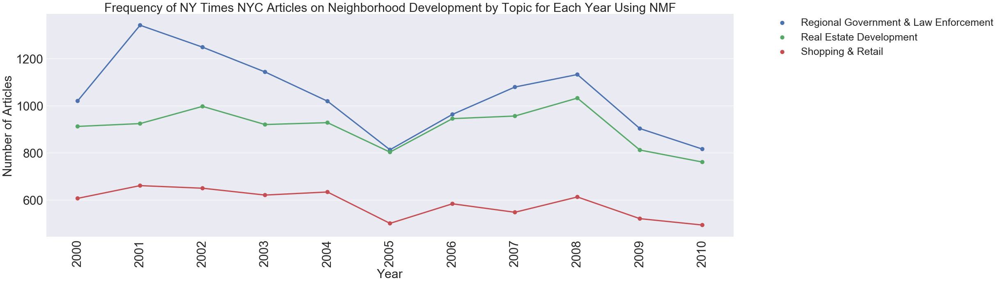

In [92]:
rc={'xtick.labelsize': 30, 'ytick.labelsize': 30, 'axes.labelsize': 30, 'font.size': 30, 'legend.fontsize': 25.0, 'axes.titlesize': 30, "figure.figsize": [30, 10]}
sns.set(rc=rc)
one_topic_NMF = final_df_NMF[final_df_NMF["NMF Overall Topic"] == "Neighborhood Development"]
g = sns.pointplot(ci = None, x = one_topic_NMF["Year"], y = one_topic_NMF["value"], order = order, hue = one_topic_NMF["NMF Topic Name"])
plt.xticks(rotation=90)
g.set(xlabel = "Year", ylabel = "Number of Articles", title = "Frequency of NY Times NYC Articles on Neighborhood Development by Topic for Each Year Using NMF")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig("NMF_ND_Freq_COUNTER.png", bbox_inches='tight')

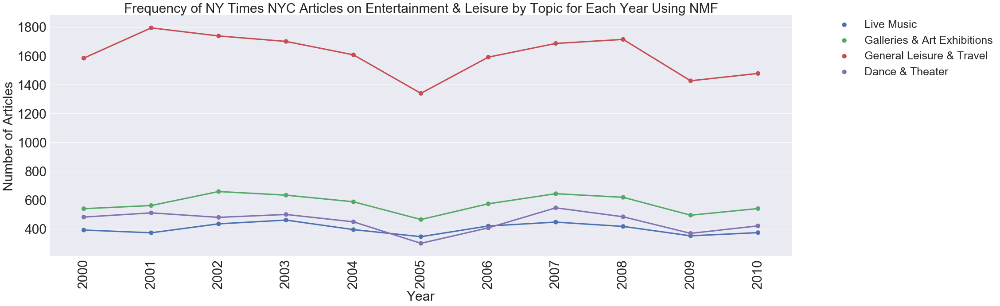

In [93]:
rc={'xtick.labelsize': 30, 'ytick.labelsize': 30, 'axes.labelsize': 30, 'font.size': 30, 'legend.fontsize': 25.0, 'axes.titlesize': 30, "figure.figsize": [30, 10]}
sns.set(rc=rc)
one_topic_NMF = final_df_NMF[final_df_NMF["NMF Overall Topic"] == "Entertainment & Leisure"]
g = sns.pointplot(ci = None, x = one_topic_NMF["Year"], y = one_topic_NMF["value"], order = order, hue = one_topic_NMF["NMF Topic Name"])
plt.xticks(rotation=90)
g.set(xlabel = "Year", ylabel = "Number of Articles", title = "Frequency of NY Times NYC Articles on Entertainment & Leisure by Topic for Each Year Using NMF")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig("NMF_EL_Freq_COUNTER.png", bbox_inches='tight')

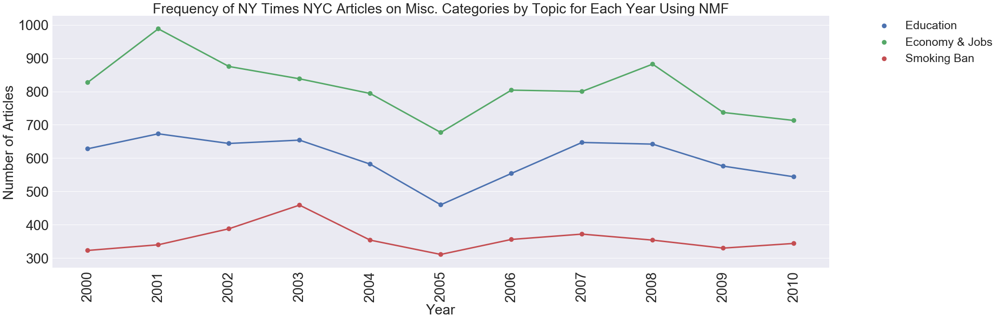

In [94]:
rc={'xtick.labelsize': 30, 'ytick.labelsize': 30, 'axes.labelsize': 30, 'font.size': 30, 'legend.fontsize': 25.0, 'axes.titlesize': 30, "figure.figsize": [30, 10]}
sns.set(rc=rc)
one_topic_NMF = final_df_NMF[final_df_NMF["NMF Overall Topic"] == "Misc."]
g = sns.pointplot(ci = None, x = one_topic_NMF["Year"], y = one_topic_NMF["value"], order = order, hue = one_topic_NMF["NMF Topic Name"])
plt.xticks(rotation=90)
g.set(xlabel = "Year", ylabel = "Number of Articles", title = "Frequency of NY Times NYC Articles on Misc. Categories by Topic for Each Year Using NMF")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig("NMF_Misc_Freq_COUNTER.png", bbox_inches='tight')

## NMF Probability Charts

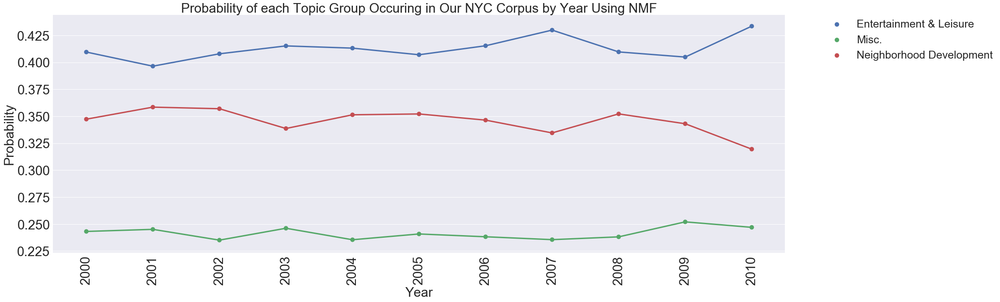

In [95]:
rc={'xtick.labelsize': 30, 'ytick.labelsize': 30, 'axes.labelsize': 30, 'font.size': 30, 'legend.fontsize': 25.0, 'axes.titlesize': 30, "figure.figsize": [30, 10]}
sns.set(rc=rc)
one_topic = pro_df_NMF1
g = sns.pointplot(ci = None, x = one_topic["Year"], y = one_topic["Topic Probability"], order = order, hue = one_topic["NMF Overall Topic"])
plt.xticks(rotation=90)
g.set(xlabel = "Year", ylabel = "Probability", title = "Probability of each Topic Group Occuring in Our NYC Corpus by Year Using NMF")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig("NMF_Overall_Prob_COUNTER.png", bbox_inches = "tight")

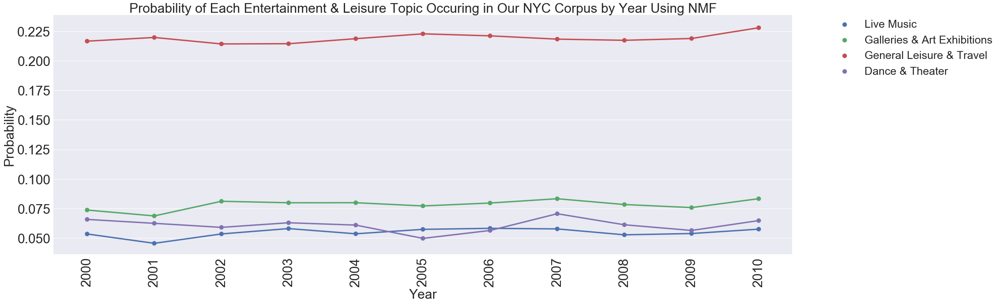

In [96]:
rc={'xtick.labelsize': 30, 'ytick.labelsize': 30, 'axes.labelsize': 30, 'font.size': 30, 'legend.fontsize': 25.0, 'axes.titlesize': 30, "figure.figsize": [30, 10]}
sns.set(rc=rc)
one_topic = pro_df_NMF[pro_df_NMF["NMF Overall Topic"] == "Entertainment & Leisure"]
g = sns.pointplot(ci = None, x = one_topic["Year"], y = one_topic["Topic Probability"], order = order, hue = one_topic["NMF Topic Name"])
plt.xticks(rotation=90)
g.set(xlabel = "Year", ylabel = "Probability", title = "Probability of Each Entertainment & Leisure Topic Occuring in Our NYC Corpus by Year Using NMF")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig("NMF_EL_ProbCOUNTER.png", bbox_inches='tight')

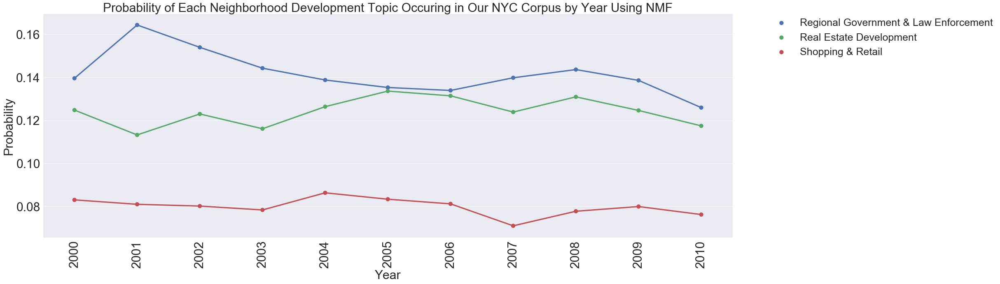

In [97]:
rc={'xtick.labelsize': 30, 'ytick.labelsize': 30, 'axes.labelsize': 30, 'font.size': 30, 'legend.fontsize': 25.0, 'axes.titlesize': 30, "figure.figsize": [30, 10]}
sns.set(rc=rc)
one_topic = pro_df_NMF[pro_df_NMF["NMF Overall Topic"] == "Neighborhood Development"]
g = sns.pointplot(ci = None, x = one_topic["Year"], y = one_topic["Topic Probability"], order = order, hue = one_topic["NMF Topic Name"])
plt.xticks(rotation=90)
g.set(xlabel = "Year", ylabel = "Probability", title = "Probability of Each Neighborhood Development Topic Occuring in Our NYC Corpus by Year Using NMF")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig("NMF_ND_Prob_COUNTER.png", bbox_inches='tight')

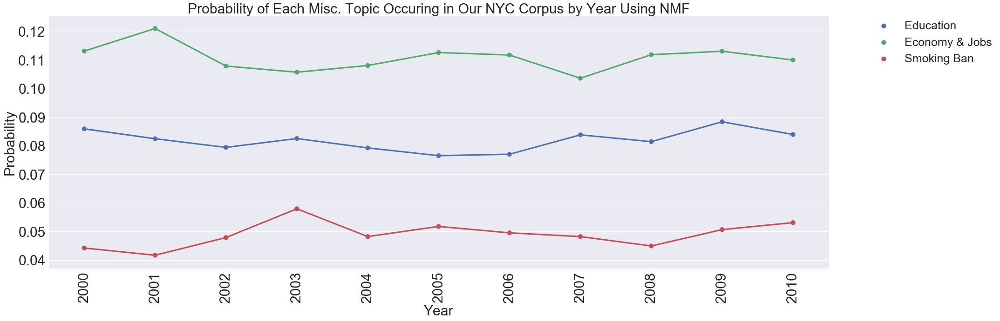

In [98]:
rc={'xtick.labelsize': 30, 'ytick.labelsize': 30, 'axes.labelsize': 30, 'font.size': 30, 'legend.fontsize': 25.0, 'axes.titlesize': 30, "figure.figsize": [30, 10]}
sns.set(rc=rc)
one_topic = pro_df_NMF[pro_df_NMF["NMF Overall Topic"] == "Misc."]
g = sns.pointplot(ci = None, x = one_topic["Year"], y = one_topic["Topic Probability"], order = order, hue = one_topic["NMF Topic Name"])
plt.xticks(rotation=90)
g.set(xlabel = "Year", ylabel = "Probability", title = "Probability of Each Misc. Topic Occuring in Our NYC Corpus by Year Using NMF")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig("NMF_MISC_Prob_COUNTER.png", bbox_inches='tight')

## Generate Visualization for LDA

In [73]:
def incl_thresh(x): 
    if x >= 0.1:
        return 1
    else:
        return 0

In [74]:
#NMF Topic Names
LDA_Topic_Names = {0: "Dance & Theater",
               1: "Business of Retail",
               2: "Music Consumption",
               3: "Work & Family",
               4: "Real Estate Development",
               5: "General Leisure & Travel",
               6: "Regional Government & Law Enforcement",
               7: "Galleries & Art Exhibitions", 
               8: "Economy", 
                  9: "Education"}

In [75]:
transformed_data_lda = lda.transform(tf)

In [76]:
transformed_data_LDA = pd.DataFrame(transformed_data_lda)
article_topics_LDA = transformed_data_LDA.applymap(incl_thresh)
raw_data_LDA = raw_no_duplicates.reset_index()
article_topics_LDA["Date"] = raw_data_LDA["Date_by_Month"]
article_topics_LDA["Year"] = raw_data_LDA["Year"]
article_topics_LDA["Article_Num"] = range(1, len(article_topics_LDA) + 1)
melted_df_LDA = pd.melt(article_topics_LDA, id_vars = ["Article_Num", "Date", "Year"], var_name = "Topic_Num")

In [77]:
topic_num_to_name_LDA = pd.DataFrame.from_dict(LDA_Topic_Names, orient = "index").reset_index()
topic_num_to_name_LDA.columns = ["Topic_Num", "LDA_Topic_Name"]
final_df_LDA = melted_df_LDA.merge(topic_num_to_name_LDA, on = "Topic_Num")

In [100]:
#OVERALL LDA TOPICS
overall_LDA_topic = pd.DataFrame({"Entertainment & Leisure": [0,2,5,7],
                     "Neighborhood Development": [4,6, "Nan", "Nan"],
                     "Misc.": [1,3,8,9]})
melted_ot_LDA = pd.melt(overall_LDA_topic)
melted_ot_LDA = melted_ot_LDA[melted_ot_LDA["value"] != "NaN"]
melted_ot_LDA.columns = ["LDA Overall Topic", "Topic_Num"]

In [101]:
final_df_LDA = final_df_LDA.merge(melted_ot_LDA, on = "Topic_Num")

In [102]:
final_df_LDA = final_df_LDA.groupby(["Year", "Topic_Num", "LDA_Topic_Name", "LDA Overall Topic"]).sum().reset_index()
final_df_LDA = final_df_LDA.rename(index=str, columns={"LDA_Topic_Name": "Topic Name"})

In [103]:
final_sum_LDA = final_df_LDA.groupby(["Year"])["value"].sum().reset_index()

In [104]:
pro_df_LDA=pd.merge(left=final_df_LDA, right=final_sum_LDA, left_on='Year',right_on='Year',how='left')

In [105]:
pro_df_LDA.loc[:,"Topic Probability"]=pro_df_LDA.value_x /pro_df_LDA.value_y
pro_df_LDA = pro_df_LDA.rename(index=str, columns={"value_x": "Topic Sum", "value_y": "Year Sum"})
pro_df_LDA

,Year,Topic_Num,Topic Name,LDA Overall Topic,Article_Num,Topic Sum,Year Sum,Topic Probability
0,2000,0,Dance & Theater,Entertainment & Leisure,32859175,224,4666,0.048007
1,2000,1,Business of Retail,Misc.,32859175,489,4666,0.104801
2,2000,2,Music Consumption,Entertainment & Leisure,32859175,320,4666,0.068581
3,2000,3,Work & Family,Misc.,32859175,882,4666,0.189027
4,2000,4,Real Estate Development,Neighborhood Development,32859175,550,4666,0.117874
5,2000,5,General Leisure & Travel,Entertainment & Leisure,32859175,586,4666,0.125589
6,2000,6,Regional Government & Law Enforcement,Neighborhood Development,32859175,576,4666,0.123446
7,2000,7,Galleries & Art Exhibitions,Entertainment & Leisure,32859175,202,4666,0.043292
8,2000,8,Economy,Misc.,32859175,416,4666,0.089156
9,2000,9,Education,Misc.,32859175,421,4666,0.090227


## Frequency Charts for LDA

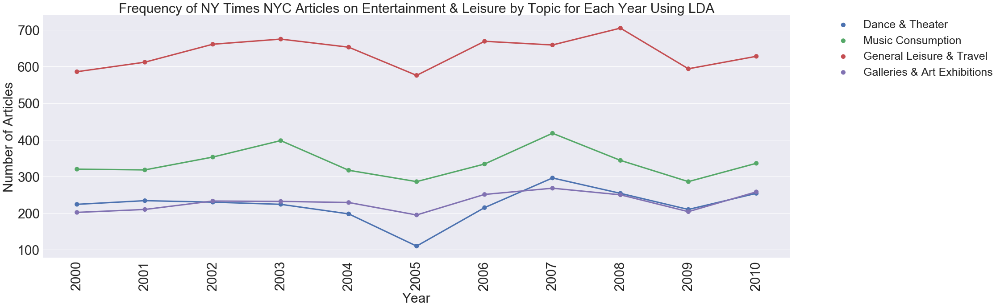

In [107]:
rc={'xtick.labelsize': 30, 'ytick.labelsize': 30, 'axes.labelsize': 30, 'font.size': 30, 'legend.fontsize': 25.0, 'axes.titlesize': 30, "figure.figsize": [30, 10]}
sns.set(rc=rc)
one_topic = final_df_LDA[final_df_LDA["LDA Overall Topic"] == "Entertainment & Leisure"]
g = sns.pointplot(ci = None, x = one_topic["Year"], y = one_topic["value"], order = order, hue = one_topic["Topic Name"])
plt.xticks(rotation=90)
g.set(xlabel = "Year", ylabel = "Number of Articles", title = "Frequency of NY Times NYC Articles on Entertainment & Leisure by Topic for Each Year Using LDA")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig("LDA_EL_Freq_COUNTER.png", bbox_inches='tight')

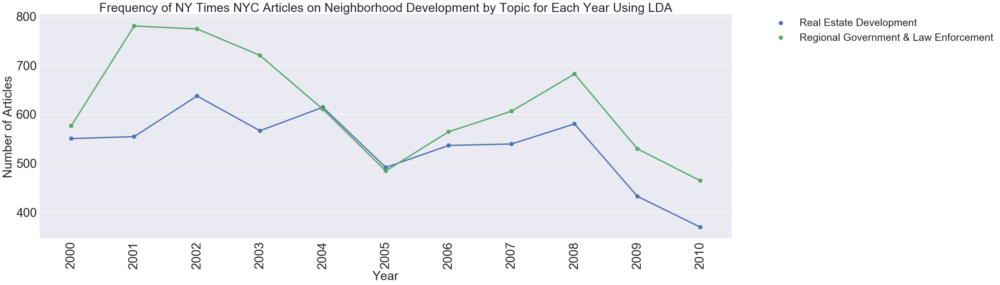

In [108]:
rc={'xtick.labelsize': 30, 'ytick.labelsize': 30, 'axes.labelsize': 30, 'font.size': 30, 'legend.fontsize': 25.0, 'axes.titlesize': 30, "figure.figsize": [30, 10]}
sns.set(rc=rc)
one_topic = final_df_LDA[final_df_LDA["LDA Overall Topic"] == "Neighborhood Development"]
g = sns.pointplot(ci = None, x = one_topic["Year"], y = one_topic["value"], order = order, hue = one_topic["Topic Name"])
plt.xticks(rotation=90)
g.set(xlabel = "Year", ylabel = "Number of Articles", title = "Frequency of NY Times NYC Articles on Neighborhood Development by Topic for Each Year Using LDA")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig("LDA_ND_Freq_COUNTER.png", bbox_inches='tight')

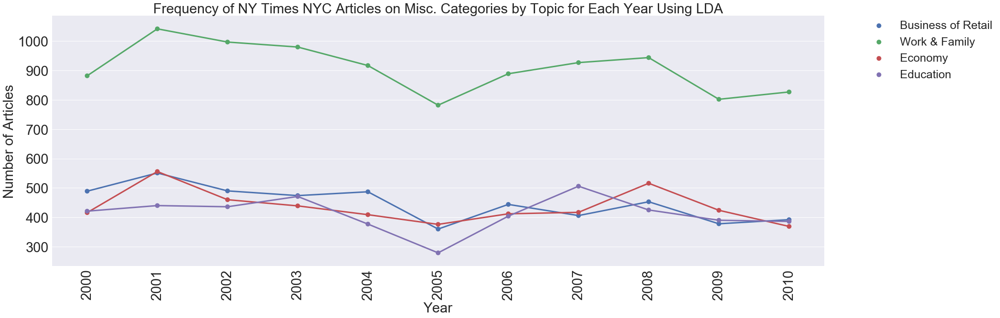

In [109]:
rc={'xtick.labelsize': 30, 'ytick.labelsize': 30, 'axes.labelsize': 30, 'font.size': 30, 'legend.fontsize': 25.0, 'axes.titlesize': 30, "figure.figsize": [30, 10]}
sns.set(rc=rc)
one_topic = final_df_LDA[final_df_LDA["LDA Overall Topic"] == "Misc."]
g = sns.pointplot(ci = None, x = one_topic["Year"], y = one_topic["value"], order = order, hue = one_topic["Topic Name"])
plt.xticks(rotation=90)
g.set(xlabel = "Year", ylabel = "Number of Articles", title = "Frequency of NY Times NYC Articles on Misc. Categories by Topic for Each Year Using LDA")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig("LDA_MISC_Freq_COUNTER.png", bbox_inches='tight')

## Probability Charts LDA

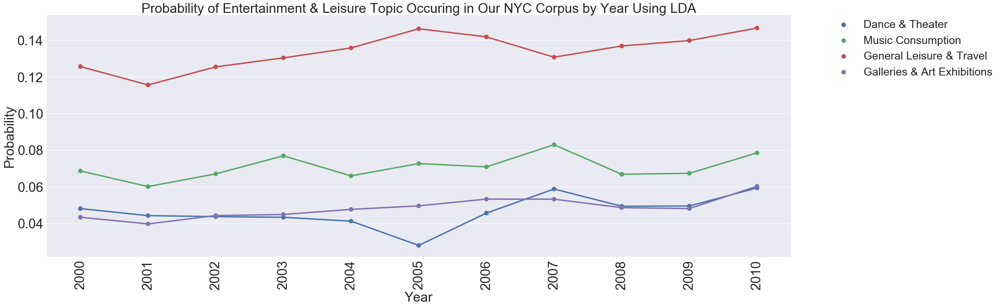

In [110]:
rc={'xtick.labelsize': 30, 'ytick.labelsize': 30, 'axes.labelsize': 30, 'font.size': 30, 'legend.fontsize': 25.0, 'axes.titlesize': 30, "figure.figsize": [30, 10]}
sns.set(rc=rc)
one_topic = pro_df_LDA[pro_df_LDA["LDA Overall Topic"] == "Entertainment & Leisure"]
g = sns.pointplot(ci = None, x = one_topic["Year"], y = one_topic["Topic Probability"], order = order, hue = one_topic["Topic Name"])
plt.xticks(rotation=90)
g.set(xlabel = "Year", ylabel = "Probability", title = "Probability of Entertainment & Leisure Topic Occuring in Our NYC Corpus by Year Using LDA")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig("LDA_EL_Prob_COUNTER.png", bbox_inches='tight')

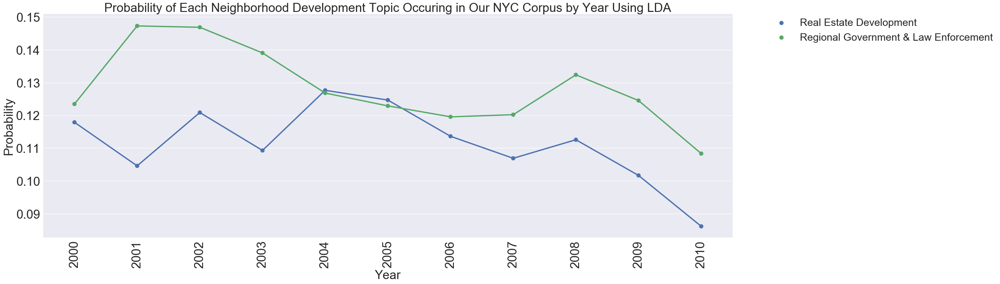

In [111]:
rc={'xtick.labelsize': 30, 'ytick.labelsize': 30, 'axes.labelsize': 30, 'font.size': 30, 'legend.fontsize': 25.0, 'axes.titlesize': 30, "figure.figsize": [30, 10]}
sns.set(rc=rc)
one_topic = pro_df_LDA[pro_df_LDA["LDA Overall Topic"] == "Neighborhood Development"]
g = sns.pointplot(ci = None, x = one_topic["Year"], y = one_topic["Topic Probability"], order = order, hue = one_topic["Topic Name"])
plt.xticks(rotation=90)
g.set(xlabel = "Year", ylabel = "Probability", title = "Probability of Each Neighborhood Development Topic Occuring in Our NYC Corpus by Year Using LDA")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig("LDA_ND_Prob_COUNTER.png", bbox_inches='tight')

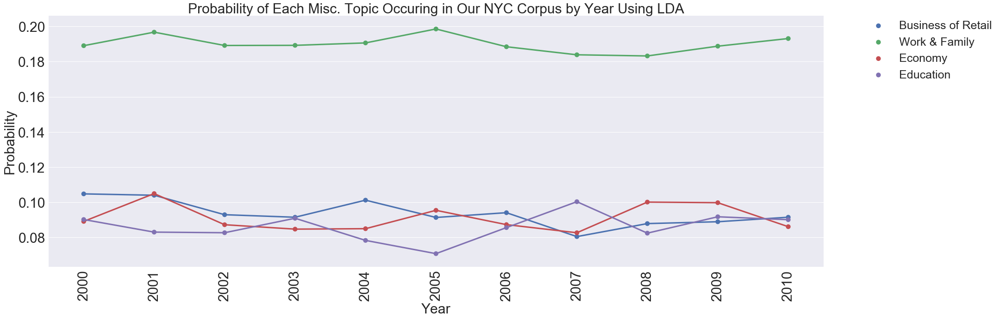

In [112]:
rc={'xtick.labelsize': 30, 'ytick.labelsize': 30, 'axes.labelsize': 30, 'font.size': 30, 'legend.fontsize': 25.0, 'axes.titlesize': 30, "figure.figsize": [30, 10]}
sns.set(rc=rc)
one_topic = pro_df_LDA[pro_df_LDA["LDA Overall Topic"] == "Misc."]
g = sns.pointplot(ci = None, x = one_topic["Year"], y = one_topic["Topic Probability"], order = order, hue = one_topic["Topic Name"])
plt.xticks(rotation=90)
g.set(xlabel = "Year", ylabel = "Probability", title = "Probability of Each Misc. Topic Occuring in Our NYC Corpus by Year Using LDA")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig("LDA_MISC_Prob_COUNTER.png", bbox_inches='tight')

In [113]:
pro_df_LDA1 = pro_df_LDA.groupby(["Year", "LDA Overall Topic"]).sum().reset_index()
pro_df_LDA1 = pro_df_LDA1.drop(["Topic Sum", "Year Sum"], axis = 1)

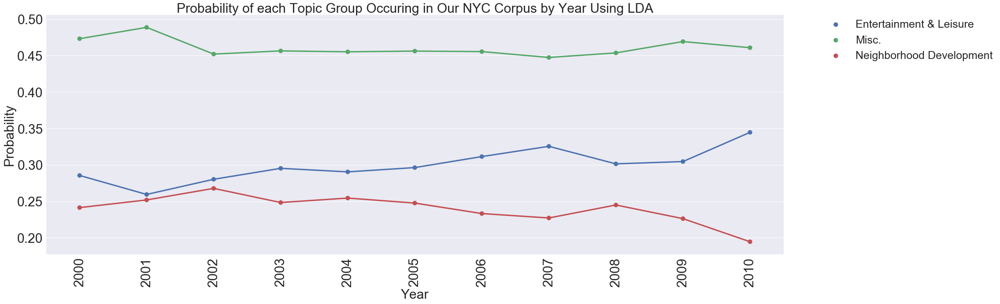

In [114]:
rc={'xtick.labelsize': 30, 'ytick.labelsize': 30, 'axes.labelsize': 30, 'font.size': 30, 'legend.fontsize': 25.0, 'axes.titlesize': 30, "figure.figsize": [30, 10]}
sns.set(rc=rc)
one_topic = pro_df_LDA1
g = sns.pointplot(ci = None, x = one_topic["Year"], y = one_topic["Topic Probability"], order = order, hue = one_topic["LDA Overall Topic"])
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
g.set(xlabel = "Year", ylabel = "Probability", title = "Probability of each Topic Group Occuring in Our NYC Corpus by Year Using LDA")
plt.savefig("LDA_Overall_Prob_COUNTER.png", bbox_inches='tight')